# Import

In [19]:
# datasize ~ 17M
import input_data as data
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# TSNE a tool to visualize high-dimensional data
# It converts similarities between data points to joint probabilities
# tries to minimize KL divergence between joint probabilities of low-dimensional embedding and high-dimensional data
from sklearn.manifold import TSNE

# High-performance container datatypes 
import collections

# Parameters

In [2]:
display_step = 1000  

# ============================
# Set Parameters for Training
# =============================
learning_rate = 0.05

# Number of epochs for training
training_epochs = 3 
                                        
batch_size = 32

# of times to reuse target to generate a label                                            
num_skips = 4

# of batches per epoch
batches_per_epoch = int(data.data_size*num_skips/batch_size)

# Size of embedding vectors                                             
embedding_size = 128 

#window size                                 
skip_window = 4

# negative samples to use for NCE  
negative_sampled_size = 32 

#frequency to perform validation
validation_step = 1000                                            

print('Epochs:', training_epochs)
print('Batches per epoch:', batches_per_epoch)
print('Batch size:', batch_size)

# Nearest neighbors validation parameters
validation_size = 20
validation_dist_span = 500
# Randomly choose words in the validation set as examples
validation_examples = np.random.choice(validation_dist_span, validation_size, replace=False)
#
plot_num = 500

just_for_plot = 500
#
top_match = 8


Epochs: 3
Batches per epoch: 2125650
Batch size: 32


In [3]:
def build_dataset(data):
    #Return a list of the n most common elements and their counts from the most common to the least. 
    #If n is omitted or None, most_common() returns all elements in the counter.
    count = collections.Counter(data).most_common()
    print(count)
    dictionary = dict()
    for word, _ in count:
        #key of the dictionary is the word and take the index of frequencies as the corresponding value
        dictionary[word] = len(dictionary)
    reverse_dictionary = dict(zip(dictionary.values(), dictionary.keys()))
    return dictionary, reverse_dictionary

# Layer for Embedding

In [4]:
def embedding_layer(x, embedding_shape):
    
    with tf.variable_scope("embedding"):
        
        embedding_init   = tf.random_uniform(embedding_shape, -1.0, 1.0)
        embedding_matrix = tf.get_variable("E_M", initializer=embedding_init)
        
        # tf.nn.embedding_lookup is used to perform 
        # parallel lookups on the list of tensors in embedding_matrix
        return tf.nn.embedding_lookup(embedding_matrix, x), embedding_matrix

# Loss Function

In [5]:
def noise_contrastive_loss(embedding_lookup, weight_shape, bias_shape, y_idx):
    
    # A common use case is to use this method for training, and calculate the full sigmoid loss for evaluation or inference. 
    with tf.variable_scope("NCE"):
        
        # He et al
        nce_weight_init = tf.truncated_normal(weight_shape, stddev=1.0/(weight_shape[1])**0.5)
        nce_bias_init = tf.zeros(bias_shape)
        
        nce_weights = tf.get_variable("W", initializer=nce_weight_init)
        nce_biases  = tf.get_variable("b", initializer=nce_bias_init)

        # tt.nn.nce_loss computes and returns the noise-contrastive estimation training loss.
        loss = tf.reduce_mean(tf.nn.nce_loss(weights=nce_weights,
                     biases = nce_biases,
                     labels = y_idx,
                     inputs = embedding_lookup,
                     num_sampled = negative_sampled_size,
                     num_classes = data.vocabulary_size))

        return loss

# Define optimizer and the target to optimize

In [6]:
def training(cost, global_step):
    
    with tf.variable_scope("training"):
        
        summary_op = tf.summary.scalar("cost", cost)
        
        optimizer = tf.train.GradientDescentOptimizer(learning_rate)
        
        train_op = optimizer.minimize(cost, global_step=global_step)
        
        return train_op, summary_op

# Calculate Similarity 

In [7]:
def validation(embedding_matrix, x_val):
    
    norm = tf.reduce_sum(embedding_matrix**2, 1, keep_dims=True)**0.5
    
    normalized = embedding_matrix/norm
    
    # tf.nn.embedding_lookup is used to perform 
    # parallel lookups on the list of tensors in normalized
    # normalized: A single tensor representing the complete embedding tensor
    # x_val: A Tensor with type int32 or int64 containing the ids to be looked up in params
    validation_embeddings = tf.nn.embedding_lookup(normalized, x_val)
    # The similarity of model output and real values
    similarity = tf.matmul(validation_embeddings, normalized, transpose_b=True)
    
    return normalized, similarity

# Main Function

In [8]:
if __name__ == '__main__':
    
    model_path = 'C:/Users/Ali/logs/skipGram/'

    with tf.Graph().as_default():

        with tf.variable_scope("Skip_Gram_Model"):

            x = tf.placeholder(tf.int32, shape=[batch_size])
            y = tf.placeholder(tf.int32, [batch_size, 1])
            # validation_examples are randomly chosen at the beginning of the code and will remain constant in the main function
            val = tf.constant(validation_examples, dtype=tf.int32)
            
            global_step = tf.Variable(0, name='global_step', trainable=False)

            e_lookup, e_matrix = embedding_layer(x, [data.vocabulary_size, embedding_size])
            
            tf.cast(e_lookup, tf.int32)
            
            #noise_contrastive_loss
            cost = noise_contrastive_loss(e_lookup, [data.vocabulary_size, embedding_size], [data.vocabulary_size], y)
            
            train_op, summary_op = training(cost, global_step)
            #validate the output of the model by using real words' vector representations.
            validation_op = validation(e_matrix, val)
            
            sess = tf.Session()

            train_writer = tf.summary.FileWriter(model_path, graph=sess.graph)

            init_op = tf.global_variables_initializer()
        
            sess.run(init_op)

            step = 0
            avg_cost = 0
            

            for epoch in range(training_epochs):
                
                print('epoch:', epoch, 'batches_per_epoch:', batches_per_epoch)
                
                for minibatch in range(batches_per_epoch):

                    step +=1

                    minibatch_x, minibatch_y = data.generate_batch(batch_size, num_skips, skip_window)
                    feed_dict = {x : minibatch_x, y : minibatch_y}

                    _, new_cost, train_summary = sess.run([train_op, cost, summary_op], feed_dict=feed_dict)
                    train_writer.add_summary(train_summary, sess.run(global_step))
                    # Compute average loss
                    avg_cost += new_cost/display_step

                    if step % display_step == 0:
                        print("Elapsed:", str(step), " batches. Cost =", "{:.9f}".format(avg_cost))
                        avg_cost = 0

                    if step % validation_step == 0:
                        
                        _, similarity = sess.run(validation_op)
                        #print the top_match of validation words to see whether they fit our intuition
                        for i in range(validation_size):
                            
                            validation_word = data.reverse_dictionary[validation_examples[i]]
                            
                            neighbors = (-similarity[i, :]).argsort()[1:top_match+1]
                            
                            print_str = "Nearest neighbor of %s:" % validation_word
                            
                            for k in range(top_match):
                                print_str += " %s," % data.reverse_dictionary[neighbors[k]]
                                
                            print(print_str[:-1])

            f_embeddings, _ = sess.run(validation_op)

    # userguide: http://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
    tsne = TSNE(perplexity=30, n_components=2, early_exaggeration=12.0, learning_rate=200.0, n_iter=2000, n_iter_without_progress=300, init='pca')

    plot_embeddings = np.asfarray(f_embeddings[:plot_num,:], dtype='float')
    
    low_dim_embeddings = tsne.fit_transform(plot_embeddings)
    
    labels = [data.reverse_dictionary[i] for i in range(just_for_plot)]
    
    data.plot_with_labels(low_dim_embeddings, labels)

epoch: 0 batches_per_epoch: 2125650
Elapsed: 1000  batches. Cost = 100.623997387
Nearest neighbor of james: decisions, bias, estonia, macro, embraced, experimental, flash, operator
Nearest neighbor of december: dennis, weight, serve, discovery, mill, presidential, ancient, cbs
Nearest neighbor of story: transparent, liver, logarithm, confirmed, defend, coherent, accept, website
Nearest neighbor of named: historian, react, herodotus, different, generals, armies, aesthetics, unfortunately
Nearest neighbor of own: arrows, dune, practical, columbus, south, mistake, leonard, distinguished
Nearest neighbor of c: tibetan, establishing, consortium, wrestling, amplitude, regular, op, name
Nearest neighbor of up: mail, circulation, marshall, eighteenth, athenian, jos, rs, freezing
Nearest neighbor of g: commodore, aboard, currency, distributed, sensitivity, instruction, marked, evil
Nearest neighbor of r: including, gregory, unfortunately, textiles, termed, temporary, deeply, messiah
Nearest nei

Elapsed: 6000  batches. Cost = 42.235424679
Nearest neighbor of james: decisions, bias, macro, estonia, embraced, published, gift, don
Nearest neighbor of december: dennis, weight, serve, discovery, cbs, presidential, privy, mill
Nearest neighbor of story: transparent, logarithm, defend, accept, liver, coherent, confirmed, tragedy
Nearest neighbor of named: different, aesthetics, herodotus, react, historian, high, armies, brandenburg
Nearest neighbor of own: seven, south, arrows, above, dune, aromatic, leonard, corresponding
Nearest neighbor of c: tibetan, have, name, consortium, has, lincoln, establishing, site
Nearest neighbor of up: and, UNK, an, rs, fact, coral, mail, achilles
Nearest neighbor of g: commodore, aboard, currency, sensitivity, those, and, evil, strictly
Nearest neighbor of r: including, gregory, unfortunately, temporary, deeply, termed, textiles, elvis
Nearest neighbor of some: as, UNK, zero, the, and, eight, that, in
Nearest neighbor of al: saddam, label, ivory, part

Elapsed: 11000  batches. Cost = 28.863847057
Nearest neighbor of james: decisions, anchorage, bias, macro, published, embraced, estonia, new
Nearest neighbor of december: dennis, weight, serve, discovery, presidential, ancient, privy, cbs
Nearest neighbor of story: accept, transparent, defend, logarithm, coherent, years, gore, nation
Nearest neighbor of named: different, can, high, at, natural, one, d, no
Nearest neighbor of own: seven, south, four, six, above, five, what, it
Nearest neighbor of c: have, has, that, one, gore, of, in, nine
Nearest neighbor of up: and, an, as, of, two, to, one, in
Nearest neighbor of g: and, those, this, were, of, other, groups, up
Nearest neighbor of r: including, temporary, gregory, unfortunately, deeply, termed, elvis, inspiration
Nearest neighbor of some: as, zero, eight, and, that, was, or, at
Nearest neighbor of al: are, eight, to, five, for, state, a, zero
Nearest neighbor of words: national, can, has, is, such, used, main, links
Nearest neighbor 

Elapsed: 17000  batches. Cost = 22.447465785
Nearest neighbor of james: decisions, anchorage, published, new, north, zero, our, five
Nearest neighbor of december: dennis, serve, ancient, discovery, presidential, group, eight, weight
Nearest neighbor of story: accept, years, gore, defend, nation, world, transparent, were
Nearest neighbor of named: different, can, at, high, m, one, first, natural
Nearest neighbor of own: seven, south, four, six, five, it, what, has
Nearest neighbor of c: have, has, that, name, one, gore, nine, three
Nearest neighbor of up: an, and, two, as, one, at, have, it
Nearest neighbor of g: and, this, those, were, other, largest, several, up
Nearest neighbor of r: including, such, from, been, federal, public, temporary, would
Nearest neighbor of some: as, zero, eight, was, at, that, or, they
Nearest neighbor of al: are, eight, state, five, for, seven, four, zero
Nearest neighbor of words: national, can, has, is, main, such, used, links
Nearest neighbor of developm

Elapsed: 23000  batches. Cost = 17.871850851
Nearest neighbor of james: zero, five, new, anchorage, two, four, north, part
Nearest neighbor of december: dennis, eight, used, ancient, group, between, angola, discovery
Nearest neighbor of story: years, gore, five, were, world, history, them, seven
Nearest neighbor of named: different, can, at, high, m, first, them, no
Nearest neighbor of own: seven, south, four, six, five, war, it, has
Nearest neighbor of c: have, has, name, that, gore, see, known, three
Nearest neighbor of up: an, two, as, at, have, it, world, into
Nearest neighbor of g: this, were, and, those, other, up, several, nine
Nearest neighbor of r: including, such, from, been, would, zero, time, its
Nearest neighbor of some: as, eight, zero, at, they, time, war, or
Nearest neighbor of al: are, eight, state, five, seven, four, agave, but
Nearest neighbor of words: national, can, has, is, such, main, used, links
Nearest neighbor of development: other, have, nine, with, one, a, h

Elapsed: 29000  batches. Cost = 15.611089601
Nearest neighbor of james: five, new, zero, four, anchorage, north, two, part
Nearest neighbor of december: eight, ancient, used, group, dennis, between, on, angola
Nearest neighbor of story: years, five, gore, world, were, history, them, seven
Nearest neighbor of named: different, can, high, at, m, first, them, no
Nearest neighbor of own: seven, south, four, six, war, five, what, line
Nearest neighbor of c: have, has, name, gore, known, see, three, lincoln
Nearest neighbor of up: an, at, world, into, new, have, two, like
Nearest neighbor of g: this, those, were, other, up, several, known, all
Nearest neighbor of r: including, such, from, been, would, public, time, its
Nearest neighbor of some: eight, as, war, they, time, at, zero, or
Nearest neighbor of al: are, eight, state, five, agave, seven, four, but
Nearest neighbor of words: national, can, has, main, such, links, used, is
Nearest neighbor of development: other, have, nine, with, when

Elapsed: 35000  batches. Cost = 13.049672423
Nearest neighbor of james: new, five, anchorage, zero, north, four, part, published
Nearest neighbor of december: eight, used, ancient, group, between, on, angola, would
Nearest neighbor of story: gore, years, five, world, were, history, them, seven
Nearest neighbor of named: different, can, high, at, m, d, first, them
Nearest neighbor of own: seven, south, war, line, six, what, still, four
Nearest neighbor of c: have, name, has, gore, known, see, lincoln, after
Nearest neighbor of up: into, an, like, new, world, south, have, agave
Nearest neighbor of g: those, were, this, up, other, several, known, largest
Nearest neighbor of r: including, such, from, been, would, time, its, had
Nearest neighbor of some: war, they, time, at, eight, century, as, agave
Nearest neighbor of al: are, state, eight, agave, five, even, seven, but
Nearest neighbor of words: national, can, has, main, links, such, used, often
Nearest neighbor of development: other, ha

Elapsed: 41000  batches. Cost = 11.516050709
Nearest neighbor of james: new, five, anchorage, published, north, part, four, during
Nearest neighbor of december: eight, used, ancient, group, between, would, on, part
Nearest neighbor of story: gore, years, world, were, five, them, history, new
Nearest neighbor of named: different, can, high, m, d, natural, them, no
Nearest neighbor of own: south, seven, line, still, war, what, above, six
Nearest neighbor of c: name, have, has, gore, known, see, lincoln, atheism
Nearest neighbor of up: like, into, agave, new, south, where, world, have
Nearest neighbor of g: those, were, up, several, this, known, other, largest
Nearest neighbor of r: including, such, from, been, would, time, public, had
Nearest neighbor of some: war, time, they, century, agave, eight, at, countries
Nearest neighbor of al: state, agave, are, eight, even, five, several, but
Nearest neighbor of words: national, can, has, main, links, such, used, often
Nearest neighbor of deve

Elapsed: 46000  batches. Cost = 9.971569320
Nearest neighbor of james: new, published, anchorage, north, five, part, during, had
Nearest neighbor of december: eight, ancient, used, group, between, would, part, angola
Nearest neighbor of story: gore, years, world, them, history, were, five, published
Nearest neighbor of named: different, can, high, m, d, natural, them, alexander
Nearest neighbor of own: south, seven, line, still, war, what, above, america
Nearest neighbor of c: name, have, gore, has, known, lincoln, see, atheism
Nearest neighbor of up: like, agave, south, where, into, world, new, well
Nearest neighbor of g: those, up, were, several, known, largest, system, other
Nearest neighbor of r: including, such, from, been, would, public, time, work
Nearest neighbor of some: war, time, they, century, articles, agave, countries, official
Nearest neighbor of al: state, agave, eight, are, even, several, economy, more
Nearest neighbor of words: national, can, has, main, links, such, u

Elapsed: 51000  batches. Cost = 10.045382033
Nearest neighbor of james: new, published, anchorage, north, part, five, during, had
Nearest neighbor of december: eight, ancient, group, used, between, weight, discovery, would
Nearest neighbor of story: gore, years, world, them, history, were, published, five
Nearest neighbor of named: different, high, can, m, d, natural, alexander, them
Nearest neighbor of own: south, seven, line, still, above, war, what, america
Nearest neighbor of c: name, gore, have, has, known, lincoln, see, atheism
Nearest neighbor of up: like, agave, south, world, where, into, new, well
Nearest neighbor of g: those, up, several, largest, known, were, system, final
Nearest neighbor of r: including, such, from, been, would, public, time, work
Nearest neighbor of some: war, time, century, articles, they, countries, official, agave
Nearest neighbor of al: state, agave, even, several, eight, are, economy, example
Nearest neighbor of words: national, can, has, main, links

Elapsed: 56000  batches. Cost = 8.485357920
Nearest neighbor of james: new, published, anchorage, north, part, during, five, agave
Nearest neighbor of december: eight, ancient, group, used, weight, between, discovery, musician
Nearest neighbor of story: gore, years, world, them, history, published, were, further
Nearest neighbor of named: different, high, can, m, natural, alexander, d, asteroids
Nearest neighbor of own: south, seven, above, line, still, what, war, america
Nearest neighbor of c: name, gore, have, known, has, lincoln, began, atheism
Nearest neighbor of up: like, agave, south, where, world, into, fact, well
Nearest neighbor of g: those, up, largest, several, known, system, final, america
Nearest neighbor of r: including, such, been, from, would, public, work, time
Nearest neighbor of some: war, time, articles, century, countries, official, they, agave
Nearest neighbor of al: state, agave, even, several, economy, are, programming, example
Nearest neighbor of words: nationa

Elapsed: 61000  batches. Cost = 7.754041910
Nearest neighbor of james: published, new, anchorage, north, part, during, agave, our
Nearest neighbor of december: eight, ancient, group, used, weight, between, discovery, musician
Nearest neighbor of story: gore, years, world, them, history, published, nation, further
Nearest neighbor of named: different, high, can, m, natural, asteroids, theory, d
Nearest neighbor of own: south, seven, above, line, still, what, war, america
Nearest neighbor of c: name, gore, known, have, has, lincoln, began, atheism
Nearest neighbor of up: like, agave, south, where, world, fact, into, well
Nearest neighbor of g: those, up, largest, several, known, final, groups, system
Nearest neighbor of r: including, such, would, been, from, public, work, time
Nearest neighbor of some: war, articles, time, century, official, countries, they, agave
Nearest neighbor of al: state, agave, even, several, economy, blood, programming, are
Nearest neighbor of words: national, ca

Elapsed: 66000  batches. Cost = 7.660925408
Nearest neighbor of james: published, anchorage, new, north, part, during, agave, our
Nearest neighbor of december: eight, ancient, group, used, weight, between, discovery, musician
Nearest neighbor of story: gore, years, world, history, them, published, accept, nation
Nearest neighbor of named: different, high, can, m, natural, asteroids, theory, d
Nearest neighbor of own: south, above, line, still, seven, what, war, america
Nearest neighbor of c: name, gore, known, lincoln, began, atheism, have, has
Nearest neighbor of up: like, agave, south, where, world, fact, well, gore
Nearest neighbor of g: those, largest, up, several, known, final, groups, america
Nearest neighbor of r: including, such, would, been, from, public, work, often
Nearest neighbor of some: articles, war, time, official, century, countries, agave, they
Nearest neighbor of al: state, agave, even, several, economy, blood, programming, example
Nearest neighbor of words: nationa

Elapsed: 71000  batches. Cost = 7.483692296
Nearest neighbor of james: published, anchorage, new, part, north, agave, our, during
Nearest neighbor of december: eight, ancient, group, used, weight, between, discovery, musician
Nearest neighbor of story: gore, years, world, published, history, accept, them, nation
Nearest neighbor of named: different, high, m, can, natural, asteroids, theory, divided
Nearest neighbor of own: south, above, line, still, what, seven, america, war
Nearest neighbor of c: name, gore, lincoln, known, began, atheism, site, same
Nearest neighbor of up: like, agave, south, fact, where, world, novel, gore
Nearest neighbor of g: those, largest, up, several, final, mostly, groups, known
Nearest neighbor of r: including, such, would, from, been, public, work, union
Nearest neighbor of some: articles, war, time, official, countries, century, UNK, agave
Nearest neighbor of al: agave, state, even, economy, blood, several, programming, web
Nearest neighbor of words: natio

Elapsed: 76000  batches. Cost = 7.398984606
Nearest neighbor of james: published, anchorage, part, north, new, agave, decisions, our
Nearest neighbor of december: eight, ancient, group, used, weight, discovery, between, musician
Nearest neighbor of story: gore, years, world, accept, published, history, them, nation
Nearest neighbor of named: different, high, m, natural, can, asteroids, theory, divided
Nearest neighbor of own: south, above, line, still, what, america, seven, agave
Nearest neighbor of c: gore, name, lincoln, began, known, atheism, site, same
Nearest neighbor of up: like, agave, fact, south, where, novel, world, gore
Nearest neighbor of g: those, largest, final, mostly, several, up, groups, america
Nearest neighbor of r: including, such, would, from, public, been, work, z
Nearest neighbor of some: articles, war, official, time, countries, century, UNK, physicist
Nearest neighbor of al: agave, state, blood, economy, even, programming, several, web
Nearest neighbor of words

Elapsed: 81000  batches. Cost = 7.224850655
Nearest neighbor of james: published, anchorage, part, north, decisions, new, agave, our
Nearest neighbor of december: eight, ancient, group, weight, used, discovery, musician, between
Nearest neighbor of story: gore, years, accept, world, published, nation, website, history
Nearest neighbor of named: different, high, natural, m, asteroids, can, theory, divided
Nearest neighbor of own: south, above, line, still, what, america, seven, arrows
Nearest neighbor of c: gore, name, lincoln, began, atheism, known, site, agave
Nearest neighbor of up: like, agave, fact, south, novel, where, UNK, gore
Nearest neighbor of g: those, largest, mostly, final, groups, several, up, america
Nearest neighbor of r: including, such, public, from, would, z, work, been
Nearest neighbor of some: articles, UNK, official, countries, war, century, time, physicist
Nearest neighbor of al: agave, state, blood, economy, programming, even, web, several
Nearest neighbor of wo

Elapsed: 86000  batches. Cost = 6.670669431
Nearest neighbor of james: published, anchorage, decisions, north, part, agave, new, our
Nearest neighbor of december: eight, ancient, group, weight, used, discovery, musician, angola
Nearest neighbor of story: gore, years, accept, published, website, world, nation, further
Nearest neighbor of named: different, high, natural, m, asteroids, founded, divided, theory
Nearest neighbor of own: south, above, line, still, what, arrows, america, washington
Nearest neighbor of c: gore, name, lincoln, began, atheism, site, known, agave
Nearest neighbor of up: like, agave, UNK, fact, novel, south, where, gore
Nearest neighbor of g: those, largest, mostly, final, groups, technique, several, america
Nearest neighbor of r: including, such, public, z, from, would, union, field
Nearest neighbor of some: articles, UNK, official, countries, war, physicist, century, time
Nearest neighbor of al: agave, state, blood, economy, programming, web, even, paris
Nearest

Elapsed: 91000  batches. Cost = 6.874611513
Nearest neighbor of james: published, anchorage, decisions, north, part, agave, our, new
Nearest neighbor of december: eight, ancient, group, weight, discovery, musician, used, angola
Nearest neighbor of story: gore, accept, years, published, website, nation, further, world
Nearest neighbor of named: different, high, natural, m, asteroids, founded, divided, theory
Nearest neighbor of own: south, above, line, still, arrows, what, america, washington
Nearest neighbor of c: gore, name, lincoln, began, atheism, site, known, agave
Nearest neighbor of up: UNK, like, agave, fact, novel, south, gore, where
Nearest neighbor of g: those, largest, mostly, final, technique, groups, america, several
Nearest neighbor of r: including, such, z, public, from, union, field, work
Nearest neighbor of some: articles, UNK, official, countries, physicist, war, century, time
Nearest neighbor of al: agave, blood, state, economy, programming, web, paris, prime
Nearest

Elapsed: 96000  batches. Cost = 6.321545965
Nearest neighbor of james: published, anchorage, decisions, north, part, agave, our, new
Nearest neighbor of december: eight, ancient, group, weight, discovery, musician, declared, angola
Nearest neighbor of story: gore, accept, years, website, published, nation, further, world
Nearest neighbor of named: different, high, natural, m, asteroids, founded, divided, matter
Nearest neighbor of own: south, above, line, arrows, still, what, america, washington
Nearest neighbor of c: gore, name, lincoln, began, atheism, site, known, agave
Nearest neighbor of up: UNK, agave, like, fact, novel, south, gore, alfred
Nearest neighbor of g: those, largest, mostly, final, technique, groups, america, seen
Nearest neighbor of r: including, such, z, public, from, field, union, federal
Nearest neighbor of some: UNK, articles, official, physicist, countries, war, century, time
Nearest neighbor of al: agave, blood, state, economy, programming, web, paris, prime
Ne

Elapsed: 101000  batches. Cost = 6.064370541
Nearest neighbor of james: anchorage, published, decisions, north, agave, part, our, zero
Nearest neighbor of december: eight, ancient, weight, group, discovery, musician, declared, angola
Nearest neighbor of story: gore, accept, years, website, published, nation, further, world
Nearest neighbor of named: different, high, natural, m, asteroids, founded, divided, matter
Nearest neighbor of own: south, above, arrows, line, still, what, america, washington
Nearest neighbor of c: gore, name, lincoln, began, atheism, site, known, regular
Nearest neighbor of up: UNK, fact, agave, like, novel, and, alfred, south
Nearest neighbor of g: those, largest, mostly, final, technique, groups, seen, america
Nearest neighbor of r: including, such, z, public, from, sport, union, federal
Nearest neighbor of some: UNK, articles, official, physicist, countries, war, location, century
Nearest neighbor of al: agave, blood, state, economy, programming, web, paris, c

Elapsed: 106000  batches. Cost = 6.265951341
Nearest neighbor of james: anchorage, published, decisions, agave, north, part, our, zero
Nearest neighbor of december: eight, weight, ancient, group, discovery, musician, declared, angola
Nearest neighbor of story: gore, accept, website, years, published, nation, further, defend
Nearest neighbor of named: different, high, natural, asteroids, m, divided, founded, matter
Nearest neighbor of own: south, above, arrows, line, still, washington, what, america
Nearest neighbor of c: gore, name, lincoln, began, atheism, site, regular, agave
Nearest neighbor of up: UNK, fact, novel, agave, like, and, alfred, gore
Nearest neighbor of g: those, largest, mostly, final, technique, groups, marked, seen
Nearest neighbor of r: including, such, z, public, from, sport, federal, union
Nearest neighbor of some: UNK, articles, official, physicist, countries, location, war, as
Nearest neighbor of al: agave, blood, state, economy, programming, web, combination, p

Elapsed: 111000  batches. Cost = 5.803085200
Nearest neighbor of james: decisions, anchorage, published, agave, north, our, part, five
Nearest neighbor of december: eight, weight, ancient, group, discovery, musician, declared, angola
Nearest neighbor of story: gore, accept, website, published, years, nation, further, defend
Nearest neighbor of named: different, high, natural, asteroids, m, founded, divided, matter
Nearest neighbor of own: south, above, arrows, line, still, washington, distinguished, america
Nearest neighbor of c: gore, name, began, lincoln, atheism, site, regular, agave
Nearest neighbor of up: UNK, novel, fact, agave, like, and, alfred, complete
Nearest neighbor of g: those, mostly, largest, final, technique, groups, marked, seen
Nearest neighbor of r: including, such, z, from, public, sport, federal, termed
Nearest neighbor of some: UNK, articles, official, physicist, countries, location, as, war
Nearest neighbor of al: agave, blood, economy, state, programming, web, 

Elapsed: 116000  batches. Cost = 5.895409659
Nearest neighbor of james: decisions, anchorage, published, agave, north, our, part, five
Nearest neighbor of december: eight, weight, ancient, group, discovery, musician, declared, angola
Nearest neighbor of story: gore, accept, website, nation, published, years, defend, further
Nearest neighbor of named: different, natural, high, asteroids, founded, m, divided, historian
Nearest neighbor of own: south, above, arrows, line, distinguished, still, washington, america
Nearest neighbor of c: gore, name, began, lincoln, atheism, site, regular, popular
Nearest neighbor of up: UNK, novel, and, fact, agave, like, alfred, complete
Nearest neighbor of g: mostly, those, largest, technique, final, groups, marked, seen
Nearest neighbor of r: including, such, z, from, sport, public, termed, federal
Nearest neighbor of some: UNK, articles, physicist, official, countries, location, as, war
Nearest neighbor of al: agave, blood, economy, web, programming, co

Elapsed: 121000  batches. Cost = 5.777347091
Nearest neighbor of james: decisions, anchorage, published, agave, north, our, zero, part
Nearest neighbor of december: eight, weight, ancient, group, discovery, musician, declared, dennis
Nearest neighbor of story: gore, accept, website, nation, published, defend, years, further
Nearest neighbor of named: different, natural, asteroids, high, founded, historian, divided, matter
Nearest neighbor of own: south, arrows, above, distinguished, line, washington, still, characters
Nearest neighbor of c: gore, name, began, lincoln, atheism, regular, site, agave
Nearest neighbor of up: UNK, and, novel, fact, agave, alfred, like, complete
Nearest neighbor of g: mostly, technique, largest, final, those, marked, seen, and
Nearest neighbor of r: including, such, z, from, sport, public, termed, federal
Nearest neighbor of some: UNK, articles, physicist, official, countries, as, location, the
Nearest neighbor of al: agave, blood, web, economy, combination,

Elapsed: 126000  batches. Cost = 5.525501065
Nearest neighbor of james: decisions, anchorage, published, agave, north, our, zero, five
Nearest neighbor of december: weight, eight, ancient, group, discovery, musician, declared, dennis
Nearest neighbor of story: gore, accept, website, nation, published, defend, years, further
Nearest neighbor of named: different, natural, asteroids, high, historian, founded, divided, matter
Nearest neighbor of own: south, arrows, above, distinguished, washington, line, characters, still
Nearest neighbor of c: gore, name, began, lincoln, atheism, regular, site, subject
Nearest neighbor of up: UNK, and, novel, fact, agave, alfred, complete, like
Nearest neighbor of g: mostly, technique, largest, final, commodore, those, marked, and
Nearest neighbor of r: including, z, such, from, sport, termed, federal, public
Nearest neighbor of some: UNK, articles, physicist, official, countries, as, location, the
Nearest neighbor of al: agave, blood, web, combination, e

Elapsed: 131000  batches. Cost = 5.478510398
Nearest neighbor of james: decisions, anchorage, published, agave, north, our, UNK, zero
Nearest neighbor of december: eight, weight, ancient, group, dennis, discovery, musician, declared
Nearest neighbor of story: gore, accept, website, nation, defend, published, years, further
Nearest neighbor of named: different, asteroids, natural, historian, high, founded, matter, divided
Nearest neighbor of own: south, arrows, above, distinguished, washington, characters, line, mass
Nearest neighbor of c: gore, name, began, lincoln, atheism, regular, site, subject
Nearest neighbor of up: UNK, and, novel, fact, alfred, agave, complete, like
Nearest neighbor of g: mostly, technique, largest, commodore, final, marked, and, those
Nearest neighbor of r: including, z, such, from, termed, sport, federal, public
Nearest neighbor of some: UNK, articles, physicist, official, as, countries, location, the
Nearest neighbor of al: agave, blood, combination, web, eco

Elapsed: 136000  batches. Cost = 5.524250918
Nearest neighbor of james: decisions, anchorage, published, agave, our, zero, UNK, north
Nearest neighbor of december: weight, eight, ancient, dennis, discovery, group, musician, declared
Nearest neighbor of story: gore, accept, website, nation, defend, published, further, years
Nearest neighbor of named: different, asteroids, natural, historian, UNK, founded, matter, divided
Nearest neighbor of own: south, arrows, above, distinguished, washington, characters, mass, practical
Nearest neighbor of c: gore, name, began, lincoln, atheism, regular, site, subject
Nearest neighbor of up: UNK, and, novel, fact, alfred, complete, agave, like
Nearest neighbor of g: mostly, technique, commodore, largest, final, and, marked, UNK
Nearest neighbor of r: including, z, such, termed, sport, from, federal, competition
Nearest neighbor of some: UNK, articles, physicist, official, as, location, the, countries
Nearest neighbor of al: agave, blood, combination, w

Elapsed: 141000  batches. Cost = 5.399119230
Nearest neighbor of james: decisions, anchorage, published, agave, our, zero, north, UNK
Nearest neighbor of december: weight, eight, ancient, dennis, discovery, group, musician, declared
Nearest neighbor of story: gore, accept, website, defend, nation, published, confirmed, further
Nearest neighbor of named: different, asteroids, UNK, natural, historian, founded, matter, divided
Nearest neighbor of own: south, arrows, above, distinguished, washington, characters, practical, mass
Nearest neighbor of c: gore, name, lincoln, began, atheism, regular, site, subject
Nearest neighbor of up: UNK, and, novel, fact, alfred, mail, complete, agave
Nearest neighbor of g: mostly, technique, and, commodore, UNK, marked, final, largest
Nearest neighbor of r: including, z, such, termed, sport, from, temporary, competition
Nearest neighbor of some: UNK, articles, physicist, as, official, location, the, countries
Nearest neighbor of al: agave, blood, combinat

Elapsed: 146000  batches. Cost = 4.987662476
Nearest neighbor of james: decisions, anchorage, published, agave, zero, our, five, don
Nearest neighbor of december: weight, eight, ancient, dennis, discovery, group, musician, declared
Nearest neighbor of story: gore, accept, website, defend, nation, published, confirmed, further
Nearest neighbor of named: different, UNK, asteroids, historian, natural, founded, matter, divided
Nearest neighbor of own: arrows, south, above, distinguished, washington, practical, characters, newspaper
Nearest neighbor of c: gore, name, lincoln, atheism, began, regular, site, subject
Nearest neighbor of up: UNK, and, novel, fact, alfred, mail, complete, lies
Nearest neighbor of g: technique, mostly, and, UNK, commodore, marked, final, largest
Nearest neighbor of r: including, z, such, termed, sport, from, temporary, competition
Nearest neighbor of some: UNK, articles, physicist, as, official, the, location, countries
Nearest neighbor of al: agave, blood, combi

Elapsed: 151000  batches. Cost = 5.113010653
Nearest neighbor of james: decisions, anchorage, published, zero, agave, our, UNK, five
Nearest neighbor of december: eight, weight, ancient, dennis, discovery, musician, declared, serve
Nearest neighbor of story: gore, accept, website, defend, nation, published, confirmed, further
Nearest neighbor of named: different, UNK, asteroids, historian, natural, founded, matter, divided
Nearest neighbor of own: arrows, south, above, distinguished, washington, practical, characters, newspaper
Nearest neighbor of c: gore, began, atheism, lincoln, name, regular, tibetan, site
Nearest neighbor of up: UNK, and, novel, fact, alfred, mail, lies, complete
Nearest neighbor of g: and, UNK, technique, mostly, commodore, marked, final, largest
Nearest neighbor of r: including, z, such, termed, sport, from, temporary, competition
Nearest neighbor of some: UNK, articles, physicist, as, the, location, official, countries
Nearest neighbor of al: agave, blood, combi

Elapsed: 156000  batches. Cost = 5.009504016
Nearest neighbor of james: decisions, anchorage, published, UNK, agave, zero, our, five
Nearest neighbor of december: weight, eight, dennis, ancient, discovery, declared, musician, serve
Nearest neighbor of story: gore, accept, website, defend, nation, published, confirmed, further
Nearest neighbor of named: different, UNK, asteroids, historian, natural, founded, matter, divided
Nearest neighbor of own: arrows, south, above, distinguished, washington, practical, characters, newspaper
Nearest neighbor of c: gore, began, atheism, lincoln, name, regular, tibetan, site
Nearest neighbor of up: UNK, and, novel, fact, mail, alfred, lies, announced
Nearest neighbor of g: and, UNK, technique, mostly, commodore, marked, final, largest
Nearest neighbor of r: including, z, such, termed, sport, from, temporary, competition
Nearest neighbor of some: UNK, articles, physicist, the, as, location, official, countries
Nearest neighbor of al: agave, blood, comb

Elapsed: 161000  batches. Cost = 5.173014274
Nearest neighbor of james: decisions, anchorage, published, UNK, agave, zero, our, five
Nearest neighbor of december: weight, eight, dennis, ancient, discovery, declared, musician, serve
Nearest neighbor of story: gore, accept, website, defend, nation, confirmed, published, UNK
Nearest neighbor of named: UNK, different, asteroids, historian, natural, founded, matter, divided
Nearest neighbor of own: arrows, south, distinguished, above, practical, washington, newspaper, characters
Nearest neighbor of c: gore, tibetan, began, atheism, lincoln, regular, name, site
Nearest neighbor of up: UNK, and, novel, mail, fact, alfred, lies, announced
Nearest neighbor of g: and, UNK, technique, commodore, mostly, marked, final, approach
Nearest neighbor of r: including, z, such, termed, sport, from, temporary, competition
Nearest neighbor of some: UNK, articles, the, physicist, as, location, official, countries
Nearest neighbor of al: agave, blood, combina

Elapsed: 166000  batches. Cost = 5.005992089
Nearest neighbor of james: decisions, anchorage, published, UNK, agave, zero, our, five
Nearest neighbor of december: weight, eight, dennis, ancient, discovery, declared, musician, serve
Nearest neighbor of story: gore, accept, website, defend, nation, confirmed, published, bible
Nearest neighbor of named: UNK, different, historian, asteroids, natural, founded, matter, women
Nearest neighbor of own: arrows, south, distinguished, above, practical, newspaper, washington, characters
Nearest neighbor of c: gore, tibetan, began, atheism, lincoln, regular, name, site
Nearest neighbor of up: UNK, and, novel, mail, fact, alfred, lies, announced
Nearest neighbor of g: and, UNK, technique, commodore, mostly, marked, final, approach
Nearest neighbor of r: including, z, such, termed, sport, from, temporary, competition
Nearest neighbor of some: UNK, articles, the, physicist, as, location, official, countries
Nearest neighbor of al: agave, blood, combina

Elapsed: 171000  batches. Cost = 4.998908739
Nearest neighbor of james: decisions, anchorage, published, UNK, zero, agave, our, five
Nearest neighbor of december: weight, eight, dennis, ancient, discovery, declared, serve, musician
Nearest neighbor of story: gore, accept, website, defend, nation, confirmed, published, bible
Nearest neighbor of named: UNK, different, historian, asteroids, founded, natural, matter, women
Nearest neighbor of own: arrows, south, distinguished, above, practical, newspaper, washington, characters
Nearest neighbor of c: gore, tibetan, began, atheism, regular, lincoln, name, site
Nearest neighbor of up: UNK, and, novel, mail, alfred, fact, lies, announced
Nearest neighbor of g: and, commodore, UNK, technique, mostly, marked, approach, final
Nearest neighbor of r: including, z, such, termed, sport, temporary, from, competition
Nearest neighbor of some: UNK, articles, physicist, the, as, location, official, countries
Nearest neighbor of al: agave, blood, combina

Elapsed: 176000  batches. Cost = 4.978782508
Nearest neighbor of james: decisions, anchorage, published, UNK, zero, agave, our, five
Nearest neighbor of december: weight, eight, dennis, ancient, discovery, serve, declared, musician
Nearest neighbor of story: gore, accept, website, defend, nation, confirmed, published, UNK
Nearest neighbor of named: UNK, different, historian, asteroids, founded, natural, matter, divided
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, washington, corresponding
Nearest neighbor of c: gore, tibetan, began, atheism, regular, lincoln, name, establishing
Nearest neighbor of up: UNK, and, novel, mail, alfred, fact, lies, announced
Nearest neighbor of g: and, UNK, commodore, technique, marked, mostly, currency, approach
Nearest neighbor of r: including, z, such, termed, sport, temporary, from, competition
Nearest neighbor of some: UNK, articles, the, physicist, as, location, official, countries
Nearest neighbor of al: agave, 

Elapsed: 181000  batches. Cost = 4.856629494
Nearest neighbor of james: decisions, anchorage, published, UNK, agave, zero, our, five
Nearest neighbor of december: weight, dennis, eight, ancient, discovery, serve, declared, musician
Nearest neighbor of story: gore, accept, defend, website, nation, confirmed, UNK, published
Nearest neighbor of named: UNK, different, historian, asteroids, founded, natural, armies, matter
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, washington, corresponding
Nearest neighbor of c: gore, tibetan, began, regular, atheism, lincoln, name, establishing
Nearest neighbor of up: UNK, and, novel, mail, alfred, lies, announced, fact
Nearest neighbor of g: and, UNK, commodore, technique, marked, mostly, currency, approach
Nearest neighbor of r: including, z, such, termed, sport, temporary, from, competition
Nearest neighbor of some: UNK, articles, the, physicist, as, location, official, countries
Nearest neighbor of al: agave, b

Elapsed: 186000  batches. Cost = 4.808306667
Nearest neighbor of james: decisions, anchorage, published, UNK, zero, agave, five, our
Nearest neighbor of december: dennis, weight, eight, discovery, ancient, serve, musician, declared
Nearest neighbor of story: gore, accept, defend, website, confirmed, nation, UNK, published
Nearest neighbor of named: UNK, different, historian, asteroids, founded, natural, armies, matter
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, washington, corresponding
Nearest neighbor of c: gore, tibetan, began, atheism, regular, lincoln, name, establishing
Nearest neighbor of up: UNK, and, mail, novel, lies, alfred, announced, athenian
Nearest neighbor of g: UNK, and, commodore, technique, marked, mostly, currency, approach
Nearest neighbor of r: including, z, termed, such, sport, temporary, from, UNK
Nearest neighbor of some: UNK, articles, physicist, the, as, location, official, countries
Nearest neighbor of al: agave, blood

Elapsed: 191000  batches. Cost = 4.781199772
Nearest neighbor of james: decisions, anchorage, published, UNK, zero, agave, five, our
Nearest neighbor of december: dennis, eight, weight, discovery, ancient, serve, musician, declared
Nearest neighbor of story: gore, accept, defend, website, confirmed, nation, UNK, viewed
Nearest neighbor of named: UNK, different, historian, asteroids, founded, armies, natural, determine
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, washington, corresponding
Nearest neighbor of c: tibetan, gore, began, regular, atheism, lincoln, name, establishing
Nearest neighbor of up: UNK, and, mail, novel, lies, alfred, announced, athenian
Nearest neighbor of g: and, UNK, commodore, technique, marked, mostly, currency, approach
Nearest neighbor of r: including, z, termed, such, sport, temporary, from, UNK
Nearest neighbor of some: UNK, articles, physicist, the, as, location, official, think
Nearest neighbor of al: agave, blood, co

Elapsed: 196000  batches. Cost = 4.447907266
Nearest neighbor of james: decisions, anchorage, UNK, published, zero, five, agave, our
Nearest neighbor of december: dennis, eight, weight, discovery, ancient, serve, musician, declared
Nearest neighbor of story: gore, accept, defend, website, confirmed, nation, UNK, viewed
Nearest neighbor of named: UNK, different, historian, asteroids, armies, founded, natural, aesthetics
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, corresponding, washington
Nearest neighbor of c: tibetan, gore, began, regular, atheism, lincoln, establishing, name
Nearest neighbor of up: UNK, and, mail, novel, lies, alfred, announced, athenian
Nearest neighbor of g: and, UNK, commodore, technique, marked, mostly, currency, approach
Nearest neighbor of r: including, z, termed, such, sport, temporary, from, competition
Nearest neighbor of some: UNK, articles, physicist, the, as, location, official, think
Nearest neighbor of al: agave, 

Elapsed: 201000  batches. Cost = 4.703337513
Nearest neighbor of james: decisions, anchorage, UNK, published, zero, agave, five, our
Nearest neighbor of december: dennis, eight, weight, discovery, serve, ancient, musician, declared
Nearest neighbor of story: gore, accept, defend, website, confirmed, UNK, nation, viewed
Nearest neighbor of named: UNK, different, historian, asteroids, armies, founded, aesthetics, natural
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, corresponding, washington
Nearest neighbor of c: tibetan, gore, began, regular, atheism, lincoln, establishing, name
Nearest neighbor of up: UNK, and, mail, novel, lies, announced, alfred, athenian
Nearest neighbor of g: and, UNK, commodore, technique, marked, mostly, currency, approach
Nearest neighbor of r: including, z, termed, such, sport, temporary, from, inspiration
Nearest neighbor of some: UNK, articles, physicist, as, the, location, official, communication
Nearest neighbor of al:

Elapsed: 206000  batches. Cost = 4.686091293
Nearest neighbor of james: decisions, anchorage, UNK, published, zero, five, agave, our
Nearest neighbor of december: dennis, weight, eight, discovery, serve, ancient, musician, declared
Nearest neighbor of story: gore, accept, defend, website, confirmed, UNK, nation, viewed
Nearest neighbor of named: UNK, historian, different, asteroids, armies, founded, aesthetics, natural
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, corresponding, washington
Nearest neighbor of c: tibetan, gore, regular, began, atheism, establishing, lincoln, name
Nearest neighbor of up: UNK, and, mail, novel, lies, announced, alfred, athenian
Nearest neighbor of g: and, UNK, commodore, technique, marked, mostly, currency, approach
Nearest neighbor of r: including, z, termed, such, sport, temporary, from, UNK
Nearest neighbor of some: UNK, articles, physicist, the, as, location, official, communication
Nearest neighbor of al: agave, 

Elapsed: 211000  batches. Cost = 4.631085883
Nearest neighbor of james: decisions, anchorage, UNK, published, zero, five, agave, our
Nearest neighbor of december: dennis, weight, eight, discovery, serve, ancient, musician, declared
Nearest neighbor of story: gore, accept, defend, confirmed, website, UNK, nation, viewed
Nearest neighbor of named: UNK, historian, different, asteroids, armies, aesthetics, founded, determine
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, corresponding, washington
Nearest neighbor of c: tibetan, gore, regular, began, establishing, atheism, lincoln, name
Nearest neighbor of up: UNK, and, mail, novel, lies, announced, athenian, alfred
Nearest neighbor of g: and, UNK, commodore, technique, marked, currency, mostly, approach
Nearest neighbor of r: including, z, termed, such, sport, temporary, from, inspiration
Nearest neighbor of some: UNK, articles, the, physicist, as, location, official, communication
Nearest neighbor of a

Elapsed: 216000  batches. Cost = 4.598563225
Nearest neighbor of james: decisions, anchorage, UNK, published, zero, five, agave, experimental
Nearest neighbor of december: dennis, weight, eight, discovery, serve, ancient, musician, declared
Nearest neighbor of story: gore, accept, defend, confirmed, website, nation, UNK, viewed
Nearest neighbor of named: UNK, historian, different, asteroids, armies, aesthetics, founded, determine
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, corresponding, aromatic
Nearest neighbor of c: tibetan, gore, regular, began, establishing, atheism, lincoln, name
Nearest neighbor of up: UNK, and, mail, novel, lies, announced, athenian, alfred
Nearest neighbor of g: and, UNK, commodore, technique, marked, currency, approach, mostly
Nearest neighbor of r: including, z, termed, such, sport, temporary, from, inspiration
Nearest neighbor of some: UNK, articles, the, physicist, as, location, official, communication
Nearest neighb

Elapsed: 221000  batches. Cost = 4.595644638
Nearest neighbor of james: decisions, anchorage, UNK, published, zero, five, experimental, agave
Nearest neighbor of december: dennis, eight, weight, discovery, serve, ancient, musician, declared
Nearest neighbor of story: gore, accept, defend, confirmed, website, UNK, nation, viewed
Nearest neighbor of named: UNK, historian, different, asteroids, armies, aesthetics, determine, founded
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, corresponding, aromatic
Nearest neighbor of c: tibetan, gore, regular, began, establishing, atheism, lincoln, name
Nearest neighbor of up: UNK, and, mail, novel, lies, announced, athenian, alfred
Nearest neighbor of g: and, UNK, commodore, technique, marked, currency, distributed, approach
Nearest neighbor of r: including, z, termed, such, UNK, sport, temporary, from
Nearest neighbor of some: UNK, articles, the, physicist, as, location, official, communication
Nearest neighbor 

Elapsed: 226000  batches. Cost = 4.534298137
Nearest neighbor of james: decisions, anchorage, UNK, published, zero, five, experimental, agave
Nearest neighbor of december: dennis, eight, weight, discovery, serve, ancient, musician, declared
Nearest neighbor of story: gore, accept, defend, confirmed, website, UNK, nation, viewed
Nearest neighbor of named: UNK, historian, different, asteroids, armies, aesthetics, determine, founded
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, corresponding, aromatic
Nearest neighbor of c: tibetan, gore, regular, establishing, began, atheism, lincoln, name
Nearest neighbor of up: UNK, and, mail, novel, lies, announced, athenian, alfred
Nearest neighbor of g: and, UNK, commodore, technique, marked, currency, distributed, approach
Nearest neighbor of r: including, z, termed, such, UNK, sport, temporary, from
Nearest neighbor of some: UNK, the, articles, physicist, as, location, official, and
Nearest neighbor of al: aga

Elapsed: 231000  batches. Cost = 4.612159063
Nearest neighbor of james: decisions, anchorage, UNK, published, zero, five, experimental, agave
Nearest neighbor of december: dennis, eight, weight, discovery, serve, ancient, musician, declared
Nearest neighbor of story: gore, accept, defend, confirmed, website, UNK, nation, viewed
Nearest neighbor of named: UNK, historian, different, asteroids, armies, aesthetics, determine, founded
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, corresponding, aromatic
Nearest neighbor of c: tibetan, gore, establishing, regular, began, atheism, lincoln, name
Nearest neighbor of up: UNK, and, mail, novel, lies, announced, athenian, alfred
Nearest neighbor of g: and, UNK, commodore, technique, marked, instruction, currency, distributed
Nearest neighbor of r: including, z, termed, such, temporary, sport, UNK, inspiration
Nearest neighbor of some: UNK, the, articles, physicist, as, location, and, official
Nearest neighbor 

Elapsed: 236000  batches. Cost = 4.710525439
Nearest neighbor of james: decisions, anchorage, UNK, published, zero, five, experimental, agave
Nearest neighbor of december: dennis, eight, weight, discovery, serve, ancient, musician, declared
Nearest neighbor of story: gore, accept, defend, confirmed, website, UNK, nation, viewed
Nearest neighbor of named: UNK, historian, different, asteroids, armies, aesthetics, determine, founded
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, corresponding, aromatic
Nearest neighbor of c: tibetan, gore, establishing, regular, began, atheism, lincoln, catholics
Nearest neighbor of up: UNK, and, mail, novel, lies, announced, athenian, alfred
Nearest neighbor of g: and, UNK, commodore, technique, marked, instruction, currency, distributed
Nearest neighbor of r: including, z, termed, such, temporary, sport, UNK, from
Nearest neighbor of some: UNK, the, articles, physicist, as, location, official, and
Nearest neighbor of

Elapsed: 241000  batches. Cost = 4.465048471
Nearest neighbor of james: decisions, anchorage, UNK, published, zero, five, experimental, agave
Nearest neighbor of december: dennis, weight, eight, discovery, serve, musician, ancient, declared
Nearest neighbor of story: gore, accept, defend, confirmed, UNK, website, nation, viewed
Nearest neighbor of named: UNK, historian, asteroids, different, armies, aesthetics, determine, founded
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, corresponding, aromatic
Nearest neighbor of c: tibetan, gore, establishing, regular, began, atheism, catholics, lincoln
Nearest neighbor of up: UNK, and, mail, novel, lies, announced, athenian, alfred
Nearest neighbor of g: and, UNK, commodore, technique, currency, marked, instruction, distributed
Nearest neighbor of r: including, z, termed, such, temporary, sport, from, UNK
Nearest neighbor of some: UNK, articles, physicist, the, as, location, and, official
Nearest neighbor of

Elapsed: 246000  batches. Cost = 4.333288939
Nearest neighbor of james: decisions, anchorage, UNK, zero, published, five, two, experimental
Nearest neighbor of december: dennis, eight, weight, discovery, serve, musician, ancient, declared
Nearest neighbor of story: gore, accept, defend, confirmed, UNK, website, nation, viewed
Nearest neighbor of named: UNK, historian, asteroids, different, armies, aesthetics, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, corresponding, aromatic
Nearest neighbor of c: tibetan, gore, establishing, regular, began, catholics, atheism, name
Nearest neighbor of up: UNK, and, mail, novel, lies, announced, athenian, alfred
Nearest neighbor of g: and, UNK, commodore, currency, technique, instruction, marked, distributed
Nearest neighbor of r: including, z, termed, such, temporary, sport, from, UNK
Nearest neighbor of some: UNK, articles, physicist, the, as, location, and, official
Nearest neighbor of al

Elapsed: 251000  batches. Cost = 4.620953450
Nearest neighbor of james: decisions, anchorage, UNK, published, zero, five, bias, experimental
Nearest neighbor of december: dennis, eight, weight, discovery, serve, musician, ancient, declared
Nearest neighbor of story: gore, accept, defend, UNK, confirmed, website, viewed, nation
Nearest neighbor of named: UNK, historian, asteroids, different, armies, aesthetics, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, corresponding, aromatic
Nearest neighbor of c: tibetan, gore, establishing, regular, began, catholics, atheism, name
Nearest neighbor of up: and, UNK, mail, novel, lies, athenian, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, technique, instruction, marked, distributed
Nearest neighbor of r: including, z, termed, such, temporary, sport, from, UNK
Nearest neighbor of some: UNK, articles, physicist, the, as, location, and, official
Nearest neighbor of a

Elapsed: 256000  batches. Cost = 4.621889457
Nearest neighbor of james: decisions, anchorage, UNK, published, zero, five, bias, experimental
Nearest neighbor of december: dennis, eight, weight, discovery, serve, musician, declared, ancient
Nearest neighbor of story: gore, accept, defend, UNK, confirmed, website, viewed, nation
Nearest neighbor of named: UNK, historian, asteroids, armies, different, aesthetics, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, corresponding, aromatic
Nearest neighbor of c: tibetan, gore, establishing, regular, began, catholics, atheism, name
Nearest neighbor of up: UNK, and, mail, novel, lies, athenian, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, technique, instruction, marked, distributed
Nearest neighbor of r: including, z, termed, such, temporary, sport, UNK, from
Nearest neighbor of some: UNK, physicist, articles, the, as, location, and, official
Nearest neighbor of a

Elapsed: 261000  batches. Cost = 4.513261494
Nearest neighbor of james: decisions, anchorage, UNK, zero, published, five, bias, experimental
Nearest neighbor of december: dennis, eight, weight, discovery, serve, musician, declared, ancient
Nearest neighbor of story: gore, accept, defend, UNK, confirmed, website, viewed, nation
Nearest neighbor of named: UNK, historian, armies, asteroids, different, aesthetics, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, above, practical, newspaper, corresponding, aromatic
Nearest neighbor of c: tibetan, gore, establishing, regular, catholics, began, atheism, name
Nearest neighbor of up: UNK, and, mail, novel, lies, athenian, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, technique, instruction, marked, distributed
Nearest neighbor of r: including, z, termed, such, temporary, sport, inspiration, from
Nearest neighbor of some: UNK, physicist, articles, the, as, location, and, communication
Nearest 

Elapsed: 266000  batches. Cost = 4.542101701
Nearest neighbor of james: decisions, anchorage, UNK, zero, published, bias, five, experimental
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, declared, ancient
Nearest neighbor of story: gore, accept, defend, confirmed, UNK, website, viewed, liver
Nearest neighbor of named: UNK, historian, armies, different, asteroids, aesthetics, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, above, newspaper, corresponding, aromatic
Nearest neighbor of c: tibetan, establishing, gore, regular, catholics, began, atheism, name
Nearest neighbor of up: and, UNK, mail, novel, lies, athenian, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, technique, instruction, marked, distributed
Nearest neighbor of r: including, termed, z, such, temporary, sport, deeply, inspiration
Nearest neighbor of some: UNK, physicist, articles, the, as, location, and, official
Nearest neig

Elapsed: 271000  batches. Cost = 4.409418999
Nearest neighbor of james: decisions, anchorage, UNK, zero, published, five, bias, experimental
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, declared, ancient
Nearest neighbor of story: gore, accept, defend, confirmed, UNK, website, viewed, liver
Nearest neighbor of named: UNK, historian, different, armies, asteroids, aesthetics, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, above, newspaper, corresponding, aromatic
Nearest neighbor of c: tibetan, establishing, gore, regular, catholics, began, atheism, op
Nearest neighbor of up: UNK, and, mail, novel, lies, athenian, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, technique, instruction, marked, distributed
Nearest neighbor of r: including, termed, z, such, temporary, sport, from, inspiration
Nearest neighbor of some: UNK, physicist, articles, as, location, the, and, communication
Nearest nei

Elapsed: 276000  batches. Cost = 4.559159979
Nearest neighbor of james: decisions, anchorage, UNK, published, zero, five, bias, experimental
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, declared, ancient
Nearest neighbor of story: gore, accept, confirmed, defend, UNK, website, viewed, liver
Nearest neighbor of named: UNK, historian, armies, different, asteroids, aesthetics, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, above, newspaper, corresponding, aromatic
Nearest neighbor of c: tibetan, establishing, gore, regular, catholics, began, atheism, op
Nearest neighbor of up: UNK, and, mail, lies, novel, athenian, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, technique, instruction, marked, distributed
Nearest neighbor of r: including, termed, z, temporary, such, sport, inspiration, deeply
Nearest neighbor of some: UNK, physicist, articles, the, location, as, and, communication
Nearest n

Elapsed: 281000  batches. Cost = 4.548255470
Nearest neighbor of james: decisions, anchorage, UNK, published, zero, bias, five, experimental
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, declared, ancient
Nearest neighbor of story: gore, accept, confirmed, defend, UNK, website, viewed, liver
Nearest neighbor of named: UNK, historian, different, armies, asteroids, aesthetics, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, above, newspaper, corresponding, aromatic
Nearest neighbor of c: tibetan, establishing, gore, regular, catholics, began, atheism, op
Nearest neighbor of up: UNK, and, mail, lies, novel, athenian, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, technique, instruction, marked, distributed
Nearest neighbor of r: including, termed, z, temporary, such, from, sport, inspiration
Nearest neighbor of some: UNK, physicist, articles, location, the, as, and, communication
Nearest nei

Elapsed: 286000  batches. Cost = 4.474692459
Nearest neighbor of james: decisions, anchorage, UNK, zero, published, bias, five, experimental
Nearest neighbor of december: dennis, eight, weight, discovery, serve, musician, ancient, declared
Nearest neighbor of story: gore, UNK, accept, confirmed, defend, website, viewed, liver
Nearest neighbor of named: UNK, historian, different, armies, asteroids, aesthetics, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, above, newspaper, corresponding, aromatic
Nearest neighbor of c: tibetan, establishing, gore, regular, catholics, began, atheism, op
Nearest neighbor of up: UNK, and, mail, lies, novel, athenian, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, instruction, technique, marked, distributed
Nearest neighbor of r: including, termed, z, such, temporary, inspiration, deeply, sport
Nearest neighbor of some: UNK, physicist, articles, location, as, the, and, communication
Nearest n

Elapsed: 291000  batches. Cost = 4.452430556
Nearest neighbor of james: decisions, anchorage, UNK, published, bias, zero, five, experimental
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, declared, ancient
Nearest neighbor of story: UNK, gore, accept, confirmed, defend, website, viewed, liver
Nearest neighbor of named: UNK, historian, different, armies, asteroids, aesthetics, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, above, newspaper, corresponding, aromatic
Nearest neighbor of c: tibetan, establishing, gore, catholics, regular, began, op, atheism
Nearest neighbor of up: UNK, and, mail, lies, novel, athenian, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, instruction, technique, distributed, marked
Nearest neighbor of r: including, termed, z, temporary, such, deeply, from, inspiration
Nearest neighbor of some: UNK, physicist, articles, as, location, the, and, communication
Nearest ne

Elapsed: 296000  batches. Cost = 3.532059368
Nearest neighbor of james: decisions, anchorage, UNK, zero, published, bias, five, experimental
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, declared, ancient
Nearest neighbor of story: gore, UNK, accept, confirmed, defend, liver, website, viewed
Nearest neighbor of named: UNK, historian, armies, different, asteroids, aesthetics, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, above, newspaper, aromatic, gate
Nearest neighbor of c: tibetan, establishing, gore, catholics, regular, began, op, atheism
Nearest neighbor of up: and, UNK, mail, lies, novel, athenian, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, instruction, technique, distributed, marked
Nearest neighbor of r: including, termed, z, temporary, such, deeply, inspiration, monument
Nearest neighbor of some: UNK, physicist, articles, location, as, and, communication, the
Nearest neighbo

Elapsed: 301000  batches. Cost = 4.409050111
Nearest neighbor of james: decisions, anchorage, UNK, zero, bias, published, five, experimental
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, declared, the
Nearest neighbor of story: gore, UNK, accept, confirmed, defend, liver, website, viewed
Nearest neighbor of named: UNK, historian, armies, different, asteroids, aesthetics, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, newspaper, above, gate, aromatic
Nearest neighbor of c: tibetan, establishing, gore, catholics, regular, began, op, atheism
Nearest neighbor of up: and, UNK, mail, lies, novel, athenian, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, instruction, technique, distributed, marked
Nearest neighbor of r: including, termed, z, temporary, such, deeply, inspiration, monument
Nearest neighbor of some: UNK, physicist, articles, location, as, and, communication, presents
Nearest neighb

Elapsed: 306000  batches. Cost = 4.428998792
Nearest neighbor of james: decisions, anchorage, UNK, zero, bias, published, five, experimental
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, declared
Nearest neighbor of story: gore, UNK, accept, confirmed, defend, liver, website, viewed
Nearest neighbor of named: UNK, historian, armies, different, asteroids, aesthetics, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, dune, newspaper, above, gate
Nearest neighbor of c: tibetan, establishing, gore, catholics, regular, began, op, atheism
Nearest neighbor of up: UNK, and, mail, lies, novel, athenian, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, technique, marked
Nearest neighbor of r: including, termed, z, temporary, from, inspiration, deeply, such
Nearest neighbor of some: UNK, physicist, articles, location, as, and, communication, presents
Nearest neighbor of al

Elapsed: 311000  batches. Cost = 4.490455828
Nearest neighbor of james: decisions, anchorage, UNK, bias, zero, published, five, experimental
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, declared, the
Nearest neighbor of story: UNK, gore, accept, confirmed, defend, liver, website, viewed
Nearest neighbor of named: UNK, historian, armies, different, aesthetics, asteroids, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, dune, newspaper, above, gate
Nearest neighbor of c: tibetan, establishing, gore, catholics, regular, began, op, sick
Nearest neighbor of up: UNK, and, mail, lies, athenian, novel, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, technique
Nearest neighbor of r: including, termed, z, temporary, deeply, such, inspiration, monument
Nearest neighbor of some: UNK, physicist, articles, location, as, and, communication, presents
Nearest neighbor of a

Elapsed: 316000  batches. Cost = 4.435090925
Nearest neighbor of james: decisions, UNK, anchorage, bias, five, zero, published, experimental
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, declared
Nearest neighbor of story: UNK, gore, accept, confirmed, defend, liver, website, viewed
Nearest neighbor of named: UNK, historian, armies, different, aesthetics, asteroids, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, dune, newspaper, above, leonard
Nearest neighbor of c: tibetan, establishing, gore, catholics, regular, began, op, sick
Nearest neighbor of up: UNK, and, mail, lies, athenian, novel, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, technique
Nearest neighbor of r: including, termed, z, temporary, deeply, inspiration, such, monument
Nearest neighbor of some: UNK, physicist, articles, location, as, and, communication, presents
Nearest neighbor o

Elapsed: 321000  batches. Cost = 4.359658272
Nearest neighbor of james: decisions, anchorage, UNK, bias, zero, five, published, experimental
Nearest neighbor of december: dennis, eight, weight, serve, discovery, the, musician, declared
Nearest neighbor of story: UNK, gore, accept, confirmed, defend, liver, website, viewed
Nearest neighbor of named: UNK, historian, armies, different, aesthetics, asteroids, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, dune, newspaper, leonard, above
Nearest neighbor of c: tibetan, establishing, gore, catholics, regular, sick, op, began
Nearest neighbor of up: UNK, and, mail, lies, athenian, novel, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, technique
Nearest neighbor of r: including, termed, z, temporary, deeply, inspiration, monument, such
Nearest neighbor of some: UNK, physicist, articles, location, as, and, communication, presents
Nearest neighbor o

Elapsed: 326000  batches. Cost = 4.381355858
Nearest neighbor of james: decisions, anchorage, UNK, bias, experimental, five, published, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, declared
Nearest neighbor of story: UNK, gore, accept, confirmed, defend, liver, website, viewed
Nearest neighbor of named: UNK, historian, armies, different, aesthetics, asteroids, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, dune, leonard, newspaper, gate
Nearest neighbor of c: tibetan, establishing, gore, catholics, regular, sick, op, began
Nearest neighbor of up: UNK, and, mail, lies, athenian, novel, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, technique
Nearest neighbor of r: including, termed, z, temporary, deeply, inspiration, such, monument
Nearest neighbor of some: UNK, physicist, articles, location, as, and, communication, presents
Nearest neighbor of

Elapsed: 331000  batches. Cost = 4.408597032
Nearest neighbor of james: decisions, UNK, anchorage, bias, experimental, five, published, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, declared
Nearest neighbor of story: UNK, gore, accept, confirmed, defend, liver, website, viewed
Nearest neighbor of named: UNK, historian, armies, different, aesthetics, asteroids, determine, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, dune, leonard, newspaper, gate
Nearest neighbor of c: tibetan, establishing, gore, catholics, regular, sick, op, began
Nearest neighbor of up: and, UNK, mail, lies, athenian, novel, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, technique
Nearest neighbor of r: including, termed, z, temporary, deeply, inspiration, monument, such
Nearest neighbor of some: UNK, physicist, articles, location, as, and, presents, communication
Nearest neighbor of

Elapsed: 336000  batches. Cost = 4.354738996
Nearest neighbor of james: decisions, anchorage, UNK, bias, experimental, five, zero, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, declared
Nearest neighbor of story: UNK, gore, accept, confirmed, defend, liver, website, viewed
Nearest neighbor of named: UNK, historian, armies, aesthetics, different, determine, asteroids, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, dune, leonard, newspaper, gate
Nearest neighbor of c: tibetan, establishing, gore, catholics, sick, regular, op, began
Nearest neighbor of up: UNK, and, mail, lies, athenian, novel, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, technique
Nearest neighbor of r: including, termed, z, temporary, deeply, inspiration, monument, such
Nearest neighbor of some: UNK, physicist, articles, location, as, and, presents, communication
Nearest neighbor of

Elapsed: 341000  batches. Cost = 4.385774339
Nearest neighbor of james: decisions, anchorage, UNK, bias, experimental, zero, five, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, declared
Nearest neighbor of story: UNK, gore, accept, confirmed, defend, liver, website, viewed
Nearest neighbor of named: UNK, historian, armies, different, aesthetics, determine, asteroids, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, leonard, dune, newspaper, gate
Nearest neighbor of c: tibetan, establishing, gore, catholics, sick, regular, op, began
Nearest neighbor of up: and, UNK, mail, lies, athenian, novel, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, technique
Nearest neighbor of r: including, termed, z, temporary, deeply, inspiration, monument, unfortunately
Nearest neighbor of some: UNK, physicist, articles, location, and, as, communication, presents
Nearest ne

Elapsed: 346000  batches. Cost = 4.378402362
Nearest neighbor of james: decisions, anchorage, UNK, bias, experimental, zero, five, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, declared
Nearest neighbor of story: UNK, gore, accept, confirmed, defend, liver, website, transparent
Nearest neighbor of named: UNK, historian, armies, different, aesthetics, determine, asteroids, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, leonard, dune, newspaper, gate
Nearest neighbor of c: tibetan, establishing, gore, catholics, sick, op, regular, began
Nearest neighbor of up: and, UNK, mail, lies, athenian, novel, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, technique
Nearest neighbor of r: including, termed, z, temporary, deeply, inspiration, monument, unfortunately
Nearest neighbor of some: UNK, physicist, articles, location, and, as, communication, presents
Neare

Elapsed: 351000  batches. Cost = 4.400555568
Nearest neighbor of james: decisions, UNK, anchorage, bias, experimental, five, published, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, the, musician, declared
Nearest neighbor of story: UNK, confirmed, gore, accept, defend, liver, website, transparent
Nearest neighbor of named: UNK, historian, armies, aesthetics, different, determine, asteroids, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, leonard, dune, newspaper, gate
Nearest neighbor of c: tibetan, establishing, gore, catholics, sick, op, regular, began
Nearest neighbor of up: and, UNK, mail, lies, athenian, novel, announced, alfred
Nearest neighbor of g: and, UNK, commodore, currency, distributed, instruction, marked, technique
Nearest neighbor of r: including, termed, z, temporary, deeply, inspiration, monument, unfortunately
Nearest neighbor of some: UNK, physicist, articles, location, and, as, communication, presents
Neare

Elapsed: 356000  batches. Cost = 4.336751244
Nearest neighbor of james: decisions, anchorage, UNK, bias, experimental, five, zero, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, declared
Nearest neighbor of story: confirmed, gore, accept, UNK, defend, liver, website, transparent
Nearest neighbor of named: UNK, historian, armies, aesthetics, different, determine, asteroids, herodotus
Nearest neighbor of own: arrows, distinguished, south, practical, leonard, dune, newspaper, gate
Nearest neighbor of c: tibetan, establishing, gore, catholics, sick, op, regular, began
Nearest neighbor of up: and, UNK, mail, lies, athenian, announced, novel, alfred
Nearest neighbor of g: and, commodore, UNK, currency, distributed, instruction, marked, technique
Nearest neighbor of r: including, termed, z, temporary, deeply, inspiration, monument, unfortunately
Nearest neighbor of some: UNK, physicist, articles, location, and, as, communication, presents
Neare

Elapsed: 361000  batches. Cost = 4.420968652
Nearest neighbor of james: decisions, UNK, anchorage, bias, experimental, five, zero, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, the, musician, declared
Nearest neighbor of story: UNK, confirmed, accept, gore, defend, liver, website, transparent
Nearest neighbor of named: UNK, historian, armies, aesthetics, different, determine, asteroids, herodotus
Nearest neighbor of own: arrows, distinguished, dune, south, practical, leonard, newspaper, gate
Nearest neighbor of c: tibetan, establishing, gore, catholics, sick, op, regular, began
Nearest neighbor of up: and, UNK, mail, lies, athenian, announced, alfred, novel
Nearest neighbor of g: and, UNK, commodore, currency, distributed, instruction, marked, technique
Nearest neighbor of r: including, termed, z, temporary, deeply, inspiration, unfortunately, monument
Nearest neighbor of some: UNK, physicist, articles, location, and, as, presents, communication
Neare

Elapsed: 366000  batches. Cost = 4.278794049
Nearest neighbor of james: decisions, UNK, anchorage, bias, experimental, five, zero, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, declared
Nearest neighbor of story: UNK, confirmed, accept, gore, defend, liver, website, transparent
Nearest neighbor of named: UNK, historian, armies, aesthetics, different, determine, asteroids, herodotus
Nearest neighbor of own: arrows, distinguished, dune, south, practical, leonard, newspaper, gate
Nearest neighbor of c: tibetan, establishing, gore, catholics, sick, op, regular, began
Nearest neighbor of up: and, UNK, mail, lies, athenian, announced, alfred, novel
Nearest neighbor of g: and, UNK, commodore, currency, distributed, instruction, marked, technique
Nearest neighbor of r: including, termed, z, temporary, deeply, inspiration, unfortunately, monument
Nearest neighbor of some: UNK, physicist, articles, location, and, as, presents, communication
Neare

Elapsed: 371000  batches. Cost = 4.342787577
Nearest neighbor of james: decisions, UNK, anchorage, bias, experimental, five, zero, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, declared
Nearest neighbor of story: UNK, confirmed, accept, gore, defend, liver, transparent, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, different, determine, asteroids, herodotus
Nearest neighbor of own: arrows, distinguished, dune, south, leonard, practical, newspaper, gate
Nearest neighbor of c: tibetan, establishing, catholics, gore, sick, op, regular, consortium
Nearest neighbor of up: and, UNK, mail, lies, athenian, announced, alfred, novel
Nearest neighbor of g: and, UNK, commodore, currency, distributed, instruction, marked, technique
Nearest neighbor of r: including, termed, z, temporary, deeply, inspiration, unfortunately, monument
Nearest neighbor of some: UNK, physicist, articles, location, and, as, presents, communication


Elapsed: 376000  batches. Cost = 4.485443014
Nearest neighbor of james: decisions, UNK, anchorage, bias, five, experimental, zero, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, declared
Nearest neighbor of story: UNK, confirmed, accept, gore, defend, liver, transparent, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, different, determine, asteroids, herodotus
Nearest neighbor of own: arrows, distinguished, dune, south, leonard, practical, newspaper, gate
Nearest neighbor of c: tibetan, establishing, catholics, gore, sick, op, consortium, regular
Nearest neighbor of up: and, UNK, mail, lies, athenian, announced, alfred, scott
Nearest neighbor of g: and, UNK, commodore, currency, distributed, instruction, marked, technique
Nearest neighbor of r: including, termed, z, temporary, deeply, inspiration, unfortunately, monument
Nearest neighbor of some: UNK, physicist, articles, location, and, as, communication, presents


Elapsed: 381000  batches. Cost = 4.229695815
Nearest neighbor of james: decisions, UNK, anchorage, bias, experimental, five, zero, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, declared
Nearest neighbor of story: UNK, confirmed, accept, gore, defend, liver, transparent, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, different, determine, asteroids, herodotus
Nearest neighbor of own: arrows, distinguished, dune, south, leonard, practical, newspaper, gate
Nearest neighbor of c: tibetan, establishing, catholics, gore, sick, op, consortium, regular
Nearest neighbor of up: and, mail, UNK, lies, athenian, announced, alfred, scott
Nearest neighbor of g: and, UNK, commodore, currency, distributed, instruction, marked, technique
Nearest neighbor of r: including, termed, z, temporary, deeply, unfortunately, inspiration, monument
Nearest neighbor of some: UNK, physicist, articles, location, and, as, communication, presents


Elapsed: 386000  batches. Cost = 4.278583873
Nearest neighbor of james: decisions, UNK, anchorage, bias, five, experimental, zero, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, declared
Nearest neighbor of story: UNK, confirmed, accept, gore, defend, liver, transparent, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, different, determine, asteroids, herodotus
Nearest neighbor of own: arrows, distinguished, dune, south, leonard, practical, newspaper, gate
Nearest neighbor of c: tibetan, establishing, catholics, gore, sick, op, consortium, regular
Nearest neighbor of up: and, mail, UNK, lies, athenian, announced, alfred, circulation
Nearest neighbor of g: and, commodore, UNK, currency, distributed, instruction, technique, marked
Nearest neighbor of r: including, termed, z, temporary, unfortunately, deeply, inspiration, monument
Nearest neighbor of some: UNK, physicist, articles, location, and, as, communication, pre

Elapsed: 391000  batches. Cost = 4.324244453
Nearest neighbor of james: decisions, UNK, anchorage, bias, experimental, five, zero, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, ancient
Nearest neighbor of story: confirmed, UNK, accept, gore, defend, liver, transparent, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, different, determine, asteroids, herodotus
Nearest neighbor of own: arrows, distinguished, dune, south, leonard, practical, newspaper, gate
Nearest neighbor of c: tibetan, establishing, catholics, gore, sick, op, consortium, regular
Nearest neighbor of up: and, mail, UNK, lies, athenian, announced, alfred, circulation
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, technique, marked
Nearest neighbor of r: including, termed, z, unfortunately, temporary, deeply, inspiration, monument
Nearest neighbor of some: UNK, physicist, articles, location, and, as, communication, pres

Elapsed: 396000  batches. Cost = 4.297533624
Nearest neighbor of james: decisions, UNK, anchorage, bias, experimental, five, zero, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, declared
Nearest neighbor of story: UNK, confirmed, accept, gore, defend, liver, transparent, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, different, determine, asteroids, herodotus
Nearest neighbor of own: arrows, distinguished, dune, south, leonard, practical, gate, newspaper
Nearest neighbor of c: tibetan, establishing, catholics, gore, sick, op, consortium, began
Nearest neighbor of up: and, mail, UNK, lies, athenian, announced, circulation, alfred
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, technique, marked
Nearest neighbor of r: including, termed, z, unfortunately, temporary, deeply, inspiration, monument
Nearest neighbor of some: UNK, physicist, articles, location, and, as, presents, communicat

Elapsed: 401000  batches. Cost = 4.309233207
Nearest neighbor of james: decisions, UNK, anchorage, bias, experimental, five, zero, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, ancient
Nearest neighbor of story: UNK, confirmed, accept, gore, defend, transparent, liver, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, different, determine, asteroids, herodotus
Nearest neighbor of own: arrows, distinguished, dune, leonard, south, practical, gate, newspaper
Nearest neighbor of c: tibetan, establishing, catholics, sick, gore, op, consortium, regular
Nearest neighbor of up: and, mail, UNK, lies, athenian, announced, circulation, alfred
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, technique
Nearest neighbor of r: including, termed, z, unfortunately, temporary, deeply, inspiration, monument
Nearest neighbor of some: UNK, physicist, articles, location, and, as, communication, pres

Elapsed: 406000  batches. Cost = 4.312969167
Nearest neighbor of james: decisions, UNK, anchorage, bias, experimental, five, zero, estonia
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, ancient
Nearest neighbor of story: UNK, confirmed, accept, defend, gore, transparent, liver, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, different, determine, asteroids, herodotus
Nearest neighbor of own: arrows, distinguished, dune, leonard, south, practical, gate, newspaper
Nearest neighbor of c: tibetan, establishing, catholics, sick, gore, op, consortium, regular
Nearest neighbor of up: and, mail, UNK, lies, athenian, announced, circulation, alfred
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, technique
Nearest neighbor of r: including, termed, z, unfortunately, temporary, deeply, inspiration, monument
Nearest neighbor of some: UNK, physicist, articles, location, and, as, communication, presen

Elapsed: 411000  batches. Cost = 4.251352908
Nearest neighbor of james: decisions, UNK, anchorage, bias, experimental, five, zero, estonia
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, ancient
Nearest neighbor of story: UNK, confirmed, accept, gore, defend, liver, transparent, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, different, determine, asteroids, herodotus
Nearest neighbor of own: arrows, distinguished, dune, leonard, south, practical, gate, newspaper
Nearest neighbor of c: tibetan, establishing, catholics, sick, gore, op, consortium, regular
Nearest neighbor of up: and, mail, UNK, lies, athenian, announced, circulation, alfred
Nearest neighbor of g: and, commodore, UNK, currency, distributed, instruction, marked, technique
Nearest neighbor of r: including, termed, z, unfortunately, deeply, temporary, inspiration, monument
Nearest neighbor of some: UNK, physicist, articles, location, and, as, communication, presen

Elapsed: 416000  batches. Cost = 4.338761746
Nearest neighbor of james: decisions, UNK, anchorage, bias, experimental, five, estonia, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, ancient
Nearest neighbor of story: UNK, confirmed, accept, defend, gore, liver, transparent, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, different, determine, asteroids, herodotus
Nearest neighbor of own: arrows, distinguished, dune, leonard, south, practical, gate, newspaper
Nearest neighbor of c: tibetan, establishing, catholics, sick, gore, op, consortium, regular
Nearest neighbor of up: and, UNK, mail, lies, athenian, announced, circulation, alfred
Nearest neighbor of g: and, commodore, UNK, currency, instruction, distributed, marked, technique
Nearest neighbor of r: including, termed, z, unfortunately, deeply, inspiration, temporary, monument
Nearest neighbor of some: UNK, physicist, articles, location, and, as, presents, communicati

Elapsed: 421000  batches. Cost = 4.300174845
Nearest neighbor of james: decisions, UNK, anchorage, bias, experimental, five, zero, estonia
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, ancient
Nearest neighbor of story: UNK, confirmed, accept, defend, liver, transparent, gore, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, different, determine, herodotus, asteroids
Nearest neighbor of own: arrows, distinguished, dune, leonard, south, practical, gate, newspaper
Nearest neighbor of c: tibetan, establishing, catholics, sick, gore, op, consortium, regular
Nearest neighbor of up: and, UNK, mail, lies, athenian, announced, circulation, alfred
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, approach
Nearest neighbor of r: including, termed, z, unfortunately, deeply, inspiration, temporary, monument
Nearest neighbor of some: UNK, physicist, articles, location, and, as, communication, present

Elapsed: 426000  batches. Cost = 4.279357028
Nearest neighbor of james: decisions, UNK, anchorage, bias, experimental, five, estonia, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, ancient
Nearest neighbor of story: confirmed, UNK, accept, defend, liver, transparent, gore, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, different, determine, herodotus, asteroids
Nearest neighbor of own: arrows, distinguished, dune, leonard, south, practical, gate, newspaper
Nearest neighbor of c: tibetan, establishing, catholics, sick, gore, op, consortium, regular
Nearest neighbor of up: and, UNK, mail, lies, athenian, announced, circulation, eighteenth
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, approach
Nearest neighbor of r: including, termed, z, unfortunately, deeply, inspiration, temporary, monument
Nearest neighbor of some: UNK, physicist, articles, location, and, as, communication, pre

Elapsed: 431000  batches. Cost = 4.334133528
Nearest neighbor of james: decisions, UNK, anchorage, bias, experimental, five, estonia, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, the, ancient
Nearest neighbor of story: confirmed, UNK, accept, liver, defend, transparent, gore, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, determine, herodotus, different, asteroids
Nearest neighbor of own: arrows, distinguished, dune, leonard, south, practical, gate, newspaper
Nearest neighbor of c: tibetan, establishing, catholics, sick, op, gore, consortium, regular
Nearest neighbor of up: and, mail, UNK, lies, athenian, announced, circulation, eighteenth
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, approach
Nearest neighbor of r: including, termed, z, elvis, unfortunately, deeply, inspiration, temporary
Nearest neighbor of some: UNK, physicist, articles, location, and, communication, presents, 

Elapsed: 436000  batches. Cost = 4.232363307
Nearest neighbor of james: decisions, UNK, anchorage, bias, estonia, five, experimental, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, ancient, declared
Nearest neighbor of story: confirmed, accept, transparent, UNK, liver, defend, gore, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, determine, herodotus, different, asteroids
Nearest neighbor of own: arrows, distinguished, dune, leonard, south, practical, gate, newspaper
Nearest neighbor of c: tibetan, establishing, catholics, sick, op, gore, consortium, regular
Nearest neighbor of up: and, mail, UNK, lies, athenian, announced, circulation, eighteenth
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, approach
Nearest neighbor of r: including, termed, elvis, z, unfortunately, deeply, inspiration, temporary
Nearest neighbor of some: UNK, physicist, articles, location, and, presents, communicat

Elapsed: 441000  batches. Cost = 4.316859178
Nearest neighbor of james: decisions, UNK, anchorage, bias, estonia, experimental, five, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, ancient, the
Nearest neighbor of story: confirmed, UNK, accept, transparent, liver, defend, gore, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, determine, herodotus, different, asteroids
Nearest neighbor of own: arrows, distinguished, dune, leonard, south, practical, gate, newspaper
Nearest neighbor of c: tibetan, establishing, catholics, sick, op, gore, consortium, one
Nearest neighbor of up: and, UNK, mail, lies, athenian, announced, circulation, eighteenth
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, approach
Nearest neighbor of r: including, termed, z, elvis, unfortunately, deeply, inspiration, temporary
Nearest neighbor of some: UNK, physicist, articles, location, and, presents, communication, as
N

Elapsed: 446000  batches. Cost = 4.327976797
Nearest neighbor of james: decisions, anchorage, bias, estonia, UNK, five, experimental, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, ancient, declared
Nearest neighbor of story: confirmed, UNK, transparent, accept, liver, defend, gore, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, determine, herodotus, different, asteroids
Nearest neighbor of own: arrows, distinguished, dune, leonard, south, practical, gate, newspaper
Nearest neighbor of c: tibetan, establishing, catholics, sick, op, gore, consortium, one
Nearest neighbor of up: and, mail, UNK, lies, athenian, announced, circulation, eighteenth
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, approach
Nearest neighbor of r: including, termed, elvis, z, unfortunately, deeply, inspiration, temporary
Nearest neighbor of some: UNK, physicist, articles, location, and, presents, communication,

Elapsed: 451000  batches. Cost = 4.083518788
Nearest neighbor of james: decisions, UNK, anchorage, bias, estonia, five, experimental, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, ancient, declared
Nearest neighbor of story: confirmed, UNK, transparent, accept, liver, defend, gore, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, determine, herodotus, different, asteroids
Nearest neighbor of own: arrows, distinguished, dune, leonard, south, practical, gate, newspaper
Nearest neighbor of c: tibetan, establishing, sick, catholics, op, gore, one, consortium
Nearest neighbor of up: and, mail, lies, athenian, UNK, announced, circulation, eighteenth
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, approach
Nearest neighbor of r: including, termed, z, unfortunately, elvis, inspiration, deeply, temporary
Nearest neighbor of some: UNK, physicist, articles, location, and, presents, communication,

Elapsed: 456000  batches. Cost = 4.297835139
Nearest neighbor of james: decisions, UNK, anchorage, bias, estonia, five, experimental, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, ancient, samuel
Nearest neighbor of story: UNK, confirmed, transparent, accept, liver, defend, gore, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, determine, herodotus, different, asteroids
Nearest neighbor of own: arrows, distinguished, dune, leonard, south, practical, gate, newspaper
Nearest neighbor of c: tibetan, establishing, sick, catholics, gore, op, consortium, one
Nearest neighbor of up: and, mail, UNK, lies, athenian, announced, circulation, eighteenth
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, approach
Nearest neighbor of r: including, termed, z, unfortunately, elvis, inspiration, deeply, temporary
Nearest neighbor of some: UNK, physicist, articles, location, and, presents, communication, a

Elapsed: 461000  batches. Cost = 4.310551455
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, five, experimental, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, ancient, privy
Nearest neighbor of story: UNK, confirmed, transparent, defend, liver, accept, gore, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, determine, herodotus, different, asteroids
Nearest neighbor of own: arrows, distinguished, dune, leonard, south, practical, gate, newspaper
Nearest neighbor of c: tibetan, establishing, sick, catholics, op, gore, one, consortium
Nearest neighbor of up: and, mail, UNK, lies, athenian, announced, circulation, eighteenth
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, approach
Nearest neighbor of r: including, termed, z, unfortunately, elvis, inspiration, deeply, temporary
Nearest neighbor of some: UNK, physicist, articles, location, and, presents, as, communic

Elapsed: 466000  batches. Cost = 4.331630446
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, experimental, five, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, ancient, privy
Nearest neighbor of story: confirmed, transparent, UNK, liver, defend, accept, gore, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, determine, herodotus, asteroids, different
Nearest neighbor of own: arrows, distinguished, dune, leonard, practical, south, gate, newspaper
Nearest neighbor of c: tibetan, establishing, sick, catholics, op, gore, one, consortium
Nearest neighbor of up: and, mail, lies, athenian, UNK, circulation, announced, eighteenth
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, approach
Nearest neighbor of r: including, termed, z, unfortunately, elvis, inspiration, deeply, temporary
Nearest neighbor of some: UNK, physicist, articles, location, presents, and, communicatio

Elapsed: 471000  batches. Cost = 4.303770388
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, experimental, five, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, ancient, privy
Nearest neighbor of story: confirmed, transparent, UNK, accept, defend, liver, gore, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, determine, herodotus, asteroids, different
Nearest neighbor of own: arrows, distinguished, dune, leonard, south, practical, gate, newspaper
Nearest neighbor of c: tibetan, establishing, sick, op, catholics, gore, one, consortium
Nearest neighbor of up: and, mail, lies, UNK, athenian, circulation, announced, eighteenth
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, marked, approach
Nearest neighbor of r: including, termed, z, unfortunately, elvis, inspiration, deeply, temporary
Nearest neighbor of some: UNK, physicist, articles, location, and, communication, as, presents

Elapsed: 476000  batches. Cost = 4.211494554
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, five, experimental, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, ancient, privy
Nearest neighbor of story: confirmed, transparent, UNK, defend, liver, accept, gore, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, determine, herodotus, different, asteroids
Nearest neighbor of own: arrows, distinguished, dune, leonard, south, practical, gate, newspaper
Nearest neighbor of c: tibetan, establishing, sick, op, catholics, one, gore, consortium
Nearest neighbor of up: and, mail, lies, athenian, circulation, eighteenth, announced, scott
Nearest neighbor of g: UNK, and, commodore, currency, instruction, distributed, sensitivity, marked
Nearest neighbor of r: including, termed, z, unfortunately, elvis, inspiration, deeply, temporary
Nearest neighbor of some: physicist, UNK, location, articles, and, communication, pr

Elapsed: 481000  batches. Cost = 4.287974169
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, UNK, five, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: confirmed, transparent, accept, liver, defend, gore, UNK, website
Nearest neighbor of named: UNK, historian, armies, aesthetics, determine, herodotus, asteroids, different
Nearest neighbor of own: arrows, distinguished, dune, leonard, south, practical, gate, newspaper
Nearest neighbor of c: tibetan, establishing, sick, op, catholics, one, gore, consortium
Nearest neighbor of up: and, mail, lies, athenian, circulation, eighteenth, announced, UNK
Nearest neighbor of g: UNK, and, commodore, currency, instruction, distributed, sensitivity, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, temporary
Nearest neighbor of some: UNK, physicist, location, articles, and, communication, pres

Elapsed: 486000  batches. Cost = 4.289942106
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, five, experimental, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: confirmed, transparent, accept, liver, defend, gore, UNK, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, determine, herodotus, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, south, gate, newspaper
Nearest neighbor of c: tibetan, establishing, sick, op, catholics, one, gore, consortium
Nearest neighbor of up: and, mail, lies, athenian, circulation, announced, eighteenth, UNK
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, sensitivity, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, temporary
Nearest neighbor of some: UNK, physicist, articles, location, and, communication, presents

Elapsed: 491000  batches. Cost = 4.312834550
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, UNK, five, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: confirmed, transparent, accept, liver, defend, UNK, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, determine, herodotus, different, asteroids
Nearest neighbor of own: arrows, distinguished, dune, leonard, practical, south, gate, newspaper
Nearest neighbor of c: tibetan, establishing, sick, op, catholics, one, gore, consortium
Nearest neighbor of up: and, mail, lies, athenian, circulation, announced, eighteenth, scott
Nearest neighbor of g: and, UNK, commodore, currency, instruction, distributed, sensitivity, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, temporary
Nearest neighbor of some: UNK, physicist, location, articles, and, presents, commun

Elapsed: 496000  batches. Cost = 4.327500314
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, UNK, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: confirmed, transparent, accept, liver, defend, gore, UNK, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, different, determine, asteroids
Nearest neighbor of own: arrows, distinguished, dune, leonard, practical, south, gate, newspaper
Nearest neighbor of c: tibetan, establishing, sick, op, catholics, one, gore, consortium
Nearest neighbor of up: and, mail, lies, athenian, circulation, announced, eighteenth, scott
Nearest neighbor of g: and, UNK, commodore, currency, distributed, instruction, sensitivity, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, temporary
Nearest neighbor of some: physicist, location, articles, UNK, communication, presen

Elapsed: 501000  batches. Cost = 4.341783435
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, UNK, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: confirmed, transparent, accept, liver, defend, gore, UNK, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, south, gate, newspaper
Nearest neighbor of c: tibetan, establishing, sick, op, catholics, one, consortium, gore
Nearest neighbor of up: and, mail, lies, athenian, circulation, announced, eighteenth, scott
Nearest neighbor of g: and, UNK, commodore, currency, distributed, instruction, sensitivity, approach
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, temporary
Nearest neighbor of some: physicist, articles, location, UNK, communication, pres

Elapsed: 506000  batches. Cost = 4.269838886
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, UNK, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, the
Nearest neighbor of story: confirmed, transparent, liver, accept, defend, gore, UNK, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, south, gate, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, catholics, one, consortium, gore
Nearest neighbor of up: and, mail, lies, athenian, circulation, eighteenth, announced, sanskrit
Nearest neighbor of g: UNK, and, commodore, currency, distributed, instruction, sensitivity, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, temporary
Nearest neighbor of some: physicist, UNK, articles, location, presents, communicatio

Elapsed: 511000  batches. Cost = 3.910274677
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, five, experimental, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: confirmed, transparent, liver, accept, defend, gore, UNK, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, south, gate, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, catholics, one, gore, consortium
Nearest neighbor of up: and, mail, lies, athenian, circulation, eighteenth, announced, sanskrit
Nearest neighbor of g: and, UNK, commodore, currency, distributed, instruction, sensitivity, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, temporary
Nearest neighbor of some: physicist, articles, location, presents, communication, pha

Elapsed: 516000  batches. Cost = 4.223782756
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, UNK, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: confirmed, transparent, liver, accept, defend, gore, UNK, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, south, gate, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, catholics, one, consortium, gore
Nearest neighbor of up: and, mail, lies, athenian, circulation, eighteenth, announced, sanskrit
Nearest neighbor of g: and, UNK, commodore, currency, distributed, instruction, sensitivity, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, temporary
Nearest neighbor of some: physicist, articles, location, UNK, presents, communic

Elapsed: 521000  batches. Cost = 4.197621204
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, five, experimental, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: confirmed, transparent, liver, defend, accept, gore, UNK, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, catholics, one, consortium, gore
Nearest neighbor of up: and, mail, lies, athenian, circulation, announced, eighteenth, marshall
Nearest neighbor of g: and, UNK, commodore, currency, distributed, instruction, sensitivity, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, deeply, inspiration, temporary
Nearest neighbor of some: physicist, UNK, location, articles, communication, presents

Elapsed: 526000  batches. Cost = 4.306568995
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, UNK, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: confirmed, transparent, liver, defend, accept, gore, UNK, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, catholics, one, consortium, gore
Nearest neighbor of up: and, mail, UNK, lies, athenian, circulation, announced, eighteenth
Nearest neighbor of g: and, UNK, commodore, currency, distributed, instruction, sensitivity, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, deeply, inspiration, gregory
Nearest neighbor of some: UNK, physicist, location, articles, communication, presents, phase

Elapsed: 531000  batches. Cost = 3.921608328
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, five, experimental, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: transparent, confirmed, liver, defend, accept, gore, coherent, UNK
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, catholics, consortium, one, gore
Nearest neighbor of up: and, mail, lies, athenian, circulation, announced, eighteenth, marshall
Nearest neighbor of g: and, commodore, UNK, currency, distributed, instruction, sensitivity, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: physicist, articles, location, presents, communication, phase

Elapsed: 536000  batches. Cost = 4.282539237
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, two
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: transparent, confirmed, liver, UNK, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, catholics, consortium, gore, one
Nearest neighbor of up: and, mail, lies, athenian, circulation, announced, eighteenth, marshall
Nearest neighbor of g: and, UNK, commodore, currency, distributed, instruction, sensitivity, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: physicist, articles, location, communication, presents, 

Elapsed: 541000  batches. Cost = 4.272001271
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: transparent, confirmed, liver, defend, accept, UNK, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, catholics, consortium, one, gore
Nearest neighbor of up: and, mail, lies, athenian, circulation, UNK, announced, eighteenth
Nearest neighbor of g: and, UNK, commodore, currency, distributed, instruction, sensitivity, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: UNK, physicist, location, articles, and, communication, pres

Elapsed: 546000  batches. Cost = 4.258802126
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, UNK, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: and, mail, UNK, lies, athenian, circulation, announced, eighteenth
Nearest neighbor of g: and, UNK, commodore, currency, distributed, instruction, sensitivity, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: UNK, physicist, location, articles, communication, presents, 

Elapsed: 551000  batches. Cost = 4.254568068
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, UNK, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: confirmed, transparent, UNK, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, catholics, one, consortium, gore
Nearest neighbor of up: and, mail, UNK, lies, athenian, circulation, announced, eighteenth
Nearest neighbor of g: and, UNK, commodore, currency, distributed, instruction, sensitivity, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: physicist, UNK, location, articles, communication, presents, phase

Elapsed: 556000  batches. Cost = 4.271865085
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, zero, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: UNK, confirmed, transparent, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: and, mail, UNK, lies, athenian, circulation, eighteenth, announced
Nearest neighbor of g: and, UNK, commodore, currency, distributed, instruction, sensitivity, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: UNK, physicist, location, articles, communication, phase, pr

Elapsed: 561000  batches. Cost = 4.279541476
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, UNK, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: and, UNK, mail, lies, athenian, circulation, eighteenth, announced
Nearest neighbor of g: and, UNK, commodore, currency, distributed, sensitivity, instruction, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: UNK, physicist, location, articles, and, communication, phase, pre

Elapsed: 566000  batches. Cost = 4.217157100
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, five, experimental, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: and, mail, UNK, lies, athenian, circulation, eighteenth, announced
Nearest neighbor of g: and, commodore, UNK, currency, distributed, sensitivity, instruction, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: UNK, physicist, location, articles, presents, communication, phase

Elapsed: 571000  batches. Cost = 4.300962862
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, experimental, five, two
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, south, gate, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: and, mail, lies, athenian, circulation, UNK, eighteenth, announced
Nearest neighbor of g: and, commodore, UNK, currency, distributed, sensitivity, instruction, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: UNK, physicist, articles, location, presents, phase, communication,

Elapsed: 576000  batches. Cost = 4.318047292
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, experimental, five, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, south, gate, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, catholics, one, consortium, gore
Nearest neighbor of up: and, mail, lies, UNK, circulation, athenian, eighteenth, announced
Nearest neighbor of g: and, UNK, commodore, currency, distributed, sensitivity, instruction, approach
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: UNK, physicist, location, articles, presents, phase, communicati

Elapsed: 581000  batches. Cost = 4.235615468
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, UNK, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, south, gate, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: and, mail, lies, circulation, athenian, UNK, eighteenth, announced
Nearest neighbor of g: and, UNK, commodore, currency, distributed, sensitivity, instruction, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: physicist, UNK, location, articles, and, phase, presents, communic

Elapsed: 586000  batches. Cost = 4.296430458
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, UNK, five, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, south, gate, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: and, mail, lies, circulation, athenian, eighteenth, announced, marshall
Nearest neighbor of g: and, UNK, commodore, currency, distributed, sensitivity, instruction, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: physicist, UNK, location, articles, and, phase, presents

Elapsed: 591000  batches. Cost = 4.245166214
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, UNK, five, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: and, mail, lies, circulation, athenian, eighteenth, announced, marshall
Nearest neighbor of g: and, UNK, commodore, currency, distributed, sensitivity, instruction, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: physicist, UNK, location, and, articles, phase, communic

Elapsed: 596000  batches. Cost = 4.262649221
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, experimental, five, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: and, mail, circulation, lies, athenian, eighteenth, announced, marshall
Nearest neighbor of g: and, UNK, commodore, currency, distributed, sensitivity, instruction, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: physicist, location, articles, and, presents, communicat

Elapsed: 601000  batches. Cost = 4.323328819
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, UNK, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, ancient
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: and, mail, circulation, lies, athenian, eighteenth, announced, marshall
Nearest neighbor of g: and, UNK, commodore, currency, distributed, sensitivity, instruction, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: physicist, UNK, location, articles, and, presents, commu

Elapsed: 606000  batches. Cost = 4.232976519
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, experimental, five, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, june
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: and, mail, circulation, lies, athenian, eighteenth, announced, sanskrit
Nearest neighbor of g: and, UNK, commodore, currency, distributed, sensitivity, instruction, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: physicist, location, articles, and, UNK, presents, they, co

Elapsed: 611000  batches. Cost = 4.082398784
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, experimental, five, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, june
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: and, mail, circulation, UNK, lies, athenian, eighteenth, announced
Nearest neighbor of g: and, UNK, commodore, currency, distributed, sensitivity, instruction, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: physicist, UNK, location, and, articles, presents, communication

Elapsed: 616000  batches. Cost = 4.225752955
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, zero, UNK
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, june
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, one, op, sick, catholics, consortium, gore
Nearest neighbor of up: mail, and, circulation, lies, athenian, UNK, eighteenth, sanskrit
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, marked
Nearest neighbor of r: including, termed, unfortunately, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: UNK, physicist, and, location, articles, presents, communication, phas

Elapsed: 621000  batches. Cost = 4.218181566
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, UNK, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, june
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, and, circulation, lies, athenian, eighteenth, sanskrit, announced
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, marked
Nearest neighbor of r: including, unfortunately, termed, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: physicist, location, and, articles, UNK, presents, communic

Elapsed: 626000  batches. Cost = 4.287086409
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, UNK, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, june
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, and, circulation, lies, athenian, UNK, eighteenth, announced
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, elvis, inspiration, UNK, deeply
Nearest neighbor of some: physicist, UNK, and, location, articles, presents, communication, 

Elapsed: 631000  batches. Cost = 4.229550794
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, UNK, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, june
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, practical, gate, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, one, sick, catholics, consortium, gore
Nearest neighbor of up: mail, and, UNK, circulation, lies, athenian, eighteenth, announced
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: physicist, UNK, and, location, articles, presents, communicati

Elapsed: 636000  batches. Cost = 4.300679288
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, experimental, five, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, june
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, gore, accept, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, and, UNK, circulation, lies, athenian, eighteenth, announced
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: physicist, UNK, and, location, articles, presents, communicati

Elapsed: 641000  batches. Cost = 4.163603200
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, published, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, june
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, gore, accept, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, UNK, and, circulation, lies, athenian, eighteenth, marshall
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, elvis, inspiration, deeply, UNK
Nearest neighbor of some: UNK, physicist, and, location, articles, communication, presents, 

Elapsed: 646000  batches. Cost = 4.281390604
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, UNK, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, june
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, gore, accept, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, UNK, and, circulation, lies, athenian, eighteenth, marshall
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, elvis, inspiration, UNK, deeply
Nearest neighbor of some: UNK, physicist, location, and, articles, communication, presents, c

Elapsed: 651000  batches. Cost = 4.277148899
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, UNK, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, june
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, gore, accept, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: UNK, mail, and, circulation, lies, athenian, eighteenth, marshall
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, elvis, inspiration, UNK, deeply
Nearest neighbor of some: UNK, physicist, location, and, articles, communication, presents, c

Elapsed: 656000  batches. Cost = 4.252897061
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, five, experimental, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, musician, privy, june
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, one, establishing, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, UNK, and, circulation, lies, athenian, eighteenth, marshall
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, UNK, z, elvis, inspiration, deeply
Nearest neighbor of some: physicist, UNK, location, articles, and, communication, presents, c

Elapsed: 661000  batches. Cost = 4.292319530
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, UNK, experimental, published
Nearest neighbor of december: dennis, eight, weight, serve, discovery, privy, musician, june
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, one, sick, op, catholics, consortium, gore
Nearest neighbor of up: UNK, mail, and, circulation, lies, athenian, eighteenth, marshall
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, UNK, elvis, inspiration, deeply
Nearest neighbor of some: physicist, UNK, location, articles, communication, presents, and, c

Elapsed: 666000  batches. Cost = 4.253469412
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, published, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, privy, musician, june
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, one, sick, op, catholics, consortium, gore
Nearest neighbor of up: UNK, mail, and, circulation, lies, athenian, eighteenth, marshall
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: UNK, physicist, location, articles, communication, presents, c

Elapsed: 671000  batches. Cost = 4.279363616
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, published, UNK
Nearest neighbor of december: dennis, eight, weight, serve, discovery, privy, musician, june
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, one, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, UNK, and, circulation, lies, athenian, eighteenth, marshall
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, elvis, UNK, inspiration, deeply
Nearest neighbor of some: physicist, UNK, location, articles, communication, presents, they, 

Elapsed: 676000  batches. Cost = 4.278032552
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, embraced
Nearest neighbor of december: dennis, eight, weight, serve, discovery, privy, musician, june
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, one, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, and, circulation, lies, athenian, UNK, eighteenth, marshall
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: physicist, UNK, location, articles, communication, they, p

Elapsed: 681000  batches. Cost = 4.197786445
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, published, embraced
Nearest neighbor of december: dennis, eight, weight, serve, discovery, privy, musician, june
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, one, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, and, circulation, lies, athenian, eighteenth, marshall, announced
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: physicist, UNK, location, articles, presents, commun

Elapsed: 686000  batches. Cost = 4.233791146
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, published, four
Nearest neighbor of december: eight, dennis, weight, serve, discovery, privy, june, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, one, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, and, lies, athenian, eighteenth, UNK, marshall
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, elvis, inspiration, gregory, deeply
Nearest neighbor of some: UNK, physicist, location, articles, presents, communication, t

Elapsed: 691000  batches. Cost = 4.238219126
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, published, four
Nearest neighbor of december: eight, dennis, weight, serve, discovery, privy, june, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, one, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, and, athenian, eighteenth, marshall, announced
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, elvis, inspiration, deeply, gregory
Nearest neighbor of some: UNK, physicist, location, articles, presents, they, comm

Elapsed: 696000  batches. Cost = 4.106736098
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, embraced
Nearest neighbor of december: dennis, eight, weight, serve, discovery, privy, june, musician
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, one, establishing, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, and, athenian, eighteenth, marshall, announced
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, elvis, inspiration, gregory, deeply
Nearest neighbor of some: physicist, UNK, location, articles, communication, p

Elapsed: 701000  batches. Cost = 4.252237732
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, published, four
Nearest neighbor of december: dennis, eight, weight, serve, discovery, privy, june, musician
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, one, establishing, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, and, eighteenth, marshall, announced
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, inspiration, elvis, gregory, deeply
Nearest neighbor of some: physicist, UNK, location, articles, communication, prese

Elapsed: 706000  batches. Cost = 4.270709307
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, published, four
Nearest neighbor of december: eight, dennis, weight, serve, discovery, privy, june, musician
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, gore, accept, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, one, establishing, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, and, eighteenth, marshall, announced
Nearest neighbor of g: and, UNK, commodore, currency, sensitivity, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, inspiration, elvis, gregory, deeply
Nearest neighbor of some: physicist, UNK, location, articles, communication, prese

Elapsed: 711000  batches. Cost = 4.187274378
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, published, zero
Nearest neighbor of december: dennis, eight, weight, serve, discovery, june, privy, musician
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, gore, accept, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, one, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, and, eighteenth, marshall, announced
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, location, articles, UNK, communication, prese

Elapsed: 716000  batches. Cost = 4.304608142
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, embraced
Nearest neighbor of december: dennis, eight, weight, serve, discovery, june, privy, musician
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, gore, accept, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, one, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, and, eighteenth, marshall, announced
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, inspiration, elvis, gregory, deeply
Nearest neighbor of some: physicist, location, articles, communication, countr

Elapsed: 721000  batches. Cost = 4.283645176
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, serve, discovery, june, privy, musician
Nearest neighbor of story: transparent, liver, confirmed, defend, UNK, gore, accept, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, one, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, and, eighteenth, marshall, announced
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, inspiration, elvis, gregory, deeply
Nearest neighbor of some: physicist, location, articles, communication, presents, 

Elapsed: 726000  batches. Cost = 4.204430871
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, zero
Nearest neighbor of december: eight, dennis, weight, serve, discovery, june, privy, musician
Nearest neighbor of story: transparent, liver, confirmed, defend, gore, accept, UNK, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, one, establishing, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, athenian, lies, and, eighteenth, marshall, announced
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, UNK, inspiration, elvis, gregory
Nearest neighbor of some: physicist, location, articles, communication, presents, cou

Elapsed: 731000  batches. Cost = 4.154725978
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, zero
Nearest neighbor of december: eight, dennis, weight, serve, discovery, june, privy, musician
Nearest neighbor of story: transparent, liver, confirmed, defend, UNK, gore, accept, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, one, establishing, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, athenian, lies, and, eighteenth, marshall, announced
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, UNK, inspiration, elvis, gregory
Nearest neighbor of some: physicist, location, articles, communication, presents, cou

Elapsed: 736000  batches. Cost = 4.326948784
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, serve, june, discovery, privy, musician
Nearest neighbor of story: transparent, liver, confirmed, defend, UNK, gore, accept, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, one, establishing, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, and, eighteenth, marshall, announced
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, inspiration, elvis, gregory, UNK
Nearest neighbor of some: physicist, location, articles, countries, presents, communi

Elapsed: 741000  batches. Cost = 4.319317223
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, published, embraced
Nearest neighbor of december: eight, dennis, weight, serve, june, discovery, privy, musician
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, gore, accept, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, one, establishing, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, and, eighteenth, marshall, announced
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, inspiration, elvis, gregory, deeply
Nearest neighbor of some: physicist, location, articles, presents, communicati

Elapsed: 746000  batches. Cost = 4.151433446
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, published, UNK
Nearest neighbor of december: eight, dennis, weight, serve, june, discovery, privy, musician
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, gore, accept, coherent
Nearest neighbor of named: UNK, historian, armies, aesthetics, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, one, establishing, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, and, marshall, announced
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, inspiration, elvis, gregory, deeply
Nearest neighbor of some: physicist, location, articles, communication, presents, c

Elapsed: 751000  batches. Cost = 3.819465607
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, five, experimental, published
Nearest neighbor of december: eight, dennis, weight, serve, discovery, privy, june, musician
Nearest neighbor of story: transparent, liver, confirmed, defend, gore, accept, coherent, UNK
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, one, establishing, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, location, articles, communication, presen

Elapsed: 756000  batches. Cost = 3.794996789
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, UNK, experimental, published
Nearest neighbor of december: eight, dennis, weight, serve, discovery, privy, june, musician
Nearest neighbor of story: transparent, liver, confirmed, defend, gore, accept, coherent, logarithm
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, south
Nearest neighbor of c: tibetan, establishing, sick, op, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, commodore, sensitivity, currency, UNK, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, location, articles, communication, 

Elapsed: 761000  batches. Cost = 4.090685371
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, UNK, experimental, published
Nearest neighbor of december: eight, dennis, weight, serve, discovery, privy, june, musician
Nearest neighbor of story: transparent, liver, confirmed, defend, gore, accept, UNK, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, south
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, commodore, sensitivity, currency, UNK, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, location, articles, communication, countr

Elapsed: 766000  batches. Cost = 4.007095152
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, UNK, published
Nearest neighbor of december: eight, dennis, weight, serve, privy, discovery, june, musician
Nearest neighbor of story: transparent, liver, confirmed, defend, UNK, accept, gore, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, determine, different, asteroids
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, south
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, commodore, sensitivity, currency, UNK, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, inspiration, elvis, gregory, deeply
Nearest neighbor of some: physicist, location, articles, communication, presen

Elapsed: 771000  batches. Cost = 4.210732455
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, UNK
Nearest neighbor of december: dennis, eight, weight, serve, privy, june, discovery, musician
Nearest neighbor of story: transparent, liver, confirmed, defend, UNK, accept, gore, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, south
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, commodore, sensitivity, currency, UNK, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, inspiration, elvis, gregory, deeply
Nearest neighbor of some: physicist, location, articles, communication, presen

Elapsed: 776000  batches. Cost = 4.216600057
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, UNK, published
Nearest neighbor of december: eight, dennis, weight, serve, privy, june, discovery, musician
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, south
Nearest neighbor of c: tibetan, establishing, op, sick, catholics, one, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, commodore, sensitivity, currency, distributed, instruction, UNK, approach
Nearest neighbor of r: including, unfortunately, termed, z, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, location, articles, communication, countr

Elapsed: 781000  batches. Cost = 4.222923298
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, UNK, published
Nearest neighbor of december: eight, dennis, weight, june, privy, serve, discovery, musician
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, commodore, sensitivity, currency, UNK, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, gregory, inspiration, elvis, deeply
Nearest neighbor of some: physicist, location, articles, communication, countr

Elapsed: 786000  batches. Cost = 4.201703649
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, UNK, published
Nearest neighbor of december: eight, dennis, weight, june, privy, serve, discovery, musician
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, asteroids, determine, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, and, announced
Nearest neighbor of g: and, commodore, sensitivity, UNK, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, articles, location, communication, countries, 

Elapsed: 791000  batches. Cost = 4.216523257
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, UNK, experimental, published
Nearest neighbor of december: eight, dennis, weight, june, privy, serve, discovery, musician
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, asteroids, determine, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, south
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, and, announced
Nearest neighbor of g: and, commodore, UNK, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, location, articles, communication, countries, 

Elapsed: 796000  batches. Cost = 4.224540822
Nearest neighbor of james: decisions, bias, anchorage, UNK, estonia, five, experimental, published
Nearest neighbor of december: eight, dennis, weight, june, privy, serve, discovery, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, asteroids, determine, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, south
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, and, marshall, announced
Nearest neighbor of g: and, commodore, sensitivity, UNK, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, gregory, inspiration, elvis, deeply
Nearest neighbor of some: physicist, location, articles, communication, countries, 

Elapsed: 801000  batches. Cost = 4.161466958
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, UNK, published
Nearest neighbor of december: eight, dennis, weight, june, privy, serve, discovery, musician
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, asteroids, determine, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, south
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, and
Nearest neighbor of g: and, commodore, sensitivity, currency, UNK, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, gregory, inspiration, elvis, deeply
Nearest neighbor of some: physicist, articles, location, communication, countries, 

Elapsed: 806000  batches. Cost = 4.243980754
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, UNK, published
Nearest neighbor of december: eight, dennis, weight, june, privy, serve, discovery, musician
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, asteroids, determine, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, south
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, and, eighteenth, marshall, announced
Nearest neighbor of g: and, commodore, UNK, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, gregory, inspiration, elvis, deeply
Nearest neighbor of some: physicist, articles, location, communication, countries, 

Elapsed: 811000  batches. Cost = 4.224170434
Nearest neighbor of james: decisions, bias, anchorage, estonia, UNK, five, experimental, published
Nearest neighbor of december: eight, dennis, weight, june, privy, serve, discovery, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, asteroids, determine, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, op, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, and, eighteenth, marshall, announced
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, articles, location, communication, presents, c

Elapsed: 816000  batches. Cost = 4.220784877
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, serve, discovery, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, asteroids, different, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, sick, op, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, and, eighteenth, marshall, announced
Nearest neighbor of g: and, commodore, UNK, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, elvis, gregory, inspiration, deeply
Nearest neighbor of some: physicist, articles, location, communication, countries,

Elapsed: 821000  batches. Cost = 4.289141984
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, discovery, serve, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, asteroids, determine, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, sick, op, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, and, marshall, announced
Nearest neighbor of g: and, commodore, UNK, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, elvis, inspiration, gregory, deeply
Nearest neighbor of some: physicist, UNK, articles, location, communication, count

Elapsed: 826000  batches. Cost = 4.209234606
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, UNK
Nearest neighbor of december: eight, dennis, weight, june, privy, discovery, serve, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, south
Nearest neighbor of c: tibetan, establishing, sick, op, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, and, announced
Nearest neighbor of g: and, commodore, UNK, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, elvis, gregory, inspiration, deeply
Nearest neighbor of some: physicist, UNK, articles, communication, location, presen

Elapsed: 831000  batches. Cost = 4.258167145
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, UNK
Nearest neighbor of december: eight, dennis, weight, june, privy, discovery, serve, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, gore, accept, coherent
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, south
Nearest neighbor of c: tibetan, sick, establishing, op, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, and
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, termed, z, elvis, inspiration, gregory, deeply
Nearest neighbor of some: physicist, UNK, articles, communication, presents, locati

Elapsed: 836000  batches. Cost = 4.279796203
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, discovery, serve, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, gore, accept, coherent
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, establishing, sick, op, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, athenian, lies, eighteenth, marshall, and, announced
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, UNK, articles, communication, presents, locat

Elapsed: 841000  batches. Cost = 4.226651394
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, discovery, serve, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, coherent
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, sick, establishing, op, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, athenian, lies, eighteenth, marshall, announced, and
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, articles, communication, presents, location, 

Elapsed: 846000  batches. Cost = 4.065691469
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, discovery, serve, musician
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, gore, accept, coherent
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, south, newspaper
Nearest neighbor of c: tibetan, sick, establishing, op, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, athenian, lies, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, articles, communication, presents, locat

Elapsed: 851000  batches. Cost = 4.246079333
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, UNK, published
Nearest neighbor of december: eight, dennis, weight, june, privy, discovery, serve, one
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, gore, accept, logarithm
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, columbus
Nearest neighbor of c: tibetan, one, sick, establishing, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, athenian, lies, eighteenth, marshall, and, announced
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, articles, communication, presents, location, co

Elapsed: 856000  batches. Cost = 4.284185664
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, discovery, serve, one
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, gore, accept, logarithm
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, south
Nearest neighbor of c: tibetan, one, sick, establishing, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, athenian, lies, eighteenth, marshall, announced, and
Nearest neighbor of g: UNK, and, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, articles, communication, presents, location, coun

Elapsed: 861000  batches. Cost = 4.255571780
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, discovery, serve, one
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, gore, accept, logarithm
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, asteroids, determine, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, mistake
Nearest neighbor of c: tibetan, one, establishing, sick, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, athenian, lies, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, elvis, gregory, deeply
Nearest neighbor of some: physicist, articles, communication, presents, locatio

Elapsed: 866000  batches. Cost = 4.161153944
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, UNK
Nearest neighbor of december: eight, dennis, weight, june, privy, one, discovery, serve
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, gore, accept, logarithm
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, asteroids, determine, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, mistake
Nearest neighbor of c: tibetan, one, sick, establishing, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, athenian, lies, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, commodore, sensitivity, currency, distributed, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, articles, communication, presents, location, 

Elapsed: 871000  batches. Cost = 4.246199845
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, discovery, serve, zero
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, accept, gore, logarithm
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, determine, asteroids, different
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, mistake
Nearest neighbor of c: tibetan, sick, establishing, op, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, articles, communication, presents, countrie

Elapsed: 876000  batches. Cost = 4.250483773
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, discovery, serve, zero
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, logarithm
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, determine, asteroids, generals
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, mistake
Nearest neighbor of c: tibetan, one, sick, establishing, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, articles, communication, countries, locati

Elapsed: 881000  batches. Cost = 4.153538342
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, UNK
Nearest neighbor of december: eight, dennis, weight, june, privy, one, discovery, serve
Nearest neighbor of story: transparent, liver, UNK, confirmed, defend, accept, gore, logarithm
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, determine, asteroids, flourished
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, mistake
Nearest neighbor of c: tibetan, one, sick, establishing, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, articles, countries, communication, location

Elapsed: 886000  batches. Cost = 4.266579999
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, UNK
Nearest neighbor of december: eight, dennis, weight, june, privy, one, discovery, serve
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, logarithm
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, determine, asteroids, flourished
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, mistake
Nearest neighbor of c: tibetan, one, sick, establishing, op, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, articles, countries, communication, locati

Elapsed: 891000  batches. Cost = 4.263462592
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, published, UNK
Nearest neighbor of december: eight, dennis, weight, june, privy, zero, one, serve
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, logarithm
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, asteroids, determine, flourished
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, mistake
Nearest neighbor of c: tibetan, one, sick, op, establishing, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, articles, countries, communication, location, p

Elapsed: 896000  batches. Cost = 4.293248047
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, one, discovery, zero
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, gore, accept, logarithm
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, determine, asteroids, flourished
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, mistake
Nearest neighbor of c: tibetan, one, establishing, sick, op, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, elvis, gregory, deeply
Nearest neighbor of some: physicist, articles, countries, communication, locat

Elapsed: 901000  batches. Cost = 4.246679360
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, zero, discovery, serve
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, gore, logarithm
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, asteroids, determine, flourished
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, mistake
Nearest neighbor of c: tibetan, sick, op, establishing, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, articles, countries, communication, they

Elapsed: 906000  batches. Cost = 4.172120796
Nearest neighbor of james: decisions, bias, anchorage, estonia, experimental, five, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, one, zero, discovery
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, gore, accept, logarithm
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, asteroids, determine, flourished
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, newspaper, mistake
Nearest neighbor of c: tibetan, one, sick, op, establishing, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, UNK, commodore, sensitivity, currency, distributed, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, elvis, gregory, deeply
Nearest neighbor of some: physicist, articles, countries, communication, location

Elapsed: 911000  batches. Cost = 4.245014695
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, one, discovery, serve
Nearest neighbor of story: transparent, liver, UNK, confirmed, defend, gore, accept, logarithm
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, asteroids, determine, flourished
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, newspaper
Nearest neighbor of c: tibetan, one, sick, op, establishing, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, commodore, sensitivity, UNK, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, elvis, gregory, deeply
Nearest neighbor of some: physicist, articles, countries, communication, locat

Elapsed: 916000  batches. Cost = 4.216304380
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, one, discovery, serve
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, accept, gore, logarithm
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, asteroids, determine, flourished
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, south
Nearest neighbor of c: tibetan, one, sick, op, establishing, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, athenian, lies, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: commodore, and, sensitivity, UNK, currency, distributed, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, elvis, gregory, deeply
Nearest neighbor of some: physicist, articles, communication, countries, presents, l

Elapsed: 921000  batches. Cost = 4.275447595
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, one, discovery, serve
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, gore
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, asteroids, determine, flourished
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, columbus
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, commodore, sensitivity, currency, distributed, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, articles, countries, communication, they, l

Elapsed: 926000  batches. Cost = 4.231164876
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, discovery, serve, one
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, gore
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, asteroids, determine, flourished
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, columbus
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, commodore, sensitivity, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, articles, countries, communication, they, 

Elapsed: 931000  batches. Cost = 4.231343518
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, discovery, serve, one
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, gore
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, asteroids, determine, flourished
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, commodore, sensitivity, currency, distributed, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, articles, countries, communication, they, locat

Elapsed: 936000  batches. Cost = 4.212942070
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, discovery, one, serve
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, gore
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, asteroids, determine, flourished
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, establishing, sick, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, commodore, sensitivity, currency, distributed, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, deeply
Nearest neighbor of some: physicist, they, articles, countries, communication, locat

Elapsed: 941000  batches. Cost = 4.254919634
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, discovery, serve, one
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, gore
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, asteroids, determine, flourished
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, one, establishing, sick, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, commodore, sensitivity, currency, distributed, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, destroyer
Nearest neighbor of some: physicist, they, articles, countries, communication, lo

Elapsed: 946000  batches. Cost = 4.231306270
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, one, discovery, serve
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, gore
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, asteroids, determine, flourished
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, commodore, sensitivity, currency, distributed, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, destroyer
Nearest neighbor of some: physicist, they, articles, countries, communication, lo

Elapsed: 951000  batches. Cost = 4.230884356
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, discovery, one, serve
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, gore
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, asteroids, flourished, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, establishing, sick, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, commodore, sensitivity, currency, distributed, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, destroyer
Nearest neighbor of some: physicist, they, articles, countries, communication, lo

Elapsed: 956000  batches. Cost = 4.214531206
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, discovery, serve, one
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, accept, logarithm, gore
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, asteroids, flourished, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, currency, distributed, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, destroyer
Nearest neighbor of some: physicist, they, countries, articles, communication, lo

Elapsed: 961000  batches. Cost = 4.204889602
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, one, discovery, serve
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, gore
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, asteroids, determine, flourished
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, establishing, sick, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, countries, communication, articles, locatio

Elapsed: 966000  batches. Cost = 4.206598360
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, UNK, published
Nearest neighbor of december: eight, dennis, weight, june, privy, one, discovery, serve
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, gore
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, asteroids, flourished, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, one, establishing, sick, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, athenian, lies, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, countries, communication, articles, location

Elapsed: 971000  batches. Cost = 4.084601705
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, UNK, published
Nearest neighbor of december: eight, dennis, weight, june, privy, one, zero, discovery
Nearest neighbor of story: transparent, liver, UNK, confirmed, defend, logarithm, accept, gore
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, asteroids, flourished, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, one, establishing, sick, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, countries, communication, articles, location,

Elapsed: 976000  batches. Cost = 3.707240505
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, four, published
Nearest neighbor of december: eight, dennis, weight, june, privy, one, seven, discovery
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, gore
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, asteroids, flourished, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, countries, communication, articles, and, lo

Elapsed: 981000  batches. Cost = 4.248216885
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, one, discovery, serve
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, gore
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, asteroids, flourished, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, columbus
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, currency, distributed, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, communication, locati

Elapsed: 986000  batches. Cost = 4.241112230
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, one, discovery, serve
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, gore
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, asteroids, flourished, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, columbus
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, countries, communication, articles, loca

Elapsed: 991000  batches. Cost = 4.214879555
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, one, discovery, serve
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, gore
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, asteroids, flourished, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, countries, communication, articles, and, lo

Elapsed: 996000  batches. Cost = 4.254714896
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, one, privy, discovery, serve
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, gore
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, asteroids, flourished, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, and
Nearest neighbor of g: UNK, and, sensitivity, commodore, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, countries, and, articles, communication, locatio

Elapsed: 1001000  batches. Cost = 4.300418110
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, privy, one, zero, discovery
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, accept, logarithm, gore
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, asteroids, flourished, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, UNK, countries, and, communication, article

Elapsed: 1006000  batches. Cost = 4.291639339
Nearest neighbor of james: decisions, bias, anchorage, estonia, five, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, one, privy, discovery, zero
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, asteroids, flourished, generals
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, gore
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, countries, communication, and, articles,

Elapsed: 1011000  batches. Cost = 4.250633239
Nearest neighbor of james: decisions, bias, estonia, anchorage, five, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, one, privy, zero, discovery
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, asteroids, flourished, generals
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, sick, establishing, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, UNK, they, countries, articles, communication

Elapsed: 1016000  batches. Cost = 4.265090481
Nearest neighbor of james: decisions, bias, estonia, anchorage, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, one, privy, seven, discovery
Nearest neighbor of story: transparent, liver, UNK, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, asteroids, flourished, generals
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, sick, one, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, currency, distributed, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, communication, lo

Elapsed: 1021000  batches. Cost = 4.250344383
Nearest neighbor of james: decisions, bias, estonia, anchorage, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, one, privy, seven, zero
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, flourished, determine, generals
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, one, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, communication, locatio

Elapsed: 1026000  batches. Cost = 4.232593521
Nearest neighbor of james: decisions, bias, estonia, anchorage, five, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, one, privy, seven, discovery
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, flourished, determine, generals
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, sick, one, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, communication, lo

Elapsed: 1030000  batches. Cost = 4.266465911
Nearest neighbor of james: decisions, bias, estonia, anchorage, five, experimental, published, four
Nearest neighbor of december: eight, dennis, weight, june, one, privy, seven, discovery
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, flourished, determine, generals
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, athenian, lies, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, communication, lo

Elapsed: 1034000  batches. Cost = 4.197138747
Nearest neighbor of james: decisions, bias, estonia, anchorage, five, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, privy, one, seven, discovery
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, flourished, determine, generals
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, athenian, lies, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, communication, lo

Elapsed: 1038000  batches. Cost = 4.271957417
Nearest neighbor of james: decisions, bias, estonia, anchorage, five, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, one, privy, seven, discovery
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, flourished, determine, generals
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, communication, lo

Elapsed: 1043000  batches. Cost = 4.251391747
Nearest neighbor of james: decisions, bias, estonia, anchorage, five, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, one, privy, seven, zero
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, flourished, determine, generals
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, athenian, lies, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, communication, locatio

Elapsed: 1048000  batches. Cost = 4.115482321
Nearest neighbor of james: decisions, bias, estonia, anchorage, five, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, privy, one, discovery, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, flourished, generals, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, inspiration, gregory, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, communication, l

Elapsed: 1053000  batches. Cost = 4.153255735
Nearest neighbor of james: decisions, bias, estonia, five, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, one, privy, discovery, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, flourished, generals, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, communication, l

Elapsed: 1058000  batches. Cost = 4.069238352
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, one, privy, zero, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, flourished, generals, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, UNK, sensitivity, commodore, distributed, currency, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, communication, locati

Elapsed: 1063000  batches. Cost = 4.195454309
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, one, privy, zero, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, flourished, generals, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, athenian, eighteenth, marshall, announced, sanskrit
Nearest neighbor of g: and, UNK, sensitivity, commodore, distributed, currency, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, communication, reform

Elapsed: 1068000  batches. Cost = 4.099362955
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, UNK, published
Nearest neighbor of december: eight, dennis, june, weight, privy, one, zero, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, flourished, generals, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, eighteenth, marshall, athenian, announced, sanskrit
Nearest neighbor of g: and, UNK, sensitivity, commodore, distributed, currency, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, communication, reforma

Elapsed: 1073000  batches. Cost = 4.299583505
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, one, privy, zero, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, flourished, generals, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, eighteenth, marshall, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, communication, spend,

Elapsed: 1078000  batches. Cost = 4.231368268
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, one, privy, zero, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, historian, aesthetics, armies, herodotus, flourished, generals, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, eighteenth, marshall, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, communication, reform

Elapsed: 1083000  batches. Cost = 4.269847094
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, one, privy, zero, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, aesthetics, historian, armies, herodotus, flourished, generals, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, eighteenth, marshall, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, communication, spend,

Elapsed: 1088000  batches. Cost = 4.283779954
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, one, privy, zero, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, flourished, generals, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, one, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, marshall, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, communication, reform

Elapsed: 1093000  batches. Cost = 4.256187459
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, one, privy, zero, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, flourished, generals, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, one, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, marshall, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, communication, spend,

Elapsed: 1098000  batches. Cost = 4.172519082
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, one, privy, zero, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, flourished, generals, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, one, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, marshall, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, communication, reform

Elapsed: 1103000  batches. Cost = 4.176223549
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, four, published
Nearest neighbor of december: eight, dennis, june, weight, one, privy, zero, musician
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, armies, aesthetics, historian, herodotus, flourished, generals, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, marshall, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, communication, spend,

Elapsed: 1108000  batches. Cost = 4.146187009
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, one, privy, zero, musician
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, armies, aesthetics, historian, herodotus, flourished, generals, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, marshall, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, spend, reformation, c

Elapsed: 1113000  batches. Cost = 4.222324354
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, one, privy, zero, musician
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, accept, logarithm, coherent
Nearest neighbor of named: UNK, armies, aesthetics, historian, herodotus, flourished, generals, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, sick, establishing, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, marshall, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, reformation, spend, c

Elapsed: 1118000  batches. Cost = 4.244468165
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, four, published
Nearest neighbor of december: eight, dennis, june, weight, one, zero, privy, seven
Nearest neighbor of story: transparent, liver, UNK, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, flourished, generals, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, one, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, eighteenth, marshall, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, spend, reformation, comm

Elapsed: 1123000  batches. Cost = 4.226416290
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, weight, one, zero, privy, seven
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, historian, herodotus, flourished, generals, determine
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, marshall, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, UNK, countries, articles, communication, spen

Elapsed: 1128000  batches. Cost = 4.284453558
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, weight, zero, privy, musician
Nearest neighbor of story: transparent, liver, UNK, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, historian, herodotus, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, marshall, eighteenth, UNK, athenian, announced
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, aboard
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, UNK, countries, articles, reformation, communi

Elapsed: 1133000  batches. Cost = 4.253583758
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, four, published
Nearest neighbor of december: eight, dennis, june, one, weight, zero, privy, seven
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, historian, herodotus, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, marshall, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, reformation, communica

Elapsed: 1138000  batches. Cost = 4.259587059
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, weight, zero, privy, seven
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, historian, herodotus, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, lies, marshall, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, communication, reforma

Elapsed: 1143000  batches. Cost = 4.164030881
Nearest neighbor of james: decisions, bias, anchorage, five, estonia, experimental, published, UNK
Nearest neighbor of december: eight, dennis, one, june, weight, zero, privy, seven
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, communication, reformat

Elapsed: 1148000  batches. Cost = 4.225344475
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, UNK, published
Nearest neighbor of december: eight, dennis, one, june, weight, privy, zero, seven
Nearest neighbor of story: transparent, liver, confirmed, defend, UNK, logarithm, accept, coherent
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, sick, establishing, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, communication, reformat

Elapsed: 1153000  batches. Cost = 4.288190164
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, UNK, published
Nearest neighbor of december: eight, dennis, one, june, weight, zero, privy, seven
Nearest neighbor of story: transparent, liver, UNK, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, sick, one, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, reformation, communicat

Elapsed: 1158000  batches. Cost = 4.255752040
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, UNK, experimental, published
Nearest neighbor of december: eight, dennis, june, one, weight, zero, privy, seven
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, UNK, elvis
Nearest neighbor of some: they, physicist, countries, articles, reformation, communica

Elapsed: 1163000  batches. Cost = 4.202021893
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, UNK, experimental, four
Nearest neighbor of december: eight, dennis, one, june, weight, zero, privy, seven
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, historian, herodotus, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, eighteenth, lies, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, reformation, communication, 

Elapsed: 1168000  batches. Cost = 4.219551664
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, UNK, experimental, published
Nearest neighbor of december: eight, dennis, one, june, weight, zero, privy, seven
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, historian, herodotus, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, sick, establishing, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, reformation, communicat

Elapsed: 1173000  batches. Cost = 4.262773789
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, UNK, published
Nearest neighbor of december: eight, dennis, june, one, weight, zero, privy, seven
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, historian, herodotus, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, sick, establishing, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, eighteenth, lies, athenian, UNK, announced
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: they, physicist, UNK, countries, articles, reformation, communicat

Elapsed: 1178000  batches. Cost = 4.207058228
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, weight, zero, privy, seven
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, aesthetics, armies, historian, herodotus, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, sick, establishing, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, eighteenth, lies, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, approach
Nearest neighbor of r: including, unfortunately, z, termed, gregory, inspiration, elvis, id
Nearest neighbor of some: UNK, they, physicist, articles, countries, reformation, com

Elapsed: 1183000  batches. Cost = 4.169198830
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, UNK, experimental, published
Nearest neighbor of december: eight, dennis, one, june, weight, zero, privy, seven
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, historian, herodotus, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, sick, establishing, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, eighteenth, lies, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, approach
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, UNK, countries, articles, reformation, comm

Elapsed: 1188000  batches. Cost = 4.183230972
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, UNK, experimental, four
Nearest neighbor of december: eight, dennis, one, june, zero, weight, privy, seven
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, historian, herodotus, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, sick, establishing, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: and, UNK, sensitivity, commodore, distributed, currency, instruction, approach
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, UNK, articles, reformation, communica

Elapsed: 1193000  batches. Cost = 4.254453045
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, published, UNK
Nearest neighbor of december: eight, dennis, one, june, weight, zero, privy, seven
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, historian, herodotus, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, sick, establishing, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: and, sensitivity, commodore, UNK, distributed, currency, instruction, approach
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, UNK, reformation, comm

Elapsed: 1198000  batches. Cost = 4.235594205
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, UNK, experimental, four
Nearest neighbor of december: eight, dennis, one, june, zero, weight, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, sick, one, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, reformation, communication, 

Elapsed: 1203000  batches. Cost = 4.229446139
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, UNK, experimental, published
Nearest neighbor of december: eight, dennis, one, june, zero, weight, privy, seven
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, op, sick, establishing, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, reformation, communicat

Elapsed: 1208000  batches. Cost = 4.181717628
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, one, june, zero, weight, privy, seven
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, reformation, communica

Elapsed: 1213000  batches. Cost = 4.236411299
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, UNK, four
Nearest neighbor of december: eight, dennis, one, june, zero, weight, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, articles, reformation, communication, 

Elapsed: 1218000  batches. Cost = 4.207587146
Nearest neighbor of james: decisions, bias, five, UNK, anchorage, estonia, experimental, published
Nearest neighbor of december: eight, dennis, one, june, zero, weight, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, reformation, communicat

Elapsed: 1223000  batches. Cost = 4.201928880
Nearest neighbor of james: decisions, bias, UNK, five, anchorage, estonia, experimental, published
Nearest neighbor of december: eight, dennis, one, june, zero, weight, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, and, sensitivity, commodore, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: physicist, they, countries, articles, reformation, communicat

Elapsed: 1228000  batches. Cost = 4.196272679
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, UNK, published
Nearest neighbor of december: eight, dennis, one, june, zero, weight, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, sensitivity, and, commodore, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, reformation, articles, communicat

Elapsed: 1233000  batches. Cost = 4.228154313
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, one, june, zero, weight, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, sensitivity, and, commodore, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, reformation, articles, communica

Elapsed: 1238000  batches. Cost = 4.278975611
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, UNK, countries, reformation, articles, comm

Elapsed: 1243000  batches. Cost = 4.086284494
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, UNK, published
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, reformation, articles, communicat

Elapsed: 1248000  batches. Cost = 4.093335754
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, UNK, experimental, four
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, myths
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, reformation, articles, communication, 

Elapsed: 1253000  batches. Cost = 4.257021245
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, reformation, articles, comm

Elapsed: 1258000  batches. Cost = 4.276593742
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, one, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, countries, reformation, articles, comm

Elapsed: 1263000  batches. Cost = 4.228434397
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, UNK, published
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, reformation, countries, articles, commu

Elapsed: 1268000  batches. Cost = 4.237293161
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, reformation, countries, articles, comm

Elapsed: 1273000  batches. Cost = 4.258814025
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, one, op, sick, establishing, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, reformation, countries, articles, comm

Elapsed: 1278000  batches. Cost = 4.250592211
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, reformation, countries, articles, comm

Elapsed: 1283000  batches. Cost = 4.215886014
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, reformation, countries, articles, comm

Elapsed: 1288000  batches. Cost = 4.229761603
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, UNK, published
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, sanskrit
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: physicist, they, reformation, articles, countries, commu

Elapsed: 1293000  batches. Cost = 4.235898256
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, one, june, weight, seven, zero, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, establishing, one, sick, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, sanskrit
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, reformation, articles, countries, comm

Elapsed: 1298000  batches. Cost = 4.233028642
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, sanskrit
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, z, unfortunately, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, reformation, articles, countries, comm

Elapsed: 1303000  batches. Cost = 4.190206004
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, sanskrit
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, z, unfortunately, gregory, termed, inspiration, elvis, id
Nearest neighbor of some: they, physicist, reformation, countries, articles, comm

Elapsed: 1308000  batches. Cost = 4.226336750
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, sanskrit
Nearest neighbor of g: sensitivity, UNK, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, z, unfortunately, gregory, termed, inspiration, elvis, cubs
Nearest neighbor of some: physicist, they, reformation, articles, countries, co

Elapsed: 1313000  batches. Cost = 4.192025940
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, mistake, practical, noticeable
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, sanskrit
Nearest neighbor of g: sensitivity, UNK, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, z, unfortunately, gregory, termed, inspiration, elvis, cubs
Nearest neighbor of some: they, physicist, reformation, articles, countries, co

Elapsed: 1318000  batches. Cost = 4.223419256
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, UNK
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, rs
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, and, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, cubs
Nearest neighbor of some: they, physicist, reformation, articles, countries, communica

Elapsed: 1323000  batches. Cost = 4.201325540
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, UNK, experimental, published
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, establishing, sick, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, rs
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, and, currency, instruction, tribune
Nearest neighbor of r: including, unfortunately, z, gregory, termed, inspiration, elvis, cubs
Nearest neighbor of some: they, physicist, reformation, articles, countries, communica

Elapsed: 1328000  batches. Cost = 4.117076734
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, UNK, published
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, playwright, generals
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, catholics, consortium, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, and, currency, instruction, tribune
Nearest neighbor of r: including, z, unfortunately, gregory, termed, inspiration, elvis, cubs
Nearest neighbor of some: they, physicist, reformation, articles, countries, communica

Elapsed: 1333000  batches. Cost = 4.222624414
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, UNK, experimental, published
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, z, unfortunately, gregory, termed, inspiration, elvis, cubs
Nearest neighbor of some: physicist, they, reformation, countries, articles, communica

Elapsed: 1338000  batches. Cost = 4.221898209
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, UNK, experimental, published
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, aesthetics, armies, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, and, currency, instruction, tribune
Nearest neighbor of r: including, z, unfortunately, gregory, termed, inspiration, elvis, cubs
Nearest neighbor of some: physicist, they, reformation, articles, countries, communica

Elapsed: 1343000  batches. Cost = 4.223724784
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, UNK, published
Nearest neighbor of december: eight, dennis, one, june, zero, weight, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, aesthetics, armies, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, and, currency, instruction, tribune
Nearest neighbor of r: including, z, unfortunately, gregory, termed, inspiration, elvis, cubs
Nearest neighbor of some: they, physicist, reformation, articles, countries, communica

Elapsed: 1348000  batches. Cost = 4.198781969
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, UNK
Nearest neighbor of december: eight, dennis, one, june, zero, weight, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, aesthetics, armies, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, and, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, elvis, cubs
Nearest neighbor of some: they, physicist, reformation, countries, articles, communica

Elapsed: 1353000  batches. Cost = 4.234623626
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, UNK, experimental, published
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, one, sick, establishing, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, elvis, cubs
Nearest neighbor of some: they, physicist, reformation, countries, articles, communica

Elapsed: 1358000  batches. Cost = 4.284165599
Nearest neighbor of james: decisions, bias, five, UNK, anchorage, estonia, experimental, published
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, one, establishing, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: sensitivity, UNK, commodore, and, distributed, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, elvis, cubs
Nearest neighbor of some: they, physicist, reformation, countries, articles, communica

Elapsed: 1363000  batches. Cost = 4.251184180
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, UNK
Nearest neighbor of december: eight, dennis, june, one, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: sensitivity, UNK, commodore, and, distributed, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, elvis, cubs
Nearest neighbor of some: they, physicist, reformation, countries, articles, communica

Elapsed: 1368000  batches. Cost = 4.242913313
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, UNK, published
Nearest neighbor of december: eight, dennis, one, june, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, and, currency, instruction, tribune
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, elvis, cubs
Nearest neighbor of some: physicist, they, reformation, countries, articles, communica

Elapsed: 1373000  batches. Cost = 4.135878452
Nearest neighbor of james: decisions, bias, UNK, five, anchorage, estonia, experimental, published
Nearest neighbor of december: eight, dennis, one, june, zero, weight, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, elvis, cubs
Nearest neighbor of some: physicist, they, reformation, articles, countries, communica

Elapsed: 1378000  batches. Cost = 4.209706960
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, UNK, experimental, published
Nearest neighbor of december: eight, dennis, june, one, zero, weight, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, elvis, cubs
Nearest neighbor of some: physicist, they, reformation, countries, articles, communica

Elapsed: 1383000  batches. Cost = 3.838758210
Nearest neighbor of james: decisions, bias, UNK, five, anchorage, estonia, experimental, published
Nearest neighbor of december: eight, dennis, june, one, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, one, sick, establishing, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: sensitivity, UNK, commodore, and, distributed, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, elvis, cubs
Nearest neighbor of some: physicist, they, reformation, countries, articles, communica

Elapsed: 1388000  batches. Cost = 4.217020506
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, one, sick, establishing, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: sensitivity, UNK, commodore, and, distributed, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, elvis, cubs
Nearest neighbor of some: physicist, they, reformation, countries, articles, communic

Elapsed: 1393000  batches. Cost = 4.218313497
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, weight, zero, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: sensitivity, UNK, commodore, and, distributed, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, elvis, cubs
Nearest neighbor of some: they, physicist, reformation, countries, articles, communic

Elapsed: 1398000  batches. Cost = 4.151854431
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, UNK, experimental, published
Nearest neighbor of december: eight, dennis, june, one, zero, weight, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: sensitivity, UNK, commodore, and, distributed, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, elvis, cubs
Nearest neighbor of some: they, physicist, reformation, countries, articles, communica

Elapsed: 1403000  batches. Cost = 4.209633023
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, UNK, published, experimental
Nearest neighbor of december: eight, dennis, june, one, zero, weight, seven, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, mistake, practical, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: sensitivity, UNK, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, elvis, cubs
Nearest neighbor of some: they, physicist, reformation, countries, articles, communicati

Elapsed: 1408000  batches. Cost = 4.187706034
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, zero, weight, seven, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, mistake, practical, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, rs
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, elvis, cubs
Nearest neighbor of some: they, physicist, reformation, countries, articles, communica

Elapsed: 1413000  batches. Cost = 4.203799820
Nearest neighbor of james: decisions, bias, five, UNK, anchorage, estonia, published, experimental
Nearest neighbor of december: eight, dennis, june, one, zero, weight, seven, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, rs
Nearest neighbor of g: sensitivity, UNK, commodore, and, distributed, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, elvis, cubs
Nearest neighbor of some: physicist, they, reformation, countries, articles, communicati

Elapsed: 1418000  batches. Cost = 4.165483959
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, UNK, published, experimental
Nearest neighbor of december: eight, dennis, june, one, zero, weight, seven, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, dune, leonard, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: sensitivity, UNK, commodore, and, distributed, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, elvis, cubs
Nearest neighbor of some: physicist, they, reformation, countries, articles, communicati

Elapsed: 1423000  batches. Cost = 4.256025009
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, weight, two, seven
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: sensitivity, UNK, commodore, and, distributed, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, elvis, cubs
Nearest neighbor of some: they, physicist, reformation, countries, articles, communicat

Elapsed: 1428000  batches. Cost = 4.249968022
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, weight, seven, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, mistake, practical, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, cubs, elvis
Nearest neighbor of some: they, physicist, reformation, countries, articles, communicat

Elapsed: 1433000  batches. Cost = 4.152291610
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, weight, two, seven
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, mistake, practical, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, eighteenth, lies, athenian, announced, rs
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, and, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, cubs, id
Nearest neighbor of some: physicist, they, reformation, articles, countries, communication

Elapsed: 1438000  batches. Cost = 4.239217658
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, two
Nearest neighbor of december: eight, dennis, june, one, zero, weight, seven, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, mistake, practical, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, currency, and, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, cubs, id
Nearest neighbor of some: they, physicist, reformation, articles, countries, communication,

Elapsed: 1443000  batches. Cost = 4.174126481
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, weight, zero, seven, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, mistake, practical, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, and, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, cubs, id
Nearest neighbor of some: they, physicist, reformation, articles, countries, communication

Elapsed: 1448000  batches. Cost = 4.204125680
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, seven, weight, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, one, sick, establishing, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, cubs, id
Nearest neighbor of some: they, physicist, reformation, articles, countries, communicat

Elapsed: 1453000  batches. Cost = 4.254335325
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, weight, seven, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, one, sick, establishing, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: sensitivity, UNK, commodore, and, distributed, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, cubs, id
Nearest neighbor of some: they, physicist, reformation, articles, countries, communicat

Elapsed: 1458000  batches. Cost = 4.215925778
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, UNK, published, experimental
Nearest neighbor of december: eight, dennis, june, one, zero, weight, seven, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, one, sick, establishing, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: sensitivity, UNK, commodore, and, distributed, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, cubs, id
Nearest neighbor of some: they, physicist, reformation, articles, countries, communicati

Elapsed: 1463000  batches. Cost = 4.217297763
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, weight, seven, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, mistake, practical, noticeable
Nearest neighbor of c: tibetan, op, one, sick, establishing, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: sensitivity, UNK, commodore, and, distributed, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, cubs, id
Nearest neighbor of some: they, physicist, reformation, articles, countries, communicat

Elapsed: 1468000  batches. Cost = 4.219718195
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, two
Nearest neighbor of december: eight, dennis, june, one, zero, seven, weight, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, mistake, practical, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, rs
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, and, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, cubs, id
Nearest neighbor of some: they, physicist, reformation, articles, countries, communicati

Elapsed: 1473000  batches. Cost = 4.203619490
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, seven, weight, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, mistake, practical, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, currency, and, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, termed, cubs, id
Nearest neighbor of some: they, physicist, reformation, articles, countries, communicat

Elapsed: 1478000  batches. Cost = 4.235473814
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, seven, weight, privy
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, mistake, practical, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, currency, and, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, UNK, termed
Nearest neighbor of some: they, physicist, reformation, articles, countries, communi

Elapsed: 1483000  batches. Cost = 4.160611284
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, zero, weight, seven, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, one, sick, establishing, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, rs
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, currency, and, instruction, tribune
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, UNK
Nearest neighbor of some: they, physicist, reformation, articles, countries, communicat

Elapsed: 1488000  batches. Cost = 4.214230772
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, weight, seven, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, one, establishing, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, athenian, announced, rs
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, currency, and, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, reformation, articles, countries, communicat

Elapsed: 1493000  batches. Cost = 4.167785748
Nearest neighbor of james: decisions, bias, five, UNK, anchorage, estonia, published, experimental
Nearest neighbor of december: eight, dennis, june, one, zero, weight, seven, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, accept, coherent
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, rs
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, currency, and, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, reformation, articles, countries, communicati

Elapsed: 1498000  batches. Cost = 4.129909021
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, UNK, published, experimental
Nearest neighbor of december: eight, dennis, june, one, weight, seven, zero, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, rs
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, currency, and, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, reformation, articles, countries, communicati

Elapsed: 1503000  batches. Cost = 4.201134183
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, zero, seven, weight, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, rs
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, currency, and, instruction, tribune
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, reformation, articles, countries, communicati

Elapsed: 1508000  batches. Cost = 4.231681231
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, seven, weight, two
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, flourished, historian, generals, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, one, establishing, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, rs
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, and, currency, instruction, tribune
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, reformation, articles, communication, health

Elapsed: 1513000  batches. Cost = 4.236994010
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, seven, two, weight
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, flourished, historian, generals, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, loan
Nearest neighbor of g: UNK, sensitivity, commodore, and, distributed, currency, instruction, tribune
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, reformation, articles, health, communicati

Elapsed: 1518000  batches. Cost = 4.130679122
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, UNK, experimental
Nearest neighbor of december: eight, dennis, june, one, zero, two, weight, seven
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, one, sick, establishing, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, loan
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, and, currency, instruction, tribune
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, reformation, articles, health, communicatio

Elapsed: 1523000  batches. Cost = 4.244018716
Nearest neighbor of james: decisions, bias, five, anchorage, UNK, estonia, published, experimental
Nearest neighbor of december: eight, dennis, june, one, zero, two, seven, weight
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, loan
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, and, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, articles, reformation, health, communicatio

Elapsed: 1528000  batches. Cost = 4.132608510
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, two
Nearest neighbor of december: eight, dennis, june, one, zero, two, seven, weight
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, historian, flourished, generals, gaza
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, announced, athenian, loan
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, currency, and, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, articles, reformation, health, countries, communicat

Elapsed: 1533000  batches. Cost = 4.271486704
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, two, experimental
Nearest neighbor of december: eight, dennis, june, zero, one, two, weight, seven
Nearest neighbor of story: transparent, liver, confirmed, defend, logarithm, coherent, accept, UNK
Nearest neighbor of named: UNK, armies, aesthetics, herodotus, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, athenian, announced
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, and, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, articles, reformation, health, countries, commun

Elapsed: 1538000  batches. Cost = 4.203348153
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, two, seven, weight
Nearest neighbor of story: transparent, liver, confirmed, defend, logarithm, coherent, accept, UNK
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, announced, athenian
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, and, currency, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, reformation, articles, health, countries, commu

Elapsed: 1543000  batches. Cost = 4.253574031
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, two, seven, weight
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, mistake, noticeable
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, announced, athenian
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, currency, and, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, reformation, articles, health, countries, commu

Elapsed: 1548000  batches. Cost = 3.977526336
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, zero, two, weight, seven
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, noticeable, mistake
Nearest neighbor of c: tibetan, op, one, sick, establishing, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, announced, athenian
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, currency, and, tribune, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, reformation, articles, health, communication, co

Elapsed: 1553000  batches. Cost = 4.267148793
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, two
Nearest neighbor of december: eight, dennis, june, one, zero, two, weight, seven
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, noticeable, mistake
Nearest neighbor of c: tibetan, op, sick, one, establishing, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, announced, loan
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, currency, tribune, instruction, j
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, reformation, articles, health, countries, communicatio

Elapsed: 1558000  batches. Cost = 4.230540487
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, two
Nearest neighbor of december: eight, dennis, june, one, zero, two, weight, seven
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, noticeable, mistake
Nearest neighbor of c: tibetan, op, sick, one, establishing, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, rs, eighteenth, loan, announced
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, currency, tribune, instruction, j
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, reformation, articles, health, communication, countrie

Elapsed: 1563000  batches. Cost = 4.220279655
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, two
Nearest neighbor of december: eight, dennis, june, one, zero, seven, two, weight
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, noticeable, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, rs, eighteenth, loan, announced
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, currency, tribune, instruction, j
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, reformation, articles, health, communication, countrie

Elapsed: 1568000  batches. Cost = 4.075324129
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, two
Nearest neighbor of december: eight, dennis, one, june, two, zero, seven, weight
Nearest neighbor of story: transparent, liver, confirmed, defend, logarithm, coherent, accept, UNK
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, noticeable, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, rs, eighteenth, loan, athenian
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, currency, tribune, instruction, j
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, reformation, articles, health, communication, countries

Elapsed: 1573000  batches. Cost = 4.265211140
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, two
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, historian, flourished, generals, playwright
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, noticeable, mistake
Nearest neighbor of c: tibetan, op, sick, one, establishing, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, loan, athenian
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, currency, tribune, instruction, j
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, termed, id
Nearest neighbor of some: they, physicist, reformation, articles, health, communication, countries

Elapsed: 1578000  batches. Cost = 4.226980229
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, two
Nearest neighbor of december: eight, dennis, june, one, zero, seven, two, weight
Nearest neighbor of story: transparent, liver, UNK, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, flourished, historian, generals, gaza
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, noticeable, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, loan, athenian
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, currency, tribune, instruction, j
Nearest neighbor of r: including, z, unfortunately, gregory, inspiration, cubs, id, termed
Nearest neighbor of some: they, physicist, reformation, articles, health, UNK, communication, countries


Elapsed: 1583000  batches. Cost = 4.240474720
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, seven, weight, two
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, historian, flourished, generals, gaza
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, noticeable, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, eighteenth, lies, rs, loan, athenian
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, currency, tribune, instruction, j
Nearest neighbor of r: including, z, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, reformation, articles, countries, health, communication, spe

Elapsed: 1588000  batches. Cost = 4.225490719
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, two
Nearest neighbor of december: eight, dennis, june, one, zero, two, seven, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, flourished, historian, generals, playwright
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, noticeable, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, loan, athenian
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, currency, tribune, instruction, and
Nearest neighbor of r: including, z, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, reformation, articles, health, countries, communicati

Elapsed: 1593000  batches. Cost = 4.259531029
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, UNK, published, experimental
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, weight
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, flourished, historian, generals, gaza
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, eighteenth, lies, rs, loan, athenian
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, currency, tribune, instruction, j
Nearest neighbor of r: including, z, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, reformation, articles, health, countries, communication, spen

Elapsed: 1598000  batches. Cost = 4.242908308
Nearest neighbor of james: decisions, bias, five, UNK, anchorage, estonia, published, experimental
Nearest neighbor of december: eight, dennis, june, one, zero, seven, two, weight
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, flourished, historian, generals, gaza
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, noticeable, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, loan, athenian
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, and, currency, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, countries, health, spend, communicat

Elapsed: 1603000  batches. Cost = 4.195789950
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, zero, seven, weight, two
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, flourished, historian, generals, gaza
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, loan, announced
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, and, currency, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, reformation, articles, countries, health, communication, s

Elapsed: 1608000  batches. Cost = 4.221281316
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, zero, seven, two, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, flourished, historian, generals, gaza
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, eighteenth, lies, rs, loan, announced
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, and, currency, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, countries, health, spend, communica

Elapsed: 1613000  batches. Cost = 4.223230741
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, two
Nearest neighbor of december: eight, dennis, june, one, zero, two, seven, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, historian, flourished, generals, gaza
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, loan, athenian
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, currency, and, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, inspiration, cubs, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, countries, health, communication, sp

Elapsed: 1618000  batches. Cost = 4.223608980
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, zero, two, seven, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, historian, flourished, generals, gaza
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, loan, athenian
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, currency, and, j
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, countries, communication, health, spend
Neares

Elapsed: 1623000  batches. Cost = 4.028835854
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, UNK, experimental
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, flourished, historian, generals, gaza
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, loan, announced
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, currency, j, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, inspiration, cubs, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, countries, communication, health, spe

Elapsed: 1628000  batches. Cost = 4.150644281
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, flourished, historian, generals, gaza
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, loan, athenian
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, currency, j, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, inspiration, cubs, id, termed
Nearest neighbor of some: they, physicist, reformation, articles, countries, communication, health, spen

Elapsed: 1633000  batches. Cost = 4.273282804
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, UNK, experimental
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, flourished, historian, generals, gaza
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, noticeable, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, loan, announced
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, currency, tribune, j, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, countries, communication, health, spe

Elapsed: 1638000  batches. Cost = 4.199307169
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, UNK, experimental
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, aesthetics, flourished, historian, generals, gaza
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, practical, noticeable, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, loan, announced
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, currency, j, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, countries, communication, health, spe

Elapsed: 1643000  batches. Cost = 4.258349308
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, generals, gaza
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, loan, announced
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, currency, tribune, j, and
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, countries, communication, health, spend
Neare

Elapsed: 1648000  batches. Cost = 4.229584566
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, two, zero, seven, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, generals, gaza
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, loan, announced
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, currency, tribune, j, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, countries, health, communication, UNK

Elapsed: 1653000  batches. Cost = 4.242212246
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, generals, gaza
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, loan, announced
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, currency, tribune, j, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, countries, communication, health, sp

Elapsed: 1658000  batches. Cost = 4.213604838
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, UNK, experimental
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, rs, loan, announced
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, currency, tribune, j, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, countries, communication, health, spe

Elapsed: 1663000  batches. Cost = 4.241207855
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, zero, seven, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, loan, eighteenth, rs, announced
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, tribune, currency, j, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, countries, communication, health, sp

Elapsed: 1668000  batches. Cost = 4.225638921
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, two, seven, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, loan, rs, solids
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, tribune, currency, j, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, countries, communication, spend, health

Elapsed: 1673000  batches. Cost = 4.188734460
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, two, seven, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, eighteenth, loan, rs, announced
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, tribune, currency, j, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, countries, communication, health, sp

Elapsed: 1678000  batches. Cost = 4.250115622
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, two, seven, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, filed
Nearest neighbor of up: mail, circulation, marshall, lies, loan, eighteenth, rs, solids
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, currency, j, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, countries, communication, health, spend

Elapsed: 1683000  batches. Cost = 4.207194209
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, vikings
Nearest neighbor of up: mail, circulation, marshall, lies, loan, eighteenth, rs, solids
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, tribune, currency, j, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, communication, countries, spend, health
Nearest

Elapsed: 1688000  batches. Cost = 4.209412716
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, zero, seven, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, historian, aesthetics, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, vikings
Nearest neighbor of up: mail, circulation, marshall, lies, loan, rs, eighteenth, announced
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, currency, tribune, j, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, communication, countries, UNK, health
Neares

Elapsed: 1693000  batches. Cost = 4.258897357
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, zero, seven, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, historian, aesthetics, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, one, establishing, consortium, catholics, vikings
Nearest neighbor of up: mail, circulation, marshall, lies, loan, eighteenth, rs, solids
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, currency, j, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, communication, countries, health, spe

Elapsed: 1698000  batches. Cost = 4.062228548
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, UNK, experimental
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, one, establishing, consortium, catholics, vikings
Nearest neighbor of up: mail, circulation, marshall, lies, loan, eighteenth, rs, solids
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, currency, j, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, communication, countries, health, spen

Elapsed: 1703000  batches. Cost = 4.246766652
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: transparent, liver, UNK, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, one, sick, establishing, consortium, catholics, vikings
Nearest neighbor of up: mail, circulation, marshall, lies, loan, rs, eighteenth, solids
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, currency, j, b
Nearest neighbor of r: including, z, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, communication, countries, health, spend
Nearest

Elapsed: 1708000  batches. Cost = 4.168966134
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: transparent, liver, UNK, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, one, sick, establishing, consortium, catholics, vikings
Nearest neighbor of up: mail, circulation, marshall, lies, loan, rs, eighteenth, solids
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, currency, j, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, communication, countries, health, spen

Elapsed: 1713000  batches. Cost = 4.284103911
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: transparent, liver, UNK, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, one, establishing, consortium, catholics, vikings
Nearest neighbor of up: mail, circulation, marshall, lies, loan, rs, eighteenth, solids
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, currency, j, instruction
Nearest neighbor of r: including, z, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, communication, countries, health, spe

Elapsed: 1718000  batches. Cost = 3.977567406
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, nine
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, one, sick, establishing, consortium, catholics, vikings
Nearest neighbor of up: mail, circulation, marshall, lies, loan, rs, eighteenth, solids
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, currency, j, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, communication, countries, health, spend

Elapsed: 1723000  batches. Cost = 4.229969760
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, zero, seven, nine
Nearest neighbor of story: transparent, UNK, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, catholics
Nearest neighbor of up: mail, circulation, marshall, lies, loan, rs, eighteenth, solids
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, currency, j, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, communication, health, countries, chron

Elapsed: 1728000  batches. Cost = 4.208053814
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: transparent, liver, confirmed, defend, logarithm, UNK, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, catholics, vikings
Nearest neighbor of up: mail, circulation, marshall, lies, loan, rs, eighteenth, solids
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, currency, j, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, communication, health, chronicles, co

Elapsed: 1733000  batches. Cost = 4.239580776
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, seven, zero, two, nine
Nearest neighbor of story: transparent, liver, confirmed, defend, logarithm, UNK, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, one, establishing, consortium, vikings, catholics
Nearest neighbor of up: mail, circulation, marshall, lies, loan, rs, eighteenth, solids
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, currency, j, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, id, termed
Nearest neighbor of some: they, physicist, articles, reformation, communication, health, countries, chron

Elapsed: 1738000  batches. Cost = 4.181161485
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, nine
Nearest neighbor of story: transparent, liver, confirmed, defend, logarithm, coherent, accept, UNK
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, dune, gate, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, one, sick, establishing, consortium, vikings, catholics
Nearest neighbor of up: mail, circulation, marshall, lies, loan, rs, eighteenth, solids
Nearest neighbor of g: UNK, sensitivity, commodore, distributed, tribune, j, currency, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, termed, id
Nearest neighbor of some: they, physicist, articles, reformation, communication, health, countries, chron

Elapsed: 1743000  batches. Cost = 4.235682072
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, nine
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, one, establishing, consortium, vikings, catholics
Nearest neighbor of up: mail, circulation, marshall, lies, loan, rs, eighteenth, solids
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, tribune, currency, j, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, termed, id
Nearest neighbor of some: they, physicist, articles, reformation, communication, countries, health, chroni

Elapsed: 1748000  batches. Cost = 4.218150084
Nearest neighbor of james: decisions, UNK, bias, five, anchorage, estonia, published, experimental
Nearest neighbor of december: eight, dennis, one, june, two, seven, zero, nine
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, aesthetics, historian, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, one, establishing, consortium, vikings, catholics
Nearest neighbor of up: mail, circulation, marshall, lies, loan, rs, solids, eighteenth
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, tribune, j, currency, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, termed, id
Nearest neighbor of some: they, physicist, articles, reformation, communication, health, countries, chroni

Elapsed: 1753000  batches. Cost = 3.784725275
Nearest neighbor of james: UNK, decisions, bias, five, anchorage, estonia, published, experimental
Nearest neighbor of december: eight, dennis, june, one, two, zero, seven, weight
Nearest neighbor of story: transparent, liver, confirmed, defend, logarithm, coherent, accept, website
Nearest neighbor of named: UNK, armies, herodotus, flourished, historian, aesthetics, gaza, generals
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, one, establishing, consortium, vikings, catholics
Nearest neighbor of up: mail, circulation, marshall, lies, loan, rs, solids, eighteenth
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, tribune, j, currency, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, termed, id
Nearest neighbor of some: they, physicist, articles, reformation, communication, health, countries, 

Elapsed: 1758000  batches. Cost = 4.109104236
Nearest neighbor of james: decisions, five, UNK, bias, anchorage, estonia, four, published
Nearest neighbor of december: eight, dennis, june, two, one, zero, seven, weight
Nearest neighbor of story: transparent, liver, confirmed, defend, logarithm, coherent, accept, UNK
Nearest neighbor of named: UNK, armies, herodotus, flourished, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, one, establishing, consortium, vikings, catholics
Nearest neighbor of up: mail, circulation, marshall, lies, loan, rs, solids, eighteenth
Nearest neighbor of g: sensitivity, commodore, distributed, UNK, tribune, j, currency, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, termed, mishnah
Nearest neighbor of some: they, physicist, articles, reformation, health, communication, countries, ch

Elapsed: 1763000  batches. Cost = 4.007065747
Nearest neighbor of james: decisions, five, bias, UNK, anchorage, estonia, four, published
Nearest neighbor of december: eight, dennis, june, two, zero, one, seven, weight
Nearest neighbor of story: transparent, liver, confirmed, UNK, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, herodotus, flourished, historian, aesthetics, gaza, playwright
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, wrestling
Nearest neighbor of up: mail, circulation, marshall, lies, loan, rs, solids, eighteenth
Nearest neighbor of g: sensitivity, commodore, distributed, tribune, j, currency, UNK, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, termed, mishnah
Nearest neighbor of some: they, physicist, articles, reformation, health, communication, countries, many


Elapsed: 1768000  batches. Cost = 3.869750449
Nearest neighbor of james: decisions, bias, five, anchorage, UNK, estonia, published, four
Nearest neighbor of december: eight, dennis, june, two, zero, seven, one, weight
Nearest neighbor of story: transparent, liver, confirmed, defend, logarithm, coherent, accept, UNK
Nearest neighbor of named: UNK, armies, herodotus, flourished, historian, aesthetics, gaza, playwright
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, wrestling
Nearest neighbor of up: mail, circulation, marshall, lies, loan, rs, solids, announced
Nearest neighbor of g: sensitivity, commodore, distributed, tribune, j, currency, instruction, UNK
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, termed, mishnah
Nearest neighbor of some: they, physicist, reformation, articles, health, communication, countries, chroni

Elapsed: 1773000  batches. Cost = 3.951393491
Nearest neighbor of james: decisions, bias, five, anchorage, UNK, estonia, two, published
Nearest neighbor of december: eight, dennis, june, two, zero, seven, one, weight
Nearest neighbor of story: transparent, liver, confirmed, defend, logarithm, coherent, UNK, accept
Nearest neighbor of named: UNK, armies, flourished, herodotus, historian, aesthetics, gaza, playwright
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, wrestling
Nearest neighbor of up: mail, circulation, marshall, lies, loan, solids, announced, rs
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, currency, instruction, UNK
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, termed
Nearest neighbor of some: they, physicist, articles, reformation, health, communication, countries, many
Ne

Elapsed: 1778000  batches. Cost = 4.180623190
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, four, two
Nearest neighbor of december: eight, dennis, june, two, zero, seven, one, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, armies, flourished, herodotus, historian, aesthetics, gaza, playwright
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, wrestling
Nearest neighbor of up: mail, circulation, marshall, lies, loan, solids, rs, announced
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, currency, instruction, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, termed
Nearest neighbor of some: they, physicist, articles, reformation, health, communication, many, countries
Nea

Elapsed: 1783000  batches. Cost = 4.222020882
Nearest neighbor of james: decisions, five, bias, anchorage, estonia, four, two, published
Nearest neighbor of december: eight, dennis, june, two, zero, one, seven, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, armies, flourished, herodotus, historian, aesthetics, gaza, playwright
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, catholics
Nearest neighbor of up: mail, circulation, marshall, lies, loan, solids, rs, announced
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, currency, instruction, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, termed
Nearest neighbor of some: they, physicist, reformation, articles, health, communication, countries, many
Nea

Elapsed: 1788000  batches. Cost = 4.165050656
Nearest neighbor of james: decisions, five, bias, anchorage, estonia, two, published, four
Nearest neighbor of december: eight, dennis, june, two, zero, one, seven, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, armies, flourished, herodotus, historian, aesthetics, gaza, playwright
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, wrestling
Nearest neighbor of up: mail, circulation, marshall, lies, loan, solids, rs, announced
Nearest neighbor of g: sensitivity, commodore, distributed, tribune, j, currency, instruction, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, reformation, articles, health, communication, many, countries
Nearest

Elapsed: 1793000  batches. Cost = 4.188385885
Nearest neighbor of james: decisions, five, bias, anchorage, four, estonia, two, published
Nearest neighbor of december: eight, dennis, june, two, zero, one, seven, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, armies, flourished, herodotus, historian, aesthetics, gaza, playwright
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, lies, loan, announced, solids, rs
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, currency, instruction, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, reformation, articles, health, communication, many, countries
Nearest nei

Elapsed: 1798000  batches. Cost = 4.245825062
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, two, one, zero, seven, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, playwright
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, one, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, lies, loan, announced, solids, rs
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, currency, instruction, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, reformation, articles, health, many, communication, countries
Ne

Elapsed: 1803000  batches. Cost = 4.170453302
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: transparent, UNK, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, playwright
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, one, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, lies, loan, announced, solids, rs
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, currency, instruction, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, reformation, articles, health, many, communication, countries
Ne

Elapsed: 1808000  batches. Cost = 4.199371720
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: transparent, UNK, confirmed, liver, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, playwright
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, one, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, lies, loan, announced, solids, rs
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, currency, instruction, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, reformation, health, articles, many, communication, chronicles
N

Elapsed: 1813000  batches. Cost = 4.201436394
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, lies, loan, solids, announced, rs
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, currency, UNK, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, reformation, articles, many, health, communication, chronicle

Elapsed: 1818000  batches. Cost = 4.197906563
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, one, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, lies, loan, solids, announced, rs
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, currency, UNK, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, termed
Nearest neighbor of some: they, physicist, reformation, many, articles, health, communication, chr

Elapsed: 1823000  batches. Cost = 4.204922352
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, defend, logarithm, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, one, vikings, wrestling
Nearest neighbor of up: mail, circulation, marshall, lies, loan, solids, rs, announced
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, currency, instruction, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, termed
Nearest neighbor of some: they, physicist, reformation, many, articles, health, communication, c

Elapsed: 1828000  batches. Cost = 4.224510090
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, one, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, lies, loan, solids, rs, announced
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, currency, instruction, UNK
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, termed
Nearest neighbor of some: they, physicist, reformation, articles, many, health, communication, chron

Elapsed: 1833000  batches. Cost = 4.244294707
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, one, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, loan, lies, solids, rs, announced
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, currency, instruction, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, termed
Nearest neighbor of some: they, physicist, reformation, articles, many, health, communication, chronic

Elapsed: 1838000  batches. Cost = 4.227007118
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, one, filed
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, lies, announced
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, currency, UNK, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, reformation, many, articles, health, communication, chronicle

Elapsed: 1843000  batches. Cost = 4.151453826
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: transparent, UNK, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, one, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, lies, announced
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, currency, UNK, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, many, reformation, articles, health, communication, chronicle

Elapsed: 1848000  batches. Cost = 4.291960988
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: transparent, confirmed, liver, UNK, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, one, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, lies, announced
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, currency, instruction, UNK
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, many, reformation, articles, communication, health, chronicle

Elapsed: 1853000  batches. Cost = 4.220732375
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, UNK, experimental
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, lies, announced
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, UNK, currency, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, termed
Nearest neighbor of some: they, physicist, many, reformation, articles, communication, health, chroni

Elapsed: 1858000  batches. Cost = 4.238008872
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, one, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, lies, announced
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, j, tribune, currency, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, many, reformation, articles, communication, health, chronicle

Elapsed: 1863000  batches. Cost = 4.129299999
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, lies, announced
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, j, tribune, currency, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, many, reformation, articles, communication, health, chronicles
Nearest 

Elapsed: 1868000  batches. Cost = 4.214432743
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, weight
Nearest neighbor of story: transparent, UNK, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, lies, announced
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, j, tribune, currency, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, many, reformation, articles, health, communication, chronicles
Neares

Elapsed: 1873000  batches. Cost = 4.220052423
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, solids, loan, announced, rs, lies
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, j, tribune, currency, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, many, reformation, articles, health, communication, all
Nearest neigh

Elapsed: 1878000  batches. Cost = 3.954953377
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, lies, announced
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, j, tribune, currency, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, many, reformation, articles, health, communication, chronicles
Neares

Elapsed: 1883000  batches. Cost = 4.220199072
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, lies, announced
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, j, tribune, currency, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, many, reformation, health, articles, communication, chronicles
Neares

Elapsed: 1888000  batches. Cost = 4.198264264
Nearest neighbor of james: decisions, bias, anchorage, five, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, filed
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, commodore, distributed, j, UNK, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, many, reformation, articles, health, communication, chronicles
Neares

Elapsed: 1893000  batches. Cost = 4.233759409
Nearest neighbor of james: decisions, bias, anchorage, five, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, j, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, many, reformation, articles, communication, health, chronicles
Ne

Elapsed: 1898000  batches. Cost = 4.241587749
Nearest neighbor of james: decisions, bias, anchorage, five, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, two, zero, seven, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, commodore, distributed, j, UNK, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, many, reformation, articles, health, communication, chronicles
Ne

Elapsed: 1903000  batches. Cost = 4.252607553
Nearest neighbor of james: decisions, bias, anchorage, five, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, two, zero, seven, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, commodore, distributed, j, UNK, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, many, reformation, communication, health, articles, all
Nearest n

Elapsed: 1908000  batches. Cost = 4.081767661
Nearest neighbor of james: decisions, bias, anchorage, five, estonia, experimental, published, UNK
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, b, UNK, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, many, reformation, articles, health, communication, chronicles
Nea

Elapsed: 1913000  batches. Cost = 4.046176410
Nearest neighbor of james: decisions, bias, anchorage, five, estonia, experimental, published, UNK
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, rs, loan, announced, lies
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, b, currency, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, many, reformation, health, articles, communication, chronicl

Elapsed: 1918000  batches. Cost = 4.251433929
Nearest neighbor of james: decisions, bias, anchorage, five, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, liver, confirmed, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, one, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, commodore, distributed, j, tribune, b, currency, instruction
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, physicist, many, reformation, health, articles, communication, chronic

Elapsed: 1923000  batches. Cost = 4.231628243
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, j, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, termed
Nearest neighbor of some: they, physicist, many, reformation, articles, health, communication, chronicles


Elapsed: 1928000  batches. Cost = 4.200540853
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, UNK
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, j, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, many, physicist, reformation, articles, health, communication, all
Nearest ne

Elapsed: 1933000  batches. Cost = 4.196616474
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, rs, loan, announced, lies
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, j, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, many, physicist, reformation, health, all, articles, communication
Nearest nei

Elapsed: 1938000  batches. Cost = 4.164596959
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, j, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, many, physicist, reformation, all, health, communication, articles
Nearest n

Elapsed: 1943000  batches. Cost = 4.236538605
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, aesthetics, historian, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, rs, announced, loan, lies
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, j, tribune, currency, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, many, physicist, reformation, health, all, communication, articles
Nearest n

Elapsed: 1948000  batches. Cost = 4.140786153
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, loan, announced, rs, lies
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, j, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, many, physicist, reformation, health, communication, all, articles
Nearest n

Elapsed: 1953000  batches. Cost = 4.189819821
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, announced, rs, lies
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, j, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, many, physicist, reformation, all, health, communication, articles
Nearest nei

Elapsed: 1958000  batches. Cost = 4.224415012
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, announced, rs, lies
Nearest neighbor of g: sensitivity, UNK, commodore, distributed, j, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, many, physicist, reformation, all, health, communication, chronicles
Nearest n

Elapsed: 1963000  batches. Cost = 4.239304371
Nearest neighbor of james: decisions, bias, anchorage, five, estonia, experimental, published, UNK
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, announced, rs, lies
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, j, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, many, physicist, reformation, all, health, communication, chronicles
Nearest ne

Elapsed: 1968000  batches. Cost = 4.212819983
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, one, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, announced, rs, lies
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, j, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, zero
Nearest neighbor of some: they, many, physicist, reformation, health, all, communication, chronicles
Nearest

Elapsed: 1973000  batches. Cost = 4.259954618
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, announced, rs, lies
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, j, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, zero
Nearest neighbor of some: they, many, physicist, reformation, all, health, communication, chronicles
Nearest

Elapsed: 1978000  batches. Cost = 4.227583413
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, one, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, announced, rs, lies
Nearest neighbor of g: sensitivity, commodore, UNK, distributed, j, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, inspiration, mishnah, id
Nearest neighbor of some: they, many, physicist, reformation, all, health, communication, chronicles
Nearest n

Elapsed: 1983000  batches. Cost = 4.044455134
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, UNK
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, three
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, one, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, announced, rs, lies
Nearest neighbor of g: UNK, sensitivity, commodore, j, distributed, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, inspiration, mishnah
Nearest neighbor of some: they, many, physicist, all, reformation, health, communication, chronicles
Nearest n

Elapsed: 1988000  batches. Cost = 4.232582130
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, one, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, announced, rs, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, inspiration, mishnah
Nearest neighbor of some: many, they, physicist, reformation, all, health, chronicles, communication
Nearest

Elapsed: 1993000  batches. Cost = 4.237585906
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, one, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, announced, rs, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, inspiration, mishnah
Nearest neighbor of some: many, they, physicist, reformation, all, health, communication, chronicles
Nearest

Elapsed: 1998000  batches. Cost = 4.216402344
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, published, experimental, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, patents, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, loan, announced, rs, lies
Nearest neighbor of g: UNK, sensitivity, commodore, j, distributed, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: they, many, physicist, all, reformation, health, chronicles, communication
Nea

Elapsed: 2003000  batches. Cost = 4.212614968
Nearest neighbor of james: decisions, bias, five, anchorage, published, estonia, experimental, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, one, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, announced, rs, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: they, many, physicist, all, health, reformation, communication, chronicles
Nearest n

Elapsed: 2008000  batches. Cost = 4.187170226
Nearest neighbor of james: decisions, bias, five, anchorage, estonia, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, patents, one
Nearest neighbor of up: mail, circulation, marshall, solids, loan, announced, rs, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, currency, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: they, many, physicist, all, health, reformation, communication, chronicles
Nearest nei

Elapsed: 2013000  batches. Cost = 4.128672083
Nearest neighbor of james: decisions, bias, five, estonia, experimental, published, anchorage, four
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, nine
Nearest neighbor of story: transparent, UNK, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, one, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, announced, rs, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, currency, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, physicist, all, health, reformation, communication, chronicles
Nearest nei

Elapsed: 2018000  batches. Cost = 4.241326984
Nearest neighbor of james: decisions, bias, five, estonia, published, experimental, anchorage, four
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, nine
Nearest neighbor of story: transparent, confirmed, liver, logarithm, UNK, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, patents, one
Nearest neighbor of up: mail, circulation, marshall, solids, loan, announced, rs, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, currency, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, physicist, all, health, reformation, communication, chronicles
Nearest nei

Elapsed: 2023000  batches. Cost = 4.245116692
Nearest neighbor of james: decisions, bias, five, estonia, published, experimental, anchorage, four
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, nine
Nearest neighbor of story: transparent, confirmed, liver, UNK, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, patents, one
Nearest neighbor of up: mail, circulation, marshall, solids, loan, announced, rs, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, currency, l
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, physicist, all, health, reformation, communication, chronicles
Nearest nei

Elapsed: 2028000  batches. Cost = 4.225217926
Nearest neighbor of james: decisions, bias, five, estonia, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, nine
Nearest neighbor of story: transparent, UNK, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, patents, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, currency, l
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, physicist, all, reformation, health, communication, chronicles
Neare

Elapsed: 2033000  batches. Cost = 3.868196018
Nearest neighbor of james: decisions, bias, five, UNK, published, estonia, anchorage, experimental
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, privy
Nearest neighbor of story: transparent, UNK, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, physicist, all, reformation, health, chronicles, communication
Nearest nei

Elapsed: 2038000  batches. Cost = 4.197611766
Nearest neighbor of james: decisions, bias, five, published, estonia, anchorage, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, commodore, UNK, j, distributed, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, physicist, all, reformation, health, communication, articles
Nearest neigh

Elapsed: 2043000  batches. Cost = 4.202667138
Nearest neighbor of james: decisions, bias, five, estonia, published, experimental, anchorage, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, commodore, UNK, j, distributed, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, physicist, all, reformation, health, articles, communication
Nearest neigh

Elapsed: 2048000  batches. Cost = 4.054124260
Nearest neighbor of james: decisions, five, bias, anchorage, estonia, published, four, experimental
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, privy
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, physicist, all, reformation, health, articles, communication
Nearest neig

Elapsed: 2053000  batches. Cost = 4.180047796
Nearest neighbor of james: decisions, bias, five, published, estonia, experimental, anchorage, four
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, physicist, all, reformation, health, communication, articles
Nearest nei

Elapsed: 2058000  batches. Cost = 4.058208425
Nearest neighbor of james: five, decisions, bias, four, published, estonia, anchorage, experimental
Nearest neighbor of december: eight, dennis, june, two, seven, one, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, commodore, UNK, j, distributed, tribune, currency, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, all, physicist, reformation, health, communication, articles
Nearest nei

Elapsed: 2063000  batches. Cost = 4.190667958
Nearest neighbor of james: five, decisions, bias, four, published, estonia, anchorage, experimental
Nearest neighbor of december: eight, dennis, june, two, seven, one, zero, three
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, one, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, commodore, j, distributed, UNK, tribune, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, zero
Nearest neighbor of some: many, they, all, physicist, reformation, health, communication, articles
Nearest ne

Elapsed: 2068000  batches. Cost = 4.189240517
Nearest neighbor of james: five, decisions, bias, four, two, published, estonia, anchorage
Nearest neighbor of december: eight, dennis, june, two, seven, one, zero, weight
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, commodore, j, distributed, tribune, UNK, b, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, zero
Nearest neighbor of some: many, they, physicist, all, reformation, health, communication, articles
Nearest neighbor o

Elapsed: 2073000  batches. Cost = 4.287473440
Nearest neighbor of james: five, decisions, bias, four, two, published, estonia, anchorage
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: transparent, UNK, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, one, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, commodore, UNK, j, distributed, tribune, b, l
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, physicist, all, reformation, health, communication, articles
Nearest neighbor of al: sad

Elapsed: 2078000  batches. Cost = 4.215575620
Nearest neighbor of james: five, decisions, bias, published, two, anchorage, estonia, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, three
Nearest neighbor of story: transparent, confirmed, liver, UNK, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, one, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, commodore, j, UNK, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, physicist, all, reformation, health, articles, communication
Nearest neighbor of al: sadd

Elapsed: 2083000  batches. Cost = 4.227290680
Nearest neighbor of james: five, decisions, bias, four, published, estonia, anchorage, two
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: transparent, UNK, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, patents, one
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, commodore, UNK, j, distributed, tribune, currency, l
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, physicist, all, reformation, health, articles, communication
Nearest neighbor of 

Elapsed: 2088000  batches. Cost = 4.277427300
Nearest neighbor of james: five, decisions, bias, published, estonia, anchorage, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, patents, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, currency, l
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, physicist, all, reformation, health, articles, communication
Nearest

Elapsed: 2093000  batches. Cost = 4.215804547
Nearest neighbor of james: five, decisions, bias, four, published, anchorage, estonia, experimental
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, weight
Nearest neighbor of story: transparent, UNK, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, one, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, currency, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, physicist, all, reformation, health, articles, communication
Nearest nei

Elapsed: 2098000  batches. Cost = 4.142709842
Nearest neighbor of james: five, decisions, bias, four, anchorage, estonia, published, experimental
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, currency, l
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, physicist, all, reformation, health, articles, communication
Nearest neigh

Elapsed: 2103000  batches. Cost = 4.174589721
Nearest neighbor of james: five, decisions, bias, four, two, anchorage, estonia, published
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: transparent, UNK, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, one, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, currency, l
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, physicist, all, reformation, health, articles, communication
Nearest neighbor of 

Elapsed: 2108000  batches. Cost = 4.125717330
Nearest neighbor of james: five, bias, decisions, four, two, published, anchorage, estonia
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: transparent, UNK, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, leonard, gate, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, physicist, all, reformation, health, communication, articles
Nearest neighbor of al: sad

Elapsed: 2113000  batches. Cost = 4.220553507
Nearest neighbor of james: five, bias, decisions, published, anchorage, estonia, experimental, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, weight
Nearest neighbor of story: transparent, confirmed, liver, UNK, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, one, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, zero, id
Nearest neighbor of some: many, they, physicist, all, reformation, health, communication, articles
Nearest neighbor of al: s

Elapsed: 2118000  batches. Cost = 4.224179587
Nearest neighbor of james: five, bias, decisions, published, four, anchorage, estonia, two
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, three
Nearest neighbor of story: transparent, confirmed, UNK, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, l, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, zero
Nearest neighbor of some: many, they, all, physicist, UNK, reformation, health, communication
Nearest neighbor of al: saddam, i

Elapsed: 2123000  batches. Cost = 4.216700571
Nearest neighbor of james: five, bias, decisions, published, anchorage, estonia, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, privy
Nearest neighbor of story: transparent, confirmed, UNK, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, lies
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, UNK, all, physicist, reformation, health, communication
Nearest neighbor of al: 

Elapsed: 2128000  batches. Cost = 4.185944009
Nearest neighbor of james: five, bias, decisions, published, anchorage, estonia, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: transparent, confirmed, liver, logarithm, UNK, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, eighteenth
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, zero, id
Nearest neighbor of some: many, they, all, physicist, reformation, health, UNK, communication
Nearest neighbor of al: sa

Elapsed: 2133000  batches. Cost = 4.198193460
Nearest neighbor of james: five, bias, decisions, published, estonia, anchorage, four, experimental
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: transparent, confirmed, liver, logarithm, UNK, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, communication, UNK
Nearest neighbor of a

Elapsed: 2138000  batches. Cost = 4.205914666
Nearest neighbor of james: bias, decisions, five, published, estonia, anchorage, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: transparent, UNK, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, zero, id
Nearest neighbor of some: many, they, all, physicist, reformation, health, communication, chronicles
Nearest neighbor of a

Elapsed: 2143000  batches. Cost = 4.163023413
Nearest neighbor of james: bias, decisions, five, published, estonia, anchorage, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: transparent, confirmed, UNK, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, patents, one
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, communication, countries
Nearest neighbo

Elapsed: 2148000  batches. Cost = 4.221085275
Nearest neighbor of james: bias, decisions, five, published, estonia, anchorage, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: transparent, confirmed, liver, logarithm, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, patents, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, commodore, UNK, j, distributed, tribune, b, l
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, health, reformation, countries, chronicles
Nearest neig

Elapsed: 2153000  batches. Cost = 4.267160452
Nearest neighbor of james: bias, decisions, five, published, estonia, anchorage, experimental, two
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: transparent, confirmed, liver, logarithm, UNK, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, patents, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, l, currency
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, all, physicist, reformation, health, countries, chronicles
Neares

Elapsed: 2158000  batches. Cost = 4.255752985
Nearest neighbor of james: bias, decisions, five, UNK, published, anchorage, estonia, experimental
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, nine
Nearest neighbor of story: transparent, UNK, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: UNK, sensitivity, commodore, j, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, inspiration, id
Nearest neighbor of some: many, they, all, physicist, reformation, health, countries, chronicles
Nearest neighbor of

Elapsed: 2163000  batches. Cost = 4.163231050
Nearest neighbor of james: bias, decisions, five, estonia, published, anchorage, experimental, two
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, consortium, vikings, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, countries, chronicles
Nearest neighbor of

Elapsed: 2168000  batches. Cost = 4.222330735
Nearest neighbor of james: bias, five, decisions, published, estonia, anchorage, UNK, experimental
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, patents, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, UNK, health, chronicles
Nearest neighbor of

Elapsed: 2173000  batches. Cost = 4.248075444
Nearest neighbor of james: bias, five, decisions, published, estonia, anchorage, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, patents, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: UNK, sensitivity, commodore, j, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, UNK, all, physicist, reformation, health, chronicles
Nearest neighbor o

Elapsed: 2178000  batches. Cost = 4.220502398
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, patents, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: UNK, sensitivity, commodore, j, distributed, tribune, b, l
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, UNK, all, physicist, reformation, health, chronicles
Nearest neighbor o

Elapsed: 2183000  batches. Cost = 4.186428295
Nearest neighbor of james: bias, decisions, five, UNK, published, estonia, anchorage, experimental
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, patents, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, UNK, health, chronicles
Nearest neighbor of

Elapsed: 2188000  batches. Cost = 4.238883848
Nearest neighbor of james: bias, decisions, five, UNK, published, anchorage, estonia, experimental
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, patents, wrestling
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, UNK, announced
Nearest neighbor of g: sensitivity, commodore, j, distributed, UNK, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, UNK, countries
Nearest neighbor of al: s

Elapsed: 2193000  batches. Cost = 4.177454722
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, two
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, one, patents
Nearest neighbor of up: mail, circulation, marshall, UNK, solids, loan, rs, announced
Nearest neighbor of g: sensitivity, commodore, j, distributed, tribune, UNK, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, UNK, countries
Nearest neighbor of al: saddam,

Elapsed: 2198000  batches. Cost = 4.199652408
Nearest neighbor of james: bias, five, decisions, published, anchorage, estonia, experimental, two
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, consortium, vikings, one, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, commodore, j, UNK, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, countries, chronicles
Nearest neighbor of

Elapsed: 2203000  batches. Cost = 4.216466369
Nearest neighbor of james: bias, decisions, five, published, UNK, anchorage, estonia, experimental
Nearest neighbor of december: eight, dennis, june, one, two, zero, seven, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, vikings, consortium, patents, f
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, zero, id
Nearest neighbor of some: many, they, all, physicist, reformation, health, countries, chronicles
Nearest neighbor of al: sadd

Elapsed: 2208000  batches. Cost = 4.195685286
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, zero, two, seven, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, vikings, consortium, patents
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, zero, id
Nearest neighbor of some: many, they, physicist, all, reformation, health, chronicles, articles
Nearest neighbor of al: sad

Elapsed: 2213000  batches. Cost = 4.239094479
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, four
Nearest neighbor of december: eight, dennis, june, one, zero, two, seven, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, vikings, consortium, patents
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, commodore, j, UNK, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, zero, id
Nearest neighbor of some: many, they, physicist, all, reformation, UNK, health, articles
Nearest neighbor of al: saddam, i

Elapsed: 2218000  batches. Cost = 4.199960955
Nearest neighbor of james: bias, decisions, five, UNK, published, anchorage, estonia, experimental
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, four
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, vikings, consortium, patents
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, freezing, announced
Nearest neighbor of g: sensitivity, commodore, j, UNK, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, zero, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, chronicles, discussing
Nearest neighbor

Elapsed: 2223000  batches. Cost = 4.220817657
Nearest neighbor of james: UNK, bias, decisions, five, published, anchorage, estonia, experimental
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, vikings, consortium, patents
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, commodore, j, distributed, UNK, tribune, b, l
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, zero
Nearest neighbor of some: many, they, physicist, all, reformation, health, chronicles, articles
Nearest neighbor of al: sad

Elapsed: 2228000  batches. Cost = 4.186405206
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, seven, zero, two, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, vikings, consortium, patents
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, commodore, j, UNK, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, zero, id
Nearest neighbor of some: many, they, all, physicist, UNK, health, reformation, chronicles
Nearest neighbor of al: saddam, 

Elapsed: 2233000  batches. Cost = 4.204808151
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, four
Nearest neighbor of december: eight, dennis, june, one, seven, zero, two, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, vikings, patents, consortium
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, UNK, health, reformation, chronicles
Nearest neighbor of al: 

Elapsed: 2238000  batches. Cost = 4.242161083
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, vikings, patents, consortium
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, commodore, j, distributed, tribune, l, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, UNK, they, all, physicist, reformation, health, chronicles
Nearest neighbor of al:

Elapsed: 2243000  batches. Cost = 4.030091721
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, four
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, nine
Nearest neighbor of story: transparent, confirmed, liver, logarithm, defend, UNK, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, one, vikings, patents, consortium
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, distributed, l, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, chronicles, countries
Nearest neighbor o

Elapsed: 2248000  batches. Cost = 4.136405685
Nearest neighbor of james: bias, decisions, five, UNK, published, anchorage, estonia, experimental
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, four
Nearest neighbor of story: transparent, confirmed, liver, logarithm, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, vikings, patents, f, consortium
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, distributed, l, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, chronicles, countries
Nearest neighbor of a

Elapsed: 2253000  batches. Cost = 4.272186992
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, nine
Nearest neighbor of story: transparent, confirmed, liver, logarithm, UNK, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, vikings, f, patents, consortium
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, distributed, l, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, countries, chronicles
Nearest neighbor of

Elapsed: 2258000  batches. Cost = 4.245534221
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, zero
Nearest neighbor of story: transparent, UNK, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, vikings, f, patents, consortium
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, distributed, l, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, chronicles, countries
Nearest neighbor of

Elapsed: 2263000  batches. Cost = 4.119224471
Nearest neighbor of james: bias, decisions, five, published, UNK, anchorage, estonia, experimental
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, nine
Nearest neighbor of story: transparent, UNK, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, vikings, patents, f, consortium
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, distributed, l, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, communication, chronicles
Nearest neighbor 

Elapsed: 2268000  batches. Cost = 4.228354590
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, zero
Nearest neighbor of story: transparent, UNK, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, vikings, patents, consortium
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, distributed, l, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, communication, chronicles
Nearest neighbo

Elapsed: 2273000  batches. Cost = 4.216458520
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, four
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, vikings, patents, consortium
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, tao
Nearest neighbor of g: sensitivity, j, commodore, UNK, distributed, l, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, communication, chronicles
Nearest neighbor of 

Elapsed: 2278000  batches. Cost = 4.106279546
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, zero
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, consortium, f
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, distributed, l, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, communication, chronicles
Nearest neighbo

Elapsed: 2283000  batches. Cost = 4.205628899
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, zero
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, consortium, f
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, announced, tao
Nearest neighbor of g: sensitivity, UNK, j, commodore, distributed, l, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, communication, chronicles
Nearest neighbor of 

Elapsed: 2288000  batches. Cost = 4.200709357
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, one, seven, two, four, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, announced, tao
Nearest neighbor of g: sensitivity, UNK, j, commodore, distributed, l, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, communication, chronicles
Nearest neighbor of 

Elapsed: 2293000  batches. Cost = 4.111859567
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, one, two, four, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, distributed, l, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, communication, chronicles
Nearest neighbo

Elapsed: 2298000  batches. Cost = 4.241784364
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, one, two, four, zero
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, patents, vikings, consortium
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, distributed, l, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, communication, chronicles
Nearest neighbo

Elapsed: 2303000  batches. Cost = 4.084523975
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, consortium
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, UNK, commodore, distributed, l, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, communication, chronicles
Nearest neighbo

Elapsed: 2308000  batches. Cost = 4.178532117
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, four
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, distributed, l, b, tribune, UNK
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, reformation, health, communication, chronicles
Nearest neighbo

Elapsed: 2313000  batches. Cost = 4.179421293
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, four
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, consortium, f
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, distributed, l, UNK, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, health, reformation, communication, discussing
Nearest neighbo

Elapsed: 2318000  batches. Cost = 4.210827281
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, four
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, consortium, f
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, UNK, commodore, distributed, l, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, health, reformation, communication, discussing
Nearest neighbo

Elapsed: 2323000  batches. Cost = 4.215271978
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, four
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, four
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, distributed, l, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, health, reformation, communication, discussing
Nearest neighbor

Elapsed: 2328000  batches. Cost = 4.105881678
Nearest neighbor of james: bias, decisions, five, published, anchorage, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, four
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, health, reformation, communication, discussing
Nearest neighbo

Elapsed: 2333000  batches. Cost = 4.223439403
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, zero
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, marshall, circulation, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, t
Nearest neighbor of some: many, they, all, physicist, health, reformation, communication, discussing
Nearest neighbor of al: s

Elapsed: 2338000  batches. Cost = 4.166516240
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, one, two, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, announced, freezing
Nearest neighbor of g: UNK, sensitivity, j, commodore, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, t
Nearest neighbor of some: many, they, all, physicist, health, reformation, communication, chronicles
Nearest neighbor of al: s

Elapsed: 2343000  batches. Cost = 4.189286530
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, one, two, zero, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, consortium, f
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, health, reformation, chronicles, communication
Nearest neighbo

Elapsed: 2348000  batches. Cost = 4.204058230
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, one, two, nine, zero
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, consortium, f
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, t
Nearest neighbor of some: many, they, all, physicist, health, reformation, communication, chronicles
Nearest neighbor of al: s

Elapsed: 2353000  batches. Cost = 4.201004767
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, four
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, four
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, freezing, announced
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, inspiration
Nearest neighbor of some: many, they, all, physicist, health, reformation, communication, chronicles
Nearest neighbor

Elapsed: 2358000  batches. Cost = 4.221811098
Nearest neighbor of james: bias, decisions, five, published, anchorage, experimental, estonia, UNK
Nearest neighbor of december: eight, dennis, june, one, seven, two, four, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, gaza, unfortunately
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, consortium, f
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, freezing, announced
Nearest neighbor of g: sensitivity, j, UNK, commodore, l, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, t
Nearest neighbor of some: many, they, all, physicist, health, reformation, communication, discussing
Nearest neighbor of al: sad

Elapsed: 2363000  batches. Cost = 4.213024299
Nearest neighbor of james: bias, decisions, five, published, anchorage, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, seven, one, two, nine, zero
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, freezing, announced
Nearest neighbor of g: sensitivity, j, UNK, commodore, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, zero
Nearest neighbor of some: many, they, all, physicist, health, reformation, communication, discussing
Nearest neighbor of al:

Elapsed: 2368000  batches. Cost = 4.211361191
Nearest neighbor of james: bias, decisions, five, published, anchorage, experimental, estonia, UNK
Nearest neighbor of december: eight, dennis, june, one, seven, two, four, zero
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, freezing, announced
Nearest neighbor of g: sensitivity, j, commodore, UNK, l, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, they, all, physicist, health, reformation, communication, discussing
Nearest neighbor of al: sad

Elapsed: 2373000  batches. Cost = 4.204260068
Nearest neighbor of james: UNK, bias, decisions, five, published, anchorage, experimental, estonia
Nearest neighbor of december: eight, dennis, june, one, seven, two, four, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, freezing, announced
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, they, all, physicist, health, reformation, communication, discussing
Nearest neighbor of al: sad

Elapsed: 2378000  batches. Cost = 4.246511044
Nearest neighbor of james: bias, decisions, five, published, anchorage, experimental, estonia, UNK
Nearest neighbor of december: eight, dennis, june, one, seven, two, four, nine
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, freezing, announced
Nearest neighbor of g: sensitivity, j, UNK, commodore, l, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, they, all, physicist, health, reformation, communication, discussing
Nearest neighbor of al: sad

Elapsed: 2383000  batches. Cost = 3.892121904
Nearest neighbor of james: UNK, bias, decisions, five, published, anchorage, experimental, estonia
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, four
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, one, vikings, f
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, freezing, announced
Nearest neighbor of g: sensitivity, j, UNK, commodore, l, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, communication
Nearest neighbor of al: saddam, iv

Elapsed: 2388000  batches. Cost = 4.214210999
Nearest neighbor of james: bias, decisions, five, published, anchorage, experimental, estonia, UNK
Nearest neighbor of december: eight, dennis, june, one, seven, two, four, zero
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, freezing, announced
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, UNK, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, communication
Nearest neighbor of al: sad

Elapsed: 2393000  batches. Cost = 4.189538769
Nearest neighbor of james: bias, decisions, five, published, anchorage, experimental, estonia, four
Nearest neighbor of december: eight, dennis, june, one, seven, two, four, zero
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, UNK, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, communication
Nearest neighbor of al: sa

Elapsed: 2398000  batches. Cost = 4.130417954
Nearest neighbor of james: bias, decisions, five, UNK, published, anchorage, experimental, estonia
Nearest neighbor of december: eight, dennis, june, one, seven, two, four, zero
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, UNK, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: saddam

Elapsed: 2403000  batches. Cost = 4.227012322
Nearest neighbor of james: bias, decisions, five, published, anchorage, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, four
Nearest neighbor of story: UNK, transparent, confirmed, liver, logarithm, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, consortium
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, b, UNK
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, zero, t
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: sa

Elapsed: 2408000  batches. Cost = 4.144628258
Nearest neighbor of james: bias, decisions, five, published, anchorage, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, seven, one, two, zero, four
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, UNK, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, inspiration
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of

Elapsed: 2413000  batches. Cost = 4.177945700
Nearest neighbor of james: bias, UNK, decisions, five, published, anchorage, experimental, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, zero, four
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, b, e
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, zero, t
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: saddam

Elapsed: 2418000  batches. Cost = 4.156185724
Nearest neighbor of james: bias, decisions, five, UNK, published, anchorage, experimental, estonia
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, four
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, b, e
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, zero
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: saddam

Elapsed: 2423000  batches. Cost = 4.215477039
Nearest neighbor of james: bias, decisions, five, published, anchorage, experimental, estonia, UNK
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, four
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, y
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, b, e
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, zero, t
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: saddam, ivory, 

Elapsed: 2428000  batches. Cost = 4.202617019
Nearest neighbor of james: bias, decisions, five, published, anchorage, experimental, estonia, four
Nearest neighbor of december: eight, dennis, june, one, seven, two, zero, four
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, y
Nearest neighbor of up: mail, circulation, marshall, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, UNK, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: saddam, ivory,

Elapsed: 2433000  batches. Cost = 4.127364450
Nearest neighbor of james: bias, decisions, five, published, anchorage, experimental, estonia, UNK
Nearest neighbor of december: eight, dennis, june, one, seven, two, four, zero
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, circulation, marshall, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, b, UNK
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: saddam

Elapsed: 2438000  batches. Cost = 4.244988090
Nearest neighbor of james: bias, decisions, five, estonia, published, anchorage, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, seven, two, four, nine
Nearest neighbor of story: transparent, UNK, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, y
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, b, e
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: saddam, ivory, UN

Elapsed: 2443000  batches. Cost = 4.229677099
Nearest neighbor of james: bias, decisions, five, estonia, published, anchorage, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, seven, two, four, nine
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, y
Nearest neighbor of up: mail, marshall, circulation, solids, loan, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, UNK, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: saddam, ivory, 

Elapsed: 2448000  batches. Cost = 4.202368355
Nearest neighbor of james: bias, decisions, five, published, estonia, anchorage, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, one, two, nine, four
Nearest neighbor of story: transparent, confirmed, logarithm, liver, UNK, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, y
Nearest neighbor of up: mail, marshall, circulation, solids, loan, rs, announced, freezing
Nearest neighbor of g: UNK, sensitivity, j, commodore, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, zero
Nearest neighbor of some: many, all, they, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: saddam, ivo

Elapsed: 2453000  batches. Cost = 4.156138423
Nearest neighbor of james: bias, five, decisions, published, estonia, anchorage, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, seven, two, four, nine
Nearest neighbor of story: transparent, confirmed, logarithm, liver, UNK, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, patents, vikings, one
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, UNK, commodore, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, zero
Nearest neighbor of some: many, all, they, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: saddam, ivo

Elapsed: 2458000  batches. Cost = 4.208144801
Nearest neighbor of james: bias, decisions, five, UNK, estonia, anchorage, published, experimental
Nearest neighbor of december: eight, dennis, june, one, seven, two, four, nine
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, y
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, b, UNK
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, zero
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: saddam, ivory

Elapsed: 2463000  batches. Cost = 4.210948519
Nearest neighbor of james: bias, decisions, five, estonia, anchorage, published, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, one, two, four, nine
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, y
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, UNK, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, zero
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: saddam, ivo

Elapsed: 2468000  batches. Cost = 4.212883003
Nearest neighbor of james: bias, decisions, five, estonia, anchorage, experimental, published, seven
Nearest neighbor of december: eight, dennis, june, seven, one, two, four, zero
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, y
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, UNK, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, zero
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: saddam, ivo

Elapsed: 2473000  batches. Cost = 4.214134188
Nearest neighbor of james: bias, decisions, five, estonia, anchorage, published, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, one, two, four, zero
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, y
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, b, e
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, zero
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: saddam, ivory

Elapsed: 2478000  batches. Cost = 4.196921973
Nearest neighbor of james: bias, five, decisions, estonia, anchorage, experimental, published, seven
Nearest neighbor of december: eight, dennis, june, seven, one, two, four, zero
Nearest neighbor of story: transparent, UNK, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, y
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, UNK, zero, t
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: saddam, ivory, 

Elapsed: 2483000  batches. Cost = 4.192177964
Nearest neighbor of james: bias, five, decisions, estonia, anchorage, published, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, one, two, four, nine
Nearest neighbor of story: transparent, confirmed, UNK, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, consortium
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, UNK, mishnah
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: 

Elapsed: 2488000  batches. Cost = 4.225032308
Nearest neighbor of james: bias, decisions, five, estonia, anchorage, published, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, one, two, four, zero
Nearest neighbor of story: transparent, UNK, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, UNK, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, mishnah, t
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: sa

Elapsed: 2493000  batches. Cost = 4.088147784
Nearest neighbor of james: bias, five, decisions, UNK, estonia, anchorage, experimental, published
Nearest neighbor of december: eight, dennis, june, seven, one, two, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, UNK, commodore, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, zero, t
Nearest neighbor of some: many, they, all, health, physicist, reformation, discussing, chronicles
Nearest neighbor of al: sadd

Elapsed: 2498000  batches. Cost = 4.086313754
Nearest neighbor of james: bias, decisions, five, UNK, estonia, anchorage, experimental, published
Nearest neighbor of december: eight, dennis, june, seven, one, two, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, patents, vikings, consortium
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, UNK, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, zero
Nearest neighbor of some: many, all, they, health, physicist, discussing, reformation, chronicles
Nearest neighbor of al: sadd

Elapsed: 2503000  batches. Cost = 4.208369708
Nearest neighbor of james: bias, five, decisions, estonia, anchorage, published, experimental, UNK
Nearest neighbor of december: eight, dennis, june, seven, one, two, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, consortium
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, UNK, commodore, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, zero
Nearest neighbor of some: many, they, all, physicist, health, reformation, discussing, chronicles
Nearest neighbor of al: sadd

Elapsed: 2508000  batches. Cost = 4.183757509
Nearest neighbor of james: bias, decisions, five, estonia, anchorage, published, experimental, four
Nearest neighbor of december: eight, dennis, june, seven, two, one, zero, four
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, patents, vikings, consortium
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, zero
Nearest neighbor of some: many, they, all, health, physicist, discussing, reformation, chronicles
Nearest neighbor of al: sad

Elapsed: 2513000  batches. Cost = 4.241068158
Nearest neighbor of james: five, bias, decisions, estonia, anchorage, published, experimental, four
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, patents, vikings, one
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, mishnah, t
Nearest neighbor of some: many, all, they, health, physicist, reformation, discussing, chronicles
Nearest neighbor of al: saddam, iv

Elapsed: 2518000  batches. Cost = 4.171215448
Nearest neighbor of james: five, bias, decisions, estonia, anchorage, published, experimental, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, one
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, UNK, l, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, zero, t
Nearest neighbor of some: many, they, all, health, physicist, discussing, reformation, chronicles
Nearest neighbor of al: saddam, i

Elapsed: 2523000  batches. Cost = 4.189872910
Nearest neighbor of james: five, bias, decisions, estonia, UNK, anchorage, published, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, consortium
Nearest neighbor of up: mail, marshall, circulation, loan, solids, rs, announced, tao
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, b, e
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, mishnah, t
Nearest neighbor of some: many, they, all, health, physicist, discussing, reformation, chronicles
Nearest neighbor of al: saddam, ivory, lt,

Elapsed: 2528000  batches. Cost = 4.108726901
Nearest neighbor of james: five, bias, decisions, estonia, anchorage, published, experimental, UNK
Nearest neighbor of december: eight, dennis, june, two, seven, one, zero, four
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, b, e
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, zero
Nearest neighbor of some: many, they, all, health, physicist, discussing, reformation, chronicles
Nearest neighbor of al: saddam

Elapsed: 2533000  batches. Cost = 4.107212642
Nearest neighbor of james: five, bias, decisions, estonia, anchorage, four, published, experimental
Nearest neighbor of december: eight, dennis, june, two, seven, zero, four, one
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, and
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, wrestling
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, b, e
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, mishnah, t
Nearest neighbor of some: many, they, all, health, physicist, discussing, reformation, chronicles
Nearest neighbor of al: saddam

Elapsed: 2538000  batches. Cost = 4.162625248
Nearest neighbor of james: five, bias, decisions, four, estonia, anchorage, experimental, published
Nearest neighbor of december: eight, dennis, june, two, seven, four, one, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, and
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, wrestling
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, announced, tao
Nearest neighbor of g: sensitivity, j, commodore, l, UNK, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, zero
Nearest neighbor of some: many, they, all, health, physicist, discussing, reformation, chronicles
Nearest neighbor of al: saddam, i

Elapsed: 2543000  batches. Cost = 4.232110399
Nearest neighbor of james: five, bias, decisions, four, estonia, anchorage, experimental, published
Nearest neighbor of december: eight, dennis, june, two, seven, four, one, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, vikings, f, consortium
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, UNK, e
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, t, mishnah
Nearest neighbor of some: many, they, all, physicist, health, discussing, reformation, chronicles
Nearest neighbor of al: sad

Elapsed: 2548000  batches. Cost = 4.031618731
Nearest neighbor of james: five, bias, decisions, estonia, four, anchorage, experimental, published
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, one
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, announced, tao
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, e, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, zero
Nearest neighbor of some: many, they, all, physicist, health, discussing, reformation, chronicles
Nearest neighbor of al: saddam, ivory, lt

Elapsed: 2553000  batches. Cost = 4.210156736
Nearest neighbor of james: five, bias, decisions, estonia, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, announced, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, e, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, zero
Nearest neighbor of some: many, they, all, physicist, health, discussing, reformation, chronicles
Nearest neighbor of al: saddam

Elapsed: 2558000  batches. Cost = 4.231679187
Nearest neighbor of james: five, bias, decisions, estonia, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, announced, tao
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, e, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, zero
Nearest neighbor of some: many, all, they, physicist, health, discussing, reformation, chronicles
Nearest neighbor of al: saddam, ivo

Elapsed: 2563000  batches. Cost = 4.161835982
Nearest neighbor of james: five, bias, decisions, estonia, anchorage, published, experimental, four
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, announced
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, e, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, chronicles
Nearest neighbor of al: saddam, ivory

Elapsed: 2568000  batches. Cost = 4.017395806
Nearest neighbor of james: bias, five, decisions, estonia, anchorage, published, experimental, four
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, website
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, consortium
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, e, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, they, all, physicist, discussing, health, reformation, chronicles
Nearest neighbor of al: saddam, 

Elapsed: 2573000  batches. Cost = 4.254882283
Nearest neighbor of james: bias, five, decisions, estonia, anchorage, published, experimental, four
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, website
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, consortium
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, e, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, they, all, physicist, discussing, health, reformation, chronicles
Nearest neighbor of al: saddam, i

Elapsed: 2578000  batches. Cost = 4.222598701
Nearest neighbor of james: bias, five, decisions, estonia, anchorage, published, experimental, four
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, e, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, chronicles
Nearest neighbor of al: saddam, ivory

Elapsed: 2583000  batches. Cost = 4.234330431
Nearest neighbor of james: bias, five, decisions, estonia, anchorage, experimental, published, four
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, freezing
Nearest neighbor of g: sensitivity, j, UNK, commodore, l, distributed, tribune, e
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, chronicles
Nearest neighbor of al: saddam, ivor

Elapsed: 2588000  batches. Cost = 4.197103150
Nearest neighbor of james: bias, five, decisions, estonia, anchorage, experimental, published, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: transparent, confirmed, logarithm, liver, UNK, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, freezing
Nearest neighbor of g: sensitivity, j, UNK, commodore, l, distributed, tribune, e
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, chronicles
Nearest neighbor of al: saddam, iv

Elapsed: 2593000  batches. Cost = 4.204044528
Nearest neighbor of james: bias, five, decisions, estonia, anchorage, published, experimental, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, UNK, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, distributed, tribune, e
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, pan
Nearest neighbor of al: saddam, ivory, lt,

Elapsed: 2598000  batches. Cost = 4.230859485
Nearest neighbor of james: bias, five, decisions, estonia, anchorage, published, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, UNK, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, patents, f, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, distributed, e, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, chronicles
Nearest neighbor of al: saddam, ivo

Elapsed: 2603000  batches. Cost = 4.159068206
Nearest neighbor of james: bias, five, decisions, estonia, anchorage, published, experimental, four
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, UNK, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, patents, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, distributed, e, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, chronicles
Nearest neighbor of al: saddam, ivo

Elapsed: 2608000  batches. Cost = 4.182106634
Nearest neighbor of james: bias, five, decisions, estonia, anchorage, published, experimental, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, UNK, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, patents, vikings, y
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, freezing
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, distributed, e, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, pan
Nearest neighbor of al: saddam, ivory, lt, UNK, da

Elapsed: 2613000  batches. Cost = 4.218396319
Nearest neighbor of james: bias, five, decisions, published, estonia, anchorage, experimental, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: transparent, UNK, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, f, establishing, patents, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, UNK, distributed, e, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, chronicles
Nearest neighbor of al: saddam, ivo

Elapsed: 2618000  batches. Cost = 4.199574178
Nearest neighbor of james: five, bias, decisions, published, estonia, anchorage, experimental, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, f, establishing, patents, vikings, y
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, UNK, e, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, t
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, chronicles
Nearest neighbor of al: saddam, ivory, lt, 

Elapsed: 2623000  batches. Cost = 4.054064147
Nearest neighbor of james: bias, five, decisions, published, estonia, anchorage, experimental, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, f, establishing, patents, vikings, y
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, e, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, id, t
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, chronicles
Nearest neighbor of al: saddam, ivory, UNK, l

Elapsed: 2628000  batches. Cost = 4.138554730
Nearest neighbor of james: bias, five, decisions, published, estonia, anchorage, experimental, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: transparent, confirmed, logarithm, liver, UNK, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, aesthetics, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, f, establishing, patents, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, e, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, chronicles
Nearest neighbor of al: saddam, ivor

Elapsed: 2633000  batches. Cost = 4.257140599
Nearest neighbor of james: bias, five, decisions, published, estonia, anchorage, experimental, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: transparent, UNK, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, f, establishing, patents, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, freezing
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, UNK, tribune, e
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, chronicles
Nearest neighbor of al: saddam, iv

Elapsed: 2638000  batches. Cost = 4.200102099
Nearest neighbor of james: bias, five, decisions, published, estonia, anchorage, experimental, UNK
Nearest neighbor of december: eight, dennis, june, two, seven, four, one, three
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, patents, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, freezing
Nearest neighbor of g: sensitivity, j, UNK, commodore, l, distributed, tribune, e
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, pan
Nearest neighbor of al: saddam, ivory, lt, 

Elapsed: 2643000  batches. Cost = 4.236944557
Nearest neighbor of james: bias, decisions, five, published, estonia, anchorage, experimental, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: transparent, UNK, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, patents, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, freezing
Nearest neighbor of g: sensitivity, j, UNK, commodore, l, distributed, tribune, e
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, chronicles
Nearest neighbor of al: saddam, iv

Elapsed: 2648000  batches. Cost = 4.226658358
Nearest neighbor of james: bias, five, decisions, published, estonia, anchorage, experimental, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: transparent, confirmed, UNK, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, patents, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, circulation, solids, rs, tao, announced
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, e, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, chronicles
Nearest neighbor of al: saddam, ivo

Elapsed: 2653000  batches. Cost = 4.222438542
Nearest neighbor of james: bias, five, decisions, published, estonia, anchorage, experimental, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: transparent, confirmed, logarithm, UNK, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, patents, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, commodore, l, distributed, tribune, e, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, chronicles
Nearest neighbor of al: saddam, ivo

Elapsed: 2658000  batches. Cost = 4.220695394
Nearest neighbor of james: bias, five, decisions, published, estonia, anchorage, UNK, experimental
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, three
Nearest neighbor of story: transparent, confirmed, logarithm, UNK, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, patents, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, commodore, l, UNK, distributed, e, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, chronicles
Nearest neighbor of al: saddam, UNK

Elapsed: 2663000  batches. Cost = 4.200579476
Nearest neighbor of james: bias, five, decisions, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: transparent, UNK, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, patents, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, commodore, UNK, l, distributed, tribune, e
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, chronicles
Nearest neighbor of al: saddam, UN

Elapsed: 2668000  batches. Cost = 4.201176906
Nearest neighbor of james: bias, five, decisions, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, UNK, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, patents, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, commodore, UNK, l, distributed, tribune, e
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, chronicles
Nearest neighbor of al: saddam, UN

Elapsed: 2673000  batches. Cost = 4.147398701
Nearest neighbor of james: bias, five, decisions, published, estonia, anchorage, UNK, experimental
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: transparent, UNK, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, dune, noticeable, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, patents, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, UNK, commodore, l, distributed, e, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, chronicles
Nearest neighbor of al: saddam, UNK,

Elapsed: 2678000  batches. Cost = 4.243634745
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, zero
Nearest neighbor of story: transparent, UNK, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, aesthetics, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, sick, establishing, f, patents, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, distributed, e, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, pan
Nearest neighbor of al: saddam, UNK, ivor

Elapsed: 2683000  batches. Cost = 4.213663887
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, zero
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, aesthetics, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, establishing, patents, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, e, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, pan
Nearest neighbor of al: saddam, ivory, lt, daniel, labe

Elapsed: 2688000  batches. Cost = 4.221080204
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, nine
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, aesthetics, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, establishing, patents, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, e, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, articles
Nearest neighbor of al: saddam, ivory, lt, UNK, da

Elapsed: 2693000  batches. Cost = 4.211558800
Nearest neighbor of james: bias, decisions, five, anchorage, published, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, nine
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, UNK, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, aesthetics, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, establishing, patents, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, commodore, l, UNK, e, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, UNK, health, reformation
Nearest neighbor of al: saddam, ivory, lt, daniel, labe

Elapsed: 2698000  batches. Cost = 4.012216810
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, nine
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, aesthetics, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, commodore, l, UNK, e, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, pan
Nearest neighbor of al: saddam, UNK, ivory, lt, daniel,

Elapsed: 2703000  batches. Cost = 4.136711180
Nearest neighbor of james: bias, decisions, five, published, anchorage, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, nine
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, aesthetics, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, establishing, patents, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: UNK, sensitivity, j, commodore, l, e, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, pan
Nearest neighbor of al: saddam, ivory, lt, daniel, labe

Elapsed: 2708000  batches. Cost = 4.183171158
Nearest neighbor of james: bias, decisions, five, anchorage, published, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, nine
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, aesthetics, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: UNK, sensitivity, j, commodore, l, e, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, pan
Nearest neighbor of al: saddam, UNK, ivory, lt, daniel,

Elapsed: 2713000  batches. Cost = 4.229150535
Nearest neighbor of james: bias, decisions, five, anchorage, estonia, published, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, nine
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, aesthetics, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, establishing, patents, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: UNK, sensitivity, j, l, commodore, e, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, pan
Nearest neighbor of al: saddam, ivory, lt, UNK, daniel,

Elapsed: 2718000  batches. Cost = 3.667490797
Nearest neighbor of james: bias, five, decisions, seven, anchorage, estonia, published, experimental
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, nine
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, website
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, aesthetics, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, establishing, patents, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: UNK, sensitivity, j, l, commodore, e, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, pan
Nearest neighbor of al: saddam, ivory, UNK, lt

Elapsed: 2723000  batches. Cost = 4.220996316
Nearest neighbor of james: bias, decisions, five, anchorage, estonia, published, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, aesthetics, unfortunately, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, UNK, j, commodore, l, e, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, id
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, pan
Nearest neighbor of al: saddam, ivory, UNK, lt, daniel,

Elapsed: 2728000  batches. Cost = 4.218322055
Nearest neighbor of james: bias, decisions, five, anchorage, estonia, published, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, nine
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, website
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, aesthetics, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: UNK, sensitivity, j, l, commodore, e, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, pan
Nearest neighbor of al: saddam, UNK, ivory, lt

Elapsed: 2733000  batches. Cost = 4.243860183
Nearest neighbor of james: bias, decisions, five, anchorage, published, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, nine
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, website
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, aesthetics, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, UNK, j, l, commodore, e, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, pan
Nearest neighbor of al: saddam, ivory, UNK, lt

Elapsed: 2738000  batches. Cost = 4.177032686
Nearest neighbor of james: bias, decisions, five, anchorage, published, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, nine
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, website
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, aesthetics, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, UNK, j, l, commodore, e, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, health, pan, reformation
Nearest neighbor of al: saddam, UNK, ivory, lt

Elapsed: 2743000  batches. Cost = 4.236919586
Nearest neighbor of james: bias, decisions, anchorage, published, five, estonia, experimental, seven
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, nine
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, aesthetics, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, UNK, e, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, pan
Nearest neighbor of al: saddam, UNK, ivory, lt, da

Elapsed: 2748000  batches. Cost = 4.227064139
Nearest neighbor of james: bias, decisions, UNK, anchorage, published, five, experimental, estonia
Nearest neighbor of december: eight, dennis, june, seven, two, one, four, nine
Nearest neighbor of story: transparent, confirmed, logarithm, UNK, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, aesthetics, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, b, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, pan, health
Nearest neighbor of al: UNK, saddam, ivory, lt, 

Elapsed: 2753000  batches. Cost = 3.604278269
Nearest neighbor of james: UNK, five, bias, decisions, anchorage, seven, published, four
Nearest neighbor of december: eight, dennis, june, two, seven, four, one, three
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, website
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, pan
Nearest neighbor of al: saddam, UNK, ivory, lt, danie

Elapsed: 2758000  batches. Cost = 3.951314129
Nearest neighbor of james: UNK, five, bias, decisions, seven, anchorage, four, published
Nearest neighbor of december: eight, dennis, june, two, seven, four, one, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, aesthetics, gaza
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, zero
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, pan, health
Nearest neighbor of al: saddam, UNK, ivory, lt, daniel, label

Elapsed: 2763000  batches. Cost = 4.070901634
Nearest neighbor of james: five, UNK, bias, decisions, seven, anchorage, published, four
Nearest neighbor of december: eight, dennis, june, two, seven, four, one, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, UNK, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, mishnah, t
Nearest neighbor of some: many, all, they, physicist, discussing, pan, reformation, health
Nearest neighbor of al: saddam, UNK, ivory, lt, daniel, label

Elapsed: 2768000  batches. Cost = 3.752594143
Nearest neighbor of james: five, UNK, bias, decisions, seven, anchorage, four, published
Nearest neighbor of december: eight, dennis, june, two, seven, four, zero, three
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, t, mishnah
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, pan, health
Nearest neighbor of al: saddam, ivory, UNK, lt, daniel, lab

Elapsed: 2773000  batches. Cost = 4.000797008
Nearest neighbor of james: five, bias, decisions, UNK, seven, anchorage, published, four
Nearest neighbor of december: eight, dennis, june, two, seven, four, zero, one
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, t, mishnah
Nearest neighbor of some: many, all, they, physicist, discussing, pan, reformation, health
Nearest neighbor of al: saddam, ivory, lt, UNK, daniel, label

Elapsed: 2778000  batches. Cost = 4.192328547
Nearest neighbor of james: five, bias, decisions, anchorage, published, seven, four, experimental
Nearest neighbor of december: eight, dennis, june, two, seven, four, zero, one
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, mishnah, t
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, pan, health
Nearest neighbor of al: saddam, ivory, lt, daniel, l

Elapsed: 2783000  batches. Cost = 4.203611743
Nearest neighbor of james: five, bias, decisions, seven, anchorage, four, published, experimental
Nearest neighbor of december: eight, dennis, june, two, seven, four, zero, one
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, mishnah, t
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, pan, health
Nearest neighbor of al: saddam, ivory, lt, daniel, l

Elapsed: 2788000  batches. Cost = 4.160279544
Nearest neighbor of james: five, bias, decisions, seven, anchorage, published, four, experimental
Nearest neighbor of december: eight, dennis, two, june, seven, four, one, zero
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, mishnah, t
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, pan, health
Nearest neighbor of al: saddam, ivory, lt, daniel, l

Elapsed: 2793000  batches. Cost = 4.146658106
Nearest neighbor of james: five, bias, decisions, four, seven, published, anchorage, experimental
Nearest neighbor of december: eight, dennis, two, june, seven, four, zero, one
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, mishnah, t
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, pan, health
Nearest neighbor of al: saddam, ivory, lt, daniel, l

Elapsed: 2798000  batches. Cost = 4.214084128
Nearest neighbor of james: five, bias, decisions, published, anchorage, seven, four, experimental
Nearest neighbor of december: eight, dennis, june, two, seven, four, one, zero
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, zero, t
Nearest neighbor of some: many, all, they, physicist, discussing, pan, reformation, health
Nearest neighbor of al: saddam, ivory, lt, daniel, l

Elapsed: 2803000  batches. Cost = 4.163028031
Nearest neighbor of james: five, bias, decisions, anchorage, published, seven, experimental, estonia
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, pan, reformation, health
Nearest neighbor of al: saddam, UNK, ivory, l

Elapsed: 2808000  batches. Cost = 4.171546728
Nearest neighbor of james: five, bias, decisions, anchorage, published, experimental, seven, estonia
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: transparent, confirmed, logarithm, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, oakland, t
Nearest neighbor of some: many, all, they, physicist, discussing, pan, reformation, health
Nearest neighbor of al: saddam, UNK, ivory, lt

Elapsed: 2813000  batches. Cost = 4.214794676
Nearest neighbor of james: five, bias, decisions, anchorage, published, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, two, seven, four, one, zero
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, wrestling
Nearest neighbor of up: mail, marshall, loan, solids, circulation, rs, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, pan, reformation, health
Nearest neighbor of al: saddam, ivory,

Elapsed: 2818000  batches. Cost = 4.205268826
Nearest neighbor of james: five, bias, decisions, anchorage, published, experimental, seven, estonia
Nearest neighbor of december: eight, dennis, june, two, seven, four, one, nine
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, pan, reformation, health
Nearest neighbor of al: saddam, ivory, lt, UNK

Elapsed: 2823000  batches. Cost = 4.210310502
Nearest neighbor of james: five, bias, decisions, anchorage, published, experimental, seven, estonia
Nearest neighbor of december: eight, dennis, june, two, seven, four, one, nine
Nearest neighbor of story: transparent, logarithm, confirmed, UNK, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, health, pan
Nearest neighbor of al: saddam, ivory, lt, UNK

Elapsed: 2828000  batches. Cost = 4.152747760
Nearest neighbor of james: five, bias, decisions, anchorage, published, experimental, seven, estonia
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: transparent, logarithm, confirmed, liver, UNK, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, reformation, pan, health
Nearest neighbor of al: saddam, ivory, lt, UNK

Elapsed: 2833000  batches. Cost = 4.226543791
Nearest neighbor of james: bias, five, decisions, anchorage, published, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: transparent, logarithm, confirmed, UNK, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, rs, solids, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, health, pan, reformation
Nearest neighbor of al: saddam, ivory, lt, dan

Elapsed: 2838000  batches. Cost = 4.210225738
Nearest neighbor of james: bias, five, decisions, anchorage, published, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: transparent, logarithm, confirmed, UNK, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, historian, unfortunately, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, rs, solids, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, tribune, UNK
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, health, pan, reformation
Nearest neighbor of al: saddam, ivory, lt, d

Elapsed: 2843000  batches. Cost = 4.126798417
Nearest neighbor of james: bias, five, decisions, anchorage, published, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: transparent, logarithm, confirmed, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, commodore, e, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, pan, reformation, health
Nearest neighbor of al: saddam, UNK, ivory, lt

Elapsed: 2848000  batches. Cost = 4.267041784
Nearest neighbor of james: bias, decisions, five, anchorage, published, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, nine
Nearest neighbor of story: transparent, logarithm, confirmed, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, vikings, establishing, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, health, reformation, pan
Nearest neighbor of al: saddam, UNK, ivory, lt

Elapsed: 2853000  batches. Cost = 4.250020614
Nearest neighbor of james: bias, decisions, five, anchorage, published, experimental, estonia, UNK
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: transparent, logarithm, confirmed, liver, UNK, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, pan, health, reformation
Nearest neighbor of al: saddam, UNK, ivory, lt, 

Elapsed: 2858000  batches. Cost = 4.245036394
Nearest neighbor of james: bias, decisions, five, anchorage, published, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: transparent, logarithm, confirmed, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, UNK, commodore, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, physicist, discussing, pan, health, reformation
Nearest neighbor of al: saddam, ivory, lt, U

Elapsed: 2863000  batches. Cost = 4.103820425
Nearest neighbor of james: bias, decisions, five, anchorage, published, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: transparent, logarithm, confirmed, liver, UNK, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, b, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, physicist, pan, health, reformation
Nearest neighbor of al: saddam, UNK, ivory, lt

Elapsed: 2868000  batches. Cost = 4.183876724
Nearest neighbor of james: bias, decisions, five, anchorage, published, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, nine
Nearest neighbor of story: transparent, logarithm, confirmed, UNK, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, UNK, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, mishnah, t, oakland
Nearest neighbor of some: many, all, they, discussing, physicist, pan, health, reformation
Nearest neighbor of al: saddam, UNK, ivory, lt, da

Elapsed: 2873000  batches. Cost = 4.199878506
Nearest neighbor of james: bias, decisions, five, anchorage, published, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: transparent, UNK, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, vikings, establishing, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, UNK, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, physicist, pan, health, reformation
Nearest neighbor of al: saddam, ivory, lt, UNK, da

Elapsed: 2878000  batches. Cost = 3.917886561
Nearest neighbor of james: bias, decisions, five, anchorage, published, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, physicist, health, pan, reformation
Nearest neighbor of al: saddam, UNK, ivory, lt

Elapsed: 2883000  batches. Cost = 4.217654137
Nearest neighbor of james: bias, decisions, five, anchorage, published, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, UNK, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, zero, mishnah
Nearest neighbor of some: many, all, they, discussing, physicist, health, pan, reformation
Nearest neighbor of al: saddam, UNK, ivory, lt, danie

Elapsed: 2888000  batches. Cost = 4.195175496
Nearest neighbor of james: bias, decisions, five, anchorage, published, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, zero, mishnah
Nearest neighbor of some: many, all, they, discussing, physicist, pan, health, reformation
Nearest neighbor of al: saddam, UNK, ivory, lt, d

Elapsed: 2893000  batches. Cost = 4.235156594
Nearest neighbor of james: bias, decisions, anchorage, experimental, published, estonia, five, born
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, zero, mishnah
Nearest neighbor of some: many, all, they, discussing, physicist, pan, health, reformation
Nearest neighbor of al: saddam, UNK, ivory, lt, da

Elapsed: 2898000  batches. Cost = 4.264429844
Nearest neighbor of james: bias, decisions, anchorage, experimental, five, published, estonia, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, zero, mishnah
Nearest neighbor of some: many, all, they, discussing, physicist, pan, health, reformation
Nearest neighbor of al: saddam, UNK, ivory, lt, d

Elapsed: 2903000  batches. Cost = 4.240561671
Nearest neighbor of james: bias, decisions, anchorage, five, experimental, published, estonia, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, zero, mishnah
Nearest neighbor of some: many, all, they, discussing, physicist, pan, reformation, health
Nearest neighbor of al: saddam, UNK, ivory, lt, l

Elapsed: 2908000  batches. Cost = 4.071790595
Nearest neighbor of james: bias, decisions, anchorage, experimental, published, five, estonia, born
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: transparent, UNK, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, physicist, health, pan, reformation
Nearest neighbor of al: saddam, UNK, ivory, lt,

Elapsed: 2913000  batches. Cost = 4.117666517
Nearest neighbor of james: bias, decisions, anchorage, experimental, published, five, estonia, born
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, nine
Nearest neighbor of story: transparent, logarithm, confirmed, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, physicist, pan, health, reformation
Nearest neighbor of al: saddam, UNK, ivory, lt,

Elapsed: 2918000  batches. Cost = 4.220013674
Nearest neighbor of james: bias, decisions, anchorage, experimental, published, five, estonia, born
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: transparent, logarithm, confirmed, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, physicist, pan, health, reformation
Nearest neighbor of al: saddam, UNK, ivory, lt,

Elapsed: 2923000  batches. Cost = 4.154950626
Nearest neighbor of james: bias, decisions, anchorage, five, published, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, three
Nearest neighbor of story: transparent, UNK, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, physicist, pan, health, reformation
Nearest neighbor of al: saddam, UNK, ivory, l

Elapsed: 2928000  batches. Cost = 4.151502324
Nearest neighbor of james: bias, decisions, five, anchorage, experimental, published, seven, estonia
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: transparent, logarithm, UNK, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, physicist, health, pan, reformation
Nearest neighbor of al: saddam, UNK, ivory, lt

Elapsed: 2933000  batches. Cost = 4.147678040
Nearest neighbor of james: bias, decisions, five, anchorage, published, experimental, estonia, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, b, UNK
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, physicist, pan, health, reformation
Nearest neighbor of al: saddam, UNK, ivory, lt, d

Elapsed: 2938000  batches. Cost = 4.044445724
Nearest neighbor of james: bias, five, decisions, anchorage, seven, published, experimental, UNK
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, UNK, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, physicist, health, pan, reformation
Nearest neighbor of al: saddam, UNK, ivory, lt,

Elapsed: 2943000  batches. Cost = 4.236902349
Nearest neighbor of james: bias, five, decisions, anchorage, seven, experimental, published, estonia
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: transparent, logarithm, confirmed, UNK, liver, coherent, defend, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, UNK, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, physicist, health, pan, reformation
Nearest neighbor of al: saddam, ivory, lt, daniel

Elapsed: 2948000  batches. Cost = 4.126689616
Nearest neighbor of james: bias, five, decisions, anchorage, seven, experimental, published, four
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: transparent, logarithm, confirmed, UNK, liver, coherent, defend, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, physicist, health, pan, reformation
Nearest neighbor of al: saddam, UNK, ivory, lt, 

Elapsed: 2953000  batches. Cost = 4.206180661
Nearest neighbor of james: bias, five, decisions, anchorage, published, experimental, seven, four
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: transparent, UNK, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, UNK, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, physicist, health, pan, reformation
Nearest neighbor of al: saddam, ivory, lt, UNK, dani

Elapsed: 2958000  batches. Cost = 4.178468526
Nearest neighbor of james: bias, five, decisions, anchorage, published, seven, experimental, estonia
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, vikings, establishing, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, UNK, l, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, physicist, health, chronicles, reformation
Nearest neighbor of al: saddam, UNK, ivory

Elapsed: 2963000  batches. Cost = 4.237605170
Nearest neighbor of james: bias, five, decisions, anchorage, published, experimental, seven, estonia
Nearest neighbor of december: eight, dennis, june, two, seven, one, nine, three
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, vikings, establishing, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, zero, cubs, t, mishnah
Nearest neighbor of some: many, all, they, discussing, physicist, health, chronicles, pan
Nearest neighbor of al: saddam, UNK, ivory, lt, d

Elapsed: 2968000  batches. Cost = 4.167156300
Nearest neighbor of james: bias, five, UNK, decisions, anchorage, published, experimental, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, vikings, establishing, y
Nearest neighbor of up: mail, marshall, loan, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, t, mishnah
Nearest neighbor of some: many, all, they, discussing, physicist, health, chronicles, pan
Nearest neighbor of al: UNK, saddam, ivory, lt, danie

Elapsed: 2973000  batches. Cost = 4.271372500
Nearest neighbor of james: bias, five, decisions, anchorage, seven, published, experimental, estonia
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: transparent, UNK, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, UNK, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, t, mishnah
Nearest neighbor of some: many, all, they, discussing, physicist, health, chronicles, pan
Nearest neighbor of al: saddam, UNK, ivory, lt, daniel

Elapsed: 2978000  batches. Cost = 4.206221444
Nearest neighbor of james: bias, five, decisions, anchorage, seven, published, experimental, four
Nearest neighbor of december: eight, dennis, june, two, seven, one, nine, four
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, UNK, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, zero, mishnah
Nearest neighbor of some: many, all, they, discussing, physicist, health, chronicles, pan
Nearest neighbor of al: saddam, UNK, ivory, lt, daniel, l

Elapsed: 2983000  batches. Cost = 4.004500661
Nearest neighbor of james: UNK, bias, five, decisions, anchorage, seven, published, experimental
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: transparent, UNK, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, UNK, e, l, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, zero, t, mishnah
Nearest neighbor of some: many, all, they, discussing, physicist, chronicles, reformation, pan
Nearest neighbor of al: UNK, saddam, ivory, lt, danie

Elapsed: 2988000  batches. Cost = 4.202320035
Nearest neighbor of james: bias, five, decisions, anchorage, published, seven, experimental, estonia
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, sick, patents, establishing, vikings, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, UNK, commodore, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, zero, mishnah
Nearest neighbor of some: many, all, they, discussing, physicist, chronicles, pan, reformation
Nearest neighbor of al: saddam, UNK, ivory,

Elapsed: 2993000  batches. Cost = 4.191487160
Nearest neighbor of james: bias, five, decisions, anchorage, UNK, published, experimental, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, UNK, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, zero, mishnah
Nearest neighbor of some: many, all, they, discussing, physicist, pan, chronicles, health
Nearest neighbor of al: saddam, UNK, ivory, lt, daniel, la

Elapsed: 2998000  batches. Cost = 4.192392557
Nearest neighbor of james: bias, five, decisions, anchorage, published, experimental, seven, estonia
Nearest neighbor of december: eight, dennis, june, two, seven, one, nine, four
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, come
Nearest neighbor of g: sensitivity, j, UNK, e, l, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, zero, mishnah
Nearest neighbor of some: many, all, they, discussing, physicist, pan, reformation, chronicles
Nearest neighbor of al: saddam, ivory, lt, UNK, daniel

Elapsed: 3003000  batches. Cost = 4.207511011
Nearest neighbor of james: bias, five, decisions, anchorage, published, experimental, seven, UNK
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, nine
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, UNK, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, zero, mishnah
Nearest neighbor of some: many, all, they, discussing, physicist, pan, health, reformation
Nearest neighbor of al: saddam, UNK, ivory, lt, daniel, l

Elapsed: 3008000  batches. Cost = 4.172841834
Nearest neighbor of james: bias, five, decisions, anchorage, UNK, published, experimental, seven
Nearest neighbor of december: eight, dennis, june, two, seven, one, nine, four
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, UNK, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, zero, mishnah
Nearest neighbor of some: many, all, they, discussing, physicist, pan, reformation, health
Nearest neighbor of al: saddam, UNK, ivory, lt, dan

Elapsed: 3013000  batches. Cost = 4.071497247
Nearest neighbor of james: bias, five, decisions, published, experimental, seven, estonia, anchorage
Nearest neighbor of december: eight, dennis, june, two, one, seven, nine, four
Nearest neighbor of story: transparent, logarithm, confirmed, liver, UNK, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, UNK, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, zero, mishnah
Nearest neighbor of some: many, all, they, discussing, physicist, health, pan, reformation
Nearest neighbor of al: saddam, ivory, UNK, lt,

Elapsed: 3018000  batches. Cost = 4.205949135
Nearest neighbor of james: bias, decisions, five, published, experimental, estonia, seven, anchorage
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: transparent, logarithm, confirmed, liver, defend, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, tribune, UNK
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, physicist, health, reformation, pan
Nearest neighbor of al: saddam, ivory, lt, d

Elapsed: 3023000  batches. Cost = 4.234722778
Nearest neighbor of james: bias, decisions, five, published, experimental, estonia, seven, anchorage
Nearest neighbor of december: eight, dennis, june, two, seven, one, nine, four
Nearest neighbor of story: transparent, logarithm, confirmed, UNK, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, UNK, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, physicist, health, chronicles, reformation
Nearest neighbor of al: saddam, ivory

Elapsed: 3028000  batches. Cost = 4.205148345
Nearest neighbor of james: bias, decisions, five, published, experimental, estonia, seven, anchorage
Nearest neighbor of december: eight, dennis, june, two, seven, one, nine, four
Nearest neighbor of story: transparent, UNK, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, UNK, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, id
Nearest neighbor of some: many, all, they, discussing, physicist, health, chronicles, reformation
Nearest neighbor of al: saddam, ivory, lt,

Elapsed: 3033000  batches. Cost = 4.042185509
Nearest neighbor of james: bias, five, decisions, UNK, published, experimental, seven, estonia
Nearest neighbor of december: eight, dennis, june, two, one, seven, nine, four
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, UNK, commodore, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, id
Nearest neighbor of some: many, all, they, discussing, physicist, health, reformation, pan
Nearest neighbor of al: saddam, ivory, lt, UNK, daniel,

Elapsed: 3038000  batches. Cost = 4.138692586
Nearest neighbor of james: bias, five, decisions, published, seven, experimental, estonia, anchorage
Nearest neighbor of december: eight, dennis, june, two, one, seven, nine, four
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, d
Nearest neighbor of some: many, all, they, discussing, physicist, health, reformation, chronicles
Nearest neighbor of al: saddam, ivory, lt, UN

Elapsed: 3043000  batches. Cost = 4.195318908
Nearest neighbor of james: bias, five, decisions, published, seven, experimental, estonia, four
Nearest neighbor of december: eight, dennis, june, two, seven, one, nine, four
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, distributed, b, UNK
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, id
Nearest neighbor of some: many, all, they, discussing, physicist, health, reformation, chronicles
Nearest neighbor of al: saddam, ivory, lt, daniel, la

Elapsed: 3048000  batches. Cost = 4.194674574
Nearest neighbor of james: five, bias, seven, decisions, published, experimental, estonia, four
Nearest neighbor of december: eight, dennis, june, seven, two, one, nine, four
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, zero
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, health
Nearest neighbor of al: saddam, ivory, lt, daniel, la

Elapsed: 3053000  batches. Cost = 4.119498946
Nearest neighbor of james: five, bias, seven, decisions, published, experimental, four, estonia
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, nine
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, UNK, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, id
Nearest neighbor of some: many, all, they, discussing, reformation, most, health, physicist
Nearest neighbor of al: saddam, ivory, lt, daniel, label, U

Elapsed: 3058000  batches. Cost = 4.059127204
Nearest neighbor of james: five, bias, seven, four, decisions, published, experimental, estonia
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, zero
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, zero
Nearest neighbor of some: many, all, they, discussing, reformation, most, health, physicist
Nearest neighbor of al: saddam, ivory, lt, daniel, la

Elapsed: 3063000  batches. Cost = 4.116780949
Nearest neighbor of james: five, bias, seven, four, decisions, UNK, published, experimental
Nearest neighbor of december: eight, dennis, june, two, one, seven, three, four
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, zero, mishnah
Nearest neighbor of some: many, all, they, discussing, reformation, most, health, physicist
Nearest neighbor of al: saddam, ivory, lt, daniel, label

Elapsed: 3068000  batches. Cost = 4.119523653
Nearest neighbor of james: five, bias, four, seven, decisions, published, experimental, estonia
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, three
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, zero
Nearest neighbor of some: many, all, they, discussing, reformation, physicist, most, health
Nearest neighbor of al: saddam, ivory, lt, daniel, l

Elapsed: 3073000  batches. Cost = 4.230195898
Nearest neighbor of james: five, bias, four, seven, decisions, published, experimental, estonia
Nearest neighbor of december: eight, dennis, june, two, seven, one, nine, four
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, zero
Nearest neighbor of some: many, all, they, discussing, reformation, most, health, chronicles
Nearest neighbor of al: saddam, ivory, lt, UNK, dani

Elapsed: 3078000  batches. Cost = 4.109647938
Nearest neighbor of james: five, bias, seven, four, decisions, published, experimental, estonia
Nearest neighbor of december: eight, dennis, june, two, one, seven, nine, zero
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, zero
Nearest neighbor of some: many, all, they, discussing, reformation, health, physicist, most
Nearest neighbor of al: saddam, ivory, lt, UNK, danie

Elapsed: 3083000  batches. Cost = 4.019622043
Nearest neighbor of james: five, bias, seven, four, decisions, published, experimental, estonia
Nearest neighbor of december: eight, dennis, june, two, one, seven, nine, four
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, health, reformation, most, physicist
Nearest neighbor of al: saddam, ivory, lt, UNK, da

Elapsed: 3088000  batches. Cost = 4.278606621
Nearest neighbor of james: five, bias, seven, four, decisions, published, experimental, estonia
Nearest neighbor of december: eight, dennis, june, two, one, seven, nine, zero
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, distributed, tribune, UNK
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, reformation, health, physicist, most
Nearest neighbor of al: saddam, ivory, lt, danie

Elapsed: 3093000  batches. Cost = 4.156174309
Nearest neighbor of james: five, bias, seven, four, decisions, published, experimental, estonia
Nearest neighbor of december: eight, dennis, june, two, one, seven, nine, zero
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, UNK, commodore, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, reformation, health, most, pan
Nearest neighbor of al: saddam, ivory, lt, daniel, lab

Elapsed: 3098000  batches. Cost = 4.135454453
Nearest neighbor of james: five, bias, seven, four, decisions, published, experimental, estonia
Nearest neighbor of december: eight, dennis, june, two, one, seven, nine, zero
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, announced
Nearest neighbor of g: sensitivity, j, e, l, UNK, commodore, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, reformation, most, health, chronicles
Nearest neighbor of al: saddam, ivory, lt, dani

Elapsed: 3103000  batches. Cost = 4.177968068
Nearest neighbor of james: five, bias, seven, four, decisions, published, experimental, estonia
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, nine
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, liver, defend, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, rs, solids, tao, circulation, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, distributed, tribune, UNK
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, chronicles, health
Nearest neighbor of al: saddam, ivory, lt, dani

Elapsed: 3108000  batches. Cost = 4.132976975
Nearest neighbor of james: five, bias, seven, four, decisions, published, experimental, estonia
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, nine
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, rs, solids, tao, circulation, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, pan
Nearest neighbor of al: saddam, ivory, lt, daniel, la

Elapsed: 3113000  batches. Cost = 4.136122373
Nearest neighbor of james: five, bias, seven, four, decisions, published, experimental, estonia
Nearest neighbor of december: eight, dennis, june, two, one, seven, nine, zero
Nearest neighbor of story: transparent, UNK, confirmed, logarithm, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, rs, solids, circulation, tao, announced
Nearest neighbor of g: sensitivity, j, l, e, commodore, distributed, UNK, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, chronicles
Nearest neighbor of al: saddam, ivory, lt, d

Elapsed: 3118000  batches. Cost = 4.221502576
Nearest neighbor of james: five, bias, seven, four, decisions, published, experimental, estonia
Nearest neighbor of december: eight, dennis, june, two, one, seven, nine, three
Nearest neighbor of story: UNK, transparent, confirmed, logarithm, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: sensitivity, j, l, e, commodore, distributed, tribune, quad
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, reformation, most, physicist, pan
Nearest neighbor of al: saddam, ivory, lt, daniel, lab

Elapsed: 3123000  batches. Cost = 4.245796060
Nearest neighbor of james: five, bias, seven, four, decisions, published, experimental, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: transparent, logarithm, confirmed, UNK, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, tribune, UNK
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, pan
Nearest neighbor of al: saddam, ivory, lt, daniel, label

Elapsed: 3128000  batches. Cost = 4.158963520
Nearest neighbor of james: five, bias, seven, decisions, published, four, experimental, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: transparent, logarithm, confirmed, defend, liver, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, circulation, tao, come
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, tribune, quad
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, pan
Nearest neighbor of al: saddam, ivory, lt, daniel, labe

Elapsed: 3133000  batches. Cost = 4.186767035
Nearest neighbor of james: five, bias, seven, four, decisions, published, experimental, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: transparent, confirmed, logarithm, defend, liver, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, reformation, most, physicist, pan
Nearest neighbor of al: saddam, ivory, lt, UNK, daniel, la

Elapsed: 3138000  batches. Cost = 4.186891338
Nearest neighbor of james: five, bias, seven, four, decisions, published, experimental, UNK
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: transparent, UNK, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, UNK, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, pan
Nearest neighbor of al: saddam, UNK, ivory, lt, daniel, labe

Elapsed: 3143000  batches. Cost = 4.187494691
Nearest neighbor of james: five, bias, seven, decisions, published, experimental, four, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: transparent, logarithm, confirmed, UNK, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, tribune, quad
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, pan
Nearest neighbor of al: saddam, UNK, ivory, lt, daniel,

Elapsed: 3148000  batches. Cost = 4.181667673
Nearest neighbor of james: bias, five, seven, decisions, published, experimental, four, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: transparent, logarithm, confirmed, defend, liver, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, tribune, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, pan
Nearest neighbor of al: saddam, ivory, lt, UNK, daniel, la

Elapsed: 3153000  batches. Cost = 4.221009883
Nearest neighbor of james: bias, five, seven, decisions, experimental, published, four, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, three
Nearest neighbor of story: transparent, logarithm, confirmed, defend, liver, coherent, UNK, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: sensitivity, j, e, l, commodore, UNK, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, health
Nearest neighbor of al: saddam, ivory, lt, UNK, dani

Elapsed: 3158000  batches. Cost = 4.231986693
Nearest neighbor of james: bias, five, seven, decisions, UNK, published, experimental, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: sensitivity, j, e, l, UNK, commodore, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, e
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, health
Nearest neighbor of al: saddam, ivory, lt, UNK, daniel, label, 

Elapsed: 3163000  batches. Cost = 4.179910053
Nearest neighbor of james: bias, five, seven, decisions, published, experimental, four, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: sensitivity, j, e, l, UNK, commodore, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, reformation, UNK, most, physicist
Nearest neighbor of al: saddam, ivory, lt, daniel, UNK, 

Elapsed: 3168000  batches. Cost = 4.204813358
Nearest neighbor of james: bias, five, seven, decisions, four, experimental, published, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: sensitivity, j, e, l, UNK, commodore, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, pan
Nearest neighbor of al: saddam, ivory, lt, UNK, daniel, 

Elapsed: 3173000  batches. Cost = 4.240521665
Nearest neighbor of james: bias, five, seven, decisions, experimental, published, four, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, leonard, noticeable, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: sensitivity, j, UNK, e, l, commodore, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, UNK, most, reformation, physicist
Nearest neighbor of al: saddam, ivory, lt, daniel, label

Elapsed: 3178000  batches. Cost = 4.199225961
Nearest neighbor of james: bias, five, seven, decisions, experimental, published, four, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: sensitivity, j, e, UNK, l, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, cubs, t, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, UNK, most, reformation, physicist
Nearest neighbor of al: saddam, ivory, lt, daniel, label, UNK,

Elapsed: 3183000  batches. Cost = 4.207627736
Nearest neighbor of james: bias, five, seven, decisions, experimental, published, estonia, born
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, tribune, quad
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, health
Nearest neighbor of al: saddam, ivory, lt, daniel, l

Elapsed: 3188000  batches. Cost = 4.233386913
Nearest neighbor of james: bias, five, seven, decisions, experimental, published, UNK, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, UNK, rs, tao, circulation
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, tribune, quad
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, health
Nearest neighbor of al: saddam, ivory, lt, daniel, lab

Elapsed: 3193000  batches. Cost = 4.212797892
Nearest neighbor of james: bias, five, seven, decisions, experimental, published, estonia, born
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, UNK, loan, marshall, solids, rs, tao, circulation
Nearest neighbor of g: sensitivity, j, e, l, commodore, distributed, b, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, health
Nearest neighbor of al: saddam, ivory, lt, daniel, label

Elapsed: 3198000  batches. Cost = 4.171692464
Nearest neighbor of james: bias, five, seven, decisions, experimental, published, four, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, into
Nearest neighbor of g: sensitivity, j, e, l, UNK, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, health, physicist
Nearest neighbor of al: saddam, ivory, lt, daniel, label, s

Elapsed: 3203000  batches. Cost = 4.219898000
Nearest neighbor of james: bias, five, seven, decisions, experimental, published, born, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, into
Nearest neighbor of g: sensitivity, j, e, l, UNK, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, health, pan
Nearest neighbor of al: saddam, ivory, lt, daniel, label, sleep, 

Elapsed: 3208000  batches. Cost = 4.196867712
Nearest neighbor of james: bias, five, seven, decisions, experimental, published, born, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, into
Nearest neighbor of g: sensitivity, j, UNK, e, l, commodore, distributed, tribune
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, health, physicist
Nearest neighbor of al: saddam, ivory, lt, daniel, la

Elapsed: 3213000  batches. Cost = 4.229176533
Nearest neighbor of james: bias, five, seven, decisions, experimental, published, born, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, into
Nearest neighbor of g: sensitivity, j, e, l, UNK, commodore, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, thoughts
Nearest neighbor of al: saddam, ivory, lt, daniel, lab

Elapsed: 3218000  batches. Cost = 4.216942389
Nearest neighbor of james: bias, five, UNK, seven, decisions, experimental, published, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: UNK, transparent, logarithm, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: sensitivity, j, e, UNK, l, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, thoughts
Nearest neighbor of al: saddam, ivory, lt, daniel, label, UNK

Elapsed: 3223000  batches. Cost = 4.141691278
Nearest neighbor of james: UNK, bias, five, seven, decisions, experimental, published, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, transparent, confirmed, UNK, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, into
Nearest neighbor of g: sensitivity, j, e, l, UNK, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, thoughts
Nearest neighbor of al: saddam, ivory, lt, daniel, label, 

Elapsed: 3228000  batches. Cost = 4.261413865
Nearest neighbor of james: bias, five, seven, decisions, experimental, published, estonia, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: logarithm, transparent, confirmed, defend, liver, coherent, UNK, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, into
Nearest neighbor of g: sensitivity, j, e, l, UNK, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, health
Nearest neighbor of al: saddam, ivory, lt, daniel, label

Elapsed: 3233000  batches. Cost = 4.170923450
Nearest neighbor of james: bias, five, decisions, seven, published, experimental, estonia, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, transparent, confirmed, UNK, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: UNK, sensitivity, j, e, l, commodore, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, the, UNK, reformation
Nearest neighbor of al: saddam, ivory, lt, daniel, label, s

Elapsed: 3238000  batches. Cost = 4.220085250
Nearest neighbor of james: bias, decisions, seven, five, published, experimental, estonia, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, transparent, confirmed, defend, liver, coherent, UNK, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: sensitivity, j, UNK, e, l, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, UNK, discussing, most, the, reformation
Nearest neighbor of al: saddam, ivory, lt, daniel, label, sleep, 

Elapsed: 3243000  batches. Cost = 4.007823300
Nearest neighbor of james: bias, five, decisions, seven, published, experimental, estonia, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, transparent, confirmed, defend, liver, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: sensitivity, j, l, e, UNK, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, thoughts
Nearest neighbor of al: saddam, ivory, lt, daniel, lab

Elapsed: 3248000  batches. Cost = 4.109441348
Nearest neighbor of james: bias, seven, five, decisions, published, experimental, estonia, william
Nearest neighbor of december: eight, dennis, one, june, two, seven, nine, four
Nearest neighbor of story: logarithm, transparent, confirmed, defend, liver, coherent, accept, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, into
Nearest neighbor of g: sensitivity, j, l, e, UNK, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, these, physicist
Nearest neighbor of al: saddam, ivory, lt, daniel, l

Elapsed: 3253000  batches. Cost = 4.286709460
Nearest neighbor of james: bias, five, decisions, published, seven, experimental, estonia, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, transparent, confirmed, defend, liver, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, announced
Nearest neighbor of g: j, sensitivity, l, e, UNK, commodore, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, these
Nearest neighbor of al: saddam, ivory, lt, daniel, l

Elapsed: 3258000  batches. Cost = 4.196153620
Nearest neighbor of james: bias, five, decisions, experimental, published, seven, estonia, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, transparent, confirmed, defend, UNK, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, announced
Nearest neighbor of g: j, sensitivity, l, UNK, e, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, physicist, thoughts
Nearest neighbor of al: saddam, ivory, lt, daniel

Elapsed: 3263000  batches. Cost = 4.122482826
Nearest neighbor of james: bias, UNK, five, seven, decisions, experimental, published, estonia
Nearest neighbor of december: eight, dennis, one, june, two, seven, nine, four
Nearest neighbor of story: logarithm, transparent, confirmed, UNK, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, UNK, vikings, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, into
Nearest neighbor of g: UNK, j, sensitivity, l, e, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, the
Nearest neighbor of al: saddam, ivory, lt, UNK, daniel, label,

Elapsed: 3268000  batches. Cost = 4.235303674
Nearest neighbor of james: bias, five, seven, decisions, experimental, published, estonia, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, UNK, transparent, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: sensitivity, j, UNK, l, e, commodore, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, mishnah, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, physicist
Nearest neighbor of al: saddam, ivory, lt, daniel, lab

Elapsed: 3273000  batches. Cost = 4.162964522
Nearest neighbor of james: bias, decisions, five, experimental, seven, published, UNK, estonia
Nearest neighbor of december: eight, dennis, one, june, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, transparent, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, establishing, y
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, into
Nearest neighbor of g: sensitivity, j, l, e, UNK, commodore, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, physicist
Nearest neighbor of al: saddam, ivory, lt, daniel, label, 

Elapsed: 3278000  batches. Cost = 4.070166786
Nearest neighbor of james: bias, decisions, experimental, seven, published, five, estonia, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, transparent, confirmed, UNK, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: UNK, j, sensitivity, l, e, commodore, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, reformation, the, thoughts
Nearest neighbor of al: saddam, ivory, lt, daniel, label, sl

Elapsed: 3283000  batches. Cost = 4.163158287
Nearest neighbor of james: bias, five, published, seven, decisions, experimental, estonia, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, transparent, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, vikings, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: UNK, j, sensitivity, l, e, commodore, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, these
Nearest neighbor of al: saddam, ivory, lt, daniel, label, 

Elapsed: 3288000  batches. Cost = 4.182144920
Nearest neighbor of james: bias, five, experimental, decisions, published, seven, estonia, born
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, four
Nearest neighbor of story: UNK, logarithm, transparent, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: j, sensitivity, UNK, l, e, commodore, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, ivory, lt, daniel, label

Elapsed: 3293000  batches. Cost = 4.023196066
Nearest neighbor of james: bias, five, seven, decisions, experimental, published, estonia, born
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, transparent, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, vikings, sick, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, come, circulation
Nearest neighbor of g: UNK, j, sensitivity, l, e, commodore, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, ivory, lt, daniel, label

Elapsed: 3298000  batches. Cost = 4.247929507
Nearest neighbor of james: bias, seven, experimental, decisions, published, five, estonia, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, transparent, confirmed, defend, liver, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, come, circulation
Nearest neighbor of g: UNK, j, sensitivity, l, e, b, commodore, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, ivory, lt, daniel, la

Elapsed: 3303000  batches. Cost = 4.041063919
Nearest neighbor of james: bias, experimental, decisions, published, seven, five, born, estonia
Nearest neighbor of december: eight, dennis, one, june, two, seven, nine, four
Nearest neighbor of story: logarithm, transparent, confirmed, defend, liver, coherent, UNK, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, vikings, sick, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, come
Nearest neighbor of g: j, sensitivity, e, l, UNK, b, commodore, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, e
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, ivory, lt, daniel, label, slee

Elapsed: 3308000  batches. Cost = 4.205569639
Nearest neighbor of james: bias, experimental, decisions, five, born, published, seven, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, transparent, confirmed, UNK, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, vikings, sick, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, circulation, into
Nearest neighbor of g: j, sensitivity, e, l, b, commodore, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, d
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, ivory, lt, daniel, label, 

Elapsed: 3313000  batches. Cost = 4.200235330
Nearest neighbor of james: bias, published, experimental, decisions, born, five, seven, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, UNK, transparent, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, vikings, sick, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, come, circulation
Nearest neighbor of g: j, sensitivity, e, l, UNK, commodore, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, these
Nearest neighbor of al: saddam, ivory, lt, daniel, label, sle

Elapsed: 3318000  batches. Cost = 4.190309166
Nearest neighbor of james: bias, five, published, seven, experimental, decisions, born, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, transparent, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, vikings, sick, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, come, circulation
Nearest neighbor of g: j, sensitivity, e, l, UNK, commodore, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, ivory, lt, daniel, label

Elapsed: 3323000  batches. Cost = 4.233905516
Nearest neighbor of james: bias, published, experimental, decisions, five, born, seven, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, transparent, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, vikings, sick, y, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, into, come
Nearest neighbor of g: j, sensitivity, l, e, UNK, commodore, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, ivory, lt, daniel, label, sleep

Elapsed: 3328000  batches. Cost = 4.103856664
Nearest neighbor of james: bias, experimental, decisions, published, five, born, seven, estonia
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, four
Nearest neighbor of story: UNK, logarithm, transparent, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, tao, come
Nearest neighbor of g: j, sensitivity, l, UNK, e, commodore, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, ivory, lt, daniel, label, sleep

Elapsed: 3333000  batches. Cost = 4.217128494
Nearest neighbor of james: bias, published, experimental, decisions, five, born, seven, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, three
Nearest neighbor of story: UNK, logarithm, transparent, confirmed, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, tao, come
Nearest neighbor of g: j, sensitivity, l, e, UNK, commodore, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, reformation, UNK, most, thoughts
Nearest neighbor of al: saddam, ivory, lt, daniel, label, UNK, sleep,

Elapsed: 3338000  batches. Cost = 4.134026050
Nearest neighbor of james: bias, experimental, decisions, published, five, born, seven, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, sick, vikings, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, tao, come
Nearest neighbor of g: j, sensitivity, l, e, UNK, commodore, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, UNK, reformation, most, thoughts
Nearest neighbor of al: saddam, ivory, lt, daniel, label, sleep, UNK, 

Elapsed: 3343000  batches. Cost = 4.169361016
Nearest neighbor of james: bias, experimental, decisions, published, five, born, seven, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, sick, vikings, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, into, come
Nearest neighbor of g: j, sensitivity, l, e, UNK, commodore, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, zero
Nearest neighbor of some: many, all, they, UNK, discussing, reformation, most, these
Nearest neighbor of al: saddam, ivory, lt, daniel, label, UNK, sleep, yards


Elapsed: 3348000  batches. Cost = 4.180370864
Nearest neighbor of james: bias, experimental, decisions, published, five, born, seven, estonia
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, sick, vikings, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, come, into
Nearest neighbor of g: j, sensitivity, l, e, UNK, commodore, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, UNK, discussing, most, reformation, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, UNK, sleep, 

Elapsed: 3353000  batches. Cost = 4.184551775
Nearest neighbor of james: bias, experimental, decisions, published, five, seven, born, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, y, vikings, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, come, into
Nearest neighbor of g: j, sensitivity, l, e, UNK, commodore, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, zero, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, these, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, UNK, sleep, y

Elapsed: 3358000  batches. Cost = 4.216502863
Nearest neighbor of james: bias, experimental, decisions, five, published, seven, born, william
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, sick, y, vikings, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, into, come
Nearest neighbor of g: j, sensitivity, l, e, commodore, UNK, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, zero
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sle

Elapsed: 3363000  batches. Cost = 4.218589895
Nearest neighbor of james: bias, decisions, experimental, five, published, born, william, seven
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, sick, vikings, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, into, come
Nearest neighbor of g: j, sensitivity, e, l, commodore, b, distributed, quad
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, zero, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, label, UNK, sl

Elapsed: 3368000  batches. Cost = 4.079203598
Nearest neighbor of james: bias, decisions, experimental, published, five, seven, born, william
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, sick, vikings, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, into, come
Nearest neighbor of g: j, sensitivity, l, e, commodore, b, distributed, quad
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label,

Elapsed: 3373000  batches. Cost = 4.221720635
Nearest neighbor of james: bias, UNK, decisions, experimental, five, published, born, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, sick, vikings, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, into, circulation
Nearest neighbor of g: j, sensitivity, e, l, UNK, commodore, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, la

Elapsed: 3378000  batches. Cost = 4.212836360
Nearest neighbor of james: bias, UNK, five, decisions, experimental, seven, published, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, into, come
Nearest neighbor of g: j, sensitivity, e, l, commodore, b, UNK, quad
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, zero, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, label, sleep, UNK, yard

Elapsed: 3383000  batches. Cost = 4.048534568
Nearest neighbor of james: UNK, bias, five, seven, decisions, experimental, published, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, sick, vikings, UNK
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, into, come
Nearest neighbor of g: j, sensitivity, l, e, UNK, commodore, b, quad
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, zero, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, sleep, yards
Nearest

Elapsed: 3388000  batches. Cost = 4.106355259
Nearest neighbor of james: bias, five, UNK, seven, decisions, experimental, william, published
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, historian, gaza, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, sick, vikings, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, tao, come
Nearest neighbor of g: j, sensitivity, e, l, commodore, b, quad, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, zero, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, label, sleep, y

Elapsed: 3393000  batches. Cost = 4.177621327
Nearest neighbor of james: bias, five, seven, decisions, experimental, william, four, published
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, sick, vikings, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, tao, come
Nearest neighbor of g: j, sensitivity, l, e, commodore, b, distributed, quad
Nearest neighbor of r: z, including, unfortunately, gregory, t, zero, cubs, oakland
Nearest neighbor of some: many, all, they, discussing, UNK, most, reformation, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, label, sleep, yards

Elapsed: 3398000  batches. Cost = 4.176749873
Nearest neighbor of james: bias, UNK, five, seven, experimental, decisions, william, published
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, come, tao
Nearest neighbor of g: j, sensitivity, e, l, commodore, b, quad, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, e
Nearest neighbor of some: many, all, they, discussing, most, reformation, these, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, label, sleep, yards, 

Elapsed: 3403000  batches. Cost = 4.217907123
Nearest neighbor of james: bias, seven, five, decisions, experimental, william, published, born
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, come, tao
Nearest neighbor of g: j, sensitivity, e, l, commodore, b, quad, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, zero, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, these, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, sleep, yards

Elapsed: 3408000  batches. Cost = 4.144190197
Nearest neighbor of james: bias, UNK, five, seven, experimental, decisions, william, published
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, come, tao
Nearest neighbor of g: j, sensitivity, l, e, commodore, quad, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, zero
Nearest neighbor of some: many, all, they, discussing, most, reformation, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, sleep, U

Elapsed: 3413000  batches. Cost = 4.167185024
Nearest neighbor of james: UNK, bias, five, seven, experimental, decisions, william, published
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, come, tao
Nearest neighbor of g: j, sensitivity, e, l, commodore, quad, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, zero, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sle

Elapsed: 3418000  batches. Cost = 4.162391972
Nearest neighbor of james: bias, UNK, five, seven, experimental, decisions, published, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, come, tao
Nearest neighbor of g: j, sensitivity, l, e, commodore, quad, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, zero, oakland
Nearest neighbor of some: many, all, they, discussing, most, UNK, reformation, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, slee

Elapsed: 3423000  batches. Cost = 4.177938560
Nearest neighbor of james: UNK, bias, five, seven, experimental, decisions, published, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, come, tao
Nearest neighbor of g: j, sensitivity, l, e, commodore, quad, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, zero, cubs, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sle

Elapsed: 3428000  batches. Cost = 4.160832744
Nearest neighbor of james: bias, five, seven, experimental, decisions, published, william, four
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, zero
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, into, come
Nearest neighbor of g: j, sensitivity, l, e, commodore, quad, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, zero
Nearest neighbor of some: many, all, they, discussing, most, UNK, reformation, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, ya

Elapsed: 3433000  batches. Cost = 4.107420714
Nearest neighbor of james: bias, five, seven, experimental, decisions, published, william, UNK
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, tao, into, come
Nearest neighbor of g: j, sensitivity, l, e, commodore, quad, b, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, discussing, most, reformation, resembling, these
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sle

Elapsed: 3438000  batches. Cost = 4.293639775
Nearest neighbor of james: bias, five, UNK, experimental, seven, published, decisions, william
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, liver, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, tao, come
Nearest neighbor of g: j, sensitivity, l, e, commodore, quad, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, e
Nearest neighbor of some: many, all, they, discussing, most, reformation, resembling, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep,

Elapsed: 3443000  batches. Cost = 4.260904818
Nearest neighbor of james: bias, five, seven, experimental, published, decisions, william, born
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, tao, come
Nearest neighbor of g: j, sensitivity, l, e, commodore, quad, distributed, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, mishnah
Nearest neighbor of some: many, all, they, UNK, discussing, most, reformation, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, slee

Elapsed: 3448000  batches. Cost = 4.176364976
Nearest neighbor of james: bias, five, seven, experimental, published, decisions, william, born
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, tao, come
Nearest neighbor of g: j, sensitivity, e, l, UNK, commodore, quad, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, e
Nearest neighbor of some: many, all, they, UNK, most, discussing, reformation, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Neare

Elapsed: 3453000  batches. Cost = 4.137529189
Nearest neighbor of james: bias, five, seven, william, experimental, published, born, decisions
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, tao, come
Nearest neighbor of g: j, sensitivity, e, l, commodore, b, quad, UNK
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, oakland, e
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, these
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nea

Elapsed: 3458000  batches. Cost = 4.234059504
Nearest neighbor of james: bias, five, seven, experimental, decisions, william, published, born
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, come, tao
Nearest neighbor of g: j, sensitivity, l, e, commodore, b, quad, distributed
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, oakland, zero
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, these
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, 

Elapsed: 3463000  batches. Cost = 4.208150755
Nearest neighbor of james: bias, five, seven, experimental, decisions, william, born, published
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, rs, solids, tao, into, come
Nearest neighbor of g: j, sensitivity, e, l, commodore, b, quad, distributed
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, oakland, zero
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, these
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, 

Elapsed: 3468000  batches. Cost = 4.213206946
Nearest neighbor of james: bias, five, seven, experimental, decisions, william, born, published
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, four
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, tao, come
Nearest neighbor of g: j, sensitivity, e, l, commodore, quad, b, distributed
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, oakland, zero
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, these
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, 

Elapsed: 3473000  batches. Cost = 4.171833027
Nearest neighbor of james: bias, five, seven, experimental, william, UNK, born, decisions
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, tao, come
Nearest neighbor of g: j, sensitivity, e, l, commodore, quad, b, distributed
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, oakland, zero
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, s

Elapsed: 3478000  batches. Cost = 4.149682042
Nearest neighbor of james: bias, five, seven, experimental, born, decisions, published, william
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, come, tao
Nearest neighbor of g: j, sensitivity, l, e, UNK, commodore, quad, b
Nearest neighbor of r: z, including, unfortunately, t, gregory, zero, cubs, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, ser

Elapsed: 3483000  batches. Cost = 4.180479033
Nearest neighbor of james: bias, five, experimental, seven, published, william, decisions, born
Nearest neighbor of december: eight, dennis, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, come, tao
Nearest neighbor of g: j, sensitivity, e, l, UNK, commodore, b, quad
Nearest neighbor of r: z, including, unfortunately, t, gregory, zero, cubs, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, these
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant


Elapsed: 3488000  batches. Cost = 4.227195280
Nearest neighbor of james: bias, five, seven, william, UNK, experimental, published, born
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, liver, coherent, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, come, tao
Nearest neighbor of g: j, sensitivity, e, l, commodore, quad, b, tribune
Nearest neighbor of r: z, including, unfortunately, t, gregory, zero, cubs, oakland
Nearest neighbor of some: many, all, they, most, discussing, reformation, thoughts, these
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Ne

Elapsed: 3493000  batches. Cost = 3.995300629
Nearest neighbor of james: UNK, bias, five, seven, william, experimental, published, decisions
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, zero
Nearest neighbor of story: logarithm, confirmed, transparent, defend, liver, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, tao, come
Nearest neighbor of g: j, sensitivity, e, l, b, quad, commodore, tribune
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, oakland, zero
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, 

Elapsed: 3498000  batches. Cost = 4.076802274
Nearest neighbor of james: UNK, bias, five, experimental, william, published, decisions, born
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, liver, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, tao, come
Nearest neighbor of g: j, sensitivity, l, e, b, quad, commodore, distributed
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, oakland, zero
Nearest neighbor of some: many, all, they, most, discussing, reformation, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, slee

Elapsed: 3503000  batches. Cost = 4.189760727
Nearest neighbor of james: bias, UNK, five, experimental, william, decisions, published, born
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, liver, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, come, tao
Nearest neighbor of g: j, sensitivity, l, e, quad, b, commodore, tribune
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, oakland, d
Nearest neighbor of some: many, all, they, most, discussing, reformation, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, serv

Elapsed: 3508000  batches. Cost = 4.226588104
Nearest neighbor of james: bias, five, experimental, seven, william, published, decisions, born
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, liver, coherent, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, come, tao
Nearest neighbor of g: j, sensitivity, l, e, UNK, commodore, quad, b
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, zero, oakland
Nearest neighbor of some: many, all, they, most, discussing, reformation, these, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, sleep, ser

Elapsed: 3513000  batches. Cost = 4.121031868
Nearest neighbor of james: five, bias, UNK, seven, four, experimental, william, published
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, zero
Nearest neighbor of story: logarithm, confirmed, transparent, defend, liver, coherent, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, come, tao
Nearest neighbor of g: j, sensitivity, l, e, UNK, b, commodore, quad
Nearest neighbor of r: z, unfortunately, including, t, gregory, zero, cubs, oakland
Nearest neighbor of some: many, all, they, most, discussing, reformation, thoughts, these
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, servant
N

Elapsed: 3518000  batches. Cost = 4.176352064
Nearest neighbor of james: bias, five, seven, published, experimental, UNK, william, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, zero
Nearest neighbor of story: logarithm, confirmed, transparent, defend, liver, coherent, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, come, tao
Nearest neighbor of g: j, sensitivity, l, e, quad, commodore, b, distributed
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, oakland, zero
Nearest neighbor of some: many, all, they, most, discussing, reformation, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sle

Elapsed: 3523000  batches. Cost = 4.131800498
Nearest neighbor of james: UNK, five, bias, seven, four, william, experimental, published
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, zero
Nearest neighbor of story: logarithm, confirmed, transparent, defend, liver, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, come, into, tao
Nearest neighbor of g: j, sensitivity, l, e, commodore, quad, b, distributed
Nearest neighbor of r: z, including, unfortunately, t, gregory, zero, cubs, oakland
Nearest neighbor of some: many, all, they, most, discussing, reformation, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, s

Elapsed: 3528000  batches. Cost = 4.153294121
Nearest neighbor of james: UNK, five, bias, seven, william, four, experimental, published
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, zero
Nearest neighbor of story: logarithm, confirmed, transparent, defend, liver, coherent, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, into, come, tao
Nearest neighbor of g: j, sensitivity, l, e, commodore, quad, distributed, b
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, oakland, zero
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, s

Elapsed: 3533000  batches. Cost = 4.065213733
Nearest neighbor of james: five, bias, seven, four, william, born, experimental, published
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, zero
Nearest neighbor of story: logarithm, confirmed, transparent, defend, liver, coherent, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, UNK, patents, y, vikings, sick
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, into, tao
Nearest neighbor of g: j, sensitivity, l, e, commodore, quad, b, tribune
Nearest neighbor of r: z, including, unfortunately, t, gregory, zero, cubs, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, label, UNK, sleep, servant


Elapsed: 3538000  batches. Cost = 4.196887377
Nearest neighbor of james: five, bias, seven, four, william, experimental, published, born
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, zero
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, UNK
Nearest neighbor of up: mail, loan, marshall, solids, rs, come, tao, into
Nearest neighbor of g: j, sensitivity, l, e, commodore, quad, tribune, distributed
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, zero, oakland
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, label, UNK, sleep

Elapsed: 3543000  batches. Cost = 4.245016397
Nearest neighbor of james: five, bias, seven, william, experimental, published, four, born
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, solids, rs, come, into, tao
Nearest neighbor of g: j, sensitivity, l, e, commodore, quad, distributed, tribune
Nearest neighbor of r: z, t, including, unfortunately, gregory, zero, cubs, oakland
Nearest neighbor of some: many, all, they, most, discussing, reformation, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, U

Elapsed: 3548000  batches. Cost = 4.164249055
Nearest neighbor of james: five, bias, UNK, seven, william, experimental, published, decisions
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, zero
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, UNK
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, tao, into
Nearest neighbor of g: j, sensitivity, e, l, commodore, quad, distributed, tribune
Nearest neighbor of r: z, t, including, unfortunately, gregory, cubs, oakland, zero
Nearest neighbor of some: many, all, they, discussing, most, reformation, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep,

Elapsed: 3553000  batches. Cost = 4.186113084
Nearest neighbor of james: five, bias, seven, william, experimental, published, born, decisions
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, zero
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, rs, solids, tao, come, into
Nearest neighbor of g: j, sensitivity, l, e, commodore, quad, distributed, tribune
Nearest neighbor of r: z, including, t, unfortunately, gregory, cubs, zero, oakland
Nearest neighbor of some: many, all, they, most, discussing, reformation, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, label, U

Elapsed: 3558000  batches. Cost = 4.228922852
Nearest neighbor of james: five, bias, seven, william, experimental, published, born, decisions
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, three
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, rs, solids, tao, come, into
Nearest neighbor of g: j, sensitivity, l, e, quad, commodore, distributed, b
Nearest neighbor of r: z, including, t, unfortunately, gregory, cubs, oakland, e
Nearest neighbor of some: many, all, they, most, discussing, reformation, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label,

Elapsed: 3563000  batches. Cost = 4.195083009
Nearest neighbor of james: bias, five, seven, william, experimental, published, born, decisions
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, tao, into, come
Nearest neighbor of g: j, sensitivity, l, e, quad, commodore, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, oakland, e
Nearest neighbor of some: many, all, they, most, discussing, thoughts, reformation, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, label, UN

Elapsed: 3568000  batches. Cost = 4.036931238
Nearest neighbor of james: bias, five, william, seven, experimental, published, born, decisions
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, tao, into, come
Nearest neighbor of g: j, sensitivity, l, e, quad, commodore, distributed, b
Nearest neighbor of r: z, including, t, unfortunately, gregory, cubs, oakland, e
Nearest neighbor of some: many, all, they, discussing, most, thoughts, reformation, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sle

Elapsed: 3573000  batches. Cost = 4.231834421
Nearest neighbor of james: bias, five, william, seven, experimental, published, born, decisions
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, tao, into, come
Nearest neighbor of g: j, sensitivity, l, e, quad, commodore, distributed, tribune
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, oakland, e
Nearest neighbor of some: many, all, they, most, discussing, thoughts, reformation, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, labe

Elapsed: 3578000  batches. Cost = 4.166838074
Nearest neighbor of james: bias, five, william, published, experimental, born, seven, decisions
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, tao, into, come
Nearest neighbor of g: j, sensitivity, l, e, quad, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, oakland, e
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, reformation
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, servan

Elapsed: 3583000  batches. Cost = 4.237645296
Nearest neighbor of james: bias, five, william, experimental, published, born, decisions, seven
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, tao, come, into
Nearest neighbor of g: j, l, sensitivity, e, UNK, quad, commodore, distributed
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, oakland, e
Nearest neighbor of some: many, all, they, most, discussing, thoughts, reformation, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, sleep,

Elapsed: 3588000  batches. Cost = 4.194113710
Nearest neighbor of james: bias, five, william, experimental, published, born, decisions, seven
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, tao, into, come
Nearest neighbor of g: j, sensitivity, l, e, quad, commodore, distributed, b
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, oakland, e
Nearest neighbor of some: many, all, they, most, discussing, thoughts, resembling, reformation
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, sleep, s

Elapsed: 3593000  batches. Cost = 4.076465568
Nearest neighbor of james: bias, five, william, UNK, published, experimental, born, decisions
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, tao, come
Nearest neighbor of g: j, sensitivity, e, l, UNK, quad, commodore, distributed
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, oakland, e
Nearest neighbor of some: many, all, they, most, discussing, thoughts, reformation, these
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servan

Elapsed: 3598000  batches. Cost = 4.157979132
Nearest neighbor of james: bias, five, william, experimental, published, UNK, decisions, born
Nearest neighbor of december: eight, dennis, june, one, seven, two, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, tao, come
Nearest neighbor of g: j, e, sensitivity, l, UNK, quad, commodore, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, e
Nearest neighbor of some: many, all, they, most, discussing, thoughts, reformation, these
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Near

Elapsed: 3603000  batches. Cost = 4.157715368
Nearest neighbor of james: bias, five, william, experimental, published, decisions, born, seven
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, UNK, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, tao, come
Nearest neighbor of g: j, sensitivity, e, l, UNK, quad, commodore, distributed
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, oakland, e
Nearest neighbor of some: many, all, they, most, discussing, thoughts, reformation, these
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, sleep, servant
Ne

Elapsed: 3608000  batches. Cost = 4.184674900
Nearest neighbor of james: bias, five, william, experimental, published, decisions, born, seven
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, tao, come
Nearest neighbor of g: j, sensitivity, e, l, quad, UNK, distributed, commodore
Nearest neighbor of r: z, including, unfortunately, t, gregory, cubs, oakland, e
Nearest neighbor of some: many, all, they, most, discussing, thoughts, resembling, reformation
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, serva

Elapsed: 3613000  batches. Cost = 4.212774850
Nearest neighbor of james: bias, five, william, published, experimental, decisions, born, seven
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, nine
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, tao, come
Nearest neighbor of g: j, e, sensitivity, l, quad, commodore, distributed, tribune
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, e, oakland
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant

Elapsed: 3618000  batches. Cost = 4.191943123
Nearest neighbor of james: bias, five, william, published, experimental, born, decisions, seven
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, tao, come
Nearest neighbor of g: j, e, sensitivity, l, quad, commodore, distributed, tribune
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, e, oakland
Nearest neighbor of some: many, all, they, most, discussing, these, reformation, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servan

Elapsed: 3623000  batches. Cost = 4.023959020
Nearest neighbor of james: bias, william, published, experimental, five, born, decisions, anchorage
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, tao, come
Nearest neighbor of g: j, e, sensitivity, l, quad, distributed, commodore, tribune
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, e, oakland
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, reformation
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, se

Elapsed: 3628000  batches. Cost = 4.189771436
Nearest neighbor of james: bias, william, published, experimental, five, born, decisions, anchorage
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, come, tao
Nearest neighbor of g: j, sensitivity, l, e, quad, distributed, commodore, tribune
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, oakland, d
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, ser

Elapsed: 3633000  batches. Cost = 4.241995233
Nearest neighbor of james: bias, william, published, experimental, five, UNK, born, decisions
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, come, tao
Nearest neighbor of g: j, sensitivity, l, e, quad, commodore, distributed, tribune
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, oakland, d
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, reformation
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant


Elapsed: 3638000  batches. Cost = 4.158582061
Nearest neighbor of james: bias, william, UNK, experimental, published, born, five, decisions
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, come, tao
Nearest neighbor of g: j, sensitivity, l, e, quad, commodore, distributed, tribune
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, oakland, d
Nearest neighbor of some: many, all, they, discussing, most, these, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
N

Elapsed: 3643000  batches. Cost = 4.254358246
Nearest neighbor of james: bias, william, published, experimental, born, decisions, five, anchorage
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, come, tao
Nearest neighbor of g: j, sensitivity, l, e, UNK, quad, distributed, commodore
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, oakland, d
Nearest neighbor of some: many, all, they, discussing, most, UNK, these, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, label, sleep, servant
Neares

Elapsed: 3648000  batches. Cost = 4.191640381
Nearest neighbor of james: bias, william, experimental, published, born, decisions, five, seven
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, tao, come
Nearest neighbor of g: j, sensitivity, l, e, quad, distributed, commodore, tribune
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, oakland, d
Nearest neighbor of some: many, all, they, discussing, most, UNK, these, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Neares

Elapsed: 3653000  batches. Cost = 4.200013078
Nearest neighbor of james: bias, william, experimental, published, born, decisions, five, seven
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, tao, into, come
Nearest neighbor of g: j, sensitivity, l, e, quad, distributed, commodore, tribune
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, oakland, d
Nearest neighbor of some: many, all, they, most, discussing, these, UNK, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Neares

Elapsed: 3658000  batches. Cost = 4.207980767
Nearest neighbor of james: bias, william, experimental, published, born, UNK, decisions, five
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, tao, come, into
Nearest neighbor of g: j, sensitivity, e, l, quad, distributed, commodore, tribune
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, oakland, e
Nearest neighbor of some: many, all, they, discussing, most, thoughts, these, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
N

Elapsed: 3663000  batches. Cost = 4.211243356
Nearest neighbor of james: bias, william, experimental, published, born, decisions, five, seven
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, tao, come
Nearest neighbor of g: j, sensitivity, e, l, quad, distributed, commodore, tribune
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, e
Nearest neighbor of some: many, all, they, most, discussing, UNK, these, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Neares

Elapsed: 3668000  batches. Cost = 4.188725343
Nearest neighbor of james: bias, william, experimental, published, born, decisions, five, seven
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, tao, into
Nearest neighbor of g: j, sensitivity, e, l, quad, distributed, commodore, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, e
Nearest neighbor of some: many, all, they, most, discussing, UNK, these, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest neig

Elapsed: 3673000  batches. Cost = 4.172944718
Nearest neighbor of james: bias, william, experimental, published, born, UNK, five, decisions
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, come, tao
Nearest neighbor of g: j, sensitivity, e, l, quad, distributed, commodore, b
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, oakland, e
Nearest neighbor of some: many, all, they, most, discussing, thoughts, resembling, these
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest

Elapsed: 3678000  batches. Cost = 4.218992630
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, seven
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, UNK, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, into, tao
Nearest neighbor of g: j, e, sensitivity, l, UNK, quad, distributed, commodore
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, e, oakland
Nearest neighbor of some: many, all, they, most, discussing, thoughts, resembling, these
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servan

Elapsed: 3683000  batches. Cost = 4.197334057
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, seven
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, into, tao
Nearest neighbor of g: j, e, sensitivity, l, b, quad, commodore, distributed
Nearest neighbor of r: z, including, unfortunately, gregory, t, cubs, e, oakland
Nearest neighbor of some: many, all, they, most, discussing, thoughts, resembling, UNK
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, servant

Elapsed: 3688000  batches. Cost = 4.215898335
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, seven
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, tao, into
Nearest neighbor of g: j, e, sensitivity, l, UNK, b, quad, f
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, e, oakland
Nearest neighbor of some: many, all, they, most, discussing, thoughts, resembling, these
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, label, sleep, servant
Nearest neigh

Elapsed: 3693000  batches. Cost = 4.115598793
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, estonia
Nearest neighbor of december: eight, dennis, june, one, seven, two, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, establishing
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, tao, into
Nearest neighbor of g: j, e, sensitivity, l, b, quad, f, distributed
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, e, oakland
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, servant
Nea

Elapsed: 3698000  batches. Cost = 3.982581494
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, into, tao
Nearest neighbor of g: j, e, sensitivity, l, b, quad, f, distributed
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, oakland, d
Nearest neighbor of some: many, all, they, most, discussing, resembling, these, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
N

Elapsed: 3703000  batches. Cost = 4.141182632
Nearest neighbor of james: bias, william, published, experimental, decisions, born, anchorage, estonia
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, into, tao
Nearest neighbor of g: j, e, sensitivity, l, UNK, b, quad, f
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, oakland, d
Nearest neighbor of some: many, all, they, most, discussing, these, resembling, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest n

Elapsed: 3708000  batches. Cost = 4.169217690
Nearest neighbor of james: bias, william, experimental, published, decisions, born, anchorage, estonia
Nearest neighbor of december: eight, dennis, june, one, seven, two, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, tao, into
Nearest neighbor of g: j, e, sensitivity, l, UNK, b, quad, f
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, e, oakland
Nearest neighbor of some: many, all, they, most, discussing, resembling, these, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest n

Elapsed: 3713000  batches. Cost = 4.183605873
Nearest neighbor of james: bias, william, experimental, published, decisions, born, anchorage, estonia
Nearest neighbor of december: eight, dennis, june, one, seven, two, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, tao, into
Nearest neighbor of g: j, e, sensitivity, l, UNK, b, f, quad
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, e, d
Nearest neighbor of some: many, all, they, most, discussing, these, resembling, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest neighbo

Elapsed: 3718000  batches. Cost = 3.683680193
Nearest neighbor of james: bias, william, experimental, published, decisions, seven, born, five
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, tao, into
Nearest neighbor of g: j, e, sensitivity, l, UNK, b, quad, f
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, d, e
Nearest neighbor of some: many, all, they, most, discussing, resembling, thoughts, these
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of wo

Elapsed: 3723000  batches. Cost = 4.205895529
Nearest neighbor of james: bias, william, experimental, published, decisions, born, anchorage, seven
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, sensitivity, l, UNK, b, quad, f
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, e, d
Nearest neighbor of some: many, all, they, most, discussing, resembling, these, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest neighbor 

Elapsed: 3728000  batches. Cost = 4.242839854
Nearest neighbor of james: bias, william, experimental, published, decisions, born, anchorage, estonia
Nearest neighbor of december: dennis, eight, june, one, seven, two, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, into, tao
Nearest neighbor of g: j, e, sensitivity, l, UNK, b, quad, f
Nearest neighbor of r: z, unfortunately, t, including, gregory, cubs, e, d
Nearest neighbor of some: many, all, they, most, discussing, resembling, these, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neighbo

Elapsed: 3733000  batches. Cost = 4.251523015
Nearest neighbor of james: bias, william, experimental, published, decisions, born, anchorage, estonia
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, sensitivity, l, UNK, b, quad, f
Nearest neighbor of r: z, unfortunately, t, including, gregory, cubs, d, e
Nearest neighbor of some: many, all, they, most, discussing, resembling, these, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest neighbo

Elapsed: 3738000  batches. Cost = 4.179862953
Nearest neighbor of james: bias, william, experimental, published, decisions, born, anchorage, estonia
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, sensitivity, l, b, quad, commodore, tribune
Nearest neighbor of r: z, unfortunately, t, including, gregory, cubs, d, e
Nearest neighbor of some: many, all, they, most, discussing, these, resembling, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nea

Elapsed: 3743000  batches. Cost = 4.233053615
Nearest neighbor of james: bias, experimental, william, published, UNK, decisions, born, anchorage
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, four
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, into, tao
Nearest neighbor of g: j, e, sensitivity, l, b, quad, commodore, tribune
Nearest neighbor of r: z, unfortunately, t, including, gregory, cubs, d, e
Nearest neighbor of some: many, all, they, most, discussing, resembling, these, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neig

Elapsed: 3748000  batches. Cost = 4.143580806
Nearest neighbor of james: bias, UNK, william, experimental, published, decisions, born, anchorage
Nearest neighbor of december: eight, dennis, june, one, seven, two, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, into, come, tao
Nearest neighbor of g: j, e, sensitivity, l, b, quad, commodore, tribune
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, d, e
Nearest neighbor of some: many, all, they, most, discussing, resembling, thoughts, these
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Neares

Elapsed: 3753000  batches. Cost = 3.618318556
Nearest neighbor of james: UNK, bias, william, five, experimental, seven, published, decisions
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, zero
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, into, tao
Nearest neighbor of g: j, e, sensitivity, l, quad, b, commodore, tribune
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, e, d
Nearest neighbor of some: many, all, they, most, discussing, resembling, thoughts, these
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest nei

Elapsed: 3758000  batches. Cost = 4.041875326
Nearest neighbor of james: UNK, bias, five, william, seven, experimental, published, born
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, zero
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, aesthetics
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, sensitivity, l, quad, commodore, tribune, distributed
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, d, e
Nearest neighbor of some: many, all, they, most, discussing, thoughts, resembling, these
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant


Elapsed: 3763000  batches. Cost = 4.187762756
Nearest neighbor of james: UNK, bias, five, william, seven, experimental, born, published
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, zero
Nearest neighbor of story: logarithm, confirmed, transparent, defend, UNK, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, establishing
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, into, tao
Nearest neighbor of g: j, e, l, sensitivity, quad, commodore, tribune, b
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, d, e
Nearest neighbor of some: many, all, they, most, discussing, thoughts, resembling, these
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of 

Elapsed: 3768000  batches. Cost = 3.796599614
Nearest neighbor of james: UNK, bias, five, william, seven, experimental, published, four
Nearest neighbor of december: dennis, eight, june, two, seven, one, four, zero
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, establishing
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, commodore, tribune, b
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, d, e
Nearest neighbor of some: many, all, they, most, discussing, thoughts, resembling, these
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neighbo

Elapsed: 3773000  batches. Cost = 3.987008878
Nearest neighbor of james: UNK, bias, five, seven, william, experimental, published, four
Nearest neighbor of december: dennis, eight, june, two, one, seven, zero, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, establishing
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, sensitivity, l, quad, commodore, tribune, b
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, e, zero
Nearest neighbor of some: many, all, they, most, discussing, thoughts, resembling, these
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, physicist
Nearest neighbo

Elapsed: 3778000  batches. Cost = 4.156316690
Nearest neighbor of james: bias, five, william, seven, published, experimental, four, UNK
Nearest neighbor of december: eight, dennis, june, two, seven, one, four, zero
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, sensitivity, l, quad, commodore, tribune, f
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, d, e
Nearest neighbor of some: many, all, they, most, discussing, thoughts, these, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, physicist
Nearest neighbor of w

Elapsed: 3783000  batches. Cost = 4.212718746
Nearest neighbor of james: bias, UNK, five, william, seven, published, experimental, four
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, zero
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, commodore, tribune, f
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, d, e
Nearest neighbor of some: many, all, they, most, discussing, thoughts, resembling, these
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, physicist
Nearest neighbor of w

Elapsed: 3788000  batches. Cost = 4.165708328
Nearest neighbor of james: UNK, five, bias, seven, william, four, published, experimental
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, establishing
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, sensitivity, l, quad, commodore, tribune, f
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, d, oakland
Nearest neighbor of some: many, all, they, most, discussing, thoughts, resembling, these
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, physicist
Nearest 

Elapsed: 3793000  batches. Cost = 4.177413893
Nearest neighbor of james: five, bias, seven, UNK, william, four, experimental, published
Nearest neighbor of december: eight, dennis, june, two, one, seven, zero, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, sensitivity, l, quad, commodore, tribune, f
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, e, d
Nearest neighbor of some: many, all, they, most, discussing, thoughts, resembling, these
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, physicist
Nearest neighbor 

Elapsed: 3798000  batches. Cost = 4.194278565
Nearest neighbor of james: bias, five, william, seven, four, UNK, experimental, published
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, zero
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, sensitivity, l, quad, commodore, tribune, f
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, e, d
Nearest neighbor of some: many, all, they, most, discussing, thoughts, resembling, these
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, physicist
Nearest neighbor 

Elapsed: 3803000  batches. Cost = 4.162089163
Nearest neighbor of james: bias, william, five, seven, experimental, published, four, UNK
Nearest neighbor of december: dennis, eight, june, one, two, seven, four, three
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, tao, solids, into
Nearest neighbor of g: j, e, sensitivity, l, quad, commodore, f, tribune
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, e, d
Nearest neighbor of some: many, all, they, most, discussing, thoughts, resembling, these
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, physicist
Nearest nei

Elapsed: 3808000  batches. Cost = 4.197323529
Nearest neighbor of james: bias, william, five, seven, experimental, published, decisions, UNK
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, tao, solids, into
Nearest neighbor of g: j, e, l, sensitivity, quad, commodore, f, tribune
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, e, p
Nearest neighbor of some: many, all, they, most, discussing, thoughts, resembling, these
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, physicist
Nearest

Elapsed: 3813000  batches. Cost = 4.174294281
Nearest neighbor of james: bias, william, five, seven, experimental, published, four, decisions
Nearest neighbor of december: eight, dennis, june, two, one, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, commodore, tribune, f
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, p, e
Nearest neighbor of some: many, all, they, most, discussing, thoughts, these, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, physicist
Nearest n

Elapsed: 3818000  batches. Cost = 4.207724844
Nearest neighbor of james: bias, william, five, experimental, seven, published, born, decisions
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, zero
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, into, tao
Nearest neighbor of g: j, e, l, sensitivity, quad, commodore, tribune, f
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, e, p
Nearest neighbor of some: many, all, they, most, discussing, thoughts, these, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, physicist
Nearest nei

Elapsed: 3823000  batches. Cost = 4.191711075
Nearest neighbor of james: bias, william, five, experimental, seven, published, born, decisions
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, tribune, commodore, f
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, e, oakland
Nearest neighbor of some: many, all, most, they, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, physicist
Neare

Elapsed: 3828000  batches. Cost = 4.133038807
Nearest neighbor of james: bias, william, experimental, five, published, seven, born, decisions
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, l, e, sensitivity, quad, commodore, tribune, f
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, p, oakland
Nearest neighbor of some: many, all, they, most, discussing, thoughts, resembling, these
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, physicist
Neare

Elapsed: 3833000  batches. Cost = 4.223989798
Nearest neighbor of james: bias, william, experimental, published, five, born, seven, decisions
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, l, e, sensitivity, quad, commodore, tribune, f
Nearest neighbor of r: z, unfortunately, including, gregory, t, cubs, p, oakland
Nearest neighbor of some: many, all, they, most, discussing, thoughts, these, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, physicist
Neare

Elapsed: 3838000  batches. Cost = 4.182067826
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, child
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, UNK, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, commodore, tribune, f
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, e, p
Nearest neighbor of some: many, all, they, most, discussing, thoughts, these, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, physicist
Neares

Elapsed: 3843000  batches. Cost = 4.069273353
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, op, f, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, tribune, commodore, f
Nearest neighbor of r: z, unfortunately, t, including, gregory, cubs, e, p
Nearest neighbor of some: many, all, they, most, discussing, thoughts, these, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, physicist

Elapsed: 3848000  batches. Cost = 4.179957002
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, child
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, tribune, commodore, f
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, e, p
Nearest neighbor of some: many, all, they, most, discussing, thoughts, these, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, physicist

Elapsed: 3853000  batches. Cost = 4.255824265
Nearest neighbor of james: bias, william, experimental, published, born, UNK, decisions, anchorage
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, tribune, commodore, f
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, e, p
Nearest neighbor of some: many, all, most, they, discussing, thoughts, these, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, physicist
Neares

Elapsed: 3858000  batches. Cost = 4.056815544
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, child
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, f, tribune, commodore
Nearest neighbor of r: z, unfortunately, including, t, gregory, cubs, e, d
Nearest neighbor of some: many, all, most, they, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, physicist
N

Elapsed: 3863000  batches. Cost = 4.115877899
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, five
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, f, tribune, b
Nearest neighbor of r: z, unfortunately, including, t, gregory, e, cubs, d
Nearest neighbor of some: many, all, they, most, discussing, thoughts, these, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, physicist
Nearest neigh

Elapsed: 3868000  batches. Cost = 4.162715282
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, f, b, frac
Nearest neighbor of r: z, unfortunately, including, t, gregory, e, cubs, d
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neighb

Elapsed: 3873000  batches. Cost = 4.179488914
Nearest neighbor of james: bias, william, published, experimental, born, decisions, anchorage, child
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: e, j, l, sensitivity, quad, f, b, frac
Nearest neighbor of r: z, unfortunately, t, including, gregory, e, cubs, d
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of

Elapsed: 3878000  batches. Cost = 3.960802863
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, child
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, f, b, frac
Nearest neighbor of r: z, unfortunately, t, including, gregory, e, d, cubs
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of

Elapsed: 3883000  batches. Cost = 4.211404727
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, child
Nearest neighbor of december: eight, dennis, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, f, b, frac
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, e, cubs
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, physicist
Nearest neighbor 

Elapsed: 3888000  batches. Cost = 4.235365169
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, f, b, commodore
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, e, cubs
Nearest neighbor of some: many, all, they, most, discussing, thoughts, these, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, physicist
Nearest neig

Elapsed: 3893000  batches. Cost = 4.192448743
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, f, b, commodore
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, cubs, e
Nearest neighbor of some: many, all, they, most, discussing, thoughts, these, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, physicist
Nearest neig

Elapsed: 3898000  batches. Cost = 4.239534310
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, f, b, commodore
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, cubs, e
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, physicist
Nearest neig

Elapsed: 3903000  batches. Cost = 4.244795888
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, four, zero
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, into, tao
Nearest neighbor of g: j, e, l, sensitivity, quad, f, b, commodore
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, cubs, e
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neighb

Elapsed: 3908000  batches. Cost = 4.004042390
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, commodore
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, physicist
Nearest neig

Elapsed: 3913000  batches. Cost = 3.976050217
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, b, f, quad, commodore
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, thoughts, these, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, physicist
Nearest

Elapsed: 3918000  batches. Cost = 4.235272141
Nearest neighbor of james: bias, william, experimental, published, born, decisions, anchorage, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, b, quad, commodore
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest n

Elapsed: 3923000  batches. Cost = 4.147624834
Nearest neighbor of james: bias, william, experimental, published, born, anchorage, decisions, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, commodore
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neighb

Elapsed: 3928000  batches. Cost = 4.097063305
Nearest neighbor of james: bias, william, published, experimental, born, five, child, anchorage
Nearest neighbor of december: dennis, eight, june, two, one, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, b, quad, commodore
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of

Elapsed: 3933000  batches. Cost = 4.165996404
Nearest neighbor of james: bias, william, experimental, published, born, five, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, seven, four, summer
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, commodore
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neigh

Elapsed: 3938000  batches. Cost = 3.876567405
Nearest neighbor of james: bias, william, five, published, experimental, UNK, seven, born
Nearest neighbor of december: dennis, eight, june, two, one, seven, four, summer
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of words: p

Elapsed: 3943000  batches. Cost = 4.249211619
Nearest neighbor of james: bias, william, five, published, experimental, seven, four, born
Nearest neighbor of december: dennis, eight, june, two, one, seven, four, summer
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, b, quad, frac
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, label, sleep, servant
Nearest neighbor of words: 

Elapsed: 3948000  batches. Cost = 4.117983060
Nearest neighbor of james: bias, william, five, published, four, experimental, seven, anchorage
Nearest neighbor of december: dennis, eight, june, two, one, seven, four, summer
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, come, rs, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, b, quad, distributed
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neighbo

Elapsed: 3953000  batches. Cost = 4.213123479
Nearest neighbor of james: bias, william, five, published, experimental, seven, anchorage, four
Nearest neighbor of december: dennis, eight, june, two, one, seven, summer, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, come, rs, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, f, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of wo

Elapsed: 3958000  batches. Cost = 4.115915851
Nearest neighbor of james: bias, william, five, published, experimental, seven, born, anchorage
Nearest neighbor of december: dennis, eight, june, two, seven, one, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, come, rs, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of w

Elapsed: 3963000  batches. Cost = 4.201812088
Nearest neighbor of james: bias, william, five, published, experimental, seven, anchorage, child
Nearest neighbor of december: dennis, eight, june, two, one, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, come, rs, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, including, gregory, zero, d, cubs
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest neighbo

Elapsed: 3968000  batches. Cost = 4.162758996
Nearest neighbor of james: bias, william, five, published, four, experimental, child, born
Nearest neighbor of december: dennis, eight, june, two, one, seven, four, summer
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, come, rs, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, zero, cubs
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of wo

Elapsed: 3973000  batches. Cost = 4.245039435
Nearest neighbor of james: bias, william, five, published, experimental, seven, four, child
Nearest neighbor of december: dennis, eight, june, two, seven, one, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, come, rs, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, zero, cubs
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of 

Elapsed: 3978000  batches. Cost = 4.203033099
Nearest neighbor of james: bias, william, five, published, experimental, four, seven, born
Nearest neighbor of december: dennis, eight, june, two, seven, one, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, unfortunately, t, including, gregory, d, cubs, e
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of words

Elapsed: 3983000  batches. Cost = 4.187534484
Nearest neighbor of james: bias, william, five, published, experimental, anchorage, child, born
Nearest neighbor of december: dennis, eight, june, two, seven, one, summer, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, UNK, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, f, b, frac
Nearest neighbor of r: z, unfortunately, t, including, gregory, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, resembling, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of wo

Elapsed: 3988000  batches. Cost = 4.156070993
Nearest neighbor of james: bias, william, five, published, experimental, seven, four, anchorage
Nearest neighbor of december: dennis, eight, june, two, one, seven, summer, four
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, come, rs, solids, into, tao
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, unfortunately, t, including, gregory, d, cubs, zero
Nearest neighbor of some: many, all, they, most, discussing, these, resembling, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of

Elapsed: 3993000  batches. Cost = 4.217055910
Nearest neighbor of james: bias, william, five, published, experimental, born, anchorage, seven
Nearest neighbor of december: dennis, eight, june, two, one, seven, summer, four
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, come, rs, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, unfortunately, t, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, resembling, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of wo

Elapsed: 3998000  batches. Cost = 4.170127311
Nearest neighbor of james: bias, william, five, published, experimental, born, anchorage, seven
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, nine
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, come, rs, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, resembling, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of 

Elapsed: 4003000  batches. Cost = 4.217769769
Nearest neighbor of james: bias, william, five, experimental, published, anchorage, born, decisions
Nearest neighbor of december: dennis, eight, june, two, one, seven, four, summer
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, come, rs, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, UNK, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of w

Elapsed: 4008000  batches. Cost = 4.207989502
Nearest neighbor of james: bias, william, five, experimental, published, anchorage, decisions, born
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, summer
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, come, rs, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, resembling, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest neighbor

Elapsed: 4013000  batches. Cost = 4.070426196
Nearest neighbor of james: bias, william, experimental, published, five, born, decisions, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, come, rs, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, servant
Nearest neighbor of 

Elapsed: 4018000  batches. Cost = 4.205816522
Nearest neighbor of james: bias, william, experimental, published, five, born, decisions, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: flourished, UNK, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, UNK, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, sleep, servant
Nearest neighbor of 

Elapsed: 4023000  batches. Cost = 4.197838835
Nearest neighbor of james: bias, william, experimental, published, born, five, decisions, child
Nearest neighbor of december: dennis, eight, june, one, seven, two, summer, nine
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, unfortunately, t, including, gregory, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, resembling, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, label, sleep, servant
Nearest neighbor of 

Elapsed: 4028000  batches. Cost = 4.231203399
Nearest neighbor of james: bias, william, experimental, published, born, five, decisions, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, summer, nine
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, l, e, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, unfortunately, t, including, gregory, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, resembling, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, label, sleep, servant
Nearest neighbor of wo

Elapsed: 4033000  batches. Cost = 4.175664636
Nearest neighbor of james: bias, william, experimental, published, five, born, decisions, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, summer, privy
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, together
Nearest neighbor of g: j, l, e, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, unfortunately, t, including, gregory, d, p, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest neighbor 

Elapsed: 4038000  batches. Cost = 4.074729424
Nearest neighbor of james: bias, william, five, experimental, published, born, seven, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, summer, privy
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, unfortunately, t, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, discussing, these, resembling, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of words

Elapsed: 4043000  batches. Cost = 4.178346953
Nearest neighbor of james: bias, william, five, experimental, published, seven, child, born
Nearest neighbor of december: dennis, eight, june, one, two, seven, four, summer
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, f, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, discussing, these, UNK, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, servant
Nearest neighbor of words: purp

Elapsed: 4048000  batches. Cost = 4.173356319
Nearest neighbor of james: bias, william, five, experimental, published, seven, child, born
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, privy
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, come, rs, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, discussing, these, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, sleep, servant
Nearest neighbor of words: 

Elapsed: 4053000  batches. Cost = 4.075813091
Nearest neighbor of james: bias, william, five, seven, experimental, published, four, born
Nearest neighbor of december: dennis, eight, june, one, seven, two, privy, summer
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, sleep, servant
Nearest neighbor of words:

Elapsed: 4058000  batches. Cost = 4.077224553
Nearest neighbor of james: five, william, bias, four, seven, published, experimental, born
Nearest neighbor of december: dennis, eight, june, one, two, seven, privy, four
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, servant
Nearest neighbor of words: p

Elapsed: 4063000  batches. Cost = 4.064860497
Nearest neighbor of james: five, william, bias, seven, four, published, experimental, born
Nearest neighbor of december: dennis, eight, june, one, two, seven, four, summer
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, zero, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, sleep, servant
Nearest neighbor of word

Elapsed: 4068000  batches. Cost = 4.087619987
Nearest neighbor of james: five, william, bias, four, seven, published, experimental, born
Nearest neighbor of december: dennis, eight, june, two, one, seven, four, summer
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, f, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, zero, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, sleep, servant
Nearest neighbor of word

Elapsed: 4073000  batches. Cost = 4.146908614
Nearest neighbor of james: five, william, bias, seven, four, published, experimental, born
Nearest neighbor of december: dennis, eight, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, three
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, f, b, frac
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, zero, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of words: pur

Elapsed: 4078000  batches. Cost = 4.024753833
Nearest neighbor of james: william, five, bias, seven, four, published, experimental, born
Nearest neighbor of december: dennis, eight, june, one, two, seven, four, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, discussing, these, resembling, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of words: 

Elapsed: 4083000  batches. Cost = 4.041977518
Nearest neighbor of james: william, five, bias, seven, four, published, experimental, born
Nearest neighbor of december: dennis, eight, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, three
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, zero, p, d
Nearest neighbor of some: many, all, they, most, discussing, these, resembling, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, label, sleep, servant
Nearest neighbor of words: purpos

Elapsed: 4088000  batches. Cost = 4.229615992
Nearest neighbor of james: william, bias, five, seven, four, published, experimental, born
Nearest neighbor of december: dennis, eight, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, l, e, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, cubs, d
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, sleep, servant
Nearest neighbor of words: pu

Elapsed: 4093000  batches. Cost = 4.125708716
Nearest neighbor of james: william, bias, five, seven, four, published, experimental, born
Nearest neighbor of december: dennis, eight, june, one, two, seven, four, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, liver, accept
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, l, e, sensitivity, quad, f, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, servant
Nearest neighbor of words: 

Elapsed: 4098000  batches. Cost = 4.118531858
Nearest neighbor of james: william, bias, five, seven, four, published, experimental, born
Nearest neighbor of december: dennis, eight, june, one, two, seven, four, nine
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, UNK
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, l, e, sensitivity, quad, f, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, servant
Nearest neighbor of words: purposes

Elapsed: 4103000  batches. Cost = 4.183830122
Nearest neighbor of james: william, five, bias, seven, four, published, experimental, born
Nearest neighbor of december: dennis, eight, june, one, two, seven, zero, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, accept, liver
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, quad, f, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, sleep, servant
Nearest neighbor of words: pu

Elapsed: 4108000  batches. Cost = 4.166454969
Nearest neighbor of james: william, bias, five, seven, four, published, experimental, born
Nearest neighbor of december: dennis, eight, june, one, two, seven, zero, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, l, e, sensitivity, quad, f, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, servant
Nearest neighbor of words: pu

Elapsed: 4113000  batches. Cost = 4.166664876
Nearest neighbor of james: william, five, bias, seven, four, published, experimental, born
Nearest neighbor of december: dennis, eight, june, one, two, seven, summer, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, into, tao
Nearest neighbor of g: j, l, e, sensitivity, quad, f, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, sleep, servant
Nearest neighbor of wo

Elapsed: 4118000  batches. Cost = 4.185952337
Nearest neighbor of james: william, bias, five, seven, four, published, experimental, born
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, label, UNK, sleep, servant
Nearest neighbor of words: 

Elapsed: 4123000  batches. Cost = 4.246371501
Nearest neighbor of james: william, bias, five, seven, four, experimental, published, born
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, sleep, servant
Nearest neighbor of word

Elapsed: 4128000  batches. Cost = 4.137309512
Nearest neighbor of james: william, bias, five, seven, experimental, published, born, four
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, servant
Nearest neighbor of wo

Elapsed: 4133000  batches. Cost = 4.177164936
Nearest neighbor of james: william, bias, five, seven, experimental, four, born, published
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, come, solids, into, tao
Nearest neighbor of g: j, e, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, servant
Nearest neighbor of wo

Elapsed: 4138000  batches. Cost = 4.160319980
Nearest neighbor of james: william, bias, five, seven, experimental, born, published, four
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, three
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, into, tao
Nearest neighbor of g: j, e, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, label, sleep, servant
Nearest neighbor of words: purpos

Elapsed: 4143000  batches. Cost = 4.160271469
Nearest neighbor of james: william, bias, experimental, published, born, five, seven, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, marshall, rs, solids, come, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, unfortunately, t, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, label, sleep, servant
Nearest nei

Elapsed: 4148000  batches. Cost = 4.191614496
Nearest neighbor of james: william, bias, experimental, born, published, seven, child, five
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, rs, marshall, solids, come, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, unfortunately, t, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, sleep, servant
Nearest neighbor of w

Elapsed: 4153000  batches. Cost = 4.187339194
Nearest neighbor of james: william, bias, born, experimental, published, child, five, seven
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, rs, marshall, solids, come, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, unfortunately, t, gregory, including, d, p, e
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, servant
Nearest neighb

Elapsed: 4158000  batches. Cost = 3.998041827
Nearest neighbor of james: william, bias, UNK, born, experimental, published, five, seven
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, rs, marshall, solids, come, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, unfortunately, t, gregory, including, d, e, p
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, servant
Nearest neighbor of w

Elapsed: 4163000  batches. Cost = 4.184807348
Nearest neighbor of james: william, bias, born, experimental, published, child, seven, five
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, marshall, solids, come, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, unfortunately, t, gregory, including, p, d, e
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, label, sleep, UNK, servant
Nearest neighbor of words: pu

Elapsed: 4168000  batches. Cost = 4.228677295
Nearest neighbor of james: william, bias, born, experimental, published, seven, five, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, armies, herodotus, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, marshall, solids, come, tao, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, unfortunately, t, gregory, including, d, e, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, servant
Nearest neighbor of words:

Elapsed: 4173000  batches. Cost = 4.234201224
Nearest neighbor of james: bias, william, born, published, experimental, seven, child, five
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, UNK, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, marshall, solids, come, tao, hold
Nearest neighbor of g: j, e, l, sensitivity, f, quad, UNK, frac
Nearest neighbor of r: z, unfortunately, t, gregory, including, d, e, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, sleep, servant
Nearest neighbor of word

Elapsed: 4178000  batches. Cost = 4.214473727
Nearest neighbor of james: william, bias, born, published, experimental, child, five, seven
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, marshall, solids, come, tao, hold
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, unfortunately, t, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, UNK
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, sleep, servant
Nearest neighbor of words: purposes

Elapsed: 4183000  batches. Cost = 4.164974171
Nearest neighbor of james: william, bias, born, five, published, experimental, child, seven
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, marshall, solids, come, tao, together
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, unfortunately, t, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, these, discussing, UNK, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, servant
Nearest neighbor of words: pu

Elapsed: 4188000  batches. Cost = 4.210506440
Nearest neighbor of james: william, bias, born, UNK, published, experimental, five, child
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, marshall, solids, come, into, tao
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, unfortunately, t, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, label, UNK, sleep, servant
Nearest neighbor of words: pur

Elapsed: 4193000  batches. Cost = 4.167066325
Nearest neighbor of james: william, bias, born, experimental, published, child, five, seven
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, samuel
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, UNK, loan, rs, come, solids, marshall, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, unfortunately, t, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, label, sleep, servant, physicist
Nearest neighbor of 

Elapsed: 4198000  batches. Cost = 4.060460621
Nearest neighbor of james: william, bias, born, experimental, published, five, child, seven
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, zero
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, historian, grandson
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, come, marshall, solids, into, tao
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, unfortunately, t, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, servant, sleep
Nearest neighbor of words: p

Elapsed: 4203000  batches. Cost = 4.193690244
Nearest neighbor of james: william, bias, born, published, experimental, child, UNK, seven
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, zero
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, come, solids, marshall, into, tao
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, unfortunately, t, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, servant, sleep
Nearest neighbor of words: pu

Elapsed: 4208000  batches. Cost = 4.163581533
Nearest neighbor of james: william, bias, born, published, experimental, child, five, seven
Nearest neighbor of december: dennis, eight, june, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, come, solids, marshall, into, tao
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, UNK
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, servant, sleep
Nearest neighbor of words: 

Elapsed: 4213000  batches. Cost = 4.210811474
Nearest neighbor of james: william, bias, born, published, experimental, child, five, seven
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, solids, marshall, into, together
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, servant, sleep
Nearest neighbor of wor

Elapsed: 4218000  batches. Cost = 4.245564572
Nearest neighbor of james: william, bias, published, experimental, born, child, UNK, seven
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, solids, marshall, together, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, servant, sleep
Nearest neighbor of word

Elapsed: 4223000  batches. Cost = 4.132572465
Nearest neighbor of james: UNK, william, bias, published, experimental, born, child, five
Nearest neighbor of december: dennis, eight, june, one, two, nine, seven, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, solids, marshall, hold, together
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, servant, sleep
Nearest neighbor of words

Elapsed: 4228000  batches. Cost = 4.234186429
Nearest neighbor of james: william, bias, published, child, born, experimental, five, seven
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, solids, marshall, into, together
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, sleep, physicist
Nearest neighbor 

Elapsed: 4233000  batches. Cost = 4.191380052
Nearest neighbor of james: william, bias, published, experimental, child, born, five, anchorage
Nearest neighbor of december: dennis, eight, june, one, two, nine, seven, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, solids, marshall, together, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, UNK, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, sleep, physicist
Nearest neighb

Elapsed: 4238000  batches. Cost = 4.216457808
Nearest neighbor of james: william, bias, published, child, born, experimental, seven, anchorage
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, solids, marshall, into, together
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, UNK, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, sleep, physicist
Nearest neig

Elapsed: 4243000  batches. Cost = 3.965055829
Nearest neighbor of james: william, bias, published, child, born, experimental, anchorage, decisions
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, solids, marshall, into, together
Nearest neighbor of g: j, l, e, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, UNK, sleep
Nearest n

Elapsed: 4248000  batches. Cost = 4.073993057
Nearest neighbor of james: william, bias, published, born, child, experimental, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, nine, seven, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: flourished, UNK, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, solids, into, together
Nearest neighbor of g: j, l, e, sensitivity, f, b, quad, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, sleep, physicist
Nea

Elapsed: 4253000  batches. Cost = 4.261344571
Nearest neighbor of james: william, bias, published, born, child, experimental, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, come, marshall, solids, into, tao
Nearest neighbor of g: j, l, e, sensitivity, f, b, quad, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, sleep, physicist
Nearest 

Elapsed: 4258000  batches. Cost = 4.191892074
Nearest neighbor of james: william, bias, born, published, child, experimental, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, come, marshall, solids, together, tao
Nearest neighbor of g: j, l, e, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, discussing, these, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, sleep, physicist
Near

Elapsed: 4263000  batches. Cost = 4.170462047
Nearest neighbor of james: william, bias, born, experimental, child, published, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, nine, seven, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, come, marshall, solids, into, together
Nearest neighbor of g: j, l, e, sensitivity, f, UNK, quad, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, sleep, physicist
Near

Elapsed: 4268000  batches. Cost = 4.200781975
Nearest neighbor of james: william, bias, born, published, experimental, child, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, come, marshall, solids, into, together
Nearest neighbor of g: j, l, e, sensitivity, f, UNK, b, quad
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, sleep, physicist
Near

Elapsed: 4273000  batches. Cost = 4.158031287
Nearest neighbor of james: william, bias, born, published, experimental, child, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, nine, seven, four
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, rs, come, marshall, solids, together, into
Nearest neighbor of g: j, l, e, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, cubs, p
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, sleep, UNK
Nearest neighb

Elapsed: 4278000  batches. Cost = 4.004264841
Nearest neighbor of james: william, bias, born, published, experimental, child, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, come, marshall, solids, together, tao
Nearest neighbor of g: j, l, e, sensitivity, UNK, f, b, quad
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, sleep, physicist
Neare

Elapsed: 4283000  batches. Cost = 4.184741905
Nearest neighbor of james: william, bias, published, experimental, born, child, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, come, marshall, solids, into, together
Nearest neighbor of g: j, e, l, sensitivity, UNK, f, quad, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, cubs, e
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, sleep, physicist
Nearest n

Elapsed: 4288000  batches. Cost = 4.172100811
Nearest neighbor of james: william, bias, born, experimental, child, published, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, come, marshall, solids, into, together
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, e, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, sleep, UNK
Nearest neighb

Elapsed: 4293000  batches. Cost = 4.038616349
Nearest neighbor of james: william, bias, born, experimental, published, child, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, come, marshall, solids, together, into
Nearest neighbor of g: j, e, l, sensitivity, UNK, f, quad, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, UNK, sleep
Nearest neighbo

Elapsed: 4298000  batches. Cost = 4.004474755
Nearest neighbor of james: william, bias, born, published, experimental, child, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, come, marshall, solids, together, tao
Nearest neighbor of g: j, e, l, sensitivity, f, UNK, quad, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, servant, sleep
Nearest nei

Elapsed: 4303000  batches. Cost = 4.065860531
Nearest neighbor of james: william, bias, born, experimental, published, child, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, dune, practical, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, come, marshall, solids, together, tao
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, servant, sleep
Nearest 

Elapsed: 4308000  batches. Cost = 4.207102059
Nearest neighbor of james: william, bias, born, experimental, published, child, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, come, marshall, solids, together, tao
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, UNK, discussing, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, sleep, physicist
Nearest neighb

Elapsed: 4313000  batches. Cost = 4.213006783
Nearest neighbor of james: william, bias, born, published, experimental, child, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, come, marshall, solids, together, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, sleep, physicist
Neares

Elapsed: 4318000  batches. Cost = 4.194489067
Nearest neighbor of james: william, bias, born, published, experimental, child, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, solids, together, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, e
Nearest neighbor of some: many, all, they, most, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, sleep, physicist
Ne

Elapsed: 4323000  batches. Cost = 4.223618536
Nearest neighbor of james: william, bias, born, published, experimental, child, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, rs, come, marshall, solids, together, into
Nearest neighbor of g: j, l, e, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, sleep, physicist

Elapsed: 4328000  batches. Cost = 4.143941102
Nearest neighbor of james: william, bias, born, published, experimental, child, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, solids, together, into
Nearest neighbor of g: j, e, l, sensitivity, f, b, quad, UNK
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, label, servant, sleep, UNK
Nearest neighbor o

Elapsed: 4333000  batches. Cost = 4.190769056
Nearest neighbor of james: william, bias, born, published, experimental, child, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, solids, together, into
Nearest neighbor of g: j, e, l, sensitivity, f, b, quad, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, servant, sleep
Nearest 

Elapsed: 4338000  batches. Cost = 4.139578430
Nearest neighbor of james: william, bias, born, published, experimental, child, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, seven, two, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, solids, together, into
Nearest neighbor of g: j, e, l, sensitivity, f, b, quad, UNK
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, servant, sleep
Nearest neighbor o

Elapsed: 4343000  batches. Cost = 4.186998549
Nearest neighbor of james: william, bias, born, published, experimental, child, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, seven, two, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: j, e, l, sensitivity, f, b, quad, UNK
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, servant, sleep
Nearest neighbor o

Elapsed: 4348000  batches. Cost = 4.216267180
Nearest neighbor of james: william, bias, born, published, experimental, child, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, seven, two, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: j, e, l, sensitivity, f, b, quad, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, servant, sleep
Nearest ne

Elapsed: 4353000  batches. Cost = 4.176334527
Nearest neighbor of james: william, bias, born, published, experimental, child, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: j, e, l, sensitivity, f, b, quad, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, servant, sleep
Nearest ne

Elapsed: 4358000  batches. Cost = 4.177928065
Nearest neighbor of james: william, bias, born, published, child, experimental, anchorage, five
Nearest neighbor of december: dennis, eight, june, one, seven, two, nine, four
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: j, e, l, sensitivity, f, b, quad, UNK
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, servant, sleep
Nearest neighbor of words: p

Elapsed: 4363000  batches. Cost = 4.204438186
Nearest neighbor of james: william, bias, born, published, child, experimental, anchorage, five
Nearest neighbor of december: dennis, eight, june, one, seven, two, nine, summer
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, hold
Nearest neighbor of g: j, e, l, sensitivity, f, b, quad, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, label, servant, sleep
Nearest neigh

Elapsed: 4368000  batches. Cost = 4.025554426
Nearest neighbor of james: william, bias, born, published, child, experimental, anchorage, decisions
Nearest neighbor of december: dennis, eight, june, one, seven, two, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, hold
Nearest neighbor of g: j, e, l, sensitivity, f, b, quad, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, label, sleep
Nearest ne

Elapsed: 4373000  batches. Cost = 4.225651429
Nearest neighbor of james: william, bias, born, UNK, published, child, experimental, anchorage
Nearest neighbor of december: dennis, june, eight, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: j, e, l, sensitivity, f, b, quad, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, label, sleep
Nearest neighbor

Elapsed: 4378000  batches. Cost = 4.212871590
Nearest neighbor of james: william, bias, UNK, born, published, child, experimental, five
Nearest neighbor of december: dennis, june, eight, one, seven, two, four, nine
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, hold
Nearest neighbor of g: j, e, l, sensitivity, f, b, quad, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, label, sleep
Nearest neighbor of w

Elapsed: 4383000  batches. Cost = 4.146639579
Nearest neighbor of james: william, bias, born, published, child, experimental, UNK, five
Nearest neighbor of december: dennis, june, eight, one, seven, two, four, summer
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, hold
Nearest neighbor of g: j, e, l, sensitivity, f, UNK, quad, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, label, sleep
Nearest neighbor of words: 

Elapsed: 4388000  batches. Cost = 4.105522491
Nearest neighbor of james: william, bias, five, born, published, child, experimental, seven
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, four
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, marshall, solids, hold
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, label, sleep
Nearest neighbor 

Elapsed: 4393000  batches. Cost = 4.195585785
Nearest neighbor of james: william, bias, born, child, published, experimental, five, seven
Nearest neighbor of december: dennis, june, eight, one, two, seven, four, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, UNK, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, marshall, solids, hold
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, label, physicist
Nearest nei

Elapsed: 4398000  batches. Cost = 4.213967277
Nearest neighbor of james: william, bias, UNK, born, child, published, five, experimental
Nearest neighbor of december: dennis, june, eight, one, two, seven, four, summer
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, marshall, solids, hold
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, label
Nearest neighbor of

Elapsed: 4403000  batches. Cost = 4.217788725
Nearest neighbor of james: william, bias, UNK, child, born, published, experimental, five
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, solids, marshall, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, label, sleep
Nearest neighbor o

Elapsed: 4408000  batches. Cost = 4.139069324
Nearest neighbor of james: UNK, william, bias, born, child, five, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, solids, marshall, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, label, sleep
Nearest neighbor of

Elapsed: 4413000  batches. Cost = 4.171177600
Nearest neighbor of james: UNK, william, bias, five, child, born, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, solids, marshall, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, including, gregory, p, d, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, label
Nearest neighbor of words

Elapsed: 4418000  batches. Cost = 4.201400224
Nearest neighbor of james: william, bias, five, child, born, experimental, published, seven
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, marshall, solids, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, e
Nearest neighbor of some: many, all, most, UNK, they, these, discussing, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, sleep, servant, label
Nearest neighbor of w

Elapsed: 4423000  batches. Cost = 4.185359139
Nearest neighbor of james: william, bias, UNK, born, five, child, experimental, published
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, solids, marshall, into
Nearest neighbor of g: e, j, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, UNK
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, label, sleep, servant
Nearest neighbor of words: pur

Elapsed: 4428000  batches. Cost = 4.131556985
Nearest neighbor of james: william, bias, five, born, child, experimental, published, seven
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, solids, together, marshall, hold
Nearest neighbor of g: e, j, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, e
Nearest neighbor of some: many, all, most, they, UNK, these, discussing, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, label, sleep, servant
Nearest neighbor of words: U

Elapsed: 4433000  batches. Cost = 4.112778034
Nearest neighbor of james: william, bias, born, child, experimental, published, five, anchorage
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, UNK, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, solids, together, marshall, hold
Nearest neighbor of g: e, j, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, sleep, servant, label
Nearest neighbor of

Elapsed: 4438000  batches. Cost = 4.269257907
Nearest neighbor of james: william, bias, born, child, experimental, published, five, anchorage
Nearest neighbor of december: dennis, june, eight, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, solids, marshall, together, into
Nearest neighbor of g: e, j, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, including, gregory, e, d, p
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, label
Nearest neighbo

Elapsed: 4443000  batches. Cost = 4.218535266
Nearest neighbor of james: william, bias, born, child, experimental, published, anchorage, five
Nearest neighbor of december: dennis, june, eight, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, UNK, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, solids, marshall, together, into
Nearest neighbor of g: e, j, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, including, gregory, d, p, e
Nearest neighbor of some: many, all, most, they, UNK, these, discussing, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor of words: 

Elapsed: 4448000  batches. Cost = 4.211988202
Nearest neighbor of james: william, bias, born, child, published, experimental, anchorage, five
Nearest neighbor of december: dennis, june, eight, one, seven, two, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, solids, together, marshall, into
Nearest neighbor of g: e, j, l, sensitivity, UNK, f, quad, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, e, d, p
Nearest neighbor of some: many, all, most, they, these, UNK, discussing, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor of wor

Elapsed: 4453000  batches. Cost = 4.146230014
Nearest neighbor of james: william, bias, born, five, child, published, experimental, seven
Nearest neighbor of december: dennis, june, eight, one, seven, two, summer, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, UNK, sick
Nearest neighbor of up: mail, loan, come, rs, solids, together, marshall, into
Nearest neighbor of g: e, j, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, e, d, p
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, label
Nearest neighbor of words: pur

Elapsed: 4458000  batches. Cost = 4.242863041
Nearest neighbor of james: william, bias, born, child, published, experimental, five, seven
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, nine
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, solids, together, marshall, into
Nearest neighbor of g: e, j, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, UNK, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, label
Nearest neighbor of words: p

Elapsed: 4463000  batches. Cost = 4.187906589
Nearest neighbor of james: william, bias, born, child, published, experimental, five, seven
Nearest neighbor of december: dennis, june, eight, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, solids, marshall, into
Nearest neighbor of g: e, j, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighbor of w

Elapsed: 4468000  batches. Cost = 4.193895130
Nearest neighbor of james: william, bias, born, child, published, experimental, five, seven
Nearest neighbor of december: dennis, june, eight, one, seven, two, summer, nine
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, solids, together, marshall, into
Nearest neighbor of g: e, j, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, including, gregory, p, d, e
Nearest neighbor of some: many, all, most, they, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor of word

Elapsed: 4473000  batches. Cost = 4.155329276
Nearest neighbor of james: william, bias, born, UNK, child, published, experimental, five
Nearest neighbor of december: dennis, june, eight, one, two, seven, four, nine
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, solids, together, marshall, into
Nearest neighbor of g: e, j, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, e
Nearest neighbor of some: many, all, most, they, discussing, these, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, label
Nearest neighbor of words: p

Elapsed: 4478000  batches. Cost = 4.168698465
Nearest neighbor of james: william, bias, born, child, five, experimental, published, seven
Nearest neighbor of december: dennis, june, eight, one, seven, two, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, two
Nearest neighbor of up: mail, loan, come, rs, together, solids, marshall, into
Nearest neighbor of g: e, j, l, sensitivity, UNK, f, quad, b
Nearest neighbor of r: z, t, UNK, unfortunately, gregory, including, p, d
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, label
Nearest neighbor of words: pu

Elapsed: 4483000  batches. Cost = 4.208148983
Nearest neighbor of james: william, bias, born, child, experimental, published, five, UNK
Nearest neighbor of december: dennis, june, eight, one, seven, two, summer, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, UNK, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: e, j, l, sensitivity, f, quad, b, UNK
Nearest neighbor of r: z, t, unfortunately, gregory, including, UNK, p, d
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, label
Nearest neighbor of words

Elapsed: 4488000  batches. Cost = 4.237058625
Nearest neighbor of james: william, bias, born, child, published, five, experimental, seven
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, four
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: e, j, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor of word

Elapsed: 4493000  batches. Cost = 4.070670167
Nearest neighbor of james: UNK, william, bias, born, child, published, experimental, five
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: e, j, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, UNK, including, gregory, p, d
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, sleep, servant, label
Nearest neighbor of wor

Elapsed: 4498000  batches. Cost = 4.083785933
Nearest neighbor of james: UNK, william, bias, born, child, experimental, published, five
Nearest neighbor of december: dennis, june, eight, one, seven, two, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, UNK, gregory, including, d, p
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, sleep, servant, label
Nearest neighbor of wor

Elapsed: 4503000  batches. Cost = 4.200717561
Nearest neighbor of james: william, bias, UNK, born, child, experimental, published, five
Nearest neighbor of december: dennis, june, eight, one, seven, two, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, UNK, including, gregory, d, p
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor of wor

Elapsed: 4508000  batches. Cost = 4.200545281
Nearest neighbor of james: william, bias, born, child, UNK, published, experimental, five
Nearest neighbor of december: dennis, june, eight, one, seven, two, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, UNK, vikings, sick
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: e, l, j, sensitivity, f, UNK, quad, b
Nearest neighbor of r: z, UNK, t, unfortunately, gregory, including, d, p
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighbor of words: pur

Elapsed: 4513000  batches. Cost = 3.962002639
Nearest neighbor of james: william, UNK, bias, five, born, child, published, seven
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, UNK, sick
Nearest neighbor of up: mail, loan, come, rs, marshall, together, into, solids
Nearest neighbor of g: l, j, e, sensitivity, f, quad, UNK, b
Nearest neighbor of r: z, UNK, t, unfortunately, gregory, including, d, p
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, label, sleep
Nearest neighbor of words: purposes, 

Elapsed: 4518000  batches. Cost = 4.195202207
Nearest neighbor of james: william, bias, five, born, child, seven, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: l, j, e, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, label, sleep
Nearest neighbor of 

Elapsed: 4523000  batches. Cost = 4.080350754
Nearest neighbor of james: william, UNK, five, bias, born, seven, child, published
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: j, l, e, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighbor of words: pur

Elapsed: 4528000  batches. Cost = 4.244391213
Nearest neighbor of james: william, bias, five, born, seven, child, published, experimental
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, label, sleep, UNK
Nearest neighbor of 

Elapsed: 4533000  batches. Cost = 3.983684465
Nearest neighbor of james: william, five, bias, UNK, born, seven, child, published
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, UNK, f, op, patents, y, vikings, sick
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, UNK, unfortunately, gregory, including, d, p
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, label, physicist
Nearest neighbor of words

Elapsed: 4538000  batches. Cost = 4.167791064
Nearest neighbor of james: william, bias, five, born, seven, child, published, experimental
Nearest neighbor of december: dennis, june, eight, two, one, seven, four, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, UNK, sick
Nearest neighbor of up: mail, loan, come, rs, together, marshall, solids, into
Nearest neighbor of g: l, j, e, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, label
Nearest neighbor of words

Elapsed: 4543000  batches. Cost = 4.207371332
Nearest neighbor of james: william, bias, five, born, seven, child, published, experimental
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, op, f, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: j, e, l, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, label
Nearest neighbor of 

Elapsed: 4548000  batches. Cost = 4.138882156
Nearest neighbor of james: william, bias, five, born, child, seven, published, experimental
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, UNK
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: e, j, l, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, e
Nearest neighbor of some: many, all, most, they, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighbor of words: pu

Elapsed: 4553000  batches. Cost = 4.151769810
Nearest neighbor of james: william, five, bias, born, child, seven, published, experimental
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, mistake
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, five
Nearest neighbor of up: mail, loan, come, rs, marshall, together, into, solids
Nearest neighbor of g: j, l, e, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, e
Nearest neighbor of some: many, all, most, UNK, they, these, discussing, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, label, UNK
Nearest neighbor of words: purp

Elapsed: 4558000  batches. Cost = 4.206854914
Nearest neighbor of james: william, bias, five, born, child, seven, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, into, solids
Nearest neighbor of g: j, l, e, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, label
Nearest neighbor of 

Elapsed: 4563000  batches. Cost = 4.118195745
Nearest neighbor of james: william, bias, five, born, child, seven, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, presidential
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, into, solids
Nearest neighbor of g: j, l, e, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, cubs
Nearest neighbor of some: many, all, most, they, UNK, these, discussing, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, label
Nearest neighbor of 

Elapsed: 4568000  batches. Cost = 4.029819478
Nearest neighbor of james: william, bias, born, child, five, published, experimental, seven
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, into, solids
Nearest neighbor of g: j, l, e, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, label
Nearest neighbor of 

Elapsed: 4573000  batches. Cost = 4.197397484
Nearest neighbor of james: william, bias, born, child, five, experimental, published, seven
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: j, l, e, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighbor of 

Elapsed: 4578000  batches. Cost = 4.131152541
Nearest neighbor of james: william, bias, born, child, published, experimental, five, seven
Nearest neighbor of december: dennis, june, eight, one, seven, two, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: j, l, e, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighbor of 

Elapsed: 4583000  batches. Cost = 4.207651417
Nearest neighbor of james: william, bias, born, child, published, experimental, five, seven
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: l, j, e, sensitivity, UNK, f, quad, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighbor of w

Elapsed: 4588000  batches. Cost = 4.200846035
Nearest neighbor of james: william, bias, born, child, published, experimental, five, anchorage
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, into, solids
Nearest neighbor of g: e, l, j, sensitivity, f, quad, UNK, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, UNK, discussing, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighbor of w

Elapsed: 4593000  batches. Cost = 4.056701095
Nearest neighbor of james: william, bias, UNK, born, child, published, experimental, five
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, published
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, solids, into, together
Nearest neighbor of g: l, j, e, sensitivity, f, UNK, quad, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neigh

Elapsed: 4598000  batches. Cost = 4.130121548
Nearest neighbor of james: william, bias, UNK, born, child, published, experimental, five
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, solids, together, into
Nearest neighbor of g: e, l, j, sensitivity, UNK, f, quad, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, UNK
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor of wo

Elapsed: 4603000  batches. Cost = 4.169036840
Nearest neighbor of james: william, bias, child, born, published, experimental, five, anchorage
Nearest neighbor of december: dennis, june, eight, seven, two, one, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, solids, together, into
Nearest neighbor of g: e, l, j, UNK, sensitivity, f, quad, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, label
Nearest neighb

Elapsed: 4608000  batches. Cost = 4.172875976
Nearest neighbor of james: william, bias, born, child, published, experimental, five, anchorage
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, solids, together, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, UNK, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbo

Elapsed: 4613000  batches. Cost = 4.144394786
Nearest neighbor of james: william, bias, born, child, published, five, experimental, anchorage
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, into, solids, together
Nearest neighbor of g: l, e, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest nei

Elapsed: 4618000  batches. Cost = 4.166137740
Nearest neighbor of james: william, bias, born, child, published, experimental, five, UNK
Nearest neighbor of december: dennis, june, eight, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, into, together, solids
Nearest neighbor of g: l, e, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor o

Elapsed: 4623000  batches. Cost = 4.031922392
Nearest neighbor of james: william, bias, born, child, published, experimental, five, anchorage
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, solids, together, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest

Elapsed: 4628000  batches. Cost = 4.192670186
Nearest neighbor of james: william, bias, born, child, published, experimental, five, anchorage
Nearest neighbor of december: dennis, june, eight, one, two, seven, nine, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, into, solids, together
Nearest neighbor of g: l, j, e, sensitivity, f, quad, distributed, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, UNK, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, sleep, servant, label
Nearest neighbo

Elapsed: 4633000  batches. Cost = 4.202693754
Nearest neighbor of james: william, bias, child, born, UNK, published, experimental, five
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, solids, together, into
Nearest neighbor of g: l, j, e, sensitivity, f, quad, distributed, frac
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, UNK
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor of 

Elapsed: 4638000  batches. Cost = 4.199191014
Nearest neighbor of james: william, bias, born, child, published, experimental, five, UNK
Nearest neighbor of december: dennis, june, eight, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, into, solids
Nearest neighbor of g: l, j, e, sensitivity, f, quad, distributed, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, cubs
Nearest neighbor of some: many, all, most, they, UNK, these, discussing, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, sleep, servant, label
Nearest neighbor of words: p

Elapsed: 4643000  batches. Cost = 4.182196070
Nearest neighbor of james: william, bias, born, child, published, experimental, five, anchorage
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: l, j, e, sensitivity, UNK, f, quad, b
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, cubs
Nearest neighbor of some: many, all, most, they, UNK, these, discussing, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighbor of words: pur

Elapsed: 4648000  batches. Cost = 4.209866429
Nearest neighbor of james: william, bias, born, child, published, experimental, five, anchorage
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, UNK, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, UNK, most, they, these, discussing, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, sleep, servant, label
Nearest neighbor of

Elapsed: 4653000  batches. Cost = 4.192459790
Nearest neighbor of james: william, bias, child, born, published, experimental, five, anchorage
Nearest neighbor of december: dennis, june, eight, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: l, j, e, sensitivity, f, quad, distributed, b
Nearest neighbor of r: z, t, unfortunately, gregory, d, including, p, cubs
Nearest neighbor of some: many, all, most, they, these, UNK, discussing, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, sleep, servant, label
Nearest neighbor 

Elapsed: 4658000  batches. Cost = 4.202553210
Nearest neighbor of james: william, bias, child, born, published, experimental, five, anchorage
Nearest neighbor of december: dennis, june, eight, two, seven, one, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: l, j, e, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, d, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, sleep, servant, label
Nearest ne

Elapsed: 4663000  batches. Cost = 4.206260116
Nearest neighbor of james: william, bias, child, born, published, experimental, five, anchorage
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: l, j, e, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, cubs
Nearest neighbor of some: many, all, most, UNK, they, these, discussing, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, sleep, servant, label
Nearest neighbor 

Elapsed: 4668000  batches. Cost = 4.192324666
Nearest neighbor of james: william, bias, child, born, published, experimental, five, anchorage
Nearest neighbor of december: dennis, june, eight, two, seven, one, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: l, j, e, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, sleep, servant, label
Nearest neig

Elapsed: 4673000  batches. Cost = 4.099548868
Nearest neighbor of james: william, bias, born, child, published, experimental, five, UNK
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: j, l, e, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, including, p, d, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, sleep, servant, label
Nearest neighbor

Elapsed: 4678000  batches. Cost = 4.181743545
Nearest neighbor of james: william, bias, born, child, published, experimental, anchorage, five
Nearest neighbor of december: dennis, june, eight, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: l, j, e, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, d, including, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, sleep, servant, label
Nearest ne

Elapsed: 4683000  batches. Cost = 4.192308145
Nearest neighbor of james: william, bias, child, born, published, experimental, five, anchorage
Nearest neighbor of december: dennis, june, eight, two, seven, one, nine, summer
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: e, l, j, sensitivity, f, b, quad, frac
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, e
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, sleep, servant, label
Nearest neighbor of 

Elapsed: 4688000  batches. Cost = 4.201006470
Nearest neighbor of james: william, bias, child, born, published, experimental, anchorage, five
Nearest neighbor of december: dennis, june, eight, seven, two, one, nine, summer
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: e, l, j, sensitivity, f, b, quad, frac
Nearest neighbor of r: z, t, unfortunately, gregory, d, including, p, e
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, sleep, servant, label
Nearest neighbor of 

Elapsed: 4693000  batches. Cost = 4.055802006
Nearest neighbor of james: william, bias, child, born, published, experimental, anchorage, thomas
Nearest neighbor of december: dennis, june, eight, seven, two, one, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: flourished, UNK, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, five
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: e, l, j, sensitivity, f, b, quad, frac
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, e
Nearest neighbor of some: many, all, most, they, these, UNK, discussing, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, sleep, servant, label
Nearest neighbor of words: purpo

Elapsed: 4698000  batches. Cost = 4.027808311
Nearest neighbor of james: william, bias, child, born, published, experimental, anchorage, thomas
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, published
Nearest neighbor of named: flourished, herodotus, armies, unfortunately, UNK, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, kiss
Nearest neighbor of g: e, l, j, sensitivity, f, b, quad, frac
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, sleep, servant, label
Nearest n

Elapsed: 4703000  batches. Cost = 4.128860531
Nearest neighbor of james: william, bias, born, child, published, experimental, anchorage, thomas
Nearest neighbor of december: dennis, june, eight, seven, one, two, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: flourished, herodotus, armies, unfortunately, gaza, grandson, UNK, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, two, sick
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, kiss
Nearest neighbor of g: l, e, j, sensitivity, UNK, f, b, quad
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, sleep, servant, label
Nearest neighbor 

Elapsed: 4708000  batches. Cost = 4.153072010
Nearest neighbor of james: william, bias, child, born, published, experimental, anchorage, thomas
Nearest neighbor of december: dennis, june, eight, seven, one, nine, two, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: flourished, UNK, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, two
Nearest neighbor of up: mail, loan, come, rs, marshall, solids, together, into
Nearest neighbor of g: e, l, j, sensitivity, UNK, f, b, quad
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, e
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, sleep, servant, label
Nearest neighbor of 

Elapsed: 4713000  batches. Cost = 4.177196837
Nearest neighbor of james: william, bias, born, child, published, experimental, anchorage, thomas
Nearest neighbor of december: dennis, june, eight, seven, one, nine, two, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: flourished, UNK, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: e, l, j, UNK, sensitivity, f, b, quad
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, e
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, sleep, servant, label
Nearest neighbor of

Elapsed: 4718000  batches. Cost = 3.762413037
Nearest neighbor of james: william, bias, born, child, published, experimental, anchorage, thomas
Nearest neighbor of december: dennis, june, eight, one, two, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, two, sick
Nearest neighbor of up: mail, loan, come, rs, marshall, solids, together, into
Nearest neighbor of g: e, l, j, sensitivity, UNK, f, b, quad
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, e
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, sleep, servant, label
Nearest neighbor of words: 

Elapsed: 4723000  batches. Cost = 4.185651665
Nearest neighbor of james: william, bias, born, child, published, experimental, anchorage, thomas
Nearest neighbor of december: dennis, june, eight, seven, one, two, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, marshall, together, solids, into
Nearest neighbor of g: l, e, j, sensitivity, UNK, f, b, quad
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, sleep, servant, label
Nearest neighbor

Elapsed: 4728000  batches. Cost = 4.127816350
Nearest neighbor of james: william, bias, born, child, published, experimental, anchorage, thomas
Nearest neighbor of december: dennis, june, eight, seven, one, two, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, UNK, sick
Nearest neighbor of up: mail, loan, come, rs, together, marshall, solids, into
Nearest neighbor of g: l, e, j, sensitivity, UNK, f, b, quad
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, sleep, servant, label
Nearest neighbor of wo

Elapsed: 4733000  batches. Cost = 4.143074804
Nearest neighbor of james: william, bias, born, child, published, experimental, anchorage, thomas
Nearest neighbor of december: dennis, june, eight, seven, one, nine, two, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, two
Nearest neighbor of up: mail, loan, come, rs, together, marshall, solids, into
Nearest neighbor of g: l, e, j, sensitivity, f, b, quad, UNK
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, sleep, servant, label
Nearest neighbor of wo

Elapsed: 4738000  batches. Cost = 4.217533320
Nearest neighbor of james: william, bias, born, child, published, experimental, anchorage, thomas
Nearest neighbor of december: dennis, june, eight, seven, one, two, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, UNK, sick
Nearest neighbor of up: mail, loan, come, rs, together, marshall, solids, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, b, UNK
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, sleep, servant, label
Nearest neighbor of wo

Elapsed: 4743000  batches. Cost = 4.206833299
Nearest neighbor of james: william, bias, child, UNK, born, published, experimental, anchorage
Nearest neighbor of december: dennis, june, eight, one, seven, nine, two, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, marshall, solids, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, sleep, servant, label
Nearest nei

Elapsed: 4748000  batches. Cost = 4.093637654
Nearest neighbor of james: william, bias, UNK, child, born, published, experimental, anchorage
Nearest neighbor of december: dennis, june, eight, one, seven, nine, two, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, marshall, solids, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, sleep, servant, label
Nearest nei

Elapsed: 4753000  batches. Cost = 3.667623085
Nearest neighbor of james: UNK, william, bias, child, born, five, published, seven
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, two
Nearest neighbor of up: mail, loan, come, together, rs, marshall, solids, hold
Nearest neighbor of g: l, e, j, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, d, including, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, sleep, servant, label
Nearest neighbor of word

Elapsed: 4758000  batches. Cost = 3.802466113
Nearest neighbor of james: UNK, william, bias, five, seven, child, born, published
Nearest neighbor of december: dennis, june, eight, two, seven, one, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, marshall, solids, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, d, including, p, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, sleep, servant, label
Nearest neighbor 

Elapsed: 4763000  batches. Cost = 4.149802370
Nearest neighbor of james: william, UNK, bias, five, seven, child, born, published
Nearest neighbor of december: dennis, june, eight, two, seven, one, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, marshall, solids, hold
Nearest neighbor of g: l, e, j, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, e
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, sleep, servant, label
Nearest neighbor of words:

Elapsed: 4768000  batches. Cost = 3.984001637
Nearest neighbor of james: UNK, william, bias, five, seven, child, born, published
Nearest neighbor of december: dennis, june, eight, two, seven, one, summer, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, marshall, solids, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, sleep, servant, physicist
Nearest neighb

Elapsed: 4773000  batches. Cost = 4.169780111
Nearest neighbor of james: UNK, william, five, bias, seven, child, born, four
Nearest neighbor of december: dennis, june, eight, two, seven, one, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, marshall, solids, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, distributed, b
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, e
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, sleep, servant, physicist
Nearest neighbor of words:

Elapsed: 4778000  batches. Cost = 4.194825242
Nearest neighbor of james: william, five, bias, UNK, seven, child, born, four
Nearest neighbor of december: dennis, june, eight, two, seven, one, summer, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, UNK, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, marshall, solids, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, distributed, frac
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, sleep, servant, label
Nearest neighbor of words

Elapsed: 4783000  batches. Cost = 4.150196156
Nearest neighbor of james: william, five, bias, UNK, seven, child, four, born
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, nine
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, marshall, solids, hold
Nearest neighbor of g: l, j, e, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, d, p, including, cubs
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, sleep, servant, label
Nearest neighbor of words: p

Elapsed: 4788000  batches. Cost = 4.152378003
Nearest neighbor of james: UNK, william, five, bias, seven, child, born, four
Nearest neighbor of december: dennis, june, eight, two, seven, one, summer, nine
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, hold
Nearest neighbor of g: l, j, e, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, p, d, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, sleep, servant, label
Nearest neighbor of words: p

Elapsed: 4793000  batches. Cost = 4.160147744
Nearest neighbor of james: william, five, bias, UNK, seven, child, born, four
Nearest neighbor of december: dennis, june, eight, two, one, seven, four, summer
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, marshall, solids, into
Nearest neighbor of g: l, j, e, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, p, d, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, sleep, servant, label
Nearest neighbor of words: p

Elapsed: 4798000  batches. Cost = 4.183021698
Nearest neighbor of james: william, five, UNK, bias, child, seven, born, four
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, four
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, marshall, solids, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, b, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, p, d, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, sleep, servant, label
Nearest neighbor of words: pur

Elapsed: 4803000  batches. Cost = 4.158395356
Nearest neighbor of james: william, bias, five, child, seven, born, published, experimental
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, published
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, historian
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, marshall, solids, into
Nearest neighbor of g: l, j, e, sensitivity, f, quad, distributed, b
Nearest neighbor of r: z, t, unfortunately, gregory, p, d, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, sleep, label
Nearest ne

Elapsed: 4808000  batches. Cost = 4.143704364
Nearest neighbor of james: william, bias, child, five, seven, born, published, experimental
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, published
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: l, j, e, sensitivity, f, quad, distributed, b
Nearest neighbor of r: z, t, unfortunately, gregory, p, d, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, label
Nearest neighbo

Elapsed: 4813000  batches. Cost = 4.165865771
Nearest neighbor of james: william, bias, child, five, born, seven, published, experimental
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, UNK
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, marshall
Nearest neighbor of g: l, j, e, sensitivity, f, quad, distributed, b
Nearest neighbor of r: z, t, unfortunately, gregory, p, d, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, label
Nearest neighbor of w

Elapsed: 4818000  batches. Cost = 4.191264937
Nearest neighbor of james: william, bias, child, five, born, seven, published, experimental
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, into, solids, marshall
Nearest neighbor of g: l, j, e, sensitivity, f, quad, distributed, b
Nearest neighbor of r: z, t, unfortunately, gregory, p, d, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, label
Nearest neighbor of w

Elapsed: 4823000  batches. Cost = 4.178703625
Nearest neighbor of james: william, bias, child, five, born, seven, published, experimental
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, solids, marshall, into
Nearest neighbor of g: j, l, e, sensitivity, f, quad, distributed, frac
Nearest neighbor of r: z, t, unfortunately, gregory, p, d, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, label
Nearest neigh

Elapsed: 4828000  batches. Cost = 4.151794396
Nearest neighbor of james: william, bias, child, five, born, published, seven, experimental
Nearest neighbor of december: dennis, june, eight, two, one, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, accept, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, solids, into, marshall
Nearest neighbor of g: l, j, e, sensitivity, f, quad, distributed, frac
Nearest neighbor of r: z, t, unfortunately, gregory, p, d, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, label
Nearest nei

Elapsed: 4833000  batches. Cost = 4.213530829
Nearest neighbor of james: william, bias, child, born, five, published, seven, experimental
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, four
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, accept, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, solids, marshall, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, unfortunately, gregory, p, d, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor o

Elapsed: 4838000  batches. Cost = 4.175229616
Nearest neighbor of james: william, bias, child, born, five, published, experimental, thomas
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, solids, marshall, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighb

Elapsed: 4843000  batches. Cost = 4.031770711
Nearest neighbor of james: william, bias, child, born, published, experimental, thomas, five
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, solids, marshall, into
Nearest neighbor of g: l, j, e, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest n

Elapsed: 4848000  batches. Cost = 4.066880030
Nearest neighbor of james: william, bias, child, born, published, experimental, thomas, anchorage
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: flourished, UNK, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, solids, marshall, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, including, e
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, label
Nearest 

Elapsed: 4853000  batches. Cost = 4.228566759
Nearest neighbor of james: william, bias, child, born, published, experimental, thomas, anchorage
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, accept, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, marshall, solids, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, including, e
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, label
Nearest 

Elapsed: 4858000  batches. Cost = 4.038051915
Nearest neighbor of james: william, bias, child, born, published, experimental, thomas, anchorage
Nearest neighbor of december: dennis, june, eight, one, nine, two, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, inspired, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, solids, marshall, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest 

Elapsed: 4863000  batches. Cost = 4.116106704
Nearest neighbor of james: william, bias, child, born, experimental, published, thomas, anchorage
Nearest neighbor of december: dennis, june, eight, one, nine, two, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, inspired, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, gaza, grandson, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, e, including
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, label
Nearest neighbor o

Elapsed: 4868000  batches. Cost = 4.115161475
Nearest neighbor of james: william, bias, child, born, experimental, published, thomas, anchorage
Nearest neighbor of december: dennis, june, eight, one, nine, seven, two, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, inspired, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, label
Nearest neighbor o

Elapsed: 4873000  batches. Cost = 4.177920287
Nearest neighbor of james: william, bias, child, born, experimental, published, thomas, anchorage
Nearest neighbor of december: dennis, june, eight, one, nine, seven, two, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, liver, inspired, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, e
Nearest neighbor of some: many, all, most, they, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor o

Elapsed: 4878000  batches. Cost = 4.165584572
Nearest neighbor of james: william, bias, child, born, experimental, published, thomas, anchorage
Nearest neighbor of december: dennis, june, eight, one, seven, two, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor 

Elapsed: 4883000  batches. Cost = 4.220176996
Nearest neighbor of james: william, bias, child, born, experimental, published, thomas, anchorage
Nearest neighbor of december: dennis, june, eight, one, nine, two, seven, summer
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, UNK, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, rs, together, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, e, including
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor 

Elapsed: 4888000  batches. Cost = 4.223998002
Nearest neighbor of james: william, bias, child, born, experimental, published, thomas, anchorage
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, UNK, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, e, including
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor 

Elapsed: 4893000  batches. Cost = 4.172979263
Nearest neighbor of james: william, bias, child, born, experimental, published, thomas, anchorage
Nearest neighbor of december: dennis, june, eight, one, nine, seven, two, summer
Nearest neighbor of story: logarithm, UNK, confirmed, defend, transparent, coherent, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor 

Elapsed: 4898000  batches. Cost = 4.223233374
Nearest neighbor of james: william, bias, child, born, experimental, published, thomas, anchorage
Nearest neighbor of december: dennis, june, eight, one, seven, two, nine, summer
Nearest neighbor of story: logarithm, UNK, confirmed, defend, transparent, coherent, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighb

Elapsed: 4903000  batches. Cost = 4.191054105
Nearest neighbor of james: william, bias, child, born, experimental, published, thomas, anchorage
Nearest neighbor of december: dennis, june, eight, seven, two, one, summer, nine
Nearest neighbor of story: logarithm, UNK, confirmed, defend, transparent, coherent, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighb

Elapsed: 4908000  batches. Cost = 4.015235722
Nearest neighbor of james: william, bias, child, born, experimental, published, thomas, anchorage
Nearest neighbor of december: dennis, june, eight, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, liver, inspired, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest nei

Elapsed: 4913000  batches. Cost = 4.016234488
Nearest neighbor of james: william, bias, child, born, experimental, published, thomas, anchorage
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, liver, inspired, accept
Nearest neighbor of named: flourished, UNK, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, marshall
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest nei

Elapsed: 4918000  batches. Cost = 4.236628466
Nearest neighbor of james: william, bias, child, born, experimental, published, thomas, anchorage
Nearest neighbor of december: dennis, june, eight, two, one, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, liver, inspired, accept
Nearest neighbor of named: flourished, UNK, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest nei

Elapsed: 4923000  batches. Cost = 4.134708897
Nearest neighbor of james: william, bias, child, born, experimental, published, thomas, anchorage
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, liver, UNK, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor

Elapsed: 4928000  batches. Cost = 4.042662429
Nearest neighbor of james: william, bias, child, born, experimental, published, thomas, five
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor of w

Elapsed: 4933000  batches. Cost = 4.167165382
Nearest neighbor of james: william, bias, child, born, experimental, published, thomas, anchorage
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbo

Elapsed: 4938000  batches. Cost = 3.834514760
Nearest neighbor of james: william, bias, child, born, five, seven, experimental, published
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, myths
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor of w

Elapsed: 4943000  batches. Cost = 4.204650758
Nearest neighbor of james: william, bias, child, five, born, seven, thomas, published
Nearest neighbor of december: dennis, june, eight, two, seven, one, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: l, e, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, UNK
Nearest neighbor of words: 

Elapsed: 4948000  batches. Cost = 4.136167965
Nearest neighbor of james: william, bias, child, five, seven, born, thomas, experimental
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, UNK, coherent, liver, inspired
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of wo

Elapsed: 4953000  batches. Cost = 4.191970274
Nearest neighbor of james: william, bias, child, five, born, seven, experimental, thomas
Nearest neighbor of december: dennis, june, eight, two, seven, one, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, label
Nearest neighbor of words:

Elapsed: 4958000  batches. Cost = 4.071804833
Nearest neighbor of james: william, bias, child, born, five, seven, thomas, published
Nearest neighbor of december: dennis, june, eight, two, seven, one, summer, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, liver, published
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, d, gregory, unfortunately, p, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, label
Nearest neighbor of words: 

Elapsed: 4963000  batches. Cost = 4.183793512
Nearest neighbor of james: william, bias, child, born, seven, thomas, published, experimental
Nearest neighbor of december: dennis, june, eight, two, seven, one, summer, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, UNK, coherent, inspired, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, marshall
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor of wo

Elapsed: 4968000  batches. Cost = 4.195095704
Nearest neighbor of james: william, bias, child, born, five, thomas, seven, published
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, inspired, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, d, gregory, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, resembling, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, label
Nearest neighbor of words: pur

Elapsed: 4973000  batches. Cost = 4.250771159
Nearest neighbor of james: william, bias, child, seven, five, born, thomas, published
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, inspired, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, d, gregory, unfortunately, p, including, zero
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor of words: pur

Elapsed: 4978000  batches. Cost = 4.164755881
Nearest neighbor of james: william, bias, child, seven, five, born, thomas, published
Nearest neighbor of december: dennis, june, eight, two, seven, one, summer, nine
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, UNK, inspired, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, d, gregory, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighbor of words: pur

Elapsed: 4983000  batches. Cost = 4.205715749
Nearest neighbor of james: william, bias, child, thomas, born, seven, published, experimental
Nearest neighbor of december: dennis, june, eight, two, seven, one, summer, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, liver, published
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, d, gregory, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor

Elapsed: 4988000  batches. Cost = 4.168613815
Nearest neighbor of james: william, bias, child, seven, five, born, thomas, published
Nearest neighbor of december: dennis, june, eight, two, seven, one, summer, nine
Nearest neighbor of story: logarithm, confirmed, defend, transparent, UNK, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: e, l, j, sensitivity, f, quad, b, frac
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words

Elapsed: 4993000  batches. Cost = 4.194966859
Nearest neighbor of james: william, bias, child, born, five, thomas, seven, published
Nearest neighbor of december: dennis, june, eight, two, seven, one, summer, nine
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words

Elapsed: 4998000  batches. Cost = 4.146450145
Nearest neighbor of james: william, bias, child, born, thomas, seven, published, five
Nearest neighbor of december: dennis, june, eight, two, seven, nine, one, summer
Nearest neighbor of story: logarithm, UNK, confirmed, defend, transparent, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, marshall, into, solids
Nearest neighbor of g: e, l, j, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, d, gregory, unfortunately, p, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words

Elapsed: 5003000  batches. Cost = 4.211828975
Nearest neighbor of james: william, bias, child, born, thomas, seven, five, published
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, UNK, coherent, inspired, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, e
Nearest neighbor of some: many, all, most, these, UNK, they, discussing, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words:

Elapsed: 5008000  batches. Cost = 4.205516481
Nearest neighbor of james: william, bias, child, born, thomas, seven, experimental, published
Nearest neighbor of december: dennis, june, eight, two, seven, one, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, inspired, liver
Nearest neighbor of named: UNK, flourished, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, cubs
Nearest neighbor of some: many, all, most, UNK, these, they, discussing, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbo

Elapsed: 5013000  batches. Cost = 4.046900964
Nearest neighbor of james: william, bias, child, born, thomas, experimental, published, seven
Nearest neighbor of december: dennis, june, eight, two, seven, one, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, liver, published
Nearest neighbor of named: flourished, UNK, herodotus, armies, unfortunately, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Neare

Elapsed: 5018000  batches. Cost = 4.188236782
Nearest neighbor of james: william, bias, child, born, thomas, experimental, published, seven
Nearest neighbor of december: dennis, june, eight, two, seven, one, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, liver, published
Nearest neighbor of named: flourished, herodotus, unfortunately, armies, UNK, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, UNK, physicist
Neare

Elapsed: 5023000  batches. Cost = 4.188321240
Nearest neighbor of james: william, bias, child, born, thomas, published, experimental, seven
Nearest neighbor of december: dennis, june, eight, two, seven, one, summer, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, liver
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Ne

Elapsed: 5028000  batches. Cost = 4.234816755
Nearest neighbor of james: william, bias, child, born, thomas, experimental, published, richard
Nearest neighbor of december: dennis, june, eight, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, liver, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, p, unfortunately, d, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, label
Near

Elapsed: 5033000  batches. Cost = 4.178222970
Nearest neighbor of james: william, bias, child, born, thomas, experimental, published, seven
Nearest neighbor of december: dennis, june, eight, seven, one, two, summer, nine
Nearest neighbor of story: logarithm, confirmed, defend, transparent, UNK, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, p, unfortunately, d, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest 

Elapsed: 5038000  batches. Cost = 4.088570107
Nearest neighbor of james: william, bias, child, born, thomas, five, experimental, published
Nearest neighbor of december: dennis, june, eight, two, seven, one, summer, nine
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, liver
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, marshall
Nearest neighbor of g: e, l, j, sensitivity, f, quad, frac, b
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor 

Elapsed: 5043000  batches. Cost = 4.201004421
Nearest neighbor of james: william, bias, child, born, thomas, five, seven, experimental
Nearest neighbor of december: dennis, june, eight, two, seven, nine, summer, one
Nearest neighbor of story: logarithm, UNK, confirmed, defend, transparent, coherent, inspired, liver
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: e, l, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighbor 

Elapsed: 5048000  batches. Cost = 4.161953130
Nearest neighbor of james: william, bias, child, five, born, thomas, seven, experimental
Nearest neighbor of december: dennis, june, eight, two, summer, seven, one, nine
Nearest neighbor of story: logarithm, confirmed, UNK, defend, transparent, coherent, inspired, liver
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: e, l, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, label
Nearest neighbor 

Elapsed: 5053000  batches. Cost = 4.085619444
Nearest neighbor of james: william, bias, child, born, thomas, seven, five, experimental
Nearest neighbor of december: dennis, june, eight, two, summer, seven, nine, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, liver, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: e, l, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, UNK, label
Nearest neighbo

Elapsed: 5058000  batches. Cost = 4.075772557
Nearest neighbor of james: william, bias, child, five, seven, four, thomas, born
Nearest neighbor of december: dennis, june, eight, two, summer, seven, one, nine
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, UNK, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: e, l, j, sensitivity, f, quad, distributed, frac
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest neighbor of 

Elapsed: 5063000  batches. Cost = 3.921401256
Nearest neighbor of james: william, bias, five, child, seven, four, thomas, born
Nearest neighbor of december: dennis, june, eight, two, summer, one, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, liver
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, marshall, solids, kiss
Nearest neighbor of g: e, l, j, sensitivity, f, quad, frac, distributed
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, e, including
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, label
Nearest neighbor of w

Elapsed: 5068000  batches. Cost = 4.006910410
Nearest neighbor of james: william, bias, five, seven, child, four, thomas, born
Nearest neighbor of december: dennis, june, eight, two, summer, privy, seven, nine
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, rely
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, marshall, solids, kiss
Nearest neighbor of g: e, l, j, sensitivity, f, quad, distributed, frac
Nearest neighbor of r: z, t, d, gregory, unfortunately, p, e, including
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, physicist
Nearest neighbor o

Elapsed: 5073000  batches. Cost = 4.080726785
Nearest neighbor of james: william, bias, seven, five, child, four, thomas, born
Nearest neighbor of december: dennis, june, eight, two, summer, seven, one, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: e, l, j, sensitivity, f, quad, distributed, frac
Nearest neighbor of r: z, t, d, gregory, unfortunately, p, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor

Elapsed: 5078000  batches. Cost = 4.060786763
Nearest neighbor of james: william, bias, child, seven, five, thomas, born, published
Nearest neighbor of december: dennis, june, eight, two, one, summer, seven, nine
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, sensitivity, f, quad, distributed, frac
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, e, including
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighbor

Elapsed: 5083000  batches. Cost = 4.060310697
Nearest neighbor of james: william, bias, five, child, seven, thomas, born, four
Nearest neighbor of december: dennis, june, eight, two, one, summer, seven, nine
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, arrows, gate, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: e, l, j, sensitivity, f, quad, distributed, frac
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor o

Elapsed: 5088000  batches. Cost = 4.069669004
Nearest neighbor of james: william, bias, child, five, seven, thomas, born, published
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, nine
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: l, e, j, sensitivity, f, quad, distributed, frac
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, label
Nearest neigh

Elapsed: 5093000  batches. Cost = 4.114551794
Nearest neighbor of james: william, bias, child, five, seven, thomas, born, four
Nearest neighbor of december: dennis, june, eight, two, one, summer, seven, nine
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: e, l, j, sensitivity, f, quad, distributed, frac
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor o

Elapsed: 5098000  batches. Cost = 4.069940066
Nearest neighbor of james: william, bias, child, five, seven, thomas, four, born
Nearest neighbor of december: dennis, june, eight, two, one, summer, nine, seven
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, kiss, marshall
Nearest neighbor of g: l, e, j, sensitivity, f, quad, distributed, frac
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor o

Elapsed: 5103000  batches. Cost = 4.190215446
Nearest neighbor of james: william, bias, child, five, seven, thomas, born, richard
Nearest neighbor of december: dennis, june, eight, two, one, summer, privy, seven
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, accept, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: l, e, j, sensitivity, f, quad, distributed, frac
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, several
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighbor 

Elapsed: 5108000  batches. Cost = 4.198672665
Nearest neighbor of james: william, bias, child, seven, five, thomas, born, richard
Nearest neighbor of december: dennis, june, eight, two, one, summer, seven, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: l, e, j, sensitivity, f, quad, distributed, frac
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, cubs, including
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, UNK
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor of wo

Elapsed: 5113000  batches. Cost = 4.079485012
Nearest neighbor of james: william, bias, seven, five, child, thomas, four, born
Nearest neighbor of december: dennis, june, eight, two, one, summer, seven, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: l, e, j, sensitivity, f, quad, distributed, frac
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, zero, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor of wo

Elapsed: 5118000  batches. Cost = 4.170250517
Nearest neighbor of james: william, bias, child, seven, five, thomas, born, four
Nearest neighbor of december: dennis, june, eight, two, one, summer, seven, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, marshall
Nearest neighbor of g: l, e, j, sensitivity, f, quad, distributed, frac
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, cubs, including
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, several
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighbor of w

Elapsed: 5123000  batches. Cost = 4.225001975
Nearest neighbor of james: william, bias, child, seven, five, thomas, born, richard
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, marshall
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, frac
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, cubs, including
Nearest neighbor of some: many, all, most, these, UNK, they, discussing, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor of w

Elapsed: 5128000  batches. Cost = 4.151854893
Nearest neighbor of james: william, bias, child, seven, thomas, born, five, richard
Nearest neighbor of december: dennis, june, eight, two, one, summer, seven, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, marshall
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, frac
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, several
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor o

Elapsed: 5133000  batches. Cost = 4.190182930
Nearest neighbor of james: william, bias, child, seven, thomas, born, richard, five
Nearest neighbor of december: dennis, june, eight, one, two, summer, seven, nine
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, marshall
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, frac
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, several
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neighbor o

Elapsed: 5138000  batches. Cost = 4.160023282
Nearest neighbor of james: william, bias, child, thomas, born, seven, richard, published
Nearest neighbor of december: dennis, june, eight, one, two, nine, summer, seven
Nearest neighbor of story: logarithm, confirmed, transparent, defend, UNK, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, marshall
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, frac
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, several
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, label
Nearest neighbor

Elapsed: 5143000  batches. Cost = 4.149183147
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, nine, summer, seven
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, frac
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, several
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, label
Nearest ne

Elapsed: 5148000  batches. Cost = 4.036590766
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, nine, summer, seven
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, frac
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, several
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Neares

Elapsed: 5153000  batches. Cost = 4.157061893
Nearest neighbor of james: william, bias, child, born, thomas, richard, experimental, published
Nearest neighbor of december: dennis, june, eight, one, two, nine, summer, seven
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, frac
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nea

Elapsed: 5158000  batches. Cost = 3.947510169
Nearest neighbor of james: william, bias, child, born, thomas, UNK, richard, published
Nearest neighbor of december: dennis, june, eight, one, two, nine, summer, seven
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, galaxies
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, into
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, frac
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest 

Elapsed: 5163000  batches. Cost = 4.191382489
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, UNK, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, galaxies
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, frac
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, UNK, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest n

Elapsed: 5168000  batches. Cost = 4.221804244
Nearest neighbor of james: william, bias, child, born, thomas, richard, seven, published
Nearest neighbor of december: dennis, june, eight, two, one, seven, nine, summer
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, frac
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, label
Nearest neigh

Elapsed: 5173000  batches. Cost = 4.213052997
Nearest neighbor of james: william, bias, child, born, thomas, richard, seven, published
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, hold, marshall
Nearest neighbor of g: e, l, j, f, sensitivity, UNK, quad, distributed
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, UNK, they, discussing, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighbor of w

Elapsed: 5178000  batches. Cost = 4.185214878
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, hold, into
Nearest neighbor of g: e, l, j, f, sensitivity, UNK, quad, distributed
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, UNK, discussing, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighbor o

Elapsed: 5183000  batches. Cost = 4.184156613
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, UNK, marshall
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, frac
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, UNK, these, they, discussing, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighb

Elapsed: 5188000  batches. Cost = 4.197563925
Nearest neighbor of james: william, bias, child, UNK, born, thomas, richard, published
Nearest neighbor of december: dennis, june, eight, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: UNK, mail, loan, come, together, rs, solids, marshall
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, frac
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, label
Nearest neighbor

Elapsed: 5193000  batches. Cost = 4.187924322
Nearest neighbor of james: william, bias, child, UNK, born, thomas, richard, published
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, nine
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: UNK, mail, come, loan, together, rs, solids, marshall
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, several
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, label
Nearest neighbor of wo

Elapsed: 5198000  batches. Cost = 4.044547343
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, come, loan, together, UNK, rs, solids, into
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, several
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, label
Nearest neighbor 

Elapsed: 5203000  batches. Cost = 4.208761527
Nearest neighbor of james: william, bias, child, born, thomas, richard, experimental, published
Nearest neighbor of december: dennis, june, eight, one, two, seven, nine, summer
Nearest neighbor of story: UNK, logarithm, confirmed, transparent, defend, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, marshall
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, discussing, they, thoughts, several
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest 

Elapsed: 5208000  batches. Cost = 4.168203734
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, kiss
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, discussing, they, thoughts, several
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest 

Elapsed: 5213000  batches. Cost = 4.208230770
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, come, loan, together, rs, solids, marshall, kiss
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, frac
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, discussing, they, UNK, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, physicist
Nearest n

Elapsed: 5218000  batches. Cost = 4.220818098
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, marshall, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, frac
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, discussing, they, thoughts, several
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, physicist
Neare

Elapsed: 5223000  batches. Cost = 4.113766275
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, seven
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, published, inspired, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, marshall
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, including, cubs
Nearest neighbor of some: many, all, most, these, discussing, they, thoughts, several
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest neig

Elapsed: 5228000  batches. Cost = 4.195073384
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, marshall
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, discussing, they, thoughts, several
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, label
Neares

Elapsed: 5233000  batches. Cost = 4.193911601
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, published, inspired, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, marshall
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, the, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, label
Nearest ne

Elapsed: 5238000  batches. Cost = 4.199860578
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, nine, one, two, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, published, inspired, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, cubs
Nearest neighbor of some: many, all, most, these, UNK, discussing, the, they
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, label
Nearest neighbor

Elapsed: 5243000  batches. Cost = 3.991336368
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, accept
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, l
Nearest neighbor of some: many, all, most, these, discussing, they, several, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest neig

Elapsed: 5248000  batches. Cost = 4.007470170
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, accept
Nearest neighbor of named: flourished, herodotus, UNK, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, marshall
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, l
Nearest neighbor of some: many, all, most, these, discussing, they, several, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, UNK, sleep, physicist
Nearest 

Elapsed: 5253000  batches. Cost = 4.246071659
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, marshall
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, including, l
Nearest neighbor of some: many, all, most, these, discussing, they, several, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest 

Elapsed: 5258000  batches. Cost = 4.216975454
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, nine, seven, two, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, accept
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, l
Nearest neighbor of some: many, all, most, these, discussing, they, thoughts, several
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest neig

Elapsed: 5263000  batches. Cost = 4.216293239
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, nine, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, marshall
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, l
Nearest neighbor of some: many, all, most, these, discussing, they, several, the
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest neigh

Elapsed: 5268000  batches. Cost = 4.216367661
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, nine, two, seven, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, published, inspired, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, galaxies
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, marshall
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, l
Nearest neighbor of some: many, all, most, these, discussing, they, several, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, UNK, sleep, physicist
Near

Elapsed: 5273000  batches. Cost = 4.127440830
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, nine, seven, two, summer
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, galaxies
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, marshall
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, several, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest

Elapsed: 5278000  batches. Cost = 4.148800985
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, one, nine, seven, two, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, published, inspired, accept
Nearest neighbor of named: flourished, herodotus, UNK, unfortunately, armies, grandson, gaza, galaxies
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, the
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, paris
Nearest ne

Elapsed: 5283000  batches. Cost = 4.167866362
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, nine, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, UNK, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, galaxies
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: tibetan, f, op, patents, UNK, vikings, y, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, UNK, quad, b
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, the
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, UNK, sleep, physicist
Nearest neighbor of wo

Elapsed: 5288000  batches. Cost = 4.172334494
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, nine, summer, two
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: f, tibetan, op, patents, y, vikings, UNK, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, UNK
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, cubs
Nearest neighbor of some: many, all, most, these, discussing, they, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, physicist
Nearest neighbor o

Elapsed: 5293000  batches. Cost = 4.099294150
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, two, nine, summer
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, vegas
Nearest neighbor of c: f, tibetan, op, patents, UNK, y, vikings, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, UNK, quad, b
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of w

Elapsed: 5298000  batches. Cost = 3.583042408
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, nine, summer, two
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, accept
Nearest neighbor of c: f, tibetan, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, p, d, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, several
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor o

Elapsed: 5303000  batches. Cost = 4.122532556
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, nine, two, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, published, inspired, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, accept
Nearest neighbor of c: f, tibetan, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, solids, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, UNK
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, several
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of

Elapsed: 5308000  batches. Cost = 4.216100757
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, nine, two, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, published, inspired, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: f, tibetan, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, several
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest neighbor of w

Elapsed: 5313000  batches. Cost = 4.203841398
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, two, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: f, tibetan, op, patents, y, vikings, sick, wrestling
Nearest neighbor of up: mail, come, loan, together, rs, into, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, several
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, UNK
Nearest neighbor of w

Elapsed: 5318000  batches. Cost = 4.190141183
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, seven, nine, summer
Nearest neighbor of story: logarithm, confirmed, transparent, UNK, defend, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: f, tibetan, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, several
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest neighbor of w

Elapsed: 5323000  batches. Cost = 4.216733311
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, nine, seven, two, privy
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: f, tibetan, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, into, rs, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, UNK, sleep, physicist
Nearest neighbor of

Elapsed: 5328000  batches. Cost = 4.193507417
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, nine, two, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, UNK, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: f, tibetan, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, p, unfortunately, d, including, cubs
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, UNK, sleep, physicist
Nearest neighbor

Elapsed: 5333000  batches. Cost = 4.184410747
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, two, nine, privy
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: f, tibetan, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, into, rs, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, p, gregory, unfortunately, d, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of

Elapsed: 5338000  batches. Cost = 4.175430286
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, nine, two, privy
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: f, tibetan, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, into, rs, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, UNK, b
Nearest neighbor of r: z, t, gregory, p, unfortunately, d, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of 

Elapsed: 5343000  batches. Cost = 4.215641304
Nearest neighbor of james: william, bias, child, born, thomas, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, two, nine, privy
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, into, rs, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, UNK, quad, b
Nearest neighbor of r: z, t, gregory, p, unfortunately, d, including, l
Nearest neighbor of some: many, all, most, these, discussing, they, thoughts, several
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of wor

Elapsed: 5348000  batches. Cost = 4.203969817
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, nine, summer, privy
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, UNK, wrestling
Nearest neighbor of up: mail, come, loan, together, into, rs, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, UNK, b
Nearest neighbor of r: z, t, p, gregory, unfortunately, d, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, several, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest neighbor of w

Elapsed: 5353000  batches. Cost = 4.209727514
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, nine, two, summer
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, come, loan, together, into, rs, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, UNK, b
Nearest neighbor of r: z, t, p, d, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, several, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of 

Elapsed: 5358000  batches. Cost = 4.167337766
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, nine, summer, two
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, UNK, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, come, loan, together, into, rs, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, UNK, b
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, several, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of 

Elapsed: 5363000  batches. Cost = 4.215460974
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, seven, one, summer, privy, two
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, into, rs, hold, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, p, d, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, several, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, UNK, sleep, physicist
Nearest neighbor o

Elapsed: 5368000  batches. Cost = 3.933014173
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, two, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, published, inspired, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, hold, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, p, unfortunately, d, including, m
Nearest neighbor of some: many, all, most, these, discussing, they, several, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of 

Elapsed: 5373000  batches. Cost = 4.198093013
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, summer, privy, two, seven
Nearest neighbor of story: logarithm, confirmed, UNK, transparent, defend, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, into, rs, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, p, d, unfortunately, including, m
Nearest neighbor of some: many, all, most, these, they, discussing, several, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor o

Elapsed: 5378000  batches. Cost = 4.216854399
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, two, summer, privy
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, into, rs, hold, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, p, d, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, several, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, physicist
Nearest neighbor o

Elapsed: 5383000  batches. Cost = 4.130431378
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, summer, privy, two
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, accept
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, into, rs, hold, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, l
Nearest neighbor of some: many, all, most, these, discussing, they, several, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, UNK, sleep, physicist
Nearest neighbor o

Elapsed: 5388000  batches. Cost = 4.095491264
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, two, summer, privy
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, dune, accept
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, into, rs, hold, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, several, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, physicist, sleep, UNK
Nearest neighbor o

Elapsed: 5393000  batches. Cost = 4.207032135
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, summer, two, privy
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, into, rs, hold, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, e
Nearest neighbor of some: many, all, most, these, they, discussing, several, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, physicist, sleep, label
Nearest neighbor

Elapsed: 5398000  batches. Cost = 4.174483462
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, one, summer, seven, two, privy
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, into, rs, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, several, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, physicist, sleep
Nearest neighbor o

Elapsed: 5403000  batches. Cost = 4.181430246
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, UNK, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, UNK, wrestling
Nearest neighbor of up: mail, come, loan, together, into, rs, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, several, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest neighbor of

Elapsed: 5408000  batches. Cost = 4.129378839
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, UNK
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, privy
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, several, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words: 

Elapsed: 5413000  batches. Cost = 4.209008066
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, seven
Nearest neighbor of december: dennis, june, eight, two, one, summer, seven, privy
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, into, rs, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, several, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbo

Elapsed: 5418000  batches. Cost = 4.188588443
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, five
Nearest neighbor of december: dennis, june, eight, one, summer, two, seven, privy
Nearest neighbor of story: logarithm, UNK, confirmed, transparent, defend, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, into, rs, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, cubs
Nearest neighbor of some: many, all, most, these, discussing, they, several, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neigh

Elapsed: 5423000  batches. Cost = 4.194407222
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, five
Nearest neighbor of december: dennis, june, eight, one, seven, summer, two, privy
Nearest neighbor of story: UNK, logarithm, confirmed, defend, transparent, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, several, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor

Elapsed: 5428000  batches. Cost = 4.172926957
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, five
Nearest neighbor of december: dennis, june, eight, one, seven, two, summer, nine
Nearest neighbor of story: logarithm, confirmed, UNK, defend, transparent, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, into, rs, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, including, l
Nearest neighbor of some: many, all, most, these, they, discussing, several, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor 

Elapsed: 5433000  batches. Cost = 4.143454549
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, summer, two, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, dune
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, including, l
Nearest neighbor of some: many, all, most, these, discussing, they, several, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest ne

Elapsed: 5438000  batches. Cost = 4.209170673
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, two, summer, privy
Nearest neighbor of story: logarithm, confirmed, transparent, defend, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, including, l
Nearest neighbor of some: many, all, most, these, discussing, they, several, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Neares

Elapsed: 5443000  batches. Cost = 4.167627223
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, two, summer, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, published, inspired, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, including, l
Nearest neighbor of some: many, all, most, these, discussing, they, several, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Neares

Elapsed: 5448000  batches. Cost = 4.208758506
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, summer, two, presidential
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, published, inspired, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, UNK, quad, frac
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, UNK, including
Nearest neighbor of some: many, all, most, these, discussing, several, they, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Neare

Elapsed: 5453000  batches. Cost = 4.123096726
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, seven, one, summer, two, presidential
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, published, inspired, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, solids, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, b
Nearest neighbor of r: z, t, gregory, unfortunately, d, p, UNK, e
Nearest neighbor of some: many, all, most, these, discussing, several, they, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest neigh

Elapsed: 5458000  batches. Cost = 4.242904065
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, summer, two, privy
Nearest neighbor of story: logarithm, UNK, confirmed, defend, transparent, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, frac, b
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, including, l
Nearest neighbor of some: many, all, most, these, discussing, several, they, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest neighbor of

Elapsed: 5463000  batches. Cost = 4.210128695
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, one, seven, summer, two, presidential
Nearest neighbor of story: logarithm, confirmed, UNK, defend, transparent, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, frac, b
Nearest neighbor of r: z, t, gregory, unfortunately, p, d, including, l
Nearest neighbor of some: many, all, most, these, discussing, they, several, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of w

Elapsed: 5468000  batches. Cost = 4.196227825
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, one, seven, summer, presidential, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, UNK, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, b
Nearest neighbor of r: z, t, gregory, p, d, unfortunately, including, e
Nearest neighbor of some: many, all, most, these, discussing, they, several, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest ne

Elapsed: 5473000  batches. Cost = 4.138340958
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, one, seven, two, summer, privy
Nearest neighbor of story: logarithm, confirmed, UNK, defend, transparent, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, b
Nearest neighbor of r: z, t, gregory, p, d, unfortunately, e, including
Nearest neighbor of some: many, all, most, these, discussing, several, they, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words: p

Elapsed: 5478000  batches. Cost = 4.071308198
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, one, seven, summer, two, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, solids, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, UNK, frac
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, UNK, e
Nearest neighbor of some: many, all, most, these, discussing, several, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words: purpo

Elapsed: 5483000  batches. Cost = 4.200193094
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, one, seven, summer, privy, two
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, solids, hold
Nearest neighbor of g: e, l, j, f, sensitivity, UNK, quad, frac
Nearest neighbor of r: z, t, p, d, gregory, UNK, unfortunately, e
Nearest neighbor of some: many, all, most, these, several, discussing, they, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words: 

Elapsed: 5488000  batches. Cost = 4.223796085
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, iii
Nearest neighbor of december: dennis, june, eight, one, seven, summer, two, privy
Nearest neighbor of story: logarithm, confirmed, defend, UNK, transparent, coherent, published, inspired
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, solids, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, b
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words:

Elapsed: 5493000  batches. Cost = 4.058190569
Nearest neighbor of james: william, UNK, bias, child, thomas, born, richard, published
Nearest neighbor of december: dennis, june, eight, one, seven, two, summer, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, published, inspired, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, UNK, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor of w

Elapsed: 5498000  batches. Cost = 4.105595024
Nearest neighbor of james: william, bias, child, UNK, thomas, born, richard, published
Nearest neighbor of december: dennis, june, eight, one, seven, two, summer, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, into, hold, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, UNK, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor of w

Elapsed: 5503000  batches. Cost = 4.205315331
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, iii
Nearest neighbor of december: dennis, june, eight, one, seven, two, summer, four
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, p, unfortunately, d, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, they, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor of word

Elapsed: 5508000  batches. Cost = 4.169982629
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, iii
Nearest neighbor of december: dennis, june, eight, one, seven, summer, two, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, UNK, vikings, y, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, hold, solids
Nearest neighbor of g: l, e, j, f, UNK, sensitivity, quad, b
Nearest neighbor of r: z, t, UNK, d, gregory, p, unfortunately, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words: p

Elapsed: 5513000  batches. Cost = 3.910771329
Nearest neighbor of james: william, bias, child, thomas, born, richard, UNK, published
Nearest neighbor of december: dennis, june, eight, one, two, summer, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, UNK, y, vikings, wrestling
Nearest neighbor of up: mail, loan, come, together, into, rs, hold, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, UNK, b
Nearest neighbor of r: z, t, UNK, gregory, d, unfortunately, p, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, resembling
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor of wor

Elapsed: 5518000  batches. Cost = 4.138332911
Nearest neighbor of james: william, bias, child, thomas, richard, born, five, published
Nearest neighbor of december: dennis, june, eight, two, one, summer, privy, seven
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, into, rs, hold, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, e
Nearest neighbor of some: many, all, most, these, several, discussing, they, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of wo

Elapsed: 5523000  batches. Cost = 4.037764938
Nearest neighbor of james: william, UNK, bias, child, five, thomas, richard, born
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, four
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, b
Nearest neighbor of r: z, t, gregory, d, unfortunately, p, including, e
Nearest neighbor of some: many, all, most, these, several, they, discussing, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words: purp

Elapsed: 5528000  batches. Cost = 4.245246589
Nearest neighbor of james: william, bias, child, thomas, five, richard, born, seven
Nearest neighbor of december: dennis, june, eight, two, one, seven, summer, four
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, accept, vegas
Nearest neighbor of c: tibetan, f, op, patents, y, vikings, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, b
Nearest neighbor of r: z, t, gregory, p, d, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, they, discussing, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, UNK
Nearest neighbor of words: pu

Elapsed: 5533000  batches. Cost = 3.889608166
Nearest neighbor of james: william, bias, child, five, thomas, born, richard, seven
Nearest neighbor of december: dennis, june, eight, two, summer, seven, one, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: UNK, tibetan, f, op, patents, y, vikings, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, UNK, gregory, d, p, unfortunately, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, UNK, physicist, sleep
Nearest neighbor of words: 

Elapsed: 5538000  batches. Cost = 4.200179422
Nearest neighbor of james: william, bias, child, thomas, five, born, richard, seven
Nearest neighbor of december: dennis, june, eight, two, one, summer, seven, four
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, UNK, vikings, y, wrestling
Nearest neighbor of up: mail, come, loan, together, rs, into, solids, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, b
Nearest neighbor of r: z, t, gregory, p, d, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, they, discussing, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, physicist, sleep, UNK
Nearest neighbor of words: pur

Elapsed: 5543000  batches. Cost = 4.193857764
Nearest neighbor of james: william, bias, child, thomas, born, richard, five, seven
Nearest neighbor of december: dennis, june, eight, two, seven, one, summer, four
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, p, unfortunately, d, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, physicist, sleep, label
Nearest neighbor 

Elapsed: 5548000  batches. Cost = 4.111188817
Nearest neighbor of james: william, bias, child, thomas, born, richard, five, iii
Nearest neighbor of december: dennis, june, eight, two, summer, one, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, UNK, wrestling
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, distributed
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, they, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, physicist, sleep
Nearest neighbor of

Elapsed: 5553000  batches. Cost = 4.180645876
Nearest neighbor of james: william, bias, child, thomas, richard, born, five, published
Nearest neighbor of december: dennis, june, eight, two, one, summer, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, solids, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, distributed
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, physicist, sleep, label
Nearest ne

Elapsed: 5558000  batches. Cost = 4.172112863
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, iii
Nearest neighbor of december: dennis, june, eight, one, two, summer, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, hold, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, distributed
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, physicist, sleep
Nearest neigh

Elapsed: 5563000  batches. Cost = 4.153553146
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, iii
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, hold, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, b
Nearest neighbor of r: z, t, gregory, p, d, unfortunately, e, l
Nearest neighbor of some: many, all, most, these, several, discussing, they, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, physicist, sleep, UNK
Nearest neighbor of words: purp

Elapsed: 5568000  batches. Cost = 4.046340445
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, iii
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, hold, kiss
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, b
Nearest neighbor of r: z, t, gregory, p, d, unfortunately, including, e
Nearest neighbor of some: many, all, most, these, several, discussing, they, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, UNK, physicist, sleep
Nearest neighbor of words

Elapsed: 5573000  batches. Cost = 4.192842167
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, iii
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, hold, kiss
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, b
Nearest neighbor of r: z, t, gregory, p, d, unfortunately, including, e
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, physicist, sleep
Nearest neighbor of words: 

Elapsed: 5578000  batches. Cost = 4.151414379
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, iii
Nearest neighbor of december: dennis, june, eight, one, two, summer, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, hold, kiss
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, frac
Nearest neighbor of r: z, t, gregory, p, d, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, they, discussing, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words: 

Elapsed: 5583000  batches. Cost = 4.210584755
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, iii
Nearest neighbor of december: dennis, june, eight, one, two, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, hold, kiss
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, b
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words: 

Elapsed: 5588000  batches. Cost = 4.212955637
Nearest neighbor of james: william, bias, child, thomas, born, richard, published, iii
Nearest neighbor of december: dennis, june, eight, two, one, summer, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, kiss, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, b
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, they, several, discussing, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, physicist, sleep
Nearest neighbor of words: 

Elapsed: 5593000  batches. Cost = 4.039703317
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, two, one, summer, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, kiss, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, UNK, frac
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words

Elapsed: 5598000  batches. Cost = 4.111278019
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, one, two, summer, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, kiss, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, UNK
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, e
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words: purpos

Elapsed: 5603000  batches. Cost = 4.159961276
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, two, summer, seven, one, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, kiss, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, UNK, frac
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, e
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, physicist, sleep, paris
Nearest neighbor of words: purp

Elapsed: 5608000  batches. Cost = 4.152017711
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, two, one, summer, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, kiss, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, UNK, distributed
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest n

Elapsed: 5613000  batches. Cost = 4.007444139
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, two, summer, one, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, UNK, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, kiss, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, frac
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, physicist, sleep
Nearest nei

Elapsed: 5618000  batches. Cost = 4.135320044
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, two, one, summer, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, kiss, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, distributed
Nearest neighbor of r: z, t, p, d, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest nei

Elapsed: 5623000  batches. Cost = 4.077214736
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, two, summer, one, privy, seven
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, kiss, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, frac, distributed
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest 

Elapsed: 5628000  batches. Cost = 4.206630014
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, two, summer, one, privy, seven
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, kiss, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, physicist, sleep
Nearest nei

Elapsed: 5633000  batches. Cost = 4.175423424
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, two, summer, one, seven, four
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, hold, kiss
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest neig

Elapsed: 5638000  batches. Cost = 4.200900477
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, experimental
Nearest neighbor of december: dennis, june, eight, summer, one, two, privy, four
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest neig

Elapsed: 5643000  batches. Cost = 4.188262226
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, summer, one, two, privy, four
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, practical, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, together, loan, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, p, d, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, physicist, sleep
Nearest neighbor of w

Elapsed: 5648000  batches. Cost = 4.182701993
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, summer, one, two, privy, seven
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, together, loan, rs, into, hold, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest neighbor of wor

Elapsed: 5653000  batches. Cost = 4.157997547
Nearest neighbor of james: william, child, bias, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, summer, one, privy, two, seven
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, together, loan, rs, into, hold, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest neighbor of 

Elapsed: 5658000  batches. Cost = 4.163724044
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, summer, one, privy, two, four
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, practical, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, come, loan, together, rs, into, hold, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, discussing, several, they, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of

Elapsed: 5663000  batches. Cost = 4.214510378
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, summer, two, one, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, hold, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, discussing, several, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest nei

Elapsed: 5668000  batches. Cost = 4.169469655
Nearest neighbor of james: william, child, bias, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, summer, two, one, privy, seven
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, practical, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, come, loan, together, rs, into, hold, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, p, d, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, discussing, several, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest neighbor o

Elapsed: 5673000  batches. Cost = 4.131605855
Nearest neighbor of james: william, child, bias, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, one, summer, two, privy, seven
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, practical, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, together, come, rs, into, hold, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, gregory, p, d, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor o

Elapsed: 5678000  batches. Cost = 4.170221149
Nearest neighbor of james: william, child, bias, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, one, summer, two, nine, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, practical, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, together, come, rs, into, hold, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, they, discussing, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of wo

Elapsed: 5683000  batches. Cost = 4.173696876
Nearest neighbor of james: william, child, bias, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, summer, two, one, seven, privy
Nearest neighbor of story: logarithm, UNK, confirmed, defend, transparent, coherent, inspired, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, practical, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, together, come, rs, into, kiss, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, e, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest neighbor of wor

Elapsed: 5688000  batches. Cost = 4.203160366
Nearest neighbor of james: william, child, bias, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, summer, one, two, seven, nine
Nearest neighbor of story: logarithm, UNK, confirmed, defend, transparent, coherent, inspired, published
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, practical, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, come, together, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, e, including
Nearest neighbor of some: many, all, most, these, several, they, discussing, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, physicist, sleep
Nearest neighbor of wo

Elapsed: 5693000  batches. Cost = 4.093938264
Nearest neighbor of james: william, child, bias, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, summer, one, two, seven, nine
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, UNK
Nearest neighbor of named: flourished, herodotus, unfortunately, UNK, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, practical, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, together, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, e, including
Nearest neighbor of some: many, all, most, these, UNK, several, discussing, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words: 

Elapsed: 5698000  batches. Cost = 4.019325577
Nearest neighbor of james: william, child, bias, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, one, summer, two, seven, nine
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: flourished, herodotus, unfortunately, armies, UNK, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, practical, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, together, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, e, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest neighbor of

Elapsed: 5703000  batches. Cost = 4.202153812
Nearest neighbor of james: william, child, bias, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, summer, one, nine, privy, seven
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: flourished, herodotus, unfortunately, armies, grandson, gaza, UNK, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, practical
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, together, come, rs, into, solids, kiss
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, UNK
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words

Elapsed: 5708000  batches. Cost = 4.133588056
Nearest neighbor of james: william, child, bias, thomas, richard, born, iii, published
Nearest neighbor of december: dennis, june, eight, summer, one, seven, privy, nine
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: flourished, herodotus, UNK, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, practical
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, UNK, wrestling
Nearest neighbor of up: mail, loan, together, come, rs, into, solids, kiss
Nearest neighbor of g: e, l, j, f, sensitivity, quad, UNK, b
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words:

Elapsed: 5713000  batches. Cost = 4.203227656
Nearest neighbor of james: william, bias, child, thomas, richard, born, iii, published
Nearest neighbor of december: dennis, june, eight, summer, one, privy, seven, nine
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: flourished, herodotus, unfortunately, UNK, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, practical
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, together, come, rs, into, solids, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, quad, UNK, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words

Elapsed: 5718000  batches. Cost = 4.200758992
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, summer, one, nine, privy, seven
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: flourished, herodotus, UNK, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, practical
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, loan, together, come, rs, into, solids, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, quad, UNK, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words

Elapsed: 5723000  batches. Cost = 4.190766802
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, one, summer, nine, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, practical
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, loan, together, come, rs, into, solids, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, quad, UNK, b
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words

Elapsed: 5728000  batches. Cost = 4.091890346
Nearest neighbor of james: william, bias, child, thomas, richard, born, iii, published
Nearest neighbor of december: dennis, june, eight, summer, nine, one, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, UNK, wrestling
Nearest neighbor of up: mail, loan, together, come, rs, into, solids, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, UNK, quad, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words:

Elapsed: 5733000  batches. Cost = 4.100456445
Nearest neighbor of james: william, bias, child, richard, thomas, born, iii, published
Nearest neighbor of december: dennis, june, eight, summer, one, nine, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, coherent, inspired, published, accept
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, UNK, wrestling
Nearest neighbor of up: mail, loan, together, come, rs, into, solids, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, quad, UNK, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words:

Elapsed: 5738000  batches. Cost = 4.219688401
Nearest neighbor of james: william, bias, child, richard, thomas, born, iii, published
Nearest neighbor of december: dennis, june, eight, summer, one, seven, privy, nine
Nearest neighbor of story: logarithm, confirmed, defend, transparent, inspired, coherent, published, accept
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, loan, together, come, rs, into, solids, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, quad, UNK, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words

Elapsed: 5743000  batches. Cost = 4.224526743
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, one, summer, nine, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, transparent, inspired, coherent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, loan, together, come, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of

Elapsed: 5748000  batches. Cost = 4.028789389
Nearest neighbor of james: william, bias, child, thomas, richard, born, published, iii
Nearest neighbor of december: dennis, june, eight, one, summer, seven, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, transparent, inspired, coherent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest nei

Elapsed: 5753000  batches. Cost = 3.703199076
Nearest neighbor of james: UNK, william, bias, child, thomas, richard, born, seven
Nearest neighbor of december: dennis, june, eight, summer, one, two, privy, seven
Nearest neighbor of story: logarithm, confirmed, defend, transparent, inspired, coherent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of word

Elapsed: 5758000  batches. Cost = 3.795036026
Nearest neighbor of james: UNK, william, bias, child, seven, thomas, richard, five
Nearest neighbor of december: dennis, june, eight, two, summer, privy, one, presidential
Nearest neighbor of story: logarithm, confirmed, defend, transparent, inspired, coherent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor 

Elapsed: 5763000  batches. Cost = 4.138075771
Nearest neighbor of james: william, bias, child, UNK, seven, thomas, richard, born
Nearest neighbor of december: dennis, june, eight, two, summer, one, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, transparent, inspired, coherent, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, loan, together, come, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of 

Elapsed: 5768000  batches. Cost = 4.071879365
Nearest neighbor of james: william, bias, child, seven, thomas, richard, five, born
Nearest neighbor of december: dennis, june, eight, two, summer, one, four, seven
Nearest neighbor of story: logarithm, confirmed, defend, transparent, inspired, coherent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, loan, together, come, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of word

Elapsed: 5773000  batches. Cost = 4.115748342
Nearest neighbor of james: william, seven, bias, child, UNK, thomas, richard, five
Nearest neighbor of december: june, dennis, eight, two, summer, four, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, transparent, inspired, coherent, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, loan, together, come, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of

Elapsed: 5778000  batches. Cost = 4.162048660
Nearest neighbor of james: william, bias, child, seven, thomas, richard, five, UNK
Nearest neighbor of december: dennis, june, eight, two, one, summer, four, privy
Nearest neighbor of story: logarithm, UNK, confirmed, defend, transparent, inspired, coherent, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, loan, together, come, rs, into, hold, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words: p

Elapsed: 5783000  batches. Cost = 4.137370038
Nearest neighbor of james: william, bias, child, seven, thomas, richard, UNK, five
Nearest neighbor of december: dennis, june, eight, two, one, summer, four, privy
Nearest neighbor of story: logarithm, UNK, confirmed, defend, transparent, inspired, coherent, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, loan, together, come, rs, into, hold, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words: p

Elapsed: 5788000  batches. Cost = 4.144724972
Nearest neighbor of james: william, UNK, bias, child, seven, thomas, five, richard
Nearest neighbor of december: dennis, june, eight, one, two, summer, four, privy
Nearest neighbor of story: UNK, logarithm, confirmed, defend, inspired, transparent, coherent, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, into, hold, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, gregory, d, p, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words: p

Elapsed: 5793000  batches. Cost = 4.143580818
Nearest neighbor of james: william, child, bias, UNK, seven, thomas, richard, five
Nearest neighbor of december: dennis, june, eight, one, two, summer, four, seven
Nearest neighbor of story: UNK, logarithm, confirmed, defend, inspired, transparent, coherent, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, tribune
Nearest neighbor of r: z, t, gregory, p, d, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of wo

Elapsed: 5798000  batches. Cost = 4.196317146
Nearest neighbor of james: william, child, UNK, bias, seven, thomas, richard, five
Nearest neighbor of december: dennis, june, eight, one, two, summer, four, nine
Nearest neighbor of story: UNK, logarithm, confirmed, defend, inspired, transparent, coherent, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words: pu

Elapsed: 5803000  batches. Cost = 4.086320921
Nearest neighbor of james: william, child, bias, thomas, richard, seven, iii, born
Nearest neighbor of december: dennis, june, eight, one, two, summer, nine, four
Nearest neighbor of story: logarithm, confirmed, defend, inspired, transparent, coherent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, hold, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words:

Elapsed: 5808000  batches. Cost = 4.135717639
Nearest neighbor of james: william, child, bias, thomas, richard, seven, iii, experimental
Nearest neighbor of december: dennis, june, eight, one, two, nine, summer, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, transparent, coherent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, hold, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, tribune
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest nei

Elapsed: 5813000  batches. Cost = 4.137894739
Nearest neighbor of james: william, child, bias, thomas, richard, seven, iii, born
Nearest neighbor of december: dennis, june, eight, one, nine, summer, two, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, transparent, coherent, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, tribune
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of wo

Elapsed: 5818000  batches. Cost = 4.189241955
Nearest neighbor of james: william, child, bias, thomas, richard, iii, seven, born
Nearest neighbor of december: dennis, june, eight, one, nine, summer, two, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, transparent, coherent, UNK, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, tribune
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words

Elapsed: 5823000  batches. Cost = 4.180805684
Nearest neighbor of james: william, child, bias, thomas, richard, iii, seven, born
Nearest neighbor of december: dennis, june, eight, one, nine, summer, two, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, transparent, coherent, published, UNK
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, into, hold, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, tribune
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words

Elapsed: 5828000  batches. Cost = 4.172641493
Nearest neighbor of james: william, child, bias, thomas, richard, seven, iii, born
Nearest neighbor of december: dennis, june, eight, one, nine, summer, two, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, transparent, coherent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, into, hold, kiss
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, tribune
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of wo

Elapsed: 5833000  batches. Cost = 4.183879294
Nearest neighbor of james: william, child, bias, thomas, richard, iii, published, born
Nearest neighbor of december: dennis, june, one, eight, nine, summer, two, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, transparent, coherent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, tribune
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest neighbor

Elapsed: 5838000  batches. Cost = 4.170653359
Nearest neighbor of james: william, child, bias, thomas, richard, iii, published, experimental
Nearest neighbor of december: dennis, june, eight, one, nine, summer, privy, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, transparent, coherent, published, accept
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, armies, grandson, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, tribune
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, l, e
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest 

Elapsed: 5843000  batches. Cost = 4.107750354
Nearest neighbor of james: william, child, bias, thomas, richard, iii, published, experimental
Nearest neighbor of december: dennis, june, eight, one, nine, summer, two, four
Nearest neighbor of story: logarithm, confirmed, defend, inspired, transparent, coherent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, accept, vegas, reduce
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, p, d, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest neighbo

Elapsed: 5848000  batches. Cost = 3.953997845
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, experimental
Nearest neighbor of december: dennis, june, one, eight, nine, summer, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, transparent, coherent, published, accept
Nearest neighbor of named: flourished, herodotus, unfortunately, armies, grandson, UNK, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, p, gregory, d, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, physicist, sleep
Nearest ne

Elapsed: 5853000  batches. Cost = 4.228869363
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, experimental
Nearest neighbor of december: dennis, june, eight, one, nine, summer, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, inspired, transparent, coherent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, e, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighb

Elapsed: 5858000  batches. Cost = 4.036631213
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, experimental
Nearest neighbor of december: dennis, june, eight, one, summer, nine, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, transparent, coherent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, UNK, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, UNK
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of w

Elapsed: 5863000  batches. Cost = 4.142615332
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, experimental
Nearest neighbor of december: june, dennis, eight, one, nine, summer, privy, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, transparent, coherent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, practical
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, e, l
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of wo

Elapsed: 5868000  batches. Cost = 4.078353838
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, experimental
Nearest neighbor of december: june, dennis, eight, one, nine, summer, privy, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, transparent, coherent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, e, l
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words

Elapsed: 5873000  batches. Cost = 4.181650390
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, experimental
Nearest neighbor of december: june, dennis, eight, one, summer, nine, privy, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, e
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words: p

Elapsed: 5878000  batches. Cost = 4.187505631
Nearest neighbor of james: william, child, bias, thomas, richard, iii, experimental, born
Nearest neighbor of december: june, dennis, eight, one, summer, nine, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, e
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words: p

Elapsed: 5883000  batches. Cost = 4.188060687
Nearest neighbor of james: william, child, bias, thomas, richard, iii, experimental, born
Nearest neighbor of december: june, dennis, one, eight, summer, nine, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, e
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, physicist, sleep
Nearest neighbor of words

Elapsed: 5888000  batches. Cost = 4.230228085
Nearest neighbor of james: william, child, bias, thomas, richard, iii, experimental, born
Nearest neighbor of december: june, dennis, one, eight, summer, nine, privy, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, e
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words: p

Elapsed: 5893000  batches. Cost = 4.167782220
Nearest neighbor of james: william, child, bias, thomas, richard, iii, experimental, born
Nearest neighbor of december: june, dennis, eight, one, summer, nine, privy, seven
Nearest neighbor of story: logarithm, confirmed, UNK, defend, inspired, coherent, transparent, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, e, l
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words: p

Elapsed: 5898000  batches. Cost = 4.227842788
Nearest neighbor of james: william, child, bias, thomas, richard, iii, experimental, born
Nearest neighbor of december: june, dennis, eight, one, summer, nine, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, UNK, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, e, l
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words: p

Elapsed: 5903000  batches. Cost = 4.165583301
Nearest neighbor of james: william, child, bias, thomas, richard, iii, experimental, born
Nearest neighbor of december: june, dennis, eight, one, summer, privy, seven, nine
Nearest neighbor of story: logarithm, UNK, confirmed, defend, inspired, coherent, transparent, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, e
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words: p

Elapsed: 5908000  batches. Cost = 4.042163898
Nearest neighbor of james: william, child, bias, thomas, richard, iii, experimental, born
Nearest neighbor of december: june, dennis, one, eight, summer, privy, presidential, nine
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, sleep, physicist
Nearest ne

Elapsed: 5913000  batches. Cost = 4.041476584
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, experimental
Nearest neighbor of december: june, dennis, one, eight, summer, nine, privy, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, resembling
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, sleep, physicist
Nearest nei

Elapsed: 5918000  batches. Cost = 4.272524997
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, experimental
Nearest neighbor of december: june, dennis, eight, one, summer, nine, two, privy
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, several, these, discussing, thoughts, they
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor of

Elapsed: 5923000  batches. Cost = 4.176121239
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, experimental
Nearest neighbor of december: june, dennis, eight, one, summer, two, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor o

Elapsed: 5928000  batches. Cost = 4.073020030
Nearest neighbor of james: william, child, bias, thomas, richard, born, iii, experimental
Nearest neighbor of december: june, dennis, eight, one, summer, two, seven, privy
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor o

Elapsed: 5933000  batches. Cost = 4.127614622
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, experimental
Nearest neighbor of december: june, dennis, eight, one, summer, two, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, UNK, inspired, coherent, transparent, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, sleep, physicist
Nearest neighb

Elapsed: 5938000  batches. Cost = 3.902650424
Nearest neighbor of james: william, child, bias, thomas, richard, UNK, seven, iii
Nearest neighbor of december: dennis, june, eight, one, summer, two, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, UNK, wrestling
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor of wor

Elapsed: 5943000  batches. Cost = 4.193798532
Nearest neighbor of james: william, child, bias, thomas, richard, seven, iii, born
Nearest neighbor of december: dennis, june, eight, one, summer, privy, two, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor o

Elapsed: 5948000  batches. Cost = 4.173848780
Nearest neighbor of james: william, child, bias, thomas, richard, seven, iii, born
Nearest neighbor of december: june, dennis, eight, one, summer, two, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor o

Elapsed: 5953000  batches. Cost = 4.187861450
Nearest neighbor of james: william, child, bias, thomas, richard, seven, iii, born
Nearest neighbor of december: june, dennis, eight, one, summer, two, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor o

Elapsed: 5958000  batches. Cost = 4.062579478
Nearest neighbor of james: william, child, bias, thomas, richard, seven, iii, born
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, two
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, UNK, wrestling
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of

Elapsed: 5963000  batches. Cost = 4.168658026
Nearest neighbor of james: william, child, bias, thomas, richard, seven, iii, born
Nearest neighbor of december: june, dennis, eight, one, summer, nine, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, armies, grandson, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, they, discussing, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of 

Elapsed: 5968000  batches. Cost = 4.147992472
Nearest neighbor of james: william, child, bias, thomas, richard, seven, iii, born
Nearest neighbor of december: june, dennis, eight, one, summer, two, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: UNK, saddam, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor o

Elapsed: 5973000  batches. Cost = 4.140410405
Nearest neighbor of james: william, child, bias, thomas, richard, seven, iii, born
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, two
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, zero, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbo

Elapsed: 5978000  batches. Cost = 4.106244755
Nearest neighbor of james: william, child, bias, thomas, richard, seven, iii, born
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, nine
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of 

Elapsed: 5983000  batches. Cost = 4.183005595
Nearest neighbor of james: william, child, bias, thomas, richard, seven, iii, born
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, nine
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor 

Elapsed: 5988000  batches. Cost = 4.159290786
Nearest neighbor of james: william, child, thomas, bias, richard, seven, iii, born
Nearest neighbor of december: june, dennis, eight, one, summer, nine, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of 

Elapsed: 5993000  batches. Cost = 4.187737442
Nearest neighbor of james: william, child, thomas, bias, richard, seven, iii, born
Nearest neighbor of december: june, dennis, eight, one, summer, presidential, privy, nine
Nearest neighbor of story: logarithm, confirmed, UNK, defend, inspired, coherent, transparent, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor of wo

Elapsed: 5998000  batches. Cost = 4.168151046
Nearest neighbor of james: william, child, thomas, bias, richard, iii, seven, born
Nearest neighbor of december: june, dennis, eight, one, summer, nine, privy, presidential
Nearest neighbor of story: logarithm, UNK, confirmed, defend, inspired, coherent, transparent, published
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of

Elapsed: 6003000  batches. Cost = 4.219253423
Nearest neighbor of james: william, child, bias, thomas, richard, seven, iii, born
Nearest neighbor of december: june, dennis, eight, one, summer, nine, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, including, l
Nearest neighbor of some: many, all, most, these, several, discussing, UNK, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbo

Elapsed: 6008000  batches. Cost = 4.226439439
Nearest neighbor of james: william, child, thomas, bias, richard, iii, seven, born
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, nine
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, rosa
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, UNK, discussing, thoughts
Nearest neighbor of al: saddam, UNK, lt, ivory, daniel, servant, sleep, physicist
Nearest neighbor o

Elapsed: 6013000  batches. Cost = 4.214548038
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, seven
Nearest neighbor of december: june, dennis, eight, one, summer, nine, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, UNK, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbo

Elapsed: 6018000  batches. Cost = 4.188629456
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, experimental
Nearest neighbor of december: june, dennis, eight, one, nine, summer, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: flourished, herodotus, unfortunately, grandson, armies, UNK, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest

Elapsed: 6023000  batches. Cost = 4.188630421
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, seven
Nearest neighbor of december: june, dennis, eight, one, summer, nine, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, grandson, armies, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, physicist
Nearest neighb

Elapsed: 6028000  batches. Cost = 4.213882797
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, experimental
Nearest neighbor of december: june, dennis, eight, one, summer, nine, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, transparent, published, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, physicist
Nearest

Elapsed: 6033000  batches. Cost = 4.152026790
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, published
Nearest neighbor of december: june, dennis, eight, one, summer, privy, nine, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest ne

Elapsed: 6038000  batches. Cost = 4.140330397
Nearest neighbor of james: william, child, thomas, bias, richard, iii, seven, born
Nearest neighbor of december: june, dennis, eight, one, summer, privy, nine, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, accept
Nearest neighbor of c: tibetan, f, op, patents, vikings, y, six, wrestling
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor 

Elapsed: 6043000  batches. Cost = 4.213501295
Nearest neighbor of james: william, child, thomas, bias, richard, seven, iii, born
Nearest neighbor of december: june, dennis, eight, one, summer, privy, nine, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, accept, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, UNK, sleep, physicist
Nearest neighbor of words:

Elapsed: 6048000  batches. Cost = 4.139168638
Nearest neighbor of james: william, child, thomas, bias, richard, seven, iii, born
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, accept, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, five, wrestling
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest neighbor o

Elapsed: 6053000  batches. Cost = 4.151174443
Nearest neighbor of james: william, child, thomas, bias, richard, iii, seven, born
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, grandson, armies, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, accept, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, UNK, five
Nearest neighbor of up: mail, loan, together, come, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, physicist
Nearest neighbor of w

Elapsed: 6058000  batches. Cost = 3.862150995
Nearest neighbor of james: william, child, thomas, richard, bias, seven, four, iii
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, two
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, accept, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, five, six
Nearest neighbor of up: mail, loan, together, come, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, UNK, sleep, physicist
Nearest neighbor of wor

Elapsed: 6063000  batches. Cost = 3.933748857
Nearest neighbor of james: william, child, thomas, richard, bias, seven, four, iii
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, accept, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, six, five
Nearest neighbor of up: mail, loan, together, come, rs, into, kiss, solids
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, UNK, sleep, physicist
Nearest neighbor of

Elapsed: 6068000  batches. Cost = 4.045120714
Nearest neighbor of james: william, child, thomas, richard, bias, seven, four, iii
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, accept, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, five, six
Nearest neighbor of up: mail, loan, together, come, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest neighbor of w

Elapsed: 6073000  batches. Cost = 4.093187108
Nearest neighbor of james: william, child, seven, thomas, richard, bias, four, iii
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, accept, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, five, six
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of w

Elapsed: 6078000  batches. Cost = 4.131047347
Nearest neighbor of james: william, child, thomas, richard, seven, bias, iii, four
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, nine
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, accept, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, five, six
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of wo

Elapsed: 6083000  batches. Cost = 4.220918293
Nearest neighbor of james: william, child, thomas, richard, seven, bias, iii, four
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, accept, vegas, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, five, six
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, physicist
Nearest neighbor of w

Elapsed: 6088000  batches. Cost = 4.030824856
Nearest neighbor of james: william, child, thomas, richard, bias, seven, iii, four
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, nine
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, accept, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, UNK, six
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, physicist
Nearest neighbor of wor

Elapsed: 6093000  batches. Cost = 4.200747213
Nearest neighbor of james: william, child, thomas, richard, bias, seven, iii, four
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, nine
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, accept, vegas, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, UNK, six
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of wor

Elapsed: 6098000  batches. Cost = 4.129959249
Nearest neighbor of james: william, child, thomas, seven, richard, bias, iii, four
Nearest neighbor of december: june, dennis, eight, one, summer, privy, two, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, accept, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, UNK, six
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, physicist
Nearest neighbor of word

Elapsed: 6103000  batches. Cost = 4.165483774
Nearest neighbor of james: william, child, thomas, seven, richard, bias, iii, four
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, UNK, six
Nearest neighbor of up: mail, together, come, loan, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, physicist
Nearest neighbor of wo

Elapsed: 6108000  batches. Cost = 4.192438498
Nearest neighbor of james: william, child, thomas, richard, bias, seven, iii, four
Nearest neighbor of december: june, dennis, eight, one, summer, privy, two, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, accept, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, six, five
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, physicist
Nearest neighbor of wor

Elapsed: 6113000  batches. Cost = 3.976334784
Nearest neighbor of james: william, child, thomas, richard, bias, seven, iii, four
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, accept, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, six, sick
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of w

Elapsed: 6118000  batches. Cost = 4.169630632
Nearest neighbor of james: william, child, thomas, bias, richard, seven, iii, born
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, nine
Nearest neighbor of story: logarithm, confirmed, inspired, defend, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, reduce, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, six, sick
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, UNK, physicist
Nearest neighbor of wo

Elapsed: 6123000  batches. Cost = 4.213807895
Nearest neighbor of james: william, child, thomas, bias, richard, seven, iii, born
Nearest neighbor of december: june, dennis, eight, one, summer, privy, seven, presidential
Nearest neighbor of story: logarithm, confirmed, inspired, defend, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, vegas, accept, reduce
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbo

Elapsed: 6128000  batches. Cost = 4.160133245
Nearest neighbor of james: william, child, thomas, bias, richard, iii, seven, born
Nearest neighbor of december: june, dennis, eight, one, summer, privy, presidential, nine
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, into, kiss, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, physicist
Nearest neighbor

Elapsed: 6133000  batches. Cost = 4.179753784
Nearest neighbor of james: william, child, thomas, bias, richard, iii, seven, born
Nearest neighbor of december: june, dennis, eight, one, summer, nine, privy, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, they, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of wor

Elapsed: 6138000  batches. Cost = 4.185812642
Nearest neighbor of james: william, child, thomas, bias, richard, iii, seven, born
Nearest neighbor of december: june, dennis, one, eight, nine, summer, privy, seven
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words:

Elapsed: 6143000  batches. Cost = 4.153491520
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, seven
Nearest neighbor of december: june, dennis, eight, one, nine, summer, privy, presidential
Nearest neighbor of story: logarithm, confirmed, defend, inspired, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor

Elapsed: 6148000  batches. Cost = 3.938913924
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, experimental
Nearest neighbor of december: june, dennis, one, eight, nine, summer, privy, presidential
Nearest neighbor of story: logarithm, confirmed, inspired, defend, coherent, published, transparent, accept
Nearest neighbor of named: flourished, herodotus, unfortunately, UNK, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest n

Elapsed: 6153000  batches. Cost = 4.078775093
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, seven
Nearest neighbor of december: june, dennis, one, eight, nine, summer, privy, seven
Nearest neighbor of story: logarithm, confirmed, inspired, defend, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, inflation
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor o

Elapsed: 6158000  batches. Cost = 3.929809593
Nearest neighbor of james: william, child, thomas, bias, richard, UNK, iii, born
Nearest neighbor of december: june, dennis, one, eight, summer, nine, privy, presidential
Nearest neighbor of story: logarithm, confirmed, inspired, defend, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, practical
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, inflation
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest ne

Elapsed: 6163000  batches. Cost = 4.201523246
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, seven
Nearest neighbor of december: june, dennis, one, eight, nine, summer, privy, presidential
Nearest neighbor of story: logarithm, confirmed, inspired, defend, coherent, published, transparent, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, loan, come, rs, kiss, inflation, into
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, UNK, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbo

Elapsed: 6168000  batches. Cost = 4.192655086
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, seven
Nearest neighbor of december: june, dennis, eight, one, summer, nine, privy, presidential
Nearest neighbor of story: logarithm, UNK, inspired, confirmed, defend, coherent, published, transparent
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, inflation
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, UNK
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbo

Elapsed: 6173000  batches. Cost = 4.174178458
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, seven
Nearest neighbor of december: june, dennis, eight, one, summer, nine, privy, seven
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, inflation
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, e
Nearest neighbor of some: many, all, most, these, UNK, several, discussing, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words: pur

Elapsed: 6178000  batches. Cost = 4.174965673
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, seven
Nearest neighbor of december: june, dennis, eight, one, summer, nine, seven, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, UNK, sick
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, e
Nearest neighbor of some: many, all, most, these, several, UNK, discussing, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words: purposes, b

Elapsed: 6183000  batches. Cost = 4.189147208
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, seven
Nearest neighbor of december: june, dennis, one, eight, summer, nine, privy, seven
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, UNK, discussing, thoughts
Nearest neighbor of al: saddam, lt, UNK, ivory, daniel, servant, sleep, physicist
Nearest neighbor of words: 

Elapsed: 6188000  batches. Cost = 4.175040705
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, seven
Nearest neighbor of december: june, dennis, one, eight, nine, summer, seven, privy
Nearest neighbor of story: logarithm, UNK, inspired, confirmed, defend, coherent, published, transparent
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, UNK, into
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, physicist
Nearest neighbor of words: 

Elapsed: 6193000  batches. Cost = 4.160160387
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, seven
Nearest neighbor of december: june, dennis, one, eight, nine, summer, seven, privy
Nearest neighbor of story: logarithm, UNK, inspired, confirmed, defend, coherent, published, transparent
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, UNK, rs, kiss, into
Nearest neighbor of g: l, j, e, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, UNK, physicist
Nearest neighbor of words: 

Elapsed: 6198000  batches. Cost = 4.025298704
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, seven
Nearest neighbor of december: june, dennis, one, eight, nine, seven, summer, privy
Nearest neighbor of story: UNK, logarithm, inspired, confirmed, defend, coherent, published, transparent
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, hold
Nearest neighbor of g: l, j, e, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, gregory, p, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest neighbor of words:

Elapsed: 6203000  batches. Cost = 4.181973396
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, seven
Nearest neighbor of december: june, dennis, one, eight, summer, seven, nine, privy
Nearest neighbor of story: logarithm, UNK, inspired, confirmed, defend, coherent, published, transparent
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, physicist
Nearest neighbor of words:

Elapsed: 6208000  batches. Cost = 4.152567360
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, seven
Nearest neighbor of december: june, dennis, one, eight, nine, summer, seven, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, UNK, coherent, published, transparent
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, hold
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, UNK, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest neighbor of word

Elapsed: 6213000  batches. Cost = 4.190688212
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, published
Nearest neighbor of december: june, dennis, eight, one, nine, summer, seven, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, UNK, transparent
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, hold
Nearest neighbor of g: e, j, l, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest neighbor of wo

Elapsed: 6218000  batches. Cost = 4.159248999
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, published
Nearest neighbor of december: june, dennis, eight, one, nine, summer, seven, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, five, sick
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, hold
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, UNK, sleep, physicist
Nearest neighbor of words: 

Elapsed: 6223000  batches. Cost = 4.172730116
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, published
Nearest neighbor of december: june, dennis, one, eight, summer, nine, privy, seven
Nearest neighbor of story: logarithm, inspired, confirmed, defend, published, coherent, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, UNK
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, hold
Nearest neighbor of g: l, j, e, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, UNK, sleep, physicist
Nearest neighbor of words

Elapsed: 6228000  batches. Cost = 4.174773302
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, published
Nearest neighbor of december: june, dennis, eight, one, nine, summer, seven, privy
Nearest neighbor of story: logarithm, confirmed, inspired, defend, published, coherent, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, gaza, wife
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, UNK, sick
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, UNK
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest neighbor of w

Elapsed: 6233000  batches. Cost = 4.180384995
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, published
Nearest neighbor of december: june, dennis, eight, one, nine, summer, seven, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, UNK, sick
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, solids
Nearest neighbor of g: l, j, e, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, p, d, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, the, UNK, discussing
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, UNK, physicist
Nearest neighbor of words: pu

Elapsed: 6238000  batches. Cost = 4.200367173
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, published
Nearest neighbor of december: june, dennis, eight, one, nine, summer, privy, seven
Nearest neighbor of story: logarithm, inspired, confirmed, defend, published, coherent, transparent, accept
Nearest neighbor of named: flourished, herodotus, UNK, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, solids, into
Nearest neighbor of g: e, l, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, p, d, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, UNK, these, several, the, discussing
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest neighbor of 

Elapsed: 6243000  batches. Cost = 4.038351110
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, published
Nearest neighbor of december: june, dennis, one, eight, nine, summer, privy, seven
Nearest neighbor of story: logarithm, inspired, confirmed, defend, published, coherent, transparent, accept
Nearest neighbor of named: flourished, herodotus, unfortunately, UNK, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, solids
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, p, d, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest 

Elapsed: 6248000  batches. Cost = 3.941868878
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, published
Nearest neighbor of december: june, dennis, one, eight, nine, summer, seven, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, accept
Nearest neighbor of named: flourished, herodotus, unfortunately, grandson, armies, UNK, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, inflation
Nearest neighbor of g: l, e, j, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, p, d, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, UNK
Nearest 

Elapsed: 6253000  batches. Cost = 4.203349413
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, published
Nearest neighbor of december: june, dennis, one, eight, summer, nine, privy, seven
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, accept
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, loan, come, rs, kiss, inflation, solids
Nearest neighbor of g: l, j, e, f, sensitivity, quad, distributed, b
Nearest neighbor of r: z, t, p, d, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, UNK, sleep, physicist
Nearest neighbo

Elapsed: 6258000  batches. Cost = 4.220109182
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, published
Nearest neighbor of december: june, dennis, one, eight, summer, nine, seven, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, accept
Nearest neighbor of named: flourished, herodotus, unfortunately, UNK, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, reduce, leonard, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, loan, come, rs, kiss, inflation, solids
Nearest neighbor of g: l, j, e, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest n

Elapsed: 6263000  batches. Cost = 4.182468918
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, experimental
Nearest neighbor of december: june, dennis, one, eight, summer, nine, privy, seven
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, accept
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, vegas, accept
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, inflation
Nearest neighbor of g: l, j, e, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, UNK, physicist
Nearest nei

Elapsed: 6268000  batches. Cost = 4.205648702
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, experimental
Nearest neighbor of december: june, dennis, one, eight, summer, nine, seven, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, accept
Nearest neighbor of named: flourished, herodotus, unfortunately, UNK, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, reduce, leonard, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, inflation
Nearest neighbor of g: l, j, e, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest 

Elapsed: 6273000  batches. Cost = 4.149562816
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, joseph
Nearest neighbor of december: june, dennis, eight, one, nine, summer, seven, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, reduce, leonard, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, loan, come, rs, into, kiss, inflation
Nearest neighbor of g: l, j, e, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest neighb

Elapsed: 6278000  batches. Cost = 4.169699051
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, joseph
Nearest neighbor of december: june, dennis, one, eight, nine, summer, seven, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, accept
Nearest neighbor of named: flourished, herodotus, unfortunately, UNK, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, reduce, leonard, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, UNK
Nearest neighbor of up: mail, together, loan, come, rs, kiss, inflation, into
Nearest neighbor of g: l, j, e, f, sensitivity, quad, distributed, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest neighb

Elapsed: 6283000  batches. Cost = 4.183130480
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, joseph
Nearest neighbor of december: june, dennis, eight, one, nine, seven, summer, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, accept
Nearest neighbor of named: flourished, UNK, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, UNK, vikings, y, sick
Nearest neighbor of up: mail, together, loan, come, rs, kiss, into, inflation
Nearest neighbor of g: l, e, j, f, sensitivity, quad, UNK, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest neighbor of words: p

Elapsed: 6288000  batches. Cost = 4.189535366
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, joseph
Nearest neighbor of december: june, dennis, one, eight, nine, summer, seven, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, UNK, sick
Nearest neighbor of up: mail, together, loan, come, rs, kiss, inflation, into
Nearest neighbor of g: l, e, j, f, sensitivity, quad, cdot, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, they
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, UNK, sleep, physicist
Nearest neighbor of words:

Elapsed: 6293000  batches. Cost = 4.197966746
Nearest neighbor of james: william, child, thomas, bias, richard, iii, born, joseph
Nearest neighbor of december: june, dennis, eight, one, nine, summer, seven, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, UNK, sick
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, inflation
Nearest neighbor of g: l, e, j, f, sensitivity, quad, cdot, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, UNK
Nearest neighbor of 

Elapsed: 6298000  batches. Cost = 3.135072144
Nearest neighbor of james: william, child, thomas, richard, bias, iii, born, joseph
Nearest neighbor of december: june, dennis, eight, one, nine, summer, seven, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, inflation, into
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, e
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, UNK, daniel, servant, sleep, physicist
Nearest neighbor of words: pu

Elapsed: 6303000  batches. Cost = 4.122033039
Nearest neighbor of james: william, child, thomas, richard, bias, iii, born, joseph
Nearest neighbor of december: june, dennis, one, eight, nine, seven, summer, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, inflation
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest neighbor o

Elapsed: 6308000  batches. Cost = 4.223009004
Nearest neighbor of james: william, child, thomas, richard, bias, iii, born, joseph
Nearest neighbor of december: june, dennis, one, eight, nine, seven, summer, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, reduce, leonard, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, into, kiss, inflation
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest neighbor o

Elapsed: 6313000  batches. Cost = 4.219767474
Nearest neighbor of james: william, child, thomas, richard, bias, iii, born, joseph
Nearest neighbor of december: june, dennis, one, eight, nine, seven, summer, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, inflation, into
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest neighbor o

Elapsed: 6318000  batches. Cost = 4.195523453
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, joseph
Nearest neighbor of december: june, dennis, one, eight, nine, seven, summer, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, into, kiss, inflation
Nearest neighbor of g: l, j, e, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, p, d, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest nei

Elapsed: 6323000  batches. Cost = 4.196182961
Nearest neighbor of james: william, child, bias, richard, thomas, iii, born, joseph
Nearest neighbor of december: june, dennis, one, eight, nine, seven, summer, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, into, rs, kiss, inflation
Nearest neighbor of g: l, j, e, f, sensitivity, quad, b, cdot
Nearest neighbor of r: z, t, p, d, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest neighbor of w

Elapsed: 6328000  batches. Cost = 4.169785565
Nearest neighbor of james: william, child, bias, richard, thomas, iii, born, joseph
Nearest neighbor of december: june, dennis, one, eight, nine, seven, summer, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, into, rs, kiss, inflation
Nearest neighbor of g: l, j, e, f, sensitivity, quad, b, cdot
Nearest neighbor of r: z, t, p, d, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest neighbor of w

Elapsed: 6333000  batches. Cost = 4.183394447
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, joseph
Nearest neighbor of december: june, dennis, one, eight, summer, seven, nine, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, into, kiss, inflation
Nearest neighbor of g: l, j, e, f, sensitivity, quad, b, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, several, these, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest neighbor of w

Elapsed: 6338000  batches. Cost = 4.166071727
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, joseph
Nearest neighbor of december: june, dennis, one, eight, nine, seven, summer, privy
Nearest neighbor of story: logarithm, UNK, inspired, confirmed, defend, coherent, published, transparent
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, UNK, sick
Nearest neighbor of up: mail, together, come, loan, into, rs, kiss, inflation
Nearest neighbor of g: l, j, e, f, sensitivity, quad, b, distributed
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, several, these, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, UNK, sleep, physicist
Nearest neighbor of wor

Elapsed: 6343000  batches. Cost = 4.215907178
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, joseph
Nearest neighbor of december: june, dennis, one, eight, nine, summer, seven, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, UNK
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, UNK, sick
Nearest neighbor of up: mail, together, come, loan, rs, into, kiss, inflation
Nearest neighbor of g: l, j, e, f, sensitivity, quad, b, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, resembling, thoughts
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest neighbor of words: 

Elapsed: 6348000  batches. Cost = 4.187130593
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, joseph
Nearest neighbor of december: june, dennis, eight, one, nine, summer, seven, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, UNK, y, sick
Nearest neighbor of up: mail, together, come, loan, into, rs, kiss, inflation
Nearest neighbor of g: l, j, e, f, sensitivity, quad, b, cdot
Nearest neighbor of r: z, t, p, d, gregory, unfortunately, l, including
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest neighbor of word

Elapsed: 6353000  batches. Cost = 4.183157135
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, joseph
Nearest neighbor of december: june, dennis, one, eight, summer, seven, privy, nine
Nearest neighbor of story: logarithm, confirmed, inspired, defend, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, into, kiss, inflation
Nearest neighbor of g: l, j, e, f, sensitivity, quad, b, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, oakland
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, UNK
Nearest neighbor of wor

Elapsed: 6358000  batches. Cost = 4.161616608
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, joseph
Nearest neighbor of december: june, dennis, one, eight, nine, seven, summer, privy
Nearest neighbor of story: logarithm, confirmed, inspired, defend, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, into, kiss, inflation
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, cdot
Nearest neighbor of r: z, t, p, d, gregory, unfortunately, l, oakland
Nearest neighbor of some: many, all, most, these, several, discussing, thoughts, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, UNK
Nearest neighbor of wor

Elapsed: 6363000  batches. Cost = 4.232418758
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, joseph
Nearest neighbor of december: june, dennis, one, eight, seven, summer, nine, privy
Nearest neighbor of story: logarithm, UNK, confirmed, inspired, defend, coherent, published, transparent
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, inflation
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, oakland
Nearest neighbor of some: many, all, most, these, several, thoughts, discussing, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, servant, sleep, physicist, pierre
Nearest neighbor of wor

Elapsed: 6368000  batches. Cost = 3.880966611
Nearest neighbor of james: william, child, bias, thomas, richard, iii, born, joseph
Nearest neighbor of december: june, dennis, one, eight, summer, seven, nine, privy
Nearest neighbor of story: logarithm, inspired, confirmed, defend, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, sick, wrestling
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, inflation
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, cdot
Nearest neighbor of r: z, t, d, p, gregory, unfortunately, l, oakland
Nearest neighbor of some: many, all, most, these, several, thoughts, discussing, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest neighbor of wor

Elapsed: 6373000  batches. Cost = 4.168046927
Nearest neighbor of james: william, child, bias, richard, thomas, iii, born, joseph
Nearest neighbor of december: june, dennis, one, eight, summer, privy, presidential, march
Nearest neighbor of story: logarithm, confirmed, inspired, defend, coherent, published, transparent, accept
Nearest neighbor of named: UNK, flourished, herodotus, unfortunately, grandson, armies, wife, gaza
Nearest neighbor of own: distinguished, gate, arrows, noticeable, leonard, reduce, accept, vegas
Nearest neighbor of c: f, tibetan, op, patents, vikings, y, wrestling, sick
Nearest neighbor of up: mail, together, come, loan, rs, kiss, into, inflation
Nearest neighbor of g: l, e, j, f, sensitivity, quad, b, cdot
Nearest neighbor of r: z, t, p, d, gregory, unfortunately, l, oakland
Nearest neighbor of some: many, all, most, these, several, thoughts, discussing, resembling
Nearest neighbor of al: saddam, lt, ivory, daniel, UNK, servant, sleep, physicist
Nearest neighbo

In [21]:
# userguide: http://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
tsne = TSNE(perplexity=30, n_components=2, early_exaggeration=12.0, learning_rate=200.0, n_iter=2000, n_iter_without_progress=300, init='pca')
plot_embeddings = np.asfarray(f_embeddings[:plot_num,:], dtype='float')  
low_dim_embeddings = tsne.fit_transform(plot_embeddings)   
labels = [data.reverse_dictionary[i] for i in range(just_for_plot)]   
data.plot_with_labels(low_dim_embeddings, labels)



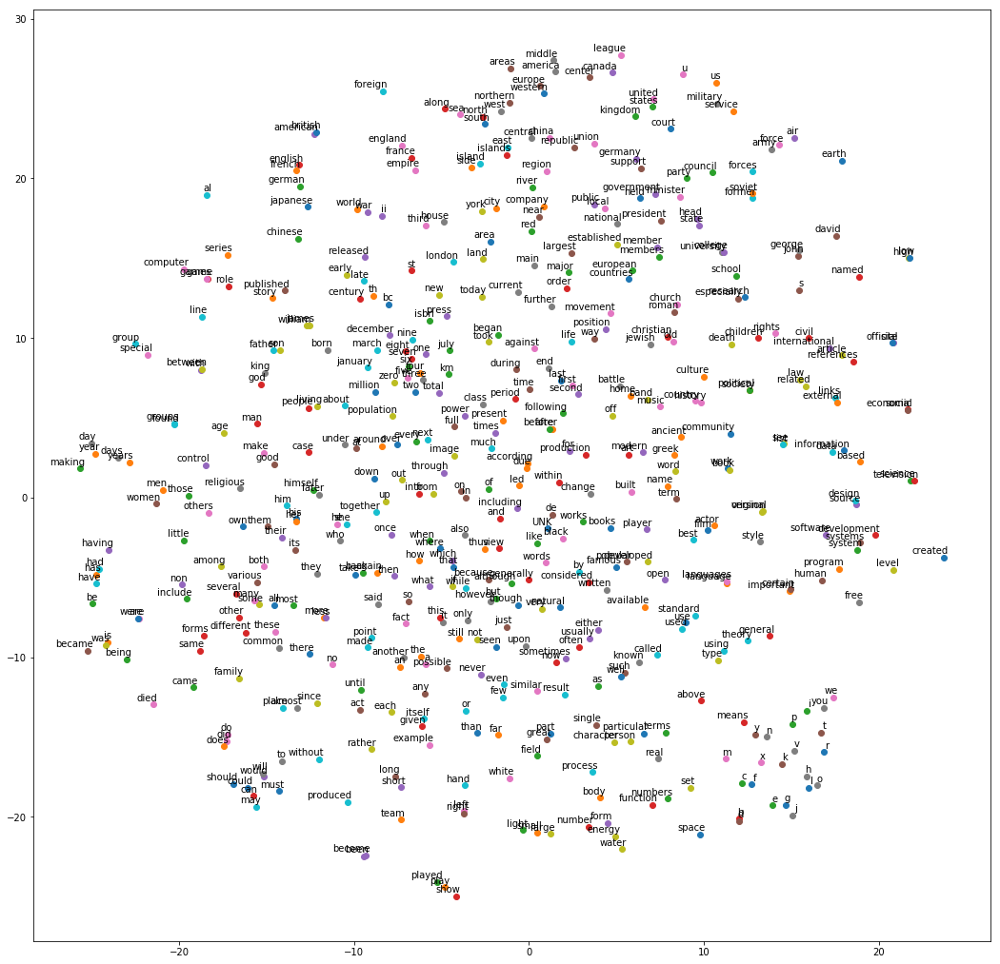

In [22]:
plt.show()
